<a href="https://colab.research.google.com/github/Atom-101/PokeGAN/blob/master/Colab/PokeGAN_Final_10to20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#@title
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse

from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass

!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}


E: Package 'python-software-properties' has no installation candidate
Selecting previously unselected package libfuse2:amd64.
(Reading database ... 22298 files and directories currently installed.)
Preparing to unpack .../libfuse2_2.9.7-1ubuntu1_amd64.deb ...
Unpacking libfuse2:amd64 (2.9.7-1ubuntu1) ...
Selecting previously unselected package fuse.
Preparing to unpack .../fuse_2.9.7-1ubuntu1_amd64.deb ...
Unpacking fuse (2.9.7-1ubuntu1) ...
Selecting previously unselected package google-drive-ocamlfuse.
Preparing to unpack .../google-drive-ocamlfuse_0.7.1-0ubuntu2~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.1-0ubuntu2~ubuntu18.04.1) ...
Setting up libfuse2:amd64 (2.9.7-1ubuntu1) ...
Processing triggers for libc-bin (2.27-3ubuntu1) ...
Setting up fuse (2.9.7-1ubuntu1) ...
Setting up google-drive-ocamlfuse (0.7.1-0ubuntu2~ubuntu18.04.1) ...
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleus

In [0]:
!mkdir -p drive
!google-drive-ocamlfuse drive

import os

In [0]:
import tensorflow as tf
tf.test.gpu_device_name()


'/device:GPU:0'

In [0]:
!apt-get -qq install -y libsm6 libxext6 && pip install -q -U opencv-python
import cv2

import os
from random import shuffle
import glob
import numpy as np
import h5py
import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [0]:
def show_images(images):

  image = images[0]
  image += 1
  image /= 2.0
  #image = np.ceil(image)
  
  plt.axis('off')
  plt.imshow(image)

#Load

In [0]:
dat = h5py.File('drive/Pokemon/Dataset/HDF5/Pokemon_Fire_Dataset.h5', 'r')
img_array = dat['Pokemon']

print(img_array.shape)

img_array = np.asarray(img_array, dtype = np.float16)

(37962, 96, 96, 3)


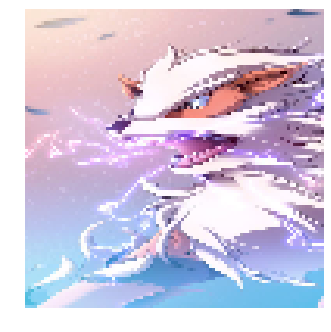

In [0]:
show_images(np.asarray(img_array[3119:3200], dtype = np.float32))
plt.show()

#Discriminator

In [0]:
def discriminator(x,isTrain,keep_prob):
  
    with tf.variable_scope("discriminator"):
        
        
        print(x.shape)
        #print([-1,tf.sqrt(tf.cast(x.shape[1],tf.float32)),tf.sqrt(tf.cast(x.shape[1],tf.float32)),1])
        #x = tf.reshape(x,[-1,(int)((int)(x.shape[1])**.5),(int)((int)(x.shape[1])**.5),1])
        
        x = tf.reshape(x,[-1,96,96,3])
        
        print(x.shape)
        
        logits = tf.layers.conv2d(x,128,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,256,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,512,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,1024,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.flatten(logits)
        
        logits = tf.layers.dense(logits, 1, name = 'discriminator_out', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        
        return logits


# Generator

In [0]:
def generator(z,isTrain,keep_prob):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    with tf.variable_scope("generator"):
        # TODO: implement architecture
        
        #print(z.shape)     
        
        img = tf.layers.dense(z, 6*6*1024, activation = tf.nn.leaky_relu, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        img = tf.layers.batch_normalization(img, training = isTrain)
        '''
        img = tf.layers.dense(img, 32*16*16, activation = tf.nn.relu, kernel_initializer=tf.random_normal_initializer(dtype=tf.float16) )
        img = tf.layers.batch_normalization(img, training = isTrain)
        '''
        img = tf.reshape(img,[-1,6,6,1024])
        
        img = tf.layers.conv2d_transpose(img, 512, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 256, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 128, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 3, 3, strides = 2, padding ='same', name = 'generator_out', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        img = tf.nn.tanh(img)
        
        print(img.shape)
        
        #img  = tf.layers.flatten(img)
        
        pass
        return img

In [0]:
def get_solvers(learning_rate=1e-4, beta1=0, beta2=0.9):

    D_solver = None
    G_solver = None
    
    D_solver = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1, beta2=beta2, name = 'D_solver_adam')
    G_solver = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1, beta2=beta2, name = 'G_solver_adam')
    
    pass
    return D_solver, G_solver

In [0]:
def wgan_loss(logits_real, logits_fake, real_data, fake_data,keep_prob,isTrain, batch_size = 32):

  lambd = 10
  G_loss = -tf.reduce_mean(logits_fake)
  D_loss = tf.reduce_mean(logits_fake) - tf.reduce_mean(logits_real) 
  
  #Implement gradient penalty
  epsilon = tf.random_uniform([batch_size,1,1,1], minval = 0, maxval = 1)
  #interpolates = tf.multiply((1-epsilon),real_data)+tf.multiply(epsilon,fake_data) #introduce randomness using epsilon
  interpolates = (1-epsilon)*real_data + epsilon* fake_data
  with tf.variable_scope('', reuse =True):
      grads = tf.gradients(discriminator(interpolates,isTrain,keep_prob), [interpolates])[0] #why is this zero used?
  
  slopes = tf.sqrt(tf.reduce_sum(tf.square(grads))) #L2-norm
  grad_penalty = tf.reduce_mean((slopes-1.)**2)#penalty is a scalar
  
  D_loss += lambd*grad_penalty
    
  pass
  return D_loss, G_loss

In [0]:
tf.reset_default_graph()

batch_size = 32
# our noise dimension
noise_dim = 100

# placeholders for images from the training dataset
x = tf.placeholder(tf.float32, [None, 96, 96, 3])
isTrain = tf.placeholder(tf.bool, shape=(), name = 'isTrain')
keep_prob = tf.placeholder_with_default(1.0, shape=())

z = tf.random_uniform([batch_size,noise_dim],minval = -1, maxval = 1)
# generated images

G_sample = generator(z,isTrain,keep_prob)

#Variable to store D_loss of each epoch
d_losses = []

#Run when D_loss and G_loss are called
with tf.variable_scope("") as scope:
    logits_real = discriminator(x,isTrain,keep_prob)
    fake_data = G_sample
    scope.reuse_variables()
    logits_fake = discriminator(fake_data,isTrain,keep_prob)

# Get the list of variables for the discriminator and generator
D_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES,'discriminator')
G_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES,'generator') 


D_solver,G_solver = get_solvers()
D_loss, G_loss = wgan_loss(logits_real, logits_fake, x, fake_data,keep_prob,isTrain, batch_size = batch_size)




#Update extra variables like batch_norm gamma and beta
D_extra_step = tf.get_collection(tf.GraphKeys.UPDATE_OPS,'discriminator')
G_extra_step = tf.get_collection(tf.GraphKeys.UPDATE_OPS,'generator')


with tf.control_dependencies(D_extra_step):
  D_train_step = D_solver.minimize(D_loss, var_list=D_vars)

with tf.control_dependencies(G_extra_step):
  G_train_step = G_solver.minimize(G_loss, var_list=G_vars)


(32, 96, 96, 3)
(?, 96, 96, 3)
(?, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)


In [0]:
def minibatches(inputs, batchsize):
    indices = np.arange(inputs.shape[0])
    np.random.shuffle(indices)
    x = []
    for i in range(batchsize):
        x.append(inputs[indices[i]])
    return np.asarray(x)

In [0]:
def run_a_gan(sess, G_train_step, G_loss, D_train_step, D_loss, G_extra_step, D_extra_step, saver,
                     show_every=20, print_every=1, batch_size=32, num_epoch=10):
   
   
    for epoch in range(10000,10000+num_epoch):
        prob = 1 - 0.4**epoch #ranges from 0.6 to 1
        #X = minibatches(img_array,batch_size)
        # every so often, show a sample result
        if (epoch % show_every == 0):
            samples = sess.run(G_sample, feed_dict={isTrain:False})
            fig = show_images(samples[:4])
            plt.show()
            #Save image samples generated while training
            
            print()
        
        _, G_loss_curr = sess.run([G_train_step, G_loss], feed_dict={isTrain:True,keep_prob:prob})
           
        #Train critic 5 times per epoch
        for _ in range(5):
          X = minibatches(img_array,batch_size)
          _, D_loss_curr = sess.run([D_train_step, D_loss], feed_dict={x: X, isTrain:True,keep_prob:prob})
          

        #Various displays
        if (epoch % print_every == 0):
            print('Epoch: {}, D: {:.4}, G: {:.4}'.format(epoch,D_loss_curr,G_loss_curr))
        
        #Save stuff every 400 epochs
        if (epoch % 400 == 399):    
          try: 
            saver.save(sess, 'drive/Pokemon_Fire/Final_Checkpoints/Model_'+str(epoch)+'.ckpt')
            np.save('drive/Pokemon_Fire/Final_Discriminator_loss.npy', np.asarray(d_losses))
          except:
            pass
          
          
        d_losses.append(D_loss_curr)
          
        if(epoch%500 == 0):  
          try:
            if(epoch>=1000):
                 with h5py.File('drive/Pokemon_Fire/Final_gen_while_training.h5','a') as file:
                     file.create_dataset('Samples'+str(epoch),samples.shape, np.float32)
                     file['Samples'+str(epoch)][...] = np.asarray(samples, dtype = np.float32)
          except:
            pass

    
    saver.save(sess, 'drive/Pokemon_Fire/Final_Checkpoint_Complete/model.ckpt')
    
    print('Final images')
    samples = sess.run(G_sample, feed_dict={isTrain:False})
    fig = show_images(samples1[:4])
    plt.show()

drive/Pokemon_Fire/Final_Checkpoints/Model_9999.ckpt
INFO:tensorflow:Restoring parameters from drive/Pokemon_Fire/Final_Checkpoints/Model_9999.ckpt
Restored!


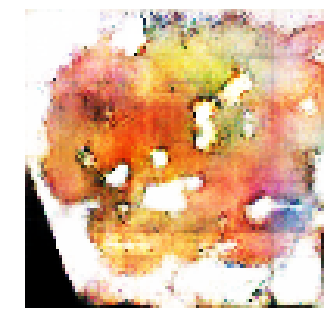


Epoch: 10000, D: -6.248, G: 2.452
Epoch: 10001, D: -6.474, G: 4.055
Epoch: 10002, D: -6.499, G: 3.669
Epoch: 10003, D: -6.67, G: 5.625
Epoch: 10004, D: -4.93, G: 5.34
Epoch: 10005, D: -5.77, G: 3.203
Epoch: 10006, D: -5.051, G: 4.592
Epoch: 10007, D: -6.102, G: 5.829
Epoch: 10008, D: -6.959, G: 4.059
Epoch: 10009, D: -6.522, G: 2.065
Epoch: 10010, D: -6.341, G: 2.872
Epoch: 10011, D: -5.57, G: 4.885
Epoch: 10012, D: -5.806, G: 3.601
Epoch: 10013, D: -6.706, G: 3.972
Epoch: 10014, D: -7.179, G: 4.202
Epoch: 10015, D: -6.826, G: 4.928
Epoch: 10016, D: -6.096, G: 2.77
Epoch: 10017, D: -4.823, G: 2.849
Epoch: 10018, D: -5.252, G: 2.349
Epoch: 10019, D: -5.664, G: 5.682


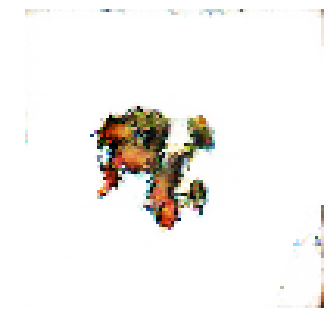


Epoch: 10020, D: -5.625, G: 4.366
Epoch: 10021, D: -5.666, G: 2.788
Epoch: 10022, D: -5.494, G: 3.623
Epoch: 10023, D: -5.691, G: 3.519
Epoch: 10024, D: -5.017, G: 4.078
Epoch: 10025, D: -5.204, G: 2.293
Epoch: 10026, D: -6.192, G: 4.398
Epoch: 10027, D: -7.314, G: 5.117
Epoch: 10028, D: -6.048, G: 3.173
Epoch: 10029, D: -6.833, G: 3.474
Epoch: 10030, D: -7.565, G: 0.914
Epoch: 10031, D: -6.596, G: 4.988
Epoch: 10032, D: -5.624, G: 3.018
Epoch: 10033, D: -6.958, G: 3.252
Epoch: 10034, D: -6.495, G: 3.468
Epoch: 10035, D: -6.86, G: 4.722
Epoch: 10036, D: -5.741, G: 4.15
Epoch: 10037, D: -6.044, G: 3.607
Epoch: 10038, D: -5.678, G: 3.385
Epoch: 10039, D: -5.764, G: 2.75


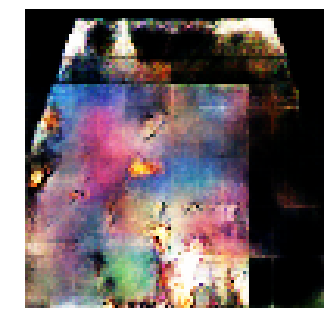


Epoch: 10040, D: -6.429, G: 3.585
Epoch: 10041, D: -5.585, G: 5.521
Epoch: 10042, D: -4.719, G: 6.368
Epoch: 10043, D: -6.173, G: 2.83
Epoch: 10044, D: -5.922, G: 4.791
Epoch: 10045, D: -6.225, G: 5.118
Epoch: 10046, D: -6.427, G: 3.531
Epoch: 10047, D: -6.001, G: 4.983
Epoch: 10048, D: -4.81, G: 3.681
Epoch: 10049, D: -4.444, G: 3.84
Epoch: 10050, D: -5.937, G: 1.864
Epoch: 10051, D: -5.898, G: 2.295
Epoch: 10052, D: -5.631, G: 2.634
Epoch: 10053, D: -6.607, G: 2.868
Epoch: 10054, D: -5.845, G: 5.687
Epoch: 10055, D: -5.489, G: 4.495
Epoch: 10056, D: -6.733, G: 3.381
Epoch: 10057, D: -6.332, G: 2.693
Epoch: 10058, D: -5.949, G: 1.746
Epoch: 10059, D: -6.407, G: 4.915


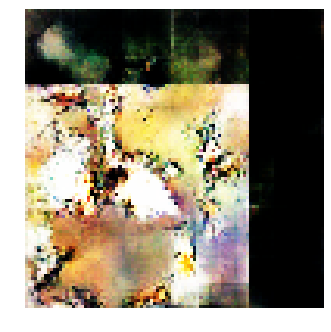


Epoch: 10060, D: -5.336, G: 5.828
Epoch: 10061, D: -6.072, G: 5.147
Epoch: 10062, D: -4.443, G: 4.639
Epoch: 10063, D: -6.299, G: 2.289
Epoch: 10064, D: -4.913, G: 2.416
Epoch: 10065, D: -5.453, G: 5.79
Epoch: 10066, D: -6.916, G: 2.871
Epoch: 10067, D: -6.195, G: 4.239
Epoch: 10068, D: -6.319, G: 5.397
Epoch: 10069, D: -6.689, G: 3.066
Epoch: 10070, D: -5.906, G: 6.753
Epoch: 10071, D: -5.678, G: 3.686
Epoch: 10072, D: -5.296, G: 3.526
Epoch: 10073, D: -6.811, G: 3.018
Epoch: 10074, D: -6.05, G: 6.031
Epoch: 10075, D: -6.151, G: 4.204
Epoch: 10076, D: -5.888, G: 3.541
Epoch: 10077, D: -5.62, G: 4.852
Epoch: 10078, D: -6.624, G: 5.172
Epoch: 10079, D: -6.316, G: 3.914


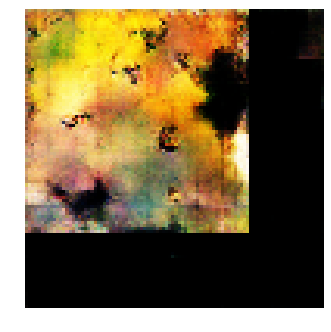


Epoch: 10080, D: -7.221, G: 1.949
Epoch: 10081, D: -6.253, G: 3.089
Epoch: 10082, D: -5.579, G: 3.511
Epoch: 10083, D: -4.612, G: 4.851
Epoch: 10084, D: -5.698, G: 6.745
Epoch: 10085, D: -6.857, G: 3.493
Epoch: 10086, D: -7.515, G: 4.351
Epoch: 10087, D: -5.875, G: 5.079
Epoch: 10088, D: -6.995, G: 4.151
Epoch: 10089, D: -6.421, G: 5.518
Epoch: 10090, D: -6.197, G: 2.72
Epoch: 10091, D: -6.361, G: 2.52
Epoch: 10092, D: -5.742, G: 2.42
Epoch: 10093, D: -6.199, G: 5.498
Epoch: 10094, D: -6.673, G: 4.96
Epoch: 10095, D: -6.439, G: 5.697
Epoch: 10096, D: -6.187, G: 2.418
Epoch: 10097, D: -5.4, G: 4.886
Epoch: 10098, D: -5.795, G: 5.024
Epoch: 10099, D: -6.139, G: 6.783


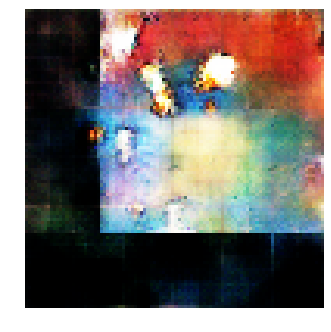


Epoch: 10100, D: -5.444, G: 3.985
Epoch: 10101, D: -4.498, G: 4.288
Epoch: 10102, D: -6.108, G: 2.705
Epoch: 10103, D: -5.683, G: 3.473
Epoch: 10104, D: -3.846, G: 3.624
Epoch: 10105, D: -5.179, G: 5.461
Epoch: 10106, D: -5.631, G: 5.583
Epoch: 10107, D: -5.575, G: 3.114
Epoch: 10108, D: -5.29, G: 4.572
Epoch: 10109, D: -6.47, G: 2.029
Epoch: 10110, D: -6.036, G: 3.045
Epoch: 10111, D: -5.748, G: 1.796
Epoch: 10112, D: -6.785, G: -0.2309
Epoch: 10113, D: -7.565, G: 4.141
Epoch: 10114, D: -6.294, G: 3.901
Epoch: 10115, D: -5.53, G: 2.091
Epoch: 10116, D: -5.87, G: 2.336
Epoch: 10117, D: -5.442, G: 2.462
Epoch: 10118, D: -7.398, G: 3.519
Epoch: 10119, D: -5.128, G: 3.151


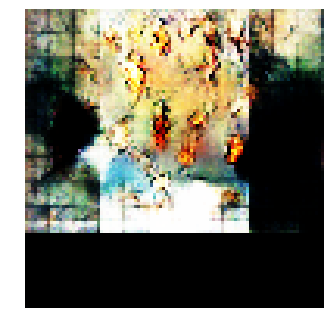


Epoch: 10120, D: -6.919, G: 4.811
Epoch: 10121, D: -7.828, G: 1.746
Epoch: 10122, D: -5.536, G: 1.688
Epoch: 10123, D: -6.098, G: 5.577
Epoch: 10124, D: -5.786, G: 3.404
Epoch: 10125, D: -6.933, G: 3.82
Epoch: 10126, D: -6.354, G: 3.554
Epoch: 10127, D: -5.879, G: 6.728
Epoch: 10128, D: -5.704, G: 6.177
Epoch: 10129, D: -5.524, G: 3.674
Epoch: 10130, D: -5.662, G: 7.334
Epoch: 10131, D: -6.931, G: 6.98
Epoch: 10132, D: -6.006, G: 2.98
Epoch: 10133, D: -5.6, G: 3.512
Epoch: 10134, D: -6.065, G: 2.679
Epoch: 10135, D: -5.898, G: 3.833
Epoch: 10136, D: -6.376, G: 2.773
Epoch: 10137, D: -7.129, G: 5.464
Epoch: 10138, D: -5.555, G: 3.533
Epoch: 10139, D: -7.194, G: 3.445


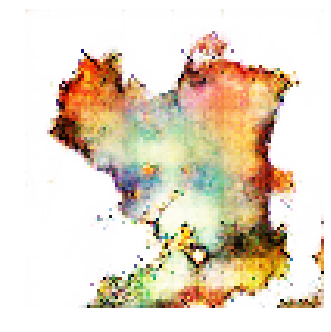


Epoch: 10140, D: -6.117, G: 4.388
Epoch: 10141, D: -5.175, G: 2.371
Epoch: 10142, D: -7.041, G: 3.331
Epoch: 10143, D: -6.832, G: 2.719
Epoch: 10144, D: -4.73, G: 3.379
Epoch: 10145, D: -4.972, G: 2.305
Epoch: 10146, D: -6.338, G: 3.639
Epoch: 10147, D: -6.374, G: 4.576
Epoch: 10148, D: -6.069, G: 3.899
Epoch: 10149, D: -6.262, G: 4.061
Epoch: 10150, D: -7.021, G: 3.041
Epoch: 10151, D: -5.405, G: 2.291
Epoch: 10152, D: -3.44, G: 4.041
Epoch: 10153, D: -6.712, G: 4.525
Epoch: 10154, D: -4.106, G: 5.109
Epoch: 10155, D: -7.073, G: 3.753
Epoch: 10156, D: -6.666, G: 3.845
Epoch: 10157, D: -5.488, G: 3.013
Epoch: 10158, D: -6.621, G: 5.364
Epoch: 10159, D: -5.43, G: 2.561


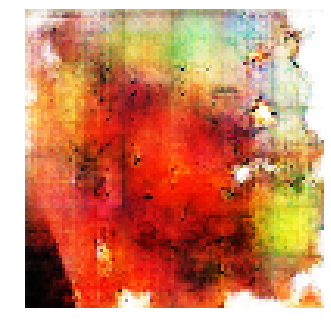


Epoch: 10160, D: -6.377, G: 4.122
Epoch: 10161, D: -5.845, G: 2.777
Epoch: 10162, D: -5.689, G: 4.155
Epoch: 10163, D: -5.553, G: 5.843
Epoch: 10164, D: -6.057, G: 5.918
Epoch: 10165, D: -6.812, G: 6.5
Epoch: 10166, D: -6.277, G: 4.929
Epoch: 10167, D: -6.078, G: 3.3
Epoch: 10168, D: -6.125, G: 5.871
Epoch: 10169, D: -5.718, G: 3.879
Epoch: 10170, D: -6.419, G: 4.139
Epoch: 10171, D: -5.48, G: 5.142
Epoch: 10172, D: -6.112, G: 4.758
Epoch: 10173, D: -5.547, G: 5.453
Epoch: 10174, D: -6.534, G: 4.134
Epoch: 10175, D: -5.349, G: 5.244
Epoch: 10176, D: -7.813, G: 3.97
Epoch: 10177, D: -5.338, G: 3.04
Epoch: 10178, D: -5.966, G: 4.159
Epoch: 10179, D: -7.339, G: 2.582


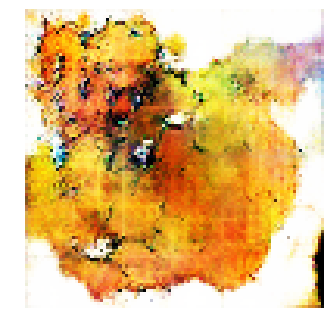


Epoch: 10180, D: -6.675, G: 4.942
Epoch: 10181, D: -6.939, G: 2.917
Epoch: 10182, D: -6.617, G: 3.818
Epoch: 10183, D: -6.027, G: 1.989
Epoch: 10184, D: -7.301, G: 8.541
Epoch: 10185, D: -5.182, G: 4.174
Epoch: 10186, D: -6.751, G: 5.745
Epoch: 10187, D: -5.157, G: 6.441
Epoch: 10188, D: -6.098, G: 3.81
Epoch: 10189, D: -6.646, G: 1.724
Epoch: 10190, D: -6.034, G: 3.595
Epoch: 10191, D: -6.432, G: 6.614
Epoch: 10192, D: -5.424, G: 4.215
Epoch: 10193, D: -7.957, G: 2.735
Epoch: 10194, D: -5.043, G: 3.649
Epoch: 10195, D: -6.511, G: 4.549
Epoch: 10196, D: -6.357, G: 2.095
Epoch: 10197, D: -5.772, G: 5.371
Epoch: 10198, D: -6.444, G: 3.486
Epoch: 10199, D: -5.814, G: 3.556


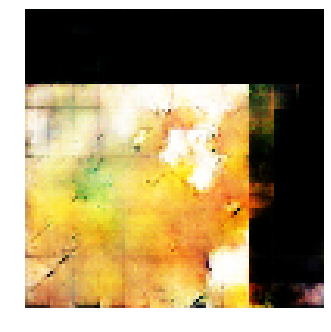


Epoch: 10200, D: -6.295, G: 5.582
Epoch: 10201, D: -5.581, G: 4.222
Epoch: 10202, D: -4.268, G: 3.091
Epoch: 10203, D: -6.059, G: 3.527
Epoch: 10204, D: -5.593, G: 3.744
Epoch: 10205, D: -5.084, G: 4.091
Epoch: 10206, D: -6.636, G: 3.848
Epoch: 10207, D: -6.56, G: 5.465
Epoch: 10208, D: -5.445, G: 5.321
Epoch: 10209, D: -7.467, G: 4.393
Epoch: 10210, D: -6.588, G: 3.871
Epoch: 10211, D: -5.213, G: 5.176
Epoch: 10212, D: -7.053, G: 5.565
Epoch: 10213, D: -6.107, G: 3.732
Epoch: 10214, D: -6.13, G: 5.292
Epoch: 10215, D: -7.655, G: 4.764
Epoch: 10216, D: -5.541, G: 3.801
Epoch: 10217, D: -6.035, G: 5.187
Epoch: 10218, D: -6.696, G: 4.774
Epoch: 10219, D: -4.644, G: 5.996


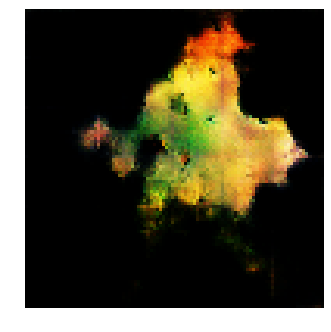


Epoch: 10220, D: -5.031, G: 4.271
Epoch: 10221, D: -6.319, G: 4.141
Epoch: 10222, D: -7.12, G: 1.75
Epoch: 10223, D: -7.397, G: 5.056
Epoch: 10224, D: -6.363, G: 0.5062
Epoch: 10225, D: -5.627, G: 5.781
Epoch: 10226, D: -5.823, G: 2.405
Epoch: 10227, D: -6.258, G: 1.293
Epoch: 10228, D: -4.917, G: 3.779
Epoch: 10229, D: -5.95, G: 4.349
Epoch: 10230, D: -6.481, G: 3.546
Epoch: 10231, D: -4.994, G: 5.616
Epoch: 10232, D: -5.837, G: 4.263
Epoch: 10233, D: -5.754, G: 5.508
Epoch: 10234, D: -5.501, G: 5.022
Epoch: 10235, D: -5.094, G: 3.494
Epoch: 10236, D: -5.38, G: 3.446
Epoch: 10237, D: -6.347, G: 5.705
Epoch: 10238, D: -7.553, G: 6.232
Epoch: 10239, D: -7.232, G: 7.386


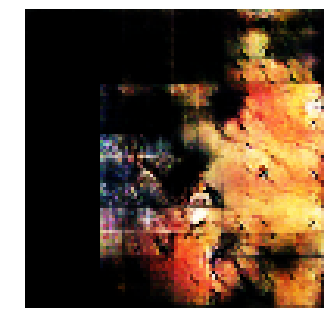


Epoch: 10240, D: -4.909, G: 2.921
Epoch: 10241, D: -5.639, G: 3.493
Epoch: 10242, D: -6.182, G: 4.52
Epoch: 10243, D: -7.266, G: 4.223
Epoch: 10244, D: -6.13, G: 3.527
Epoch: 10245, D: -6.431, G: 3.913
Epoch: 10246, D: -4.744, G: 3.934
Epoch: 10247, D: -7.003, G: 5.064
Epoch: 10248, D: -5.626, G: 4.809
Epoch: 10249, D: -6.241, G: 4.871
Epoch: 10250, D: -6.413, G: 1.407
Epoch: 10251, D: -6.424, G: 3.586
Epoch: 10252, D: -6.448, G: 4.93
Epoch: 10253, D: -5.185, G: 5.548
Epoch: 10254, D: -6.513, G: 3.02
Epoch: 10255, D: -6.764, G: 2.427
Epoch: 10256, D: -5.175, G: 4.97
Epoch: 10257, D: -5.326, G: 5.833
Epoch: 10258, D: -5.707, G: 3.795
Epoch: 10259, D: -5.038, G: 3.95


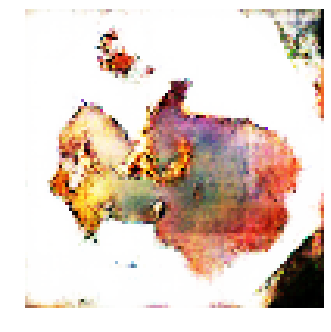


Epoch: 10260, D: -6.34, G: 4.898
Epoch: 10261, D: -5.973, G: 2.386
Epoch: 10262, D: -6.613, G: 3.628
Epoch: 10263, D: -6.626, G: 3.68
Epoch: 10264, D: -5.491, G: 2.983
Epoch: 10265, D: -6.255, G: 4.025
Epoch: 10266, D: -6.073, G: 2.496
Epoch: 10267, D: -6.404, G: 2.389
Epoch: 10268, D: -5.612, G: 3.973
Epoch: 10269, D: -4.835, G: 1.404
Epoch: 10270, D: -6.488, G: 4.5
Epoch: 10271, D: -6.635, G: 3.093
Epoch: 10272, D: -5.734, G: 0.6433
Epoch: 10273, D: -6.715, G: 3.945
Epoch: 10274, D: -6.419, G: 3.266
Epoch: 10275, D: -6.579, G: 5.96
Epoch: 10276, D: -4.639, G: 3.022
Epoch: 10277, D: -6.164, G: 3.179
Epoch: 10278, D: -5.947, G: 6.551
Epoch: 10279, D: -7.755, G: 4.748


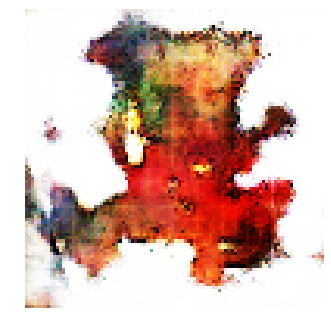


Epoch: 10280, D: -6.339, G: 5.154
Epoch: 10281, D: -5.002, G: 3.83
Epoch: 10282, D: -6.29, G: 4.818
Epoch: 10283, D: -6.175, G: 5.286
Epoch: 10284, D: -6.653, G: 8.587
Epoch: 10285, D: -5.562, G: 4.8
Epoch: 10286, D: -5.564, G: 5.136
Epoch: 10287, D: -5.967, G: 4.82
Epoch: 10288, D: -6.729, G: 4.166
Epoch: 10289, D: -6.311, G: 4.106
Epoch: 10290, D: -6.158, G: 5.731
Epoch: 10291, D: -5.952, G: 5.227
Epoch: 10292, D: -5.766, G: 4.026
Epoch: 10293, D: -6.22, G: 3.119
Epoch: 10294, D: -5.785, G: 6.638
Epoch: 10295, D: -5.899, G: 5.286
Epoch: 10296, D: -6.693, G: 5.57
Epoch: 10297, D: -6.208, G: 7.018
Epoch: 10298, D: -6.277, G: 7.624
Epoch: 10299, D: -6.136, G: 4.718


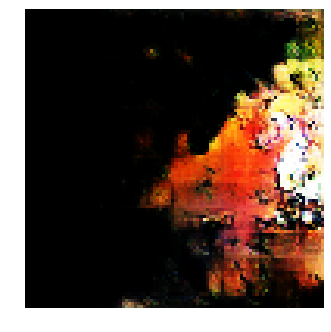


Epoch: 10300, D: -7.579, G: 6.324
Epoch: 10301, D: -5.874, G: 2.007
Epoch: 10302, D: -7.459, G: 4.787
Epoch: 10303, D: -5.542, G: 2.21
Epoch: 10304, D: -5.275, G: 3.852
Epoch: 10305, D: -6.357, G: 5.517
Epoch: 10306, D: -7.035, G: 1.295
Epoch: 10307, D: -7.359, G: 6.146
Epoch: 10308, D: -7.05, G: 2.224
Epoch: 10309, D: -6.462, G: 5.143
Epoch: 10310, D: -5.016, G: 4.361
Epoch: 10311, D: -6.006, G: 5.227
Epoch: 10312, D: -5.188, G: 6.43
Epoch: 10313, D: -6.654, G: 3.896
Epoch: 10314, D: -6.931, G: 5.408
Epoch: 10315, D: -7.903, G: 4.722
Epoch: 10316, D: -5.846, G: 3.023
Epoch: 10317, D: -6.21, G: 4.617
Epoch: 10318, D: -6.178, G: 5.844
Epoch: 10319, D: -5.576, G: 2.94


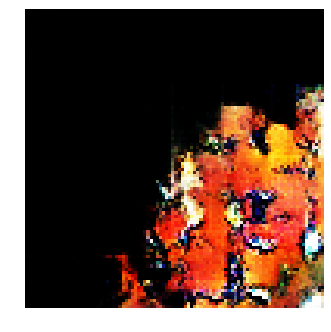


Epoch: 10320, D: -6.394, G: 5.063
Epoch: 10321, D: -5.716, G: 5.014
Epoch: 10322, D: -6.163, G: 2.881
Epoch: 10323, D: -6.656, G: 1.616
Epoch: 10324, D: -5.605, G: 3.355
Epoch: 10325, D: -6.128, G: 3.215
Epoch: 10326, D: -5.887, G: 2.688
Epoch: 10327, D: -6.136, G: 3.658
Epoch: 10328, D: -5.801, G: 3.652
Epoch: 10329, D: -6.493, G: 2.497
Epoch: 10330, D: -5.793, G: 2.545
Epoch: 10331, D: -6.365, G: 5.209
Epoch: 10332, D: -7.347, G: 4.504
Epoch: 10333, D: -4.834, G: 3.282
Epoch: 10334, D: -5.153, G: 5.007
Epoch: 10335, D: -6.101, G: 3.205
Epoch: 10336, D: -6.263, G: 5.126
Epoch: 10337, D: -6.142, G: 4.676
Epoch: 10338, D: -6.568, G: 3.879
Epoch: 10339, D: -4.972, G: 3.365


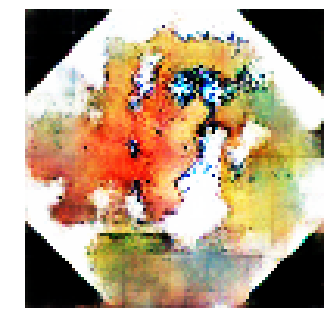


Epoch: 10340, D: -7.974, G: 5.518
Epoch: 10341, D: -6.405, G: 2.735
Epoch: 10342, D: -6.691, G: 1.12
Epoch: 10343, D: -5.126, G: 0.03131
Epoch: 10344, D: -6.22, G: 3.129
Epoch: 10345, D: -6.999, G: 3.337
Epoch: 10346, D: -5.696, G: 4.193
Epoch: 10347, D: -6.767, G: 6.506
Epoch: 10348, D: -7.866, G: 7.096
Epoch: 10349, D: -6.354, G: 4.735
Epoch: 10350, D: -5.622, G: 4.709
Epoch: 10351, D: -6.2, G: 3.606
Epoch: 10352, D: -5.795, G: 5.887
Epoch: 10353, D: -5.23, G: 3.047
Epoch: 10354, D: -6.188, G: 3.839
Epoch: 10355, D: -6.238, G: 4.081
Epoch: 10356, D: -5.65, G: 5.828
Epoch: 10357, D: -5.482, G: 9.75
Epoch: 10358, D: -5.673, G: 3.764
Epoch: 10359, D: -6.314, G: 4.74


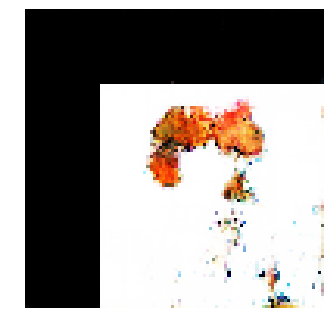


Epoch: 10360, D: -5.647, G: 4.642
Epoch: 10361, D: -5.106, G: 2.3
Epoch: 10362, D: -5.921, G: 1.891
Epoch: 10363, D: -6.17, G: 4.335
Epoch: 10364, D: -6.861, G: 6.481
Epoch: 10365, D: -5.425, G: 6.481
Epoch: 10366, D: -6.907, G: 5.532
Epoch: 10367, D: -5.582, G: 4.278
Epoch: 10368, D: -5.416, G: 3.931
Epoch: 10369, D: -6.01, G: 2.96
Epoch: 10370, D: -4.684, G: 1.204
Epoch: 10371, D: -6.465, G: 4.389
Epoch: 10372, D: -5.583, G: 4.299
Epoch: 10373, D: -5.852, G: 4.313
Epoch: 10374, D: -6.261, G: 5.118
Epoch: 10375, D: -6.876, G: 2.869
Epoch: 10376, D: -6.51, G: 1.555
Epoch: 10377, D: -5.038, G: 3.62
Epoch: 10378, D: -7.464, G: 3.987
Epoch: 10379, D: -6.168, G: 2.701


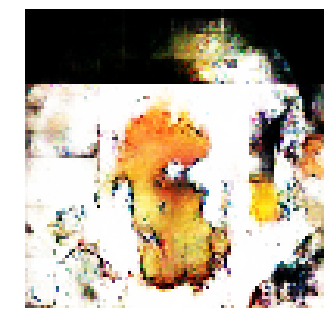


Epoch: 10380, D: -5.878, G: 5.146
Epoch: 10381, D: -3.887, G: 3.579
Epoch: 10382, D: -5.56, G: 4.802
Epoch: 10383, D: -5.014, G: 3.803
Epoch: 10384, D: -7.248, G: 3.855
Epoch: 10385, D: -6.027, G: 2.806
Epoch: 10386, D: -5.888, G: 3.768
Epoch: 10387, D: -6.449, G: 5.906
Epoch: 10388, D: -6.283, G: 2.303
Epoch: 10389, D: -6.067, G: 7.515
Epoch: 10390, D: -4.576, G: 2.726
Epoch: 10391, D: -6.291, G: 5.282
Epoch: 10392, D: -5.861, G: 3.953
Epoch: 10393, D: -5.869, G: 3.135
Epoch: 10394, D: -5.433, G: 2.791
Epoch: 10395, D: -5.916, G: 3.015
Epoch: 10396, D: -6.295, G: 3.183
Epoch: 10397, D: -4.763, G: 1.681
Epoch: 10398, D: -5.192, G: 2.208
Epoch: 10399, D: -5.926, G: 6.441


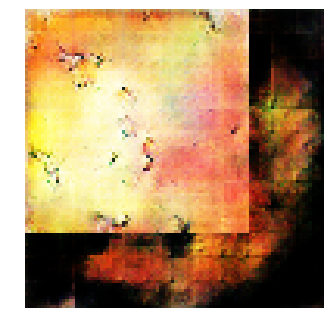


Epoch: 10400, D: -6.639, G: 2.986
Epoch: 10401, D: -5.271, G: 4.902
Epoch: 10402, D: -6.985, G: 2.352
Epoch: 10403, D: -5.442, G: 1.716
Epoch: 10404, D: -6.717, G: 3.68
Epoch: 10405, D: -6.676, G: 3.12
Epoch: 10406, D: -5.15, G: 4.639
Epoch: 10407, D: -6.152, G: 2.141
Epoch: 10408, D: -5.815, G: 3.789
Epoch: 10409, D: -5.618, G: 3.147
Epoch: 10410, D: -5.117, G: 2.294
Epoch: 10411, D: -5.616, G: 5.987
Epoch: 10412, D: -5.752, G: 3.999
Epoch: 10413, D: -7.03, G: 4.762
Epoch: 10414, D: -6.355, G: 5.441
Epoch: 10415, D: -5.639, G: 4.804
Epoch: 10416, D: -6.8, G: 4.73
Epoch: 10417, D: -7.268, G: 2.086
Epoch: 10418, D: -5.199, G: 3.388
Epoch: 10419, D: -6.511, G: 2.566


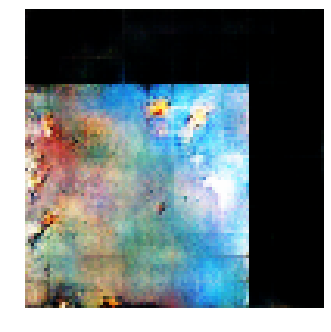


Epoch: 10420, D: -5.858, G: 5.822
Epoch: 10421, D: -6.588, G: 3.803
Epoch: 10422, D: -6.351, G: 3.795
Epoch: 10423, D: -5.716, G: 5.16
Epoch: 10424, D: -3.54, G: 3.808
Epoch: 10425, D: -6.768, G: 1.988
Epoch: 10426, D: -5.025, G: 8.014
Epoch: 10427, D: -5.754, G: 2.277
Epoch: 10428, D: -6.728, G: 4.033
Epoch: 10429, D: -5.401, G: 4.145
Epoch: 10430, D: -6.226, G: 4.268
Epoch: 10431, D: -6.017, G: 3.915
Epoch: 10432, D: -5.736, G: 5.859
Epoch: 10433, D: -6.27, G: 3.115
Epoch: 10434, D: -5.811, G: 5.177
Epoch: 10435, D: -5.45, G: 3.339
Epoch: 10436, D: -5.852, G: 3.332
Epoch: 10437, D: -5.403, G: 4.796
Epoch: 10438, D: -5.641, G: 3.247
Epoch: 10439, D: -7.457, G: 4.8


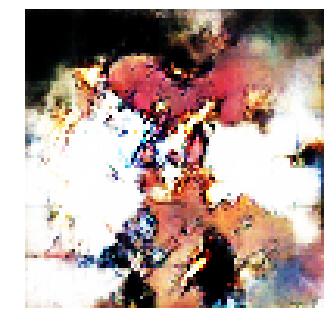


Epoch: 10440, D: -5.725, G: 6.179
Epoch: 10441, D: -6.276, G: 3.072
Epoch: 10442, D: -5.598, G: 3.792
Epoch: 10443, D: -6.749, G: 5.09
Epoch: 10444, D: -6.402, G: 2.902
Epoch: 10445, D: -6.073, G: 4.219
Epoch: 10446, D: -6.297, G: 2.789
Epoch: 10447, D: -5.325, G: 3.589
Epoch: 10448, D: -5.657, G: 3.716
Epoch: 10449, D: -6.698, G: 5.305
Epoch: 10450, D: -5.355, G: 5.572
Epoch: 10451, D: -6.255, G: 3.385
Epoch: 10452, D: -6.028, G: 1.734
Epoch: 10453, D: -6.429, G: 4.925
Epoch: 10454, D: -6.441, G: 4.843
Epoch: 10455, D: -5.447, G: 3.972
Epoch: 10456, D: -5.449, G: 3.413
Epoch: 10457, D: -5.112, G: 4.662
Epoch: 10458, D: -7.017, G: 3.413
Epoch: 10459, D: -7.403, G: 4.759


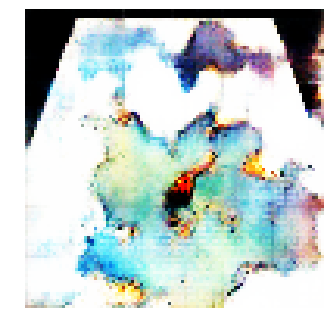


Epoch: 10460, D: -6.201, G: 4.073
Epoch: 10461, D: -6.169, G: 5.945
Epoch: 10462, D: -5.646, G: 1.811
Epoch: 10463, D: -5.832, G: 4.118
Epoch: 10464, D: -9.484, G: 4.571
Epoch: 10465, D: -4.764, G: 2.275
Epoch: 10466, D: -6.055, G: 3.784
Epoch: 10467, D: -5.85, G: 3.911
Epoch: 10468, D: -6.178, G: 4.508
Epoch: 10469, D: -6.026, G: 2.914
Epoch: 10470, D: -6.745, G: 4.139
Epoch: 10471, D: -6.276, G: 3.225
Epoch: 10472, D: -7.053, G: 3.774
Epoch: 10473, D: -6.326, G: 5.62
Epoch: 10474, D: -5.903, G: 4.083
Epoch: 10475, D: -5.746, G: 1.827
Epoch: 10476, D: -5.664, G: 3.566
Epoch: 10477, D: -5.179, G: 5.195
Epoch: 10478, D: -7.087, G: 2.871
Epoch: 10479, D: -7.486, G: 3.153


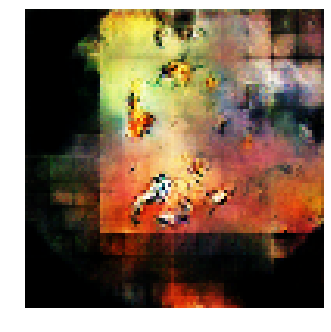


Epoch: 10480, D: -5.709, G: 2.62
Epoch: 10481, D: -5.606, G: 3.932
Epoch: 10482, D: -6.486, G: 7.026
Epoch: 10483, D: -6.747, G: 3.617
Epoch: 10484, D: -7.414, G: 2.448
Epoch: 10485, D: -4.743, G: 2.509
Epoch: 10486, D: -5.46, G: 3.935
Epoch: 10487, D: -6.47, G: 5.77
Epoch: 10488, D: -7.497, G: 1.486
Epoch: 10489, D: -5.157, G: 1.018
Epoch: 10490, D: -6.429, G: 4.414
Epoch: 10491, D: -5.34, G: 3.031
Epoch: 10492, D: -4.97, G: 5.104
Epoch: 10493, D: -5.17, G: 2.862
Epoch: 10494, D: -6.45, G: 5.611
Epoch: 10495, D: -6.033, G: 5.724
Epoch: 10496, D: -6.308, G: 5.151
Epoch: 10497, D: -6.182, G: 3.017
Epoch: 10498, D: -6.933, G: 3.535
Epoch: 10499, D: -6.244, G: 5.42


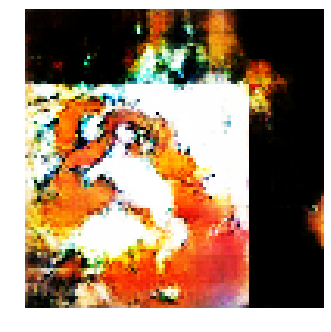


Epoch: 10500, D: -5.746, G: 3.412
Epoch: 10501, D: -7.348, G: 2.864
Epoch: 10502, D: -5.616, G: 2.382
Epoch: 10503, D: -6.02, G: 4.792
Epoch: 10504, D: -7.27, G: 6.646
Epoch: 10505, D: -6.385, G: 2.004
Epoch: 10506, D: -6.305, G: 4.487
Epoch: 10507, D: -6.752, G: 4.674
Epoch: 10508, D: -5.52, G: 2.017
Epoch: 10509, D: -5.839, G: 4.072
Epoch: 10510, D: -6.897, G: 1.362
Epoch: 10511, D: -6.767, G: -0.1683
Epoch: 10512, D: -5.988, G: 3.331
Epoch: 10513, D: -6.402, G: 2.921
Epoch: 10514, D: -6.181, G: 5.36
Epoch: 10515, D: -6.418, G: 2.481
Epoch: 10516, D: -6.756, G: 5.454
Epoch: 10517, D: -5.648, G: 3.71
Epoch: 10518, D: -5.907, G: 3.18
Epoch: 10519, D: -7.016, G: 5.328


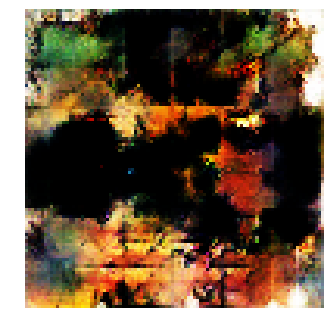


Epoch: 10520, D: -5.941, G: 4.898
Epoch: 10521, D: -6.564, G: 3.416
Epoch: 10522, D: -6.178, G: 4.444
Epoch: 10523, D: -7.277, G: 5.972
Epoch: 10524, D: -5.642, G: 3.427
Epoch: 10525, D: -4.959, G: 3.039
Epoch: 10526, D: -6.475, G: 3.026
Epoch: 10527, D: -5.556, G: 3.563
Epoch: 10528, D: -6.485, G: 3.345
Epoch: 10529, D: -6.541, G: 3.032
Epoch: 10530, D: -6.45, G: 4.796
Epoch: 10531, D: -6.438, G: 3.419
Epoch: 10532, D: -6.554, G: 2.586
Epoch: 10533, D: -7.21, G: 6.017
Epoch: 10534, D: -6.23, G: 6.001
Epoch: 10535, D: -6.273, G: 4.992
Epoch: 10536, D: -6.263, G: 2.418
Epoch: 10537, D: -5.524, G: 3.753
Epoch: 10538, D: -5.144, G: 4.895
Epoch: 10539, D: -5.796, G: 5.503


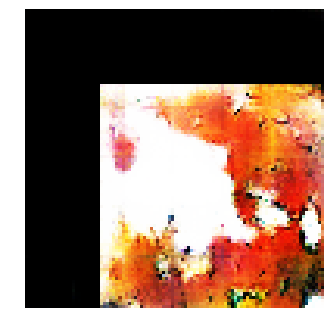


Epoch: 10540, D: -6.108, G: 2.672
Epoch: 10541, D: -6.582, G: 4.584
Epoch: 10542, D: -6.228, G: -0.2789
Epoch: 10543, D: -5.083, G: 2.211
Epoch: 10544, D: -6.496, G: 4.01
Epoch: 10545, D: -6.081, G: 3.02
Epoch: 10546, D: -5.74, G: 3.193
Epoch: 10547, D: -6.134, G: 4.455
Epoch: 10548, D: -6.014, G: 3.06
Epoch: 10549, D: -5.57, G: 0.9646
Epoch: 10550, D: -6.498, G: 5.216
Epoch: 10551, D: -7.323, G: 2.231
Epoch: 10552, D: -5.411, G: 4.164
Epoch: 10553, D: -6.717, G: 5.712
Epoch: 10554, D: -7.042, G: 3.547
Epoch: 10555, D: -6.484, G: 5.268
Epoch: 10556, D: -7.234, G: 2.178
Epoch: 10557, D: -5.918, G: 2.55
Epoch: 10558, D: -5.725, G: 4.882
Epoch: 10559, D: -5.667, G: 3.948


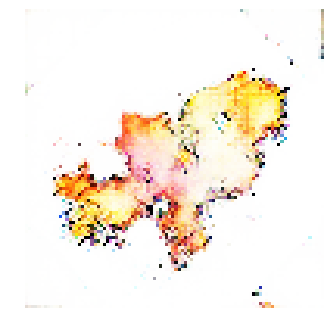


Epoch: 10560, D: -5.728, G: 4.47
Epoch: 10561, D: -6.266, G: 4.068
Epoch: 10562, D: -5.846, G: 7.517
Epoch: 10563, D: -5.323, G: 2.838
Epoch: 10564, D: -5.484, G: 3.698
Epoch: 10565, D: -5.771, G: 4.513
Epoch: 10566, D: -5.829, G: 4.382
Epoch: 10567, D: -6.239, G: 3.797
Epoch: 10568, D: -5.214, G: 2.216
Epoch: 10569, D: -5.444, G: 2.617
Epoch: 10570, D: -5.971, G: 4.692
Epoch: 10571, D: -6.526, G: 3.362
Epoch: 10572, D: -5.898, G: 3.738
Epoch: 10573, D: -6.191, G: 2.333
Epoch: 10574, D: -6.163, G: 4.592
Epoch: 10575, D: -6.09, G: 3.222
Epoch: 10576, D: -5.396, G: 3.84
Epoch: 10577, D: -5.084, G: 3.008
Epoch: 10578, D: -6.339, G: 5.641
Epoch: 10579, D: -5.137, G: 4.989


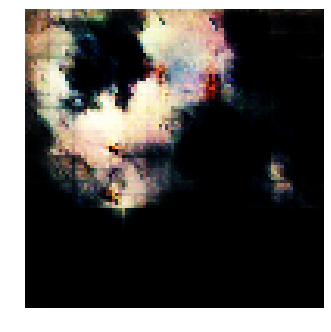


Epoch: 10580, D: -5.892, G: 4.72
Epoch: 10581, D: -6.211, G: 3.379
Epoch: 10582, D: -6.632, G: 4.479
Epoch: 10583, D: -5.375, G: 2.746
Epoch: 10584, D: -6.475, G: 2.581
Epoch: 10585, D: -5.282, G: 3.591
Epoch: 10586, D: -5.404, G: 3.903
Epoch: 10587, D: -6.978, G: 7.727
Epoch: 10588, D: -6.001, G: 3.132
Epoch: 10589, D: -5.301, G: 5.29
Epoch: 10590, D: -7.105, G: 5.318
Epoch: 10591, D: -7.412, G: 4.372
Epoch: 10592, D: -6.852, G: 3.424
Epoch: 10593, D: -5.731, G: 3.942
Epoch: 10594, D: -5.962, G: 3.514
Epoch: 10595, D: -5.067, G: 4.644
Epoch: 10596, D: -5.823, G: 2.461
Epoch: 10597, D: -6.459, G: 5.761
Epoch: 10598, D: -6.199, G: 1.96
Epoch: 10599, D: -5.611, G: 4.495


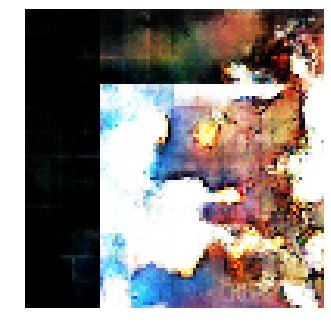


Epoch: 10600, D: -5.919, G: 3.016
Epoch: 10601, D: -7.404, G: 2.836
Epoch: 10602, D: -5.829, G: 4.989
Epoch: 10603, D: -5.384, G: 3.67
Epoch: 10604, D: -6.746, G: 4.214
Epoch: 10605, D: -5.72, G: 3.126
Epoch: 10606, D: -7.076, G: 3.108
Epoch: 10607, D: -7.557, G: 3.22
Epoch: 10608, D: -5.81, G: 4.121
Epoch: 10609, D: -5.354, G: 4.327
Epoch: 10610, D: -6.396, G: 4.795
Epoch: 10611, D: -5.966, G: 3.114
Epoch: 10612, D: -5.27, G: 4.012
Epoch: 10613, D: -7.166, G: 5.121
Epoch: 10614, D: -6.925, G: 1.726
Epoch: 10615, D: -5.385, G: 4.818
Epoch: 10616, D: -7.239, G: 4.73
Epoch: 10617, D: -4.342, G: 2.463
Epoch: 10618, D: -6.547, G: 3.442
Epoch: 10619, D: -6.978, G: 6.066


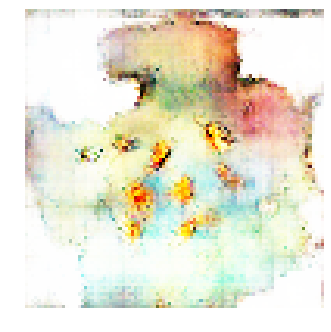


Epoch: 10620, D: -7.23, G: 2.467
Epoch: 10621, D: -6.057, G: 3.979
Epoch: 10622, D: -5.16, G: 7.253
Epoch: 10623, D: -6.989, G: 6.365
Epoch: 10624, D: -6.99, G: 1.436
Epoch: 10625, D: -5.287, G: 5.778
Epoch: 10626, D: -5.756, G: 3.54
Epoch: 10627, D: -6.672, G: 5.113
Epoch: 10628, D: -4.825, G: 5.163
Epoch: 10629, D: -7.286, G: 3.86
Epoch: 10630, D: -5.784, G: 1.333
Epoch: 10631, D: -6.182, G: 3.843
Epoch: 10632, D: -6.778, G: 3.065
Epoch: 10633, D: -7.044, G: 3.791
Epoch: 10634, D: -5.036, G: 3.484
Epoch: 10635, D: -5.414, G: 4.696
Epoch: 10636, D: -5.933, G: 3.486
Epoch: 10637, D: -6.641, G: 4.089
Epoch: 10638, D: -6.482, G: 4.669
Epoch: 10639, D: -5.508, G: 4.751


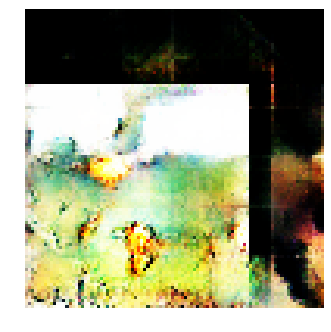


Epoch: 10640, D: -7.153, G: 5.339
Epoch: 10641, D: -6.089, G: 2.746
Epoch: 10642, D: -6.467, G: 2.884
Epoch: 10643, D: -5.342, G: 4.775
Epoch: 10644, D: -5.433, G: 5.666
Epoch: 10645, D: -6.838, G: 4.852
Epoch: 10646, D: -5.835, G: 3.022
Epoch: 10647, D: -8.3, G: 5.443
Epoch: 10648, D: -5.351, G: 4.092
Epoch: 10649, D: -6.244, G: 5.281
Epoch: 10650, D: -6.589, G: 3.385
Epoch: 10651, D: -6.72, G: 3.764
Epoch: 10652, D: -5.354, G: 4.032
Epoch: 10653, D: -5.306, G: 3.96
Epoch: 10654, D: -8.039, G: 3.136
Epoch: 10655, D: -6.479, G: 6.871
Epoch: 10656, D: -6.806, G: 8.061
Epoch: 10657, D: -5.728, G: 4.309
Epoch: 10658, D: -5.63, G: 5.776
Epoch: 10659, D: -6.397, G: 5.207


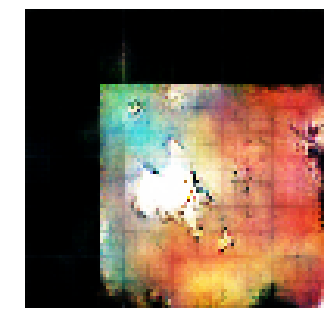


Epoch: 10660, D: -5.706, G: 2.497
Epoch: 10661, D: -5.601, G: 2.343
Epoch: 10662, D: -6.962, G: 3.804
Epoch: 10663, D: -6.168, G: 4.609
Epoch: 10664, D: -7.664, G: 6.218
Epoch: 10665, D: -7.092, G: 0.2734
Epoch: 10666, D: -6.293, G: 2.886
Epoch: 10667, D: -7.249, G: 6.736
Epoch: 10668, D: -4.99, G: 3.036
Epoch: 10669, D: -7.578, G: 2.414
Epoch: 10670, D: -7.213, G: 1.64
Epoch: 10671, D: -5.112, G: 2.936
Epoch: 10672, D: -5.493, G: 4.246
Epoch: 10673, D: -6.628, G: 3.784
Epoch: 10674, D: -7.487, G: 1.705
Epoch: 10675, D: -5.415, G: 3.251
Epoch: 10676, D: -6.358, G: 3.256
Epoch: 10677, D: -4.424, G: 5.626
Epoch: 10678, D: -6.874, G: 4.483
Epoch: 10679, D: -5.649, G: 2.395


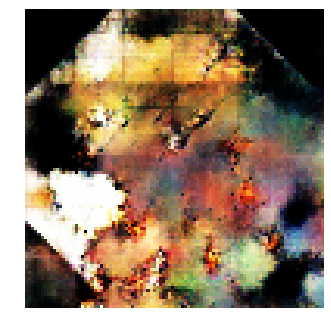


Epoch: 10680, D: -6.623, G: 4.486
Epoch: 10681, D: -6.095, G: 4.474
Epoch: 10682, D: -4.991, G: 3.044
Epoch: 10683, D: -5.58, G: 5.257
Epoch: 10684, D: -6.643, G: 4.634
Epoch: 10685, D: -7.552, G: 5.569
Epoch: 10686, D: -5.766, G: 4.256
Epoch: 10687, D: -5.96, G: 4.947
Epoch: 10688, D: -6.145, G: 2.807
Epoch: 10689, D: -6.52, G: 3.674
Epoch: 10690, D: -6.385, G: 8.264
Epoch: 10691, D: -5.758, G: 3.325
Epoch: 10692, D: -6.117, G: 5.255
Epoch: 10693, D: -5.031, G: 5.797
Epoch: 10694, D: -6.152, G: 3.744
Epoch: 10695, D: -5.026, G: 4.444
Epoch: 10696, D: -6.466, G: 4.146
Epoch: 10697, D: -7.024, G: 6.099
Epoch: 10698, D: -6.905, G: 4.228
Epoch: 10699, D: -6.189, G: 3.921


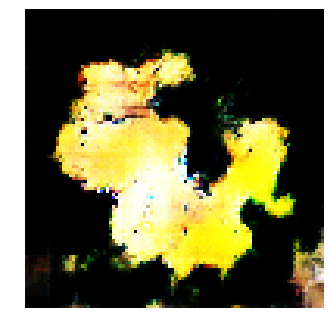


Epoch: 10700, D: -6.721, G: 4.876
Epoch: 10701, D: -5.895, G: 4.865
Epoch: 10702, D: -5.816, G: 5.19
Epoch: 10703, D: -5.803, G: 4.84
Epoch: 10704, D: -5.089, G: 3.119
Epoch: 10705, D: -5.49, G: 3.859
Epoch: 10706, D: -7.346, G: 4.456
Epoch: 10707, D: -5.904, G: 2.952
Epoch: 10708, D: -6.065, G: 4.509
Epoch: 10709, D: -7.133, G: 3.997
Epoch: 10710, D: -6.092, G: 1.239
Epoch: 10711, D: -6.069, G: 2.939
Epoch: 10712, D: -7.229, G: 1.569
Epoch: 10713, D: -6.122, G: 4.121
Epoch: 10714, D: -5.406, G: 4.849
Epoch: 10715, D: -5.556, G: 3.938
Epoch: 10716, D: -5.614, G: 4.554
Epoch: 10717, D: -7.58, G: 2.69
Epoch: 10718, D: -5.587, G: 1.081
Epoch: 10719, D: -6.378, G: 4.953


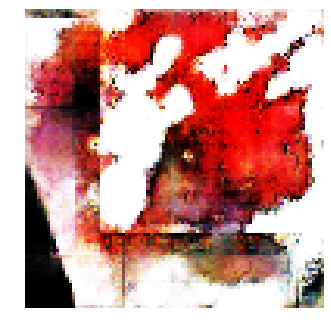


Epoch: 10720, D: -5.085, G: 4.23
Epoch: 10721, D: -6.008, G: 4.193
Epoch: 10722, D: -6.486, G: 2.755
Epoch: 10723, D: -5.444, G: 0.7048
Epoch: 10724, D: -7.689, G: 1.649
Epoch: 10725, D: -6.814, G: 2.99
Epoch: 10726, D: -6.661, G: 2.838
Epoch: 10727, D: -5.892, G: 4.242
Epoch: 10728, D: -6.101, G: 5.551
Epoch: 10729, D: -5.912, G: 5.389
Epoch: 10730, D: -6.822, G: 4.654
Epoch: 10731, D: -6.376, G: 6.622
Epoch: 10732, D: -6.451, G: 5.167
Epoch: 10733, D: -6.163, G: 2.982
Epoch: 10734, D: -6.158, G: 4.746
Epoch: 10735, D: -6.136, G: 4.839
Epoch: 10736, D: -6.096, G: 3.118
Epoch: 10737, D: -5.669, G: 3.33
Epoch: 10738, D: -5.997, G: 1.642
Epoch: 10739, D: -6.385, G: 2.553


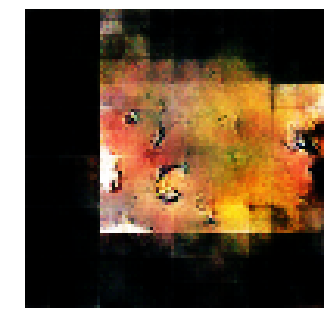


Epoch: 10740, D: -5.992, G: 4.112
Epoch: 10741, D: -5.905, G: 4.768
Epoch: 10742, D: -6.558, G: 5.476
Epoch: 10743, D: -4.264, G: 4.31
Epoch: 10744, D: -6.078, G: 3.218
Epoch: 10745, D: -6.173, G: 4.156
Epoch: 10746, D: -5.894, G: 3.322
Epoch: 10747, D: -5.54, G: 3.577
Epoch: 10748, D: -6.982, G: 4.21
Epoch: 10749, D: -5.915, G: 1.148
Epoch: 10750, D: -6.081, G: 3.228
Epoch: 10751, D: -6.506, G: 5.809
Epoch: 10752, D: -6.584, G: 4.065
Epoch: 10753, D: -6.185, G: 5.242
Epoch: 10754, D: -6.555, G: 5.146
Epoch: 10755, D: -5.592, G: 5.531
Epoch: 10756, D: -6.837, G: 1.895
Epoch: 10757, D: -5.52, G: 3.44
Epoch: 10758, D: -6.299, G: 5.818
Epoch: 10759, D: -5.753, G: 2.471


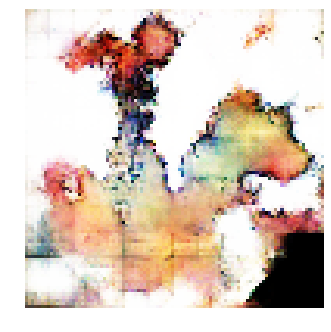


Epoch: 10760, D: -6.406, G: 5.864
Epoch: 10761, D: -6.099, G: 5.67
Epoch: 10762, D: -7.029, G: 3.543
Epoch: 10763, D: -7.704, G: 2.157
Epoch: 10764, D: -5.601, G: 0.5099
Epoch: 10765, D: -4.615, G: 3.56
Epoch: 10766, D: -6.698, G: 3.84
Epoch: 10767, D: -4.446, G: 4.304
Epoch: 10768, D: -6.181, G: 5.298
Epoch: 10769, D: -5.916, G: 3.31
Epoch: 10770, D: -5.815, G: 2.793
Epoch: 10771, D: -5.622, G: 3.843
Epoch: 10772, D: -4.807, G: 3.701
Epoch: 10773, D: -6.282, G: 5.55
Epoch: 10774, D: -5.953, G: 5.042
Epoch: 10775, D: -6.331, G: 4.262
Epoch: 10776, D: -4.92, G: 7.219
Epoch: 10777, D: -6.295, G: 3.814
Epoch: 10778, D: -5.213, G: 5.056
Epoch: 10779, D: -5.742, G: 1.854


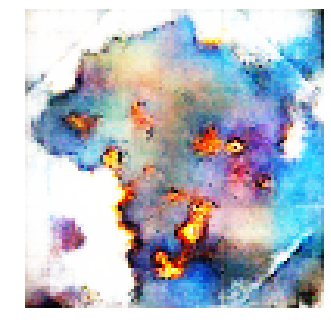


Epoch: 10780, D: -7.668, G: 3.381
Epoch: 10781, D: -6.756, G: 4.435
Epoch: 10782, D: -5.349, G: 5.601
Epoch: 10783, D: -6.73, G: 4.083
Epoch: 10784, D: -6.581, G: 5.403
Epoch: 10785, D: -5.81, G: 2.9
Epoch: 10786, D: -6.383, G: 6.969
Epoch: 10787, D: -5.051, G: 6.352
Epoch: 10788, D: -5.73, G: 4.683
Epoch: 10789, D: -5.065, G: 4.217
Epoch: 10790, D: -5.019, G: 3.811
Epoch: 10791, D: -4.221, G: 4.299
Epoch: 10792, D: -5.726, G: 3.066
Epoch: 10793, D: -8.469, G: 4.132
Epoch: 10794, D: -5.8, G: 1.048
Epoch: 10795, D: -6.015, G: 6.359
Epoch: 10796, D: -5.614, G: 4.079
Epoch: 10797, D: -5.374, G: 4.592
Epoch: 10798, D: -5.577, G: 4.484
Epoch: 10799, D: -6.613, G: 0.5404


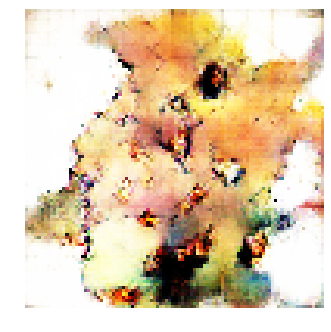


Epoch: 10800, D: -5.309, G: 3.797
Epoch: 10801, D: -6.545, G: 3.448
Epoch: 10802, D: -5.663, G: 5.048
Epoch: 10803, D: -5.08, G: 5.761
Epoch: 10804, D: -5.837, G: 5.875
Epoch: 10805, D: -4.717, G: 2.853
Epoch: 10806, D: -4.98, G: 5.997
Epoch: 10807, D: -6.63, G: 3.294
Epoch: 10808, D: -6.647, G: 6.272
Epoch: 10809, D: -6.082, G: 1.915
Epoch: 10810, D: -5.774, G: 4.12
Epoch: 10811, D: -6.476, G: 3.872
Epoch: 10812, D: -6.068, G: 4.769
Epoch: 10813, D: -6.343, G: 1.918
Epoch: 10814, D: -7.121, G: 5.258
Epoch: 10815, D: -6.246, G: 3.465
Epoch: 10816, D: -6.886, G: 3.895
Epoch: 10817, D: -5.829, G: 4.466
Epoch: 10818, D: -7.225, G: 3.701
Epoch: 10819, D: -6.673, G: 5.842


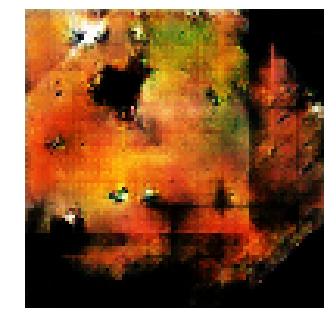


Epoch: 10820, D: -5.991, G: 5.111
Epoch: 10821, D: -5.548, G: 5.373
Epoch: 10822, D: -6.921, G: 2.717
Epoch: 10823, D: -5.895, G: 4.764
Epoch: 10824, D: -6.006, G: 5.344
Epoch: 10825, D: -4.839, G: 5.976
Epoch: 10826, D: -6.205, G: 6.496
Epoch: 10827, D: -5.072, G: 3.804
Epoch: 10828, D: -5.597, G: 3.689
Epoch: 10829, D: -6.468, G: 4.944
Epoch: 10830, D: -6.135, G: 4.675
Epoch: 10831, D: -5.196, G: 3.474
Epoch: 10832, D: -6.581, G: 3.761
Epoch: 10833, D: -6.134, G: 6.233
Epoch: 10834, D: -7.069, G: 4.619
Epoch: 10835, D: -5.62, G: 3.717
Epoch: 10836, D: -6.433, G: 2.811
Epoch: 10837, D: -5.826, G: 6.484
Epoch: 10838, D: -7.254, G: 3.725
Epoch: 10839, D: -5.641, G: 2.5


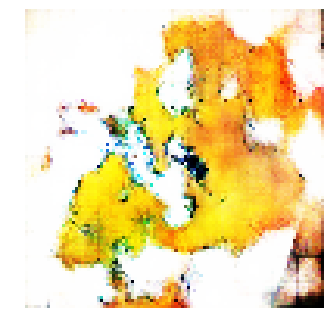


Epoch: 10840, D: -6.501, G: 4.43
Epoch: 10841, D: -6.958, G: 4.346
Epoch: 10842, D: -6.744, G: 4.321
Epoch: 10843, D: -5.305, G: 2.767
Epoch: 10844, D: -6.85, G: 4.939
Epoch: 10845, D: -5.79, G: 6.177
Epoch: 10846, D: -6.219, G: 5.054
Epoch: 10847, D: -5.361, G: 2.309
Epoch: 10848, D: -5.633, G: 5.099
Epoch: 10849, D: -6.586, G: 5.93
Epoch: 10850, D: -6.651, G: 2.923
Epoch: 10851, D: -6.406, G: 0.7719
Epoch: 10852, D: -5.835, G: 4.989
Epoch: 10853, D: -5.492, G: 4.338
Epoch: 10854, D: -6.065, G: 3.529
Epoch: 10855, D: -4.881, G: 2.049
Epoch: 10856, D: -5.257, G: 3.44
Epoch: 10857, D: -5.222, G: 4.179
Epoch: 10858, D: -5.525, G: 5.402
Epoch: 10859, D: -5.952, G: 4.015


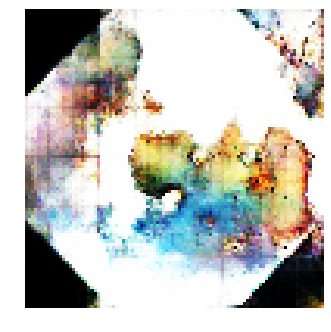


Epoch: 10860, D: -5.999, G: 0.2137
Epoch: 10861, D: -6.115, G: 3.046
Epoch: 10862, D: -4.708, G: 4.775
Epoch: 10863, D: -7.266, G: 4.699
Epoch: 10864, D: -6.36, G: 3.683
Epoch: 10865, D: -6.734, G: 4.983
Epoch: 10866, D: -6.123, G: 1.279
Epoch: 10867, D: -6.274, G: 5.122
Epoch: 10868, D: -6.589, G: 4.509
Epoch: 10869, D: -5.848, G: 5.038
Epoch: 10870, D: -5.737, G: 2.494
Epoch: 10871, D: -5.431, G: 1.318
Epoch: 10872, D: -6.248, G: 3.755
Epoch: 10873, D: -6.189, G: 2.589
Epoch: 10874, D: -5.632, G: 2.423
Epoch: 10875, D: -7.076, G: 3.984
Epoch: 10876, D: -5.24, G: 3.913
Epoch: 10877, D: -5.458, G: 5.379
Epoch: 10878, D: -5.562, G: 3.249
Epoch: 10879, D: -4.92, G: 3.757


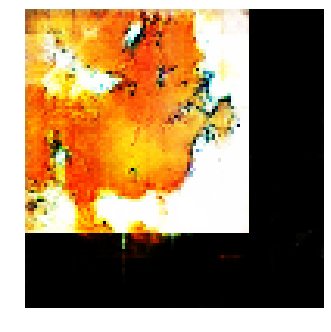


Epoch: 10880, D: -6.311, G: 5.161
Epoch: 10881, D: -6.113, G: 4.089
Epoch: 10882, D: -6.578, G: 5.834
Epoch: 10883, D: -5.155, G: 2.792
Epoch: 10884, D: -5.558, G: 6.916
Epoch: 10885, D: -6.768, G: 2.545
Epoch: 10886, D: -6.013, G: 3.05
Epoch: 10887, D: -5.237, G: 5.224
Epoch: 10888, D: -4.661, G: 2.957
Epoch: 10889, D: -6.764, G: 3.577
Epoch: 10890, D: -5.142, G: 5.196
Epoch: 10891, D: -5.857, G: 2.384
Epoch: 10892, D: -5.125, G: 6.183
Epoch: 10893, D: -5.606, G: 4.484
Epoch: 10894, D: -6.005, G: 4.207
Epoch: 10895, D: -6.174, G: 2.831
Epoch: 10896, D: -5.8, G: 3.624
Epoch: 10897, D: -5.074, G: 5.667
Epoch: 10898, D: -6.99, G: 4.841
Epoch: 10899, D: -7.332, G: 4.629


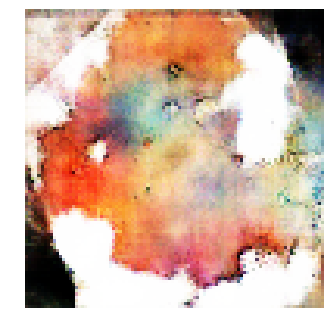


Epoch: 10900, D: -6.663, G: 3.815
Epoch: 10901, D: -6.647, G: 6.194
Epoch: 10902, D: -5.603, G: 6.597
Epoch: 10903, D: -6.937, G: 4.081
Epoch: 10904, D: -5.302, G: 4.295
Epoch: 10905, D: -7.007, G: 4.691
Epoch: 10906, D: -5.632, G: 7.404
Epoch: 10907, D: -5.062, G: 2.915
Epoch: 10908, D: -4.963, G: 5.35
Epoch: 10909, D: -5.543, G: 3.142
Epoch: 10910, D: -6.636, G: 4.675
Epoch: 10911, D: -7.618, G: 3.609
Epoch: 10912, D: -5.829, G: 3.643
Epoch: 10913, D: -6.227, G: 3.569
Epoch: 10914, D: -7.132, G: 3.243
Epoch: 10915, D: -5.567, G: 3.818
Epoch: 10916, D: -5.533, G: 5.087
Epoch: 10917, D: -5.862, G: 4.425
Epoch: 10918, D: -6.144, G: 3.896
Epoch: 10919, D: -4.937, G: 5.361


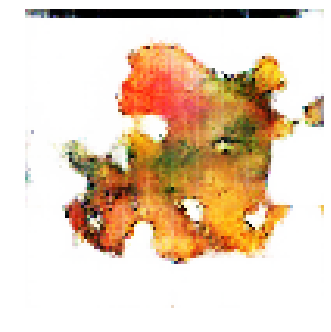


Epoch: 10920, D: -4.826, G: 4.848
Epoch: 10921, D: -6.274, G: 5.038
Epoch: 10922, D: -6.845, G: 6.955
Epoch: 10923, D: -4.649, G: 4.286
Epoch: 10924, D: -6.544, G: 3.102
Epoch: 10925, D: -6.658, G: 4.641
Epoch: 10926, D: -6.257, G: 5.711
Epoch: 10927, D: -7.12, G: 5.274
Epoch: 10928, D: -6.838, G: 4.414
Epoch: 10929, D: -6.463, G: 0.247
Epoch: 10930, D: -5.513, G: 3.401
Epoch: 10931, D: -6.106, G: 4.893
Epoch: 10932, D: -6.348, G: 3.223
Epoch: 10933, D: -4.088, G: 2.203
Epoch: 10934, D: -6.155, G: 4.915
Epoch: 10935, D: -5.361, G: 3.71
Epoch: 10936, D: -6.447, G: 5.359
Epoch: 10937, D: -5.587, G: 5.122
Epoch: 10938, D: -6.671, G: 4.413
Epoch: 10939, D: -6.953, G: 2.8


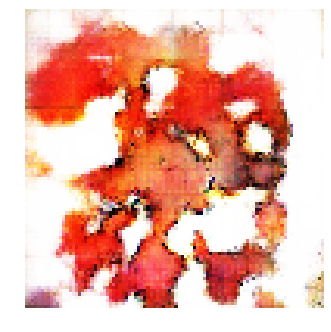


Epoch: 10940, D: -6.848, G: 2.3
Epoch: 10941, D: -5.069, G: 4.311
Epoch: 10942, D: -5.568, G: 4.128
Epoch: 10943, D: -6.131, G: 3.922
Epoch: 10944, D: -5.879, G: 6.526
Epoch: 10945, D: -7.046, G: 4.633
Epoch: 10946, D: -5.988, G: 3.98
Epoch: 10947, D: -5.882, G: 2.385
Epoch: 10948, D: -6.107, G: 3.706
Epoch: 10949, D: -5.862, G: 2.246
Epoch: 10950, D: -5.901, G: 5.595
Epoch: 10951, D: -7.343, G: 5.389
Epoch: 10952, D: -6.369, G: 5.291
Epoch: 10953, D: -6.393, G: 4.099
Epoch: 10954, D: -6.57, G: 2.104
Epoch: 10955, D: -5.66, G: 2.176
Epoch: 10956, D: -6.116, G: 3.805
Epoch: 10957, D: -6.035, G: 3.571
Epoch: 10958, D: -5.559, G: 2.228
Epoch: 10959, D: -5.401, G: 4.369


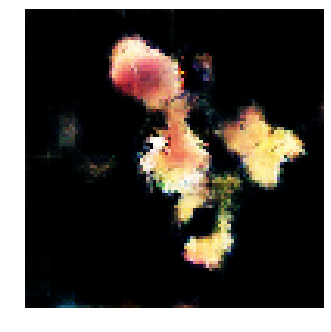


Epoch: 10960, D: -5.103, G: 4.091
Epoch: 10961, D: -5.825, G: 1.777
Epoch: 10962, D: -5.993, G: 4.933
Epoch: 10963, D: -4.365, G: 3.041
Epoch: 10964, D: -6.509, G: 5.564
Epoch: 10965, D: -7.274, G: 3.461
Epoch: 10966, D: -7.627, G: 0.8846
Epoch: 10967, D: -7.389, G: 3.746
Epoch: 10968, D: -5.154, G: 3.425
Epoch: 10969, D: -5.582, G: 4.498
Epoch: 10970, D: -5.499, G: 3.278
Epoch: 10971, D: -5.565, G: 2.391
Epoch: 10972, D: -7.174, G: 4.758
Epoch: 10973, D: -6.545, G: 6.117
Epoch: 10974, D: -7.003, G: 2.927
Epoch: 10975, D: -6.674, G: 1.871
Epoch: 10976, D: -4.903, G: 3.447
Epoch: 10977, D: -7.397, G: 4.038
Epoch: 10978, D: -4.687, G: 5.032
Epoch: 10979, D: -4.728, G: 4.974


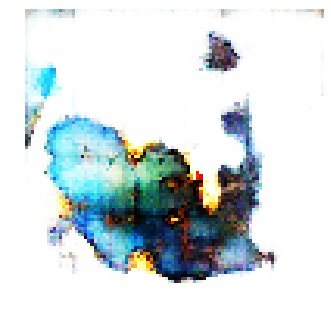


Epoch: 10980, D: -7.846, G: 2.88
Epoch: 10981, D: -5.547, G: 3.077
Epoch: 10982, D: -6.241, G: 4.244
Epoch: 10983, D: -5.49, G: 6.17
Epoch: 10984, D: -5.3, G: 6.897
Epoch: 10985, D: -6.9, G: 5.606
Epoch: 10986, D: -6.117, G: 4.148
Epoch: 10987, D: -5.311, G: 4.064
Epoch: 10988, D: -8.12, G: 2.064
Epoch: 10989, D: -6.203, G: 4.503
Epoch: 10990, D: -7.108, G: 2.076
Epoch: 10991, D: -5.749, G: 4.585
Epoch: 10992, D: -4.843, G: 6.301
Epoch: 10993, D: -6.86, G: 5.752
Epoch: 10994, D: -5.63, G: 3.49
Epoch: 10995, D: -5.831, G: 3.049
Epoch: 10996, D: -6.35, G: 2.174
Epoch: 10997, D: -5.976, G: 2.87
Epoch: 10998, D: -5.59, G: 4.878
Epoch: 10999, D: -6.615, G: 4.605


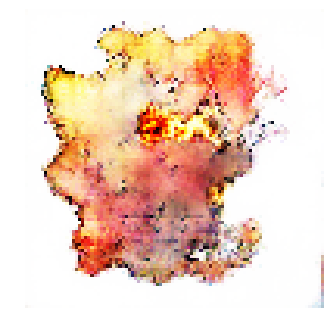


Epoch: 11000, D: -6.67, G: 6.944
Epoch: 11001, D: -5.981, G: 4.333
Epoch: 11002, D: -6.614, G: 5.308
Epoch: 11003, D: -6.383, G: 6.131
Epoch: 11004, D: -6.892, G: 4.341
Epoch: 11005, D: -5.663, G: 4.791
Epoch: 11006, D: -6.406, G: 4.177
Epoch: 11007, D: -6.172, G: 6.451
Epoch: 11008, D: -5.039, G: 2.83
Epoch: 11009, D: -5.47, G: 4.349
Epoch: 11010, D: -6.261, G: 6.018
Epoch: 11011, D: -7.008, G: 6.599
Epoch: 11012, D: -5.736, G: 3.771
Epoch: 11013, D: -6.619, G: 2.417
Epoch: 11014, D: -5.369, G: 3.238
Epoch: 11015, D: -6.623, G: 3.729
Epoch: 11016, D: -5.592, G: 4.134
Epoch: 11017, D: -5.435, G: 4.608
Epoch: 11018, D: -6.407, G: 2.5
Epoch: 11019, D: -7.309, G: 4.428


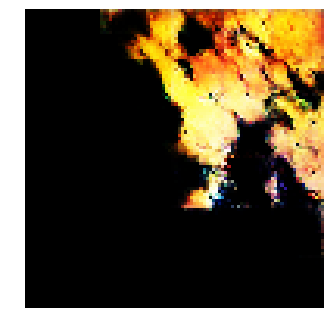


Epoch: 11020, D: -5.546, G: 4.63
Epoch: 11021, D: -6.058, G: 5.12
Epoch: 11022, D: -6.881, G: 4.753
Epoch: 11023, D: -7.008, G: 3.678
Epoch: 11024, D: -5.917, G: 4.078
Epoch: 11025, D: -5.855, G: 6.591
Epoch: 11026, D: -5.989, G: 5.35
Epoch: 11027, D: -5.464, G: 5.425
Epoch: 11028, D: -5.999, G: 2.057
Epoch: 11029, D: -5.771, G: 4.815
Epoch: 11030, D: -6.118, G: 3.504
Epoch: 11031, D: -5.925, G: 6.141
Epoch: 11032, D: -5.68, G: 4.736
Epoch: 11033, D: -6.696, G: 2.883
Epoch: 11034, D: -6.246, G: 3.35
Epoch: 11035, D: -5.858, G: 3.768
Epoch: 11036, D: -6.203, G: 4.056
Epoch: 11037, D: -7.097, G: 6.652
Epoch: 11038, D: -7.206, G: 2.405
Epoch: 11039, D: -5.882, G: 2.673


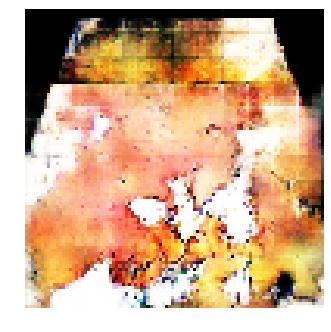


Epoch: 11040, D: -5.653, G: 3.827
Epoch: 11041, D: -4.675, G: 4.168
Epoch: 11042, D: -5.836, G: 4.317
Epoch: 11043, D: -6.576, G: 3.614
Epoch: 11044, D: -5.87, G: 4.264
Epoch: 11045, D: -6.63, G: 2.929
Epoch: 11046, D: -6.205, G: 4.935
Epoch: 11047, D: -5.5, G: 3.936
Epoch: 11048, D: -6.084, G: 2.616
Epoch: 11049, D: -6.953, G: 6.625
Epoch: 11050, D: -6.967, G: 5.217
Epoch: 11051, D: -5.849, G: 7.533
Epoch: 11052, D: -5.992, G: 9.233
Epoch: 11053, D: -5.086, G: 4.49
Epoch: 11054, D: -5.294, G: 3.749
Epoch: 11055, D: -5.694, G: 3.062
Epoch: 11056, D: -5.423, G: 4.451
Epoch: 11057, D: -5.881, G: 1.815
Epoch: 11058, D: -6.069, G: 0.8763
Epoch: 11059, D: -5.216, G: 5.038


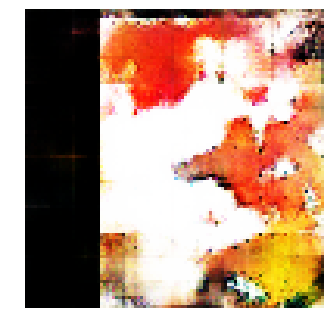


Epoch: 11060, D: -5.377, G: 2.125
Epoch: 11061, D: -5.59, G: 2.543
Epoch: 11062, D: -5.53, G: 3.472
Epoch: 11063, D: -6.586, G: 2.962
Epoch: 11064, D: -6.53, G: 6.022
Epoch: 11065, D: -6.652, G: 1.441
Epoch: 11066, D: -6.449, G: 2.634
Epoch: 11067, D: -7.483, G: 6.64
Epoch: 11068, D: -5.832, G: 3.699
Epoch: 11069, D: -5.137, G: 1.529
Epoch: 11070, D: -6.243, G: 2.394
Epoch: 11071, D: -6.019, G: 4.718
Epoch: 11072, D: -7.572, G: 4.465
Epoch: 11073, D: -5.583, G: 2.253
Epoch: 11074, D: -5.921, G: 3.78
Epoch: 11075, D: -5.334, G: 3.134
Epoch: 11076, D: -4.746, G: 6.026
Epoch: 11077, D: -4.431, G: 3.261
Epoch: 11078, D: -6.919, G: 4.542
Epoch: 11079, D: -5.773, G: 4.244


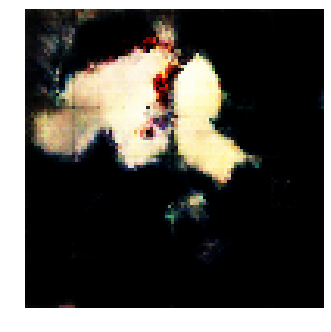


Epoch: 11080, D: -5.333, G: 2.797
Epoch: 11081, D: -5.096, G: 5.483
Epoch: 11082, D: -6.906, G: 4.621
Epoch: 11083, D: -6.339, G: 5.135
Epoch: 11084, D: -6.536, G: 4.291
Epoch: 11085, D: -6.048, G: 1.073
Epoch: 11086, D: -6.483, G: 4.178
Epoch: 11087, D: -6.234, G: 2.719
Epoch: 11088, D: -5.784, G: 3.1
Epoch: 11089, D: -5.292, G: 2.185
Epoch: 11090, D: -6.309, G: 3.988
Epoch: 11091, D: -5.275, G: 3.935
Epoch: 11092, D: -8.021, G: 2.034
Epoch: 11093, D: -5.71, G: 4.715
Epoch: 11094, D: -5.926, G: 4.703
Epoch: 11095, D: -5.567, G: 1.865
Epoch: 11096, D: -7.475, G: 5.716
Epoch: 11097, D: -6.483, G: 3.711
Epoch: 11098, D: -6.382, G: 3.929
Epoch: 11099, D: -5.221, G: 3.955


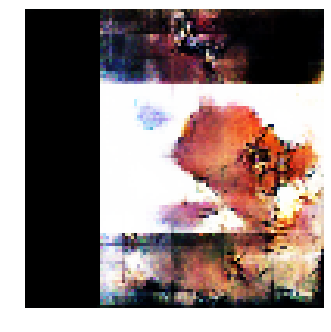


Epoch: 11100, D: -6.446, G: 3.682
Epoch: 11101, D: -6.691, G: 1.735
Epoch: 11102, D: -5.358, G: 0.9918
Epoch: 11103, D: -6.775, G: 5.03
Epoch: 11104, D: -5.864, G: 2.932
Epoch: 11105, D: -5.62, G: 3.723
Epoch: 11106, D: -7.094, G: 3.718
Epoch: 11107, D: -6.781, G: 3.929
Epoch: 11108, D: -6.446, G: 4.389
Epoch: 11109, D: -5.842, G: 2.602
Epoch: 11110, D: -5.36, G: 5.178
Epoch: 11111, D: -6.293, G: 4.034
Epoch: 11112, D: -5.789, G: 2.258
Epoch: 11113, D: -6.946, G: 3.974
Epoch: 11114, D: -5.572, G: 4.642
Epoch: 11115, D: -6.027, G: 4.945
Epoch: 11116, D: -5.387, G: 2.065
Epoch: 11117, D: -6.094, G: 3.151
Epoch: 11118, D: -5.683, G: 3.834
Epoch: 11119, D: -6.705, G: 4.643


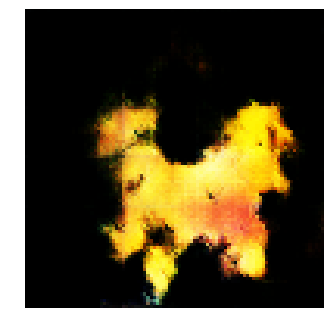


Epoch: 11120, D: -6.644, G: 3.216
Epoch: 11121, D: -6.0, G: 4.547
Epoch: 11122, D: -6.448, G: 4.427
Epoch: 11123, D: -7.074, G: 4.253
Epoch: 11124, D: -6.007, G: 3.949
Epoch: 11125, D: -6.678, G: 5.904
Epoch: 11126, D: -7.855, G: 3.843
Epoch: 11127, D: -6.499, G: 4.777
Epoch: 11128, D: -5.259, G: 4.579
Epoch: 11129, D: -6.747, G: 4.017
Epoch: 11130, D: -7.159, G: 1.345
Epoch: 11131, D: -6.501, G: 4.116
Epoch: 11132, D: -4.662, G: 6.06
Epoch: 11133, D: -6.457, G: 2.631
Epoch: 11134, D: -6.969, G: 3.143
Epoch: 11135, D: -6.319, G: 6.353
Epoch: 11136, D: -5.313, G: 2.814
Epoch: 11137, D: -5.476, G: 3.496
Epoch: 11138, D: -6.348, G: 1.331
Epoch: 11139, D: -6.484, G: 5.637


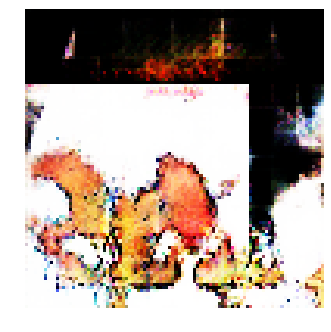


Epoch: 11140, D: -6.245, G: 3.93
Epoch: 11141, D: -4.9, G: 4.375
Epoch: 11142, D: -5.678, G: 5.178
Epoch: 11143, D: -6.191, G: 4.018
Epoch: 11144, D: -5.954, G: 2.609
Epoch: 11145, D: -5.783, G: 0.6003
Epoch: 11146, D: -5.923, G: 5.72
Epoch: 11147, D: -6.14, G: 3.737
Epoch: 11148, D: -5.276, G: 5.473
Epoch: 11149, D: -5.524, G: 4.466
Epoch: 11150, D: -6.412, G: 2.905
Epoch: 11151, D: -5.741, G: 4.766
Epoch: 11152, D: -6.956, G: 4.1
Epoch: 11153, D: -6.838, G: 2.236
Epoch: 11154, D: -5.328, G: 3.213
Epoch: 11155, D: -6.494, G: 5.312
Epoch: 11156, D: -6.122, G: 1.677
Epoch: 11157, D: -5.828, G: 6.021
Epoch: 11158, D: -5.425, G: 4.465
Epoch: 11159, D: -6.301, G: 5.389


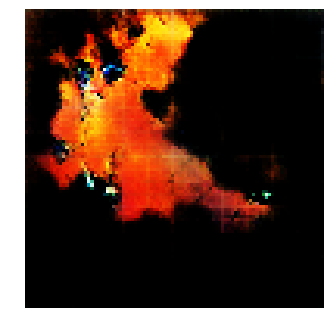


Epoch: 11160, D: -5.652, G: 3.283
Epoch: 11161, D: -5.851, G: 3.006
Epoch: 11162, D: -6.35, G: 3.183
Epoch: 11163, D: -6.37, G: 3.864
Epoch: 11164, D: -5.703, G: 3.272
Epoch: 11165, D: -6.347, G: 3.408
Epoch: 11166, D: -5.584, G: 4.491
Epoch: 11167, D: -4.944, G: 3.479
Epoch: 11168, D: -4.882, G: 3.683
Epoch: 11169, D: -4.815, G: 3.559
Epoch: 11170, D: -5.583, G: 6.201
Epoch: 11171, D: -6.227, G: 3.925
Epoch: 11172, D: -6.25, G: 2.983
Epoch: 11173, D: -5.323, G: 1.738
Epoch: 11174, D: -7.493, G: 5.066
Epoch: 11175, D: -6.283, G: 3.283
Epoch: 11176, D: -5.309, G: 5.245
Epoch: 11177, D: -6.691, G: 5.789
Epoch: 11178, D: -6.508, G: 3.355
Epoch: 11179, D: -6.579, G: 5.026


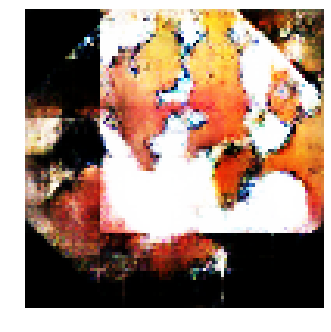


Epoch: 11180, D: -5.005, G: 4.2
Epoch: 11181, D: -7.185, G: 2.391
Epoch: 11182, D: -5.595, G: 5.639
Epoch: 11183, D: -6.079, G: 4.023
Epoch: 11184, D: -6.405, G: 4.084
Epoch: 11185, D: -5.912, G: 1.395
Epoch: 11186, D: -6.834, G: 6.266
Epoch: 11187, D: -6.883, G: 3.356
Epoch: 11188, D: -5.476, G: 2.679
Epoch: 11189, D: -7.342, G: 3.308
Epoch: 11190, D: -6.414, G: 3.833
Epoch: 11191, D: -5.595, G: 5.351
Epoch: 11192, D: -5.993, G: 7.972
Epoch: 11193, D: -4.786, G: 5.782
Epoch: 11194, D: -7.105, G: 3.307
Epoch: 11195, D: -6.379, G: 5.584
Epoch: 11196, D: -5.591, G: 1.402
Epoch: 11197, D: -5.191, G: 3.351
Epoch: 11198, D: -6.082, G: 4.95
Epoch: 11199, D: -7.831, G: 2.005


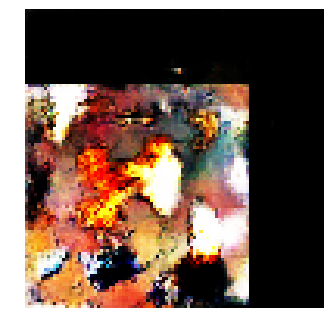


Epoch: 11200, D: -6.284, G: 3.351
Epoch: 11201, D: -5.688, G: 2.448
Epoch: 11202, D: -6.373, G: 1.883
Epoch: 11203, D: -6.728, G: 5.438
Epoch: 11204, D: -6.801, G: 3.59
Epoch: 11205, D: -6.066, G: 2.476
Epoch: 11206, D: -5.417, G: 5.218
Epoch: 11207, D: -5.286, G: 4.033
Epoch: 11208, D: -5.543, G: 6.501
Epoch: 11209, D: -5.432, G: 3.171
Epoch: 11210, D: -7.512, G: 1.362
Epoch: 11211, D: -6.143, G: 1.369
Epoch: 11212, D: -5.712, G: 1.516
Epoch: 11213, D: -6.069, G: 3.786
Epoch: 11214, D: -5.243, G: 1.547
Epoch: 11215, D: -7.058, G: 3.868
Epoch: 11216, D: -5.601, G: 3.214
Epoch: 11217, D: -5.718, G: 4.546
Epoch: 11218, D: -6.059, G: 3.004
Epoch: 11219, D: -6.385, G: 6.305


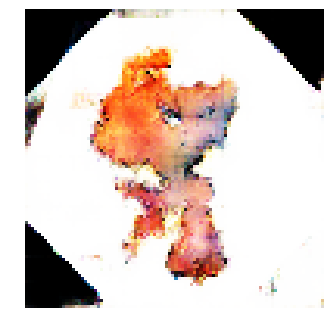


Epoch: 11220, D: -5.04, G: 2.543
Epoch: 11221, D: -5.683, G: 2.023
Epoch: 11222, D: -6.964, G: 3.321
Epoch: 11223, D: -5.952, G: 3.385
Epoch: 11224, D: -5.259, G: 3.545
Epoch: 11225, D: -4.912, G: 4.699
Epoch: 11226, D: -6.878, G: 3.875
Epoch: 11227, D: -6.315, G: 2.897
Epoch: 11228, D: -6.3, G: 3.402
Epoch: 11229, D: -5.516, G: 3.083
Epoch: 11230, D: -4.858, G: 4.104
Epoch: 11231, D: -6.918, G: 5.158
Epoch: 11232, D: -6.29, G: 4.265
Epoch: 11233, D: -6.043, G: 1.811
Epoch: 11234, D: -7.502, G: 3.173
Epoch: 11235, D: -5.042, G: 2.904
Epoch: 11236, D: -6.057, G: 3.734
Epoch: 11237, D: -5.928, G: 4.016
Epoch: 11238, D: -5.905, G: 3.04
Epoch: 11239, D: -5.342, G: 4.275


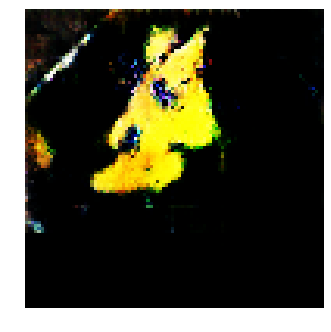


Epoch: 11240, D: -6.489, G: 6.283
Epoch: 11241, D: -4.785, G: 5.0
Epoch: 11242, D: -6.201, G: 4.663
Epoch: 11243, D: -5.578, G: 4.682
Epoch: 11244, D: -6.516, G: 4.129
Epoch: 11245, D: -5.686, G: 4.217
Epoch: 11246, D: -4.871, G: 4.749
Epoch: 11247, D: -5.92, G: 2.017
Epoch: 11248, D: -5.117, G: 4.735
Epoch: 11249, D: -6.339, G: 4.996
Epoch: 11250, D: -7.041, G: 3.857
Epoch: 11251, D: -5.375, G: 5.835
Epoch: 11252, D: -5.522, G: 5.268
Epoch: 11253, D: -5.911, G: 3.338
Epoch: 11254, D: -5.165, G: 0.7564
Epoch: 11255, D: -6.606, G: 4.398
Epoch: 11256, D: -7.159, G: 3.434
Epoch: 11257, D: -4.601, G: 5.404
Epoch: 11258, D: -7.277, G: 4.99
Epoch: 11259, D: -5.223, G: 4.343


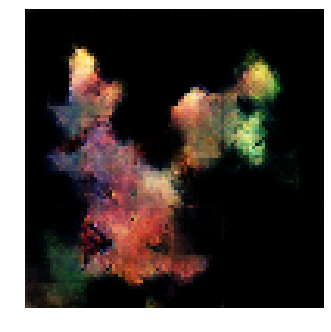


Epoch: 11260, D: -5.323, G: 3.667
Epoch: 11261, D: -6.201, G: 4.096
Epoch: 11262, D: -5.949, G: 2.868
Epoch: 11263, D: -6.722, G: 2.551
Epoch: 11264, D: -7.889, G: 4.341
Epoch: 11265, D: -6.017, G: 5.393
Epoch: 11266, D: -5.853, G: 5.066
Epoch: 11267, D: -6.119, G: 0.3774
Epoch: 11268, D: -5.981, G: 2.526
Epoch: 11269, D: -5.78, G: 3.644
Epoch: 11270, D: -6.096, G: 4.593
Epoch: 11271, D: -4.912, G: 6.456
Epoch: 11272, D: -5.557, G: 4.855
Epoch: 11273, D: -5.978, G: 6.376
Epoch: 11274, D: -6.717, G: 6.977
Epoch: 11275, D: -6.288, G: 3.356
Epoch: 11276, D: -6.901, G: 4.911
Epoch: 11277, D: -5.702, G: 2.697
Epoch: 11278, D: -4.746, G: 4.714
Epoch: 11279, D: -4.597, G: 4.866


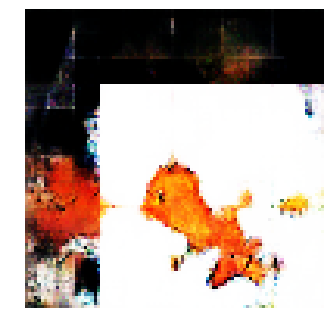


Epoch: 11280, D: -5.292, G: 5.036
Epoch: 11281, D: -6.557, G: 5.799
Epoch: 11282, D: -5.106, G: 2.434
Epoch: 11283, D: -5.179, G: 2.175
Epoch: 11284, D: -6.009, G: 3.567
Epoch: 11285, D: -5.929, G: 3.154
Epoch: 11286, D: -5.455, G: 6.407
Epoch: 11287, D: -5.767, G: 3.024
Epoch: 11288, D: -6.145, G: 2.14
Epoch: 11289, D: -5.702, G: 3.528
Epoch: 11290, D: -5.324, G: 2.924
Epoch: 11291, D: -5.186, G: 5.74
Epoch: 11292, D: -5.849, G: 5.604
Epoch: 11293, D: -5.76, G: 5.579
Epoch: 11294, D: -5.065, G: 4.926
Epoch: 11295, D: -6.779, G: 4.81
Epoch: 11296, D: -5.762, G: 4.089
Epoch: 11297, D: -6.121, G: 5.039
Epoch: 11298, D: -6.773, G: 8.117
Epoch: 11299, D: -5.068, G: 3.412


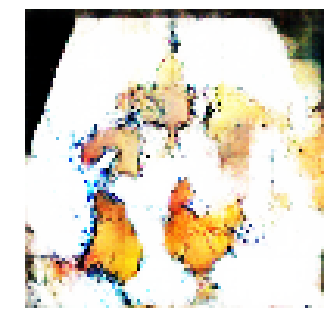


Epoch: 11300, D: -5.06, G: 2.203
Epoch: 11301, D: -5.128, G: 2.569
Epoch: 11302, D: -4.929, G: 3.869
Epoch: 11303, D: -7.306, G: 2.372
Epoch: 11304, D: -5.608, G: 5.105
Epoch: 11305, D: -5.875, G: 0.7511
Epoch: 11306, D: -6.743, G: 5.493
Epoch: 11307, D: -6.719, G: 1.169
Epoch: 11308, D: -6.295, G: 5.787
Epoch: 11309, D: -5.985, G: 4.39
Epoch: 11310, D: -5.215, G: 2.587
Epoch: 11311, D: -6.619, G: 6.286
Epoch: 11312, D: -4.28, G: 7.457
Epoch: 11313, D: -5.745, G: 2.329
Epoch: 11314, D: -6.309, G: 3.721
Epoch: 11315, D: -6.459, G: 6.408
Epoch: 11316, D: -3.941, G: 3.842
Epoch: 11317, D: -6.041, G: 3.473
Epoch: 11318, D: -5.889, G: 3.746
Epoch: 11319, D: -5.855, G: 3.523


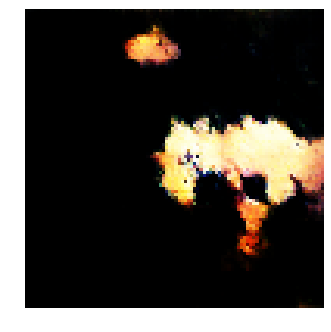


Epoch: 11320, D: -4.632, G: 4.195
Epoch: 11321, D: -5.223, G: 2.782
Epoch: 11322, D: -5.807, G: 4.006
Epoch: 11323, D: -5.986, G: 5.736
Epoch: 11324, D: -5.826, G: 4.835
Epoch: 11325, D: -5.937, G: 3.517
Epoch: 11326, D: -5.489, G: 1.359
Epoch: 11327, D: -6.666, G: 2.935
Epoch: 11328, D: -5.47, G: 2.265
Epoch: 11329, D: -5.882, G: 4.858
Epoch: 11330, D: -6.284, G: 4.954
Epoch: 11331, D: -5.742, G: 5.222
Epoch: 11332, D: -5.119, G: 4.974
Epoch: 11333, D: -4.963, G: 4.731
Epoch: 11334, D: -6.05, G: 2.993
Epoch: 11335, D: -4.91, G: 1.181
Epoch: 11336, D: -5.876, G: 4.217
Epoch: 11337, D: -5.439, G: 2.161
Epoch: 11338, D: -6.558, G: 5.347
Epoch: 11339, D: -6.005, G: 4.249


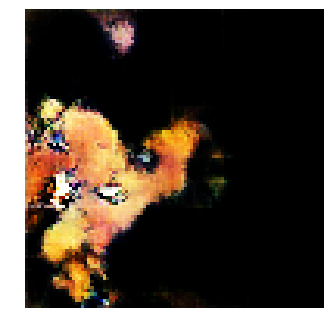


Epoch: 11340, D: -6.95, G: 4.618
Epoch: 11341, D: -5.938, G: 3.615
Epoch: 11342, D: -6.545, G: 4.698
Epoch: 11343, D: -5.838, G: 4.636
Epoch: 11344, D: -5.335, G: 2.843
Epoch: 11345, D: -6.788, G: 5.746
Epoch: 11346, D: -5.784, G: 2.729
Epoch: 11347, D: -6.423, G: 2.406
Epoch: 11348, D: -5.865, G: 2.889
Epoch: 11349, D: -4.971, G: 6.945
Epoch: 11350, D: -6.866, G: 6.032
Epoch: 11351, D: -5.707, G: 2.363
Epoch: 11352, D: -7.585, G: 5.616
Epoch: 11353, D: -5.883, G: 2.906
Epoch: 11354, D: -6.057, G: 4.116
Epoch: 11355, D: -4.882, G: 5.315
Epoch: 11356, D: -5.412, G: 4.834
Epoch: 11357, D: -5.39, G: 4.235
Epoch: 11358, D: -5.661, G: 5.235
Epoch: 11359, D: -6.925, G: 5.075


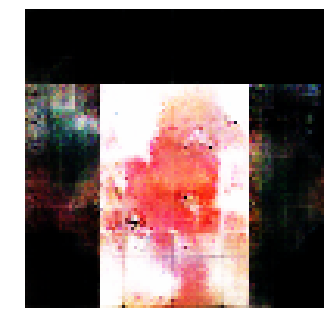


Epoch: 11360, D: -6.802, G: 4.009
Epoch: 11361, D: -6.127, G: 3.112
Epoch: 11362, D: -6.525, G: 4.112
Epoch: 11363, D: -5.961, G: 5.052
Epoch: 11364, D: -7.302, G: 3.694
Epoch: 11365, D: -7.059, G: 2.963
Epoch: 11366, D: -5.597, G: 2.352
Epoch: 11367, D: -5.87, G: 4.19
Epoch: 11368, D: -6.728, G: 0.8338
Epoch: 11369, D: -6.836, G: 3.573
Epoch: 11370, D: -5.687, G: 2.857
Epoch: 11371, D: -5.365, G: 4.38
Epoch: 11372, D: -7.05, G: 4.768
Epoch: 11373, D: -5.257, G: 1.015
Epoch: 11374, D: -4.849, G: 3.272
Epoch: 11375, D: -6.6, G: 3.049
Epoch: 11376, D: -7.343, G: 1.434
Epoch: 11377, D: -6.319, G: 2.174
Epoch: 11378, D: -5.683, G: 2.318
Epoch: 11379, D: -6.448, G: 4.2


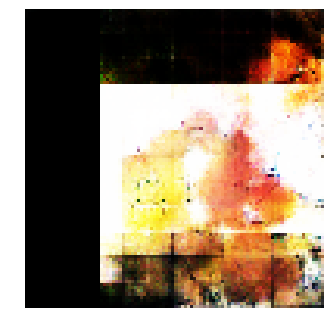


Epoch: 11380, D: -7.053, G: 5.499
Epoch: 11381, D: -5.605, G: 3.795
Epoch: 11382, D: -6.52, G: 3.97
Epoch: 11383, D: -6.701, G: 3.086
Epoch: 11384, D: -5.553, G: 5.315
Epoch: 11385, D: -6.727, G: 6.266
Epoch: 11386, D: -5.733, G: 2.884
Epoch: 11387, D: -5.249, G: 4.504
Epoch: 11388, D: -6.322, G: 3.93
Epoch: 11389, D: -5.192, G: 3.823
Epoch: 11390, D: -7.078, G: 4.775
Epoch: 11391, D: -6.064, G: 3.795
Epoch: 11392, D: -6.379, G: 4.014
Epoch: 11393, D: -5.751, G: 5.747
Epoch: 11394, D: -5.274, G: 4.73
Epoch: 11395, D: -6.322, G: 3.141
Epoch: 11396, D: -6.198, G: 4.826
Epoch: 11397, D: -4.182, G: 4.036
Epoch: 11398, D: -4.56, G: 3.689
Epoch: 11399, D: -5.641, G: 6.11


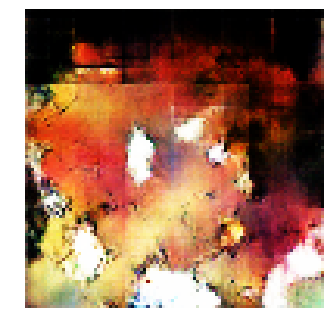


Epoch: 11400, D: -4.539, G: 3.834
Epoch: 11401, D: -5.745, G: 3.087
Epoch: 11402, D: -6.803, G: 3.976
Epoch: 11403, D: -4.686, G: 2.181
Epoch: 11404, D: -6.521, G: 4.987
Epoch: 11405, D: -5.613, G: 4.817
Epoch: 11406, D: -5.802, G: 3.095
Epoch: 11407, D: -4.585, G: 3.203
Epoch: 11408, D: -6.251, G: 3.119
Epoch: 11409, D: -6.467, G: 5.809
Epoch: 11410, D: -5.043, G: 6.998
Epoch: 11411, D: -4.88, G: 5.105
Epoch: 11412, D: -4.48, G: 1.006
Epoch: 11413, D: -6.822, G: 3.436
Epoch: 11414, D: -4.682, G: 3.719
Epoch: 11415, D: -6.386, G: 2.808
Epoch: 11416, D: -5.967, G: 6.303
Epoch: 11417, D: -6.834, G: 6.712
Epoch: 11418, D: -5.302, G: 5.002
Epoch: 11419, D: -5.638, G: 4.35


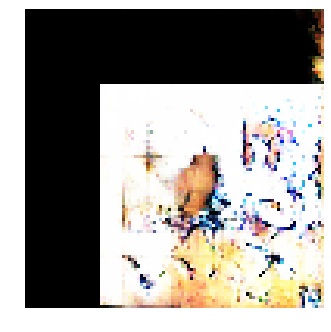


Epoch: 11420, D: -5.162, G: 2.144
Epoch: 11421, D: -7.51, G: 1.776
Epoch: 11422, D: -6.247, G: 3.366
Epoch: 11423, D: -6.298, G: 3.919
Epoch: 11424, D: -5.297, G: 2.36
Epoch: 11425, D: -6.47, G: 4.357
Epoch: 11426, D: -4.859, G: 4.883
Epoch: 11427, D: -6.044, G: 3.119
Epoch: 11428, D: -5.883, G: 3.833
Epoch: 11429, D: -4.831, G: 1.84
Epoch: 11430, D: -5.108, G: 4.092
Epoch: 11431, D: -6.026, G: 4.075
Epoch: 11432, D: -5.052, G: 1.734
Epoch: 11433, D: -5.641, G: 3.691
Epoch: 11434, D: -8.17, G: 3.259
Epoch: 11435, D: -6.315, G: 4.232
Epoch: 11436, D: -6.227, G: 4.221
Epoch: 11437, D: -6.959, G: 4.256
Epoch: 11438, D: -6.196, G: 4.482
Epoch: 11439, D: -6.839, G: 2.885


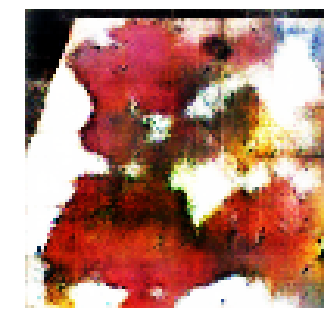


Epoch: 11440, D: -6.76, G: 4.072
Epoch: 11441, D: -5.961, G: 5.359
Epoch: 11442, D: -5.229, G: 2.101
Epoch: 11443, D: -4.971, G: 4.064
Epoch: 11444, D: -6.279, G: 4.196
Epoch: 11445, D: -6.345, G: 5.165
Epoch: 11446, D: -6.954, G: 1.867
Epoch: 11447, D: -8.475, G: 2.475
Epoch: 11448, D: -5.217, G: 4.517
Epoch: 11449, D: -5.127, G: 5.191
Epoch: 11450, D: -6.375, G: 3.855
Epoch: 11451, D: -5.594, G: 4.257
Epoch: 11452, D: -6.08, G: 3.375
Epoch: 11453, D: -4.438, G: 4.443
Epoch: 11454, D: -5.682, G: 6.439
Epoch: 11455, D: -6.424, G: 4.237
Epoch: 11456, D: -5.486, G: 2.273
Epoch: 11457, D: -6.584, G: 2.329
Epoch: 11458, D: -5.914, G: 2.995
Epoch: 11459, D: -5.287, G: 1.025


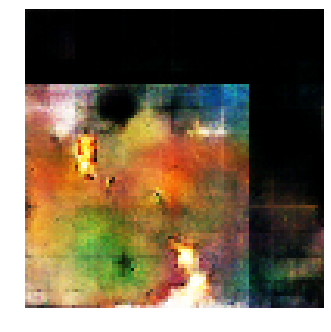


Epoch: 11460, D: -6.808, G: 2.891
Epoch: 11461, D: -6.19, G: 4.494
Epoch: 11462, D: -5.78, G: 3.592
Epoch: 11463, D: -5.591, G: 4.399
Epoch: 11464, D: -5.462, G: 4.832
Epoch: 11465, D: -7.145, G: 1.273
Epoch: 11466, D: -5.233, G: 5.323
Epoch: 11467, D: -6.006, G: 4.633
Epoch: 11468, D: -5.129, G: 3.743
Epoch: 11469, D: -4.626, G: 1.693
Epoch: 11470, D: -6.484, G: 4.515
Epoch: 11471, D: -4.831, G: 2.824
Epoch: 11472, D: -5.953, G: 1.545
Epoch: 11473, D: -5.78, G: 4.37
Epoch: 11474, D: -6.362, G: 4.458
Epoch: 11475, D: -7.38, G: 1.521
Epoch: 11476, D: -6.515, G: 2.151
Epoch: 11477, D: -4.998, G: 2.371
Epoch: 11478, D: -5.106, G: 5.357
Epoch: 11479, D: -5.623, G: 4.952


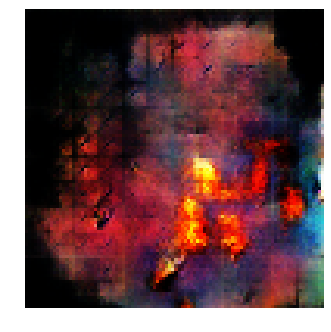


Epoch: 11480, D: -4.746, G: 3.936
Epoch: 11481, D: -6.367, G: 0.8003
Epoch: 11482, D: -7.429, G: 4.796
Epoch: 11483, D: -5.053, G: 5.618
Epoch: 11484, D: -6.104, G: 3.806
Epoch: 11485, D: -6.126, G: 2.735
Epoch: 11486, D: -6.039, G: 5.597
Epoch: 11487, D: -4.777, G: 5.472
Epoch: 11488, D: -6.017, G: 3.986
Epoch: 11489, D: -8.147, G: 6.057
Epoch: 11490, D: -5.916, G: 5.442
Epoch: 11491, D: -6.182, G: 5.506
Epoch: 11492, D: -6.86, G: 1.929
Epoch: 11493, D: -7.192, G: 2.253
Epoch: 11494, D: -4.991, G: 4.621
Epoch: 11495, D: -6.505, G: 3.341
Epoch: 11496, D: -6.58, G: 4.473
Epoch: 11497, D: -5.554, G: 4.025
Epoch: 11498, D: -5.919, G: 4.953
Epoch: 11499, D: -6.627, G: 3.028


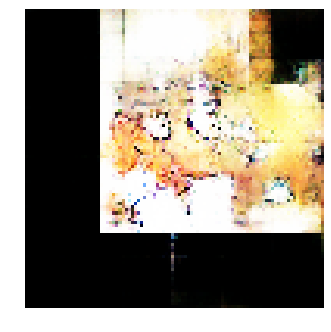


Epoch: 11500, D: -6.881, G: 2.271
Epoch: 11501, D: -6.322, G: 4.051
Epoch: 11502, D: -6.359, G: 4.727
Epoch: 11503, D: -5.881, G: 2.177
Epoch: 11504, D: -6.947, G: 2.023
Epoch: 11505, D: -5.258, G: 0.821
Epoch: 11506, D: -6.004, G: 3.325
Epoch: 11507, D: -6.274, G: 1.934
Epoch: 11508, D: -4.942, G: 4.14
Epoch: 11509, D: -7.645, G: 3.419
Epoch: 11510, D: -8.165, G: 4.737
Epoch: 11511, D: -6.218, G: 2.287
Epoch: 11512, D: -6.268, G: 2.465
Epoch: 11513, D: -7.466, G: 2.201
Epoch: 11514, D: -6.674, G: 2.368
Epoch: 11515, D: -6.563, G: 5.121
Epoch: 11516, D: -5.195, G: 4.14
Epoch: 11517, D: -6.545, G: 5.94
Epoch: 11518, D: -5.767, G: 2.7
Epoch: 11519, D: -6.613, G: 5.831


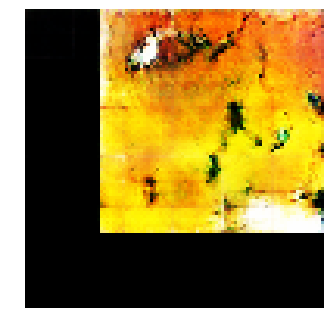


Epoch: 11520, D: -5.286, G: 4.464
Epoch: 11521, D: -6.305, G: 4.878
Epoch: 11522, D: -5.942, G: 5.14
Epoch: 11523, D: -4.978, G: 6.355
Epoch: 11524, D: -4.577, G: 5.65
Epoch: 11525, D: -4.501, G: 6.397
Epoch: 11526, D: -6.346, G: 4.592
Epoch: 11527, D: -7.154, G: 1.604
Epoch: 11528, D: -6.681, G: 2.902
Epoch: 11529, D: -6.172, G: 4.742
Epoch: 11530, D: -6.344, G: 4.849
Epoch: 11531, D: -7.611, G: 3.487
Epoch: 11532, D: -5.653, G: 1.5
Epoch: 11533, D: -7.76, G: 2.63
Epoch: 11534, D: -7.703, G: 1.964
Epoch: 11535, D: -7.046, G: 2.375
Epoch: 11536, D: -6.721, G: 2.196
Epoch: 11537, D: -5.186, G: 2.355
Epoch: 11538, D: -6.825, G: 3.516
Epoch: 11539, D: -5.555, G: 4.495


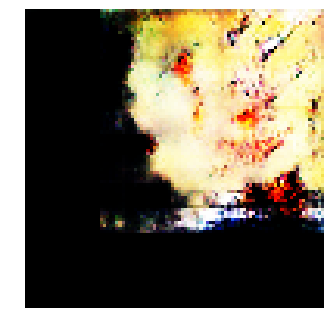


Epoch: 11540, D: -5.46, G: 3.414
Epoch: 11541, D: -6.649, G: 1.403
Epoch: 11542, D: -5.483, G: 5.005
Epoch: 11543, D: -5.686, G: 2.309
Epoch: 11544, D: -6.946, G: 4.798
Epoch: 11545, D: -6.081, G: 4.1
Epoch: 11546, D: -7.017, G: 4.261
Epoch: 11547, D: -5.005, G: 6.531
Epoch: 11548, D: -6.226, G: 6.676
Epoch: 11549, D: -6.044, G: 4.361
Epoch: 11550, D: -4.966, G: 2.28
Epoch: 11551, D: -6.185, G: 3.104
Epoch: 11552, D: -7.221, G: 1.535
Epoch: 11553, D: -6.246, G: 1.912
Epoch: 11554, D: -6.08, G: 1.479
Epoch: 11555, D: -5.752, G: 2.669
Epoch: 11556, D: -6.281, G: 3.963
Epoch: 11557, D: -7.227, G: 3.948
Epoch: 11558, D: -6.31, G: 5.698
Epoch: 11559, D: -6.845, G: 3.05


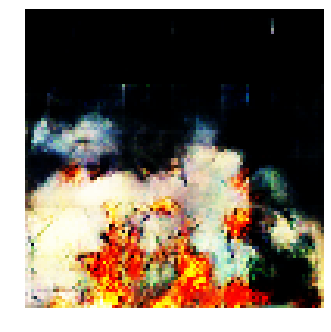


Epoch: 11560, D: -6.333, G: 4.333
Epoch: 11561, D: -5.074, G: 4.301
Epoch: 11562, D: -7.168, G: 4.17
Epoch: 11563, D: -6.947, G: 1.486
Epoch: 11564, D: -5.073, G: 4.235
Epoch: 11565, D: -6.272, G: 3.357
Epoch: 11566, D: -5.189, G: 2.66
Epoch: 11567, D: -5.733, G: 5.816
Epoch: 11568, D: -6.049, G: 2.487
Epoch: 11569, D: -6.426, G: 4.142
Epoch: 11570, D: -6.251, G: 4.344
Epoch: 11571, D: -7.5, G: 2.764
Epoch: 11572, D: -6.315, G: 4.312
Epoch: 11573, D: -6.416, G: 5.364
Epoch: 11574, D: -6.303, G: 6.235
Epoch: 11575, D: -6.69, G: 5.543
Epoch: 11576, D: -5.583, G: 2.605
Epoch: 11577, D: -6.296, G: 3.035
Epoch: 11578, D: -5.22, G: 3.333
Epoch: 11579, D: -5.496, G: 2.596


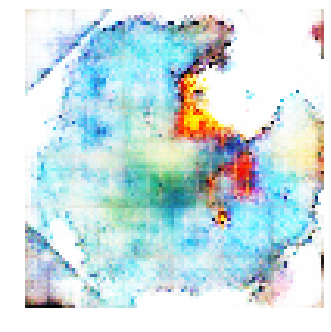


Epoch: 11580, D: -5.835, G: 3.194
Epoch: 11581, D: -6.81, G: 2.697
Epoch: 11582, D: -5.056, G: 3.436
Epoch: 11583, D: -6.629, G: 3.126
Epoch: 11584, D: -5.742, G: 4.349
Epoch: 11585, D: -6.486, G: 6.267
Epoch: 11586, D: -5.619, G: 3.833
Epoch: 11587, D: -5.385, G: 4.527
Epoch: 11588, D: -4.976, G: 6.047
Epoch: 11589, D: -5.841, G: 4.08
Epoch: 11590, D: -6.025, G: 2.809
Epoch: 11591, D: -6.282, G: 3.164
Epoch: 11592, D: -6.638, G: 2.357
Epoch: 11593, D: -7.402, G: 3.141
Epoch: 11594, D: -4.951, G: 3.107
Epoch: 11595, D: -5.168, G: 3.668
Epoch: 11596, D: -5.645, G: 6.513
Epoch: 11597, D: -7.404, G: 4.697
Epoch: 11598, D: -6.048, G: 4.799
Epoch: 11599, D: -5.302, G: 3.097


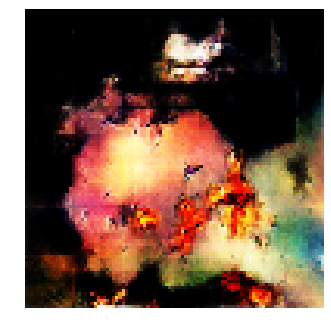


Epoch: 11600, D: -7.349, G: 5.48
Epoch: 11601, D: -5.86, G: 1.597
Epoch: 11602, D: -7.5, G: 5.526
Epoch: 11603, D: -6.176, G: 3.308
Epoch: 11604, D: -5.168, G: 3.481
Epoch: 11605, D: -5.234, G: 4.652
Epoch: 11606, D: -7.871, G: 3.761
Epoch: 11607, D: -5.835, G: 2.494
Epoch: 11608, D: -5.17, G: 6.085
Epoch: 11609, D: -6.537, G: 5.423
Epoch: 11610, D: -6.115, G: 4.505
Epoch: 11611, D: -5.497, G: 4.715
Epoch: 11612, D: -6.086, G: 1.257
Epoch: 11613, D: -4.314, G: 2.279
Epoch: 11614, D: -6.49, G: 3.364
Epoch: 11615, D: -5.73, G: 1.893
Epoch: 11616, D: -5.972, G: 2.491
Epoch: 11617, D: -6.055, G: 3.621
Epoch: 11618, D: -6.015, G: 3.49
Epoch: 11619, D: -5.873, G: 3.779


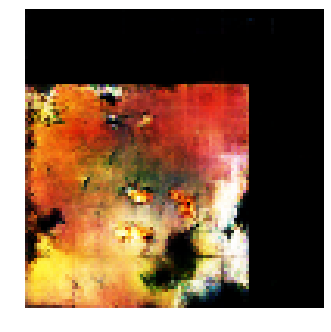


Epoch: 11620, D: -6.105, G: 2.092
Epoch: 11621, D: -5.645, G: 0.51
Epoch: 11622, D: -7.563, G: 0.9055
Epoch: 11623, D: -5.777, G: 3.788
Epoch: 11624, D: -4.711, G: 2.99
Epoch: 11625, D: -7.292, G: 1.903
Epoch: 11626, D: -4.22, G: 0.01056
Epoch: 11627, D: -6.485, G: 1.828
Epoch: 11628, D: -5.134, G: 1.362
Epoch: 11629, D: -5.339, G: 2.853
Epoch: 11630, D: -5.471, G: 3.387
Epoch: 11631, D: -5.178, G: 4.359
Epoch: 11632, D: -4.729, G: 4.933
Epoch: 11633, D: -7.206, G: 2.255
Epoch: 11634, D: -6.24, G: 4.137
Epoch: 11635, D: -6.191, G: 8.815
Epoch: 11636, D: -5.399, G: 5.202
Epoch: 11637, D: -6.789, G: 5.222
Epoch: 11638, D: -6.145, G: 3.019
Epoch: 11639, D: -5.714, G: 4.096


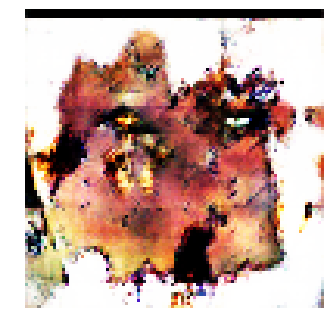


Epoch: 11640, D: -5.978, G: 3.931
Epoch: 11641, D: -5.53, G: 4.481
Epoch: 11642, D: -5.907, G: 2.838
Epoch: 11643, D: -7.141, G: 3.454
Epoch: 11644, D: -6.166, G: 4.796
Epoch: 11645, D: -5.738, G: 3.39
Epoch: 11646, D: -4.738, G: 4.684
Epoch: 11647, D: -6.178, G: 5.25
Epoch: 11648, D: -6.124, G: 4.286
Epoch: 11649, D: -6.024, G: 5.441
Epoch: 11650, D: -6.564, G: 4.365
Epoch: 11651, D: -5.825, G: 3.975
Epoch: 11652, D: -6.691, G: 3.942
Epoch: 11653, D: -5.454, G: 3.744
Epoch: 11654, D: -5.207, G: 1.532
Epoch: 11655, D: -4.609, G: 3.883
Epoch: 11656, D: -6.347, G: 4.329
Epoch: 11657, D: -6.277, G: 6.331
Epoch: 11658, D: -5.583, G: 3.796
Epoch: 11659, D: -5.177, G: 2.908


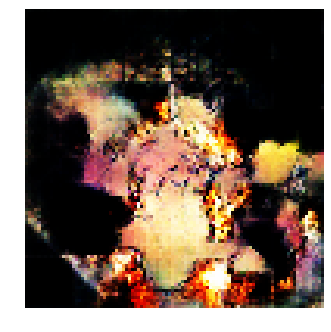


Epoch: 11660, D: -6.374, G: 2.106
Epoch: 11661, D: -5.474, G: 5.399
Epoch: 11662, D: -6.175, G: 3.367
Epoch: 11663, D: -5.697, G: 2.462
Epoch: 11664, D: -5.133, G: 2.749
Epoch: 11665, D: -7.336, G: 3.563
Epoch: 11666, D: -5.329, G: 5.422
Epoch: 11667, D: -6.329, G: 3.596
Epoch: 11668, D: -5.275, G: 4.22
Epoch: 11669, D: -7.449, G: 2.466
Epoch: 11670, D: -5.435, G: 3.755
Epoch: 11671, D: -6.724, G: 5.522
Epoch: 11672, D: -5.78, G: 3.061
Epoch: 11673, D: -7.06, G: 4.096
Epoch: 11674, D: -4.728, G: 3.022
Epoch: 11675, D: -4.874, G: 3.687
Epoch: 11676, D: -5.75, G: 4.678
Epoch: 11677, D: -5.007, G: 4.633
Epoch: 11678, D: -5.961, G: 5.414
Epoch: 11679, D: -5.261, G: 2.51


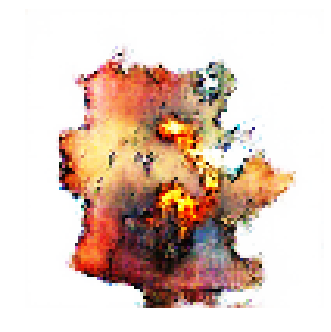


Epoch: 11680, D: -5.93, G: 4.739
Epoch: 11681, D: -6.344, G: 1.903
Epoch: 11682, D: -5.971, G: 2.932
Epoch: 11683, D: -5.836, G: 4.708
Epoch: 11684, D: -5.502, G: 1.469
Epoch: 11685, D: -5.562, G: 3.106
Epoch: 11686, D: -5.949, G: 2.809
Epoch: 11687, D: -7.175, G: 4.237
Epoch: 11688, D: -6.506, G: 1.004
Epoch: 11689, D: -6.515, G: 0.5095
Epoch: 11690, D: -6.984, G: 1.378
Epoch: 11691, D: -6.026, G: 5.105
Epoch: 11692, D: -6.306, G: 2.29
Epoch: 11693, D: -5.802, G: 4.594
Epoch: 11694, D: -6.342, G: 3.291
Epoch: 11695, D: -5.545, G: 4.981
Epoch: 11696, D: -6.071, G: 3.32
Epoch: 11697, D: -7.323, G: 3.299
Epoch: 11698, D: -5.807, G: 4.917
Epoch: 11699, D: -4.753, G: 5.129


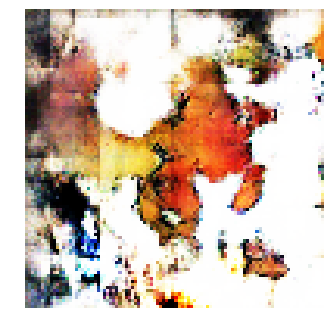


Epoch: 11700, D: -6.261, G: 4.401
Epoch: 11701, D: -5.783, G: 4.455
Epoch: 11702, D: -6.151, G: 2.892
Epoch: 11703, D: -7.576, G: 2.337
Epoch: 11704, D: -6.698, G: 3.466
Epoch: 11705, D: -4.148, G: 3.16
Epoch: 11706, D: -5.347, G: 3.894
Epoch: 11707, D: -6.284, G: 3.906
Epoch: 11708, D: -5.378, G: 4.505
Epoch: 11709, D: -5.886, G: 4.253
Epoch: 11710, D: -6.595, G: 3.665
Epoch: 11711, D: -6.015, G: 3.987
Epoch: 11712, D: -5.303, G: 5.818
Epoch: 11713, D: -5.471, G: 4.758
Epoch: 11714, D: -6.316, G: 6.417
Epoch: 11715, D: -6.821, G: 4.902
Epoch: 11716, D: -5.532, G: 5.608
Epoch: 11717, D: -6.138, G: 3.558
Epoch: 11718, D: -5.365, G: 2.01
Epoch: 11719, D: -4.46, G: 3.358


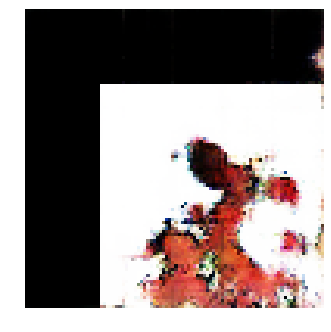


Epoch: 11720, D: -5.925, G: 1.593
Epoch: 11721, D: -6.591, G: 3.245
Epoch: 11722, D: -5.342, G: 4.045
Epoch: 11723, D: -6.072, G: 4.381
Epoch: 11724, D: -6.208, G: 5.419
Epoch: 11725, D: -5.868, G: 4.058
Epoch: 11726, D: -5.753, G: 2.141
Epoch: 11727, D: -5.453, G: 6.002
Epoch: 11728, D: -6.01, G: 2.356
Epoch: 11729, D: -5.957, G: 4.243
Epoch: 11730, D: -6.549, G: 3.974
Epoch: 11731, D: -5.388, G: 1.377
Epoch: 11732, D: -5.437, G: 3.942
Epoch: 11733, D: -6.992, G: 3.362
Epoch: 11734, D: -4.777, G: 4.788
Epoch: 11735, D: -5.825, G: 4.536
Epoch: 11736, D: -5.374, G: 5.715
Epoch: 11737, D: -4.371, G: 7.077
Epoch: 11738, D: -6.93, G: 4.558
Epoch: 11739, D: -6.421, G: 4.617


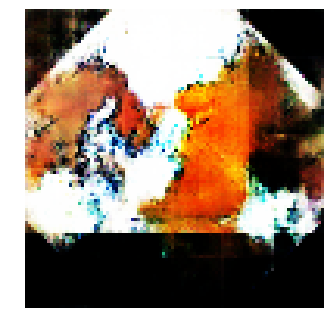


Epoch: 11740, D: -6.86, G: 4.195
Epoch: 11741, D: -5.175, G: 2.749
Epoch: 11742, D: -5.796, G: 4.575
Epoch: 11743, D: -6.837, G: 4.439
Epoch: 11744, D: -6.272, G: 6.558
Epoch: 11745, D: -6.854, G: 6.64
Epoch: 11746, D: -6.026, G: 3.388
Epoch: 11747, D: -6.11, G: 4.029
Epoch: 11748, D: -5.405, G: 4.365
Epoch: 11749, D: -7.331, G: 5.563
Epoch: 11750, D: -6.267, G: 1.941
Epoch: 11751, D: -5.111, G: 2.918
Epoch: 11752, D: -6.809, G: 5.8
Epoch: 11753, D: -7.319, G: 4.073
Epoch: 11754, D: -6.65, G: 3.073
Epoch: 11755, D: -5.645, G: 4.318
Epoch: 11756, D: -5.647, G: 3.95
Epoch: 11757, D: -6.222, G: 1.932
Epoch: 11758, D: -5.836, G: 3.434
Epoch: 11759, D: -5.416, G: 3.784


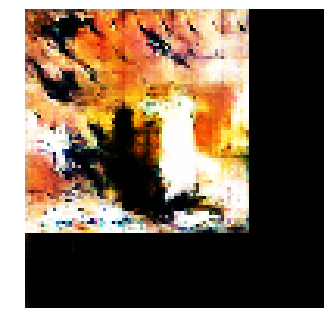


Epoch: 11760, D: -6.666, G: 4.06
Epoch: 11761, D: -5.439, G: 3.609
Epoch: 11762, D: -6.045, G: 3.871
Epoch: 11763, D: -5.272, G: 3.528
Epoch: 11764, D: -5.692, G: 3.953
Epoch: 11765, D: -5.974, G: 3.602
Epoch: 11766, D: -7.024, G: 5.147
Epoch: 11767, D: -6.25, G: 4.653
Epoch: 11768, D: -5.741, G: 3.955
Epoch: 11769, D: -6.184, G: 3.986
Epoch: 11770, D: -5.721, G: 2.58
Epoch: 11771, D: -6.523, G: 2.756
Epoch: 11772, D: -6.848, G: 5.596
Epoch: 11773, D: -5.497, G: 2.351
Epoch: 11774, D: -4.853, G: 4.058
Epoch: 11775, D: -6.55, G: 5.865
Epoch: 11776, D: -6.923, G: 2.12
Epoch: 11777, D: -6.821, G: 5.197
Epoch: 11778, D: -5.736, G: 3.174
Epoch: 11779, D: -7.127, G: 5.237


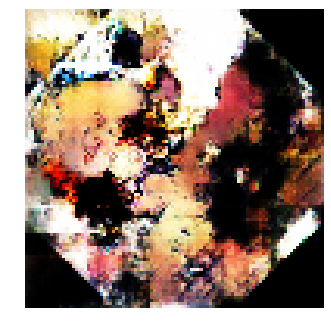


Epoch: 11780, D: -6.143, G: 3.333
Epoch: 11781, D: -6.395, G: 3.541
Epoch: 11782, D: -6.693, G: 3.832
Epoch: 11783, D: -7.397, G: 7.245
Epoch: 11784, D: -5.905, G: 5.95
Epoch: 11785, D: -4.795, G: 4.929
Epoch: 11786, D: -4.516, G: 3.321
Epoch: 11787, D: -6.158, G: 5.104
Epoch: 11788, D: -6.536, G: 5.213
Epoch: 11789, D: -5.618, G: 3.209
Epoch: 11790, D: -6.478, G: 3.64
Epoch: 11791, D: -5.667, G: 2.079
Epoch: 11792, D: -5.411, G: 1.616
Epoch: 11793, D: -5.622, G: 2.312
Epoch: 11794, D: -5.197, G: 0.9848
Epoch: 11795, D: -7.399, G: 2.118
Epoch: 11796, D: -5.354, G: 2.735
Epoch: 11797, D: -5.833, G: 4.297
Epoch: 11798, D: -6.802, G: 4.061
Epoch: 11799, D: -6.062, G: 0.8282


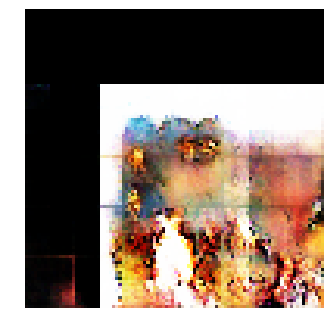


Epoch: 11800, D: -6.271, G: 3.163
Epoch: 11801, D: -5.176, G: 4.547
Epoch: 11802, D: -5.62, G: 4.085
Epoch: 11803, D: -7.031, G: 2.096
Epoch: 11804, D: -6.982, G: 3.982
Epoch: 11805, D: -6.873, G: 1.616
Epoch: 11806, D: -5.13, G: 4.592
Epoch: 11807, D: -6.635, G: 4.325
Epoch: 11808, D: -5.151, G: 2.114
Epoch: 11809, D: -5.154, G: 3.26
Epoch: 11810, D: -6.091, G: 2.909
Epoch: 11811, D: -7.95, G: 3.797
Epoch: 11812, D: -4.463, G: 3.098
Epoch: 11813, D: -6.807, G: 3.944
Epoch: 11814, D: -6.464, G: 5.001
Epoch: 11815, D: -6.158, G: 2.146
Epoch: 11816, D: -5.888, G: 3.471
Epoch: 11817, D: -7.239, G: 6.247
Epoch: 11818, D: -7.412, G: 4.044
Epoch: 11819, D: -6.098, G: 4.464


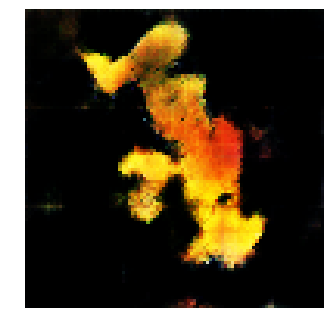


Epoch: 11820, D: -5.714, G: 1.279
Epoch: 11821, D: -6.826, G: 4.496
Epoch: 11822, D: -5.454, G: 4.355
Epoch: 11823, D: -5.609, G: 4.418
Epoch: 11824, D: -4.832, G: 4.672
Epoch: 11825, D: -6.28, G: 4.516
Epoch: 11826, D: -5.894, G: 3.054
Epoch: 11827, D: -6.589, G: 2.926
Epoch: 11828, D: -7.385, G: 3.363
Epoch: 11829, D: -5.159, G: 1.187
Epoch: 11830, D: -6.749, G: 4.22
Epoch: 11831, D: -5.916, G: 2.508
Epoch: 11832, D: -6.955, G: 4.611
Epoch: 11833, D: -6.146, G: 3.17
Epoch: 11834, D: -6.012, G: 3.037
Epoch: 11835, D: -5.751, G: 1.797
Epoch: 11836, D: -5.78, G: 5.556
Epoch: 11837, D: -6.737, G: 3.867
Epoch: 11838, D: -5.077, G: 4.68
Epoch: 11839, D: -6.339, G: 3.857


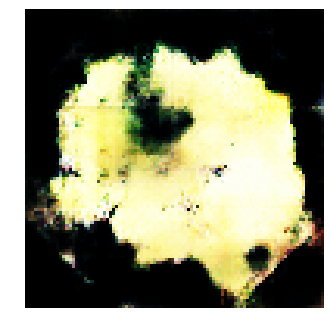


Epoch: 11840, D: -4.543, G: 5.416
Epoch: 11841, D: -5.964, G: 3.573
Epoch: 11842, D: -6.62, G: 2.711
Epoch: 11843, D: -5.289, G: 2.724
Epoch: 11844, D: -5.229, G: 2.874
Epoch: 11845, D: -6.034, G: 4.529
Epoch: 11846, D: -6.64, G: 0.784
Epoch: 11847, D: -5.572, G: 2.19
Epoch: 11848, D: -4.909, G: 2.381
Epoch: 11849, D: -6.122, G: 4.471
Epoch: 11850, D: -7.524, G: 5.576
Epoch: 11851, D: -6.594, G: 2.116
Epoch: 11852, D: -6.305, G: 5.831
Epoch: 11853, D: -5.924, G: 3.591
Epoch: 11854, D: -5.039, G: 3.252
Epoch: 11855, D: -6.438, G: 3.74
Epoch: 11856, D: -6.221, G: 5.041
Epoch: 11857, D: -5.682, G: 2.668
Epoch: 11858, D: -7.574, G: 4.577
Epoch: 11859, D: -6.534, G: 1.825


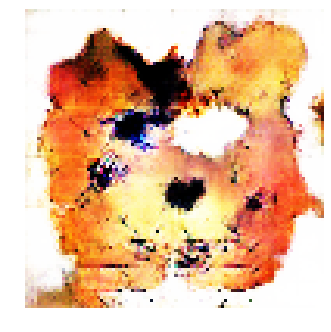


Epoch: 11860, D: -6.216, G: 5.068
Epoch: 11861, D: -4.664, G: 4.354
Epoch: 11862, D: -6.361, G: 5.464
Epoch: 11863, D: -5.5, G: 2.976
Epoch: 11864, D: -6.505, G: 4.667
Epoch: 11865, D: -5.497, G: 6.078
Epoch: 11866, D: -6.452, G: 1.759
Epoch: 11867, D: -5.075, G: 1.832
Epoch: 11868, D: -5.365, G: 3.277
Epoch: 11869, D: -6.529, G: 4.387
Epoch: 11870, D: -5.773, G: 3.596
Epoch: 11871, D: -7.029, G: 4.684
Epoch: 11872, D: -6.751, G: 4.314
Epoch: 11873, D: -6.379, G: 3.962
Epoch: 11874, D: -5.128, G: 3.755
Epoch: 11875, D: -5.392, G: 5.433
Epoch: 11876, D: -5.8, G: 4.262
Epoch: 11877, D: -5.078, G: 4.129
Epoch: 11878, D: -6.669, G: 3.839
Epoch: 11879, D: -5.448, G: 3.684


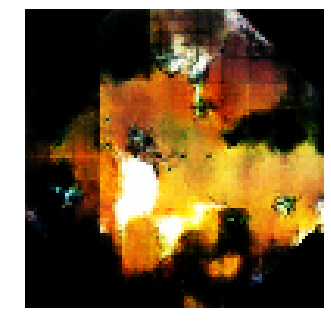


Epoch: 11880, D: -6.651, G: 4.066
Epoch: 11881, D: -6.249, G: 2.468
Epoch: 11882, D: -7.438, G: 3.702
Epoch: 11883, D: -6.201, G: 1.975
Epoch: 11884, D: -6.334, G: 5.283
Epoch: 11885, D: -5.586, G: 2.873
Epoch: 11886, D: -5.539, G: 5.547
Epoch: 11887, D: -6.482, G: 1.474
Epoch: 11888, D: -6.537, G: 2.085
Epoch: 11889, D: -5.612, G: 5.018
Epoch: 11890, D: -6.775, G: 4.442
Epoch: 11891, D: -6.618, G: 5.131
Epoch: 11892, D: -5.974, G: 4.188
Epoch: 11893, D: -6.797, G: 4.167
Epoch: 11894, D: -5.991, G: 2.986
Epoch: 11895, D: -5.873, G: 5.335
Epoch: 11896, D: -6.073, G: 3.358
Epoch: 11897, D: -8.031, G: 4.167
Epoch: 11898, D: -6.433, G: 4.392
Epoch: 11899, D: -6.247, G: 2.616


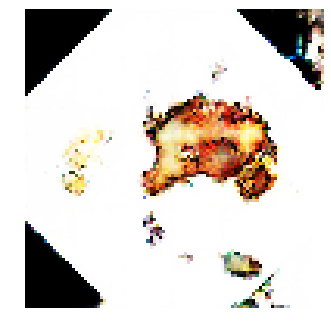


Epoch: 11900, D: -5.286, G: 4.102
Epoch: 11901, D: -6.794, G: 1.881
Epoch: 11902, D: -4.943, G: 4.097
Epoch: 11903, D: -5.397, G: 3.461
Epoch: 11904, D: -6.152, G: 2.357
Epoch: 11905, D: -5.328, G: 3.18
Epoch: 11906, D: -5.641, G: 2.927
Epoch: 11907, D: -6.738, G: 3.516
Epoch: 11908, D: -6.23, G: 5.303
Epoch: 11909, D: -6.126, G: 2.429
Epoch: 11910, D: -6.226, G: 4.232
Epoch: 11911, D: -5.608, G: 5.504
Epoch: 11912, D: -5.413, G: 3.332
Epoch: 11913, D: -6.166, G: 2.771
Epoch: 11914, D: -6.527, G: 4.318
Epoch: 11915, D: -6.992, G: 3.285
Epoch: 11916, D: -5.898, G: 5.314
Epoch: 11917, D: -5.862, G: 4.252
Epoch: 11918, D: -6.556, G: 5.511
Epoch: 11919, D: -6.596, G: 4.594


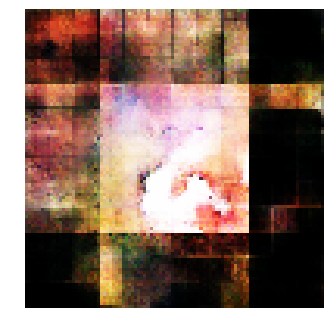


Epoch: 11920, D: -5.031, G: 5.417
Epoch: 11921, D: -4.549, G: 2.291
Epoch: 11922, D: -5.984, G: 3.805
Epoch: 11923, D: -6.467, G: 3.669
Epoch: 11924, D: -5.769, G: 4.209
Epoch: 11925, D: -6.922, G: 2.814
Epoch: 11926, D: -6.025, G: 4.727
Epoch: 11927, D: -5.222, G: 1.488
Epoch: 11928, D: -7.495, G: 3.318
Epoch: 11929, D: -7.033, G: 4.701
Epoch: 11930, D: -5.92, G: 5.141
Epoch: 11931, D: -6.182, G: 0.6142
Epoch: 11932, D: -6.711, G: 1.696
Epoch: 11933, D: -6.133, G: 3.151
Epoch: 11934, D: -6.571, G: 1.958
Epoch: 11935, D: -6.134, G: 3.595
Epoch: 11936, D: -6.907, G: 2.291
Epoch: 11937, D: -7.77, G: 2.998
Epoch: 11938, D: -5.494, G: 3.374
Epoch: 11939, D: -5.013, G: 2.797


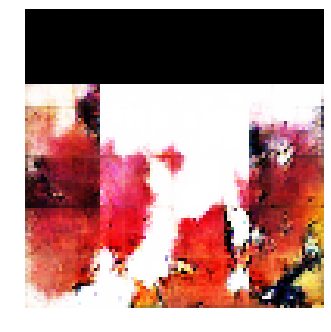


Epoch: 11940, D: -5.99, G: 3.803
Epoch: 11941, D: -5.195, G: 5.644
Epoch: 11942, D: -7.034, G: 4.679
Epoch: 11943, D: -6.661, G: 6.491
Epoch: 11944, D: -6.174, G: 3.104
Epoch: 11945, D: -7.346, G: 3.586
Epoch: 11946, D: -6.127, G: 2.702
Epoch: 11947, D: -6.194, G: 6.533
Epoch: 11948, D: -7.197, G: 3.138
Epoch: 11949, D: -5.477, G: 2.873
Epoch: 11950, D: -5.861, G: 2.619
Epoch: 11951, D: -6.495, G: 3.504
Epoch: 11952, D: -7.145, G: 6.942
Epoch: 11953, D: -4.788, G: 4.34
Epoch: 11954, D: -6.191, G: 1.488
Epoch: 11955, D: -6.589, G: 4.474
Epoch: 11956, D: -6.797, G: 4.124
Epoch: 11957, D: -6.153, G: 7.262
Epoch: 11958, D: -4.906, G: 3.464
Epoch: 11959, D: -5.873, G: 5.404


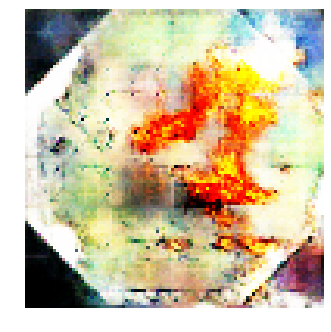


Epoch: 11960, D: -6.356, G: 2.102
Epoch: 11961, D: -5.325, G: 3.955
Epoch: 11962, D: -5.794, G: 2.209
Epoch: 11963, D: -7.082, G: 5.127
Epoch: 11964, D: -6.827, G: 2.713
Epoch: 11965, D: -6.252, G: 2.973
Epoch: 11966, D: -5.407, G: 3.901
Epoch: 11967, D: -6.901, G: 4.648
Epoch: 11968, D: -7.716, G: 3.637
Epoch: 11969, D: -5.359, G: 3.428
Epoch: 11970, D: -5.522, G: 2.466
Epoch: 11971, D: -6.059, G: 3.665
Epoch: 11972, D: -5.367, G: 5.708
Epoch: 11973, D: -5.318, G: 3.56
Epoch: 11974, D: -5.279, G: 2.564
Epoch: 11975, D: -7.107, G: 2.739
Epoch: 11976, D: -6.343, G: 1.49
Epoch: 11977, D: -6.965, G: 4.525
Epoch: 11978, D: -6.49, G: 3.212
Epoch: 11979, D: -5.403, G: 5.651


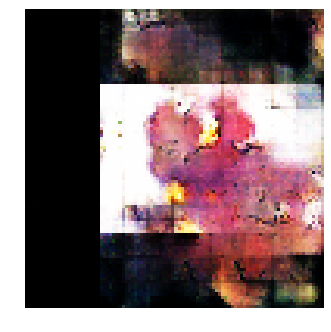


Epoch: 11980, D: -6.993, G: 4.769
Epoch: 11981, D: -6.372, G: 3.609
Epoch: 11982, D: -6.488, G: 4.502
Epoch: 11983, D: -6.179, G: 2.135
Epoch: 11984, D: -6.345, G: 2.436
Epoch: 11985, D: -5.708, G: 3.613
Epoch: 11986, D: -5.973, G: 3.173
Epoch: 11987, D: -7.107, G: 4.426
Epoch: 11988, D: -5.744, G: 2.598
Epoch: 11989, D: -5.733, G: 4.482
Epoch: 11990, D: -5.554, G: 2.657
Epoch: 11991, D: -6.376, G: 3.672
Epoch: 11992, D: -5.534, G: 4.782
Epoch: 11993, D: -5.116, G: 4.422
Epoch: 11994, D: -6.458, G: 2.712
Epoch: 11995, D: -6.363, G: 4.081
Epoch: 11996, D: -6.492, G: 3.675
Epoch: 11997, D: -5.922, G: 2.006
Epoch: 11998, D: -5.273, G: 3.233
Epoch: 11999, D: -5.977, G: 4.042


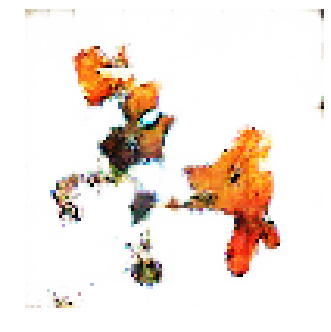


Epoch: 12000, D: -6.722, G: 3.9
Epoch: 12001, D: -4.939, G: 4.453
Epoch: 12002, D: -6.111, G: 5.562
Epoch: 12003, D: -6.381, G: 5.962
Epoch: 12004, D: -4.395, G: 5.417
Epoch: 12005, D: -5.94, G: 2.986
Epoch: 12006, D: -5.718, G: 5.243
Epoch: 12007, D: -5.818, G: 3.754
Epoch: 12008, D: -7.359, G: 5.291
Epoch: 12009, D: -6.06, G: 3.492
Epoch: 12010, D: -5.28, G: 4.204
Epoch: 12011, D: -6.156, G: 4.561
Epoch: 12012, D: -7.325, G: 5.586
Epoch: 12013, D: -6.213, G: 2.184
Epoch: 12014, D: -6.941, G: 4.105
Epoch: 12015, D: -5.399, G: 3.952
Epoch: 12016, D: -6.146, G: 4.645
Epoch: 12017, D: -5.165, G: 4.949
Epoch: 12018, D: -7.078, G: 5.554
Epoch: 12019, D: -5.817, G: 2.31


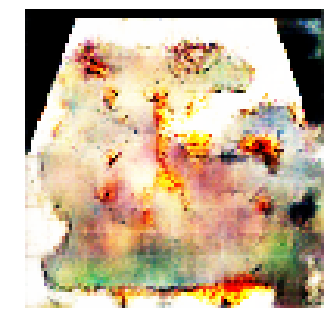


Epoch: 12020, D: -3.989, G: 4.374
Epoch: 12021, D: -4.965, G: 2.769
Epoch: 12022, D: -5.157, G: 3.174
Epoch: 12023, D: -5.671, G: 4.161
Epoch: 12024, D: -6.882, G: 3.821
Epoch: 12025, D: -5.138, G: 3.999
Epoch: 12026, D: -4.857, G: 5.028
Epoch: 12027, D: -5.629, G: 4.911
Epoch: 12028, D: -5.944, G: 2.637
Epoch: 12029, D: -7.143, G: 1.028
Epoch: 12030, D: -5.956, G: 2.586
Epoch: 12031, D: -6.223, G: 5.059
Epoch: 12032, D: -6.01, G: 2.968
Epoch: 12033, D: -5.462, G: 5.765
Epoch: 12034, D: -6.945, G: 3.182
Epoch: 12035, D: -5.916, G: 4.764
Epoch: 12036, D: -5.994, G: 5.854
Epoch: 12037, D: -6.254, G: 4.491
Epoch: 12038, D: -6.081, G: 3.995
Epoch: 12039, D: -5.711, G: 5.292


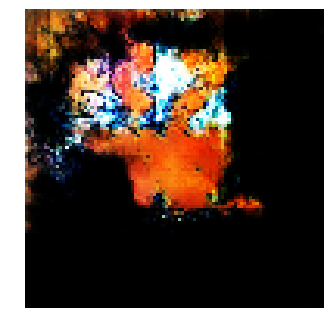


Epoch: 12040, D: -6.053, G: 3.498
Epoch: 12041, D: -5.658, G: 2.591
Epoch: 12042, D: -6.265, G: 4.213
Epoch: 12043, D: -6.789, G: 5.253
Epoch: 12044, D: -6.146, G: 3.377
Epoch: 12045, D: -5.481, G: 3.804
Epoch: 12046, D: -6.266, G: 7.586
Epoch: 12047, D: -6.016, G: 3.913
Epoch: 12048, D: -5.916, G: 4.195
Epoch: 12049, D: -6.021, G: 6.255
Epoch: 12050, D: -5.348, G: 1.506
Epoch: 12051, D: -5.747, G: 1.867
Epoch: 12052, D: -5.015, G: 2.796
Epoch: 12053, D: -5.143, G: 2.525
Epoch: 12054, D: -5.323, G: 3.361
Epoch: 12055, D: -6.525, G: 4.526
Epoch: 12056, D: -5.978, G: 1.775
Epoch: 12057, D: -6.415, G: 3.063
Epoch: 12058, D: -7.053, G: 2.234
Epoch: 12059, D: -5.243, G: 2.929


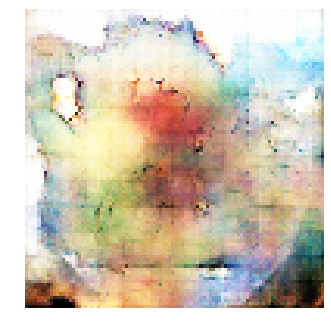


Epoch: 12060, D: -7.364, G: 4.172
Epoch: 12061, D: -5.661, G: 4.127
Epoch: 12062, D: -6.034, G: 3.117
Epoch: 12063, D: -7.316, G: 4.72
Epoch: 12064, D: -4.483, G: 3.377
Epoch: 12065, D: -6.302, G: 3.994
Epoch: 12066, D: -7.32, G: 2.684
Epoch: 12067, D: -5.944, G: 3.534
Epoch: 12068, D: -5.261, G: 3.681
Epoch: 12069, D: -5.391, G: 3.639
Epoch: 12070, D: -6.23, G: 2.943
Epoch: 12071, D: -7.02, G: 5.116
Epoch: 12072, D: -6.268, G: 3.06
Epoch: 12073, D: -5.768, G: 2.635
Epoch: 12074, D: -6.447, G: 3.939
Epoch: 12075, D: -5.543, G: 3.936
Epoch: 12076, D: -6.16, G: 3.077
Epoch: 12077, D: -6.093, G: 4.123
Epoch: 12078, D: -5.435, G: 3.089
Epoch: 12079, D: -7.396, G: 3.34


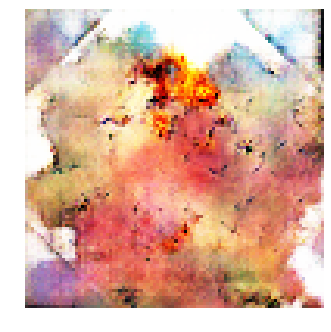


Epoch: 12080, D: -5.487, G: 3.423
Epoch: 12081, D: -6.829, G: 4.548
Epoch: 12082, D: -6.727, G: 4.638
Epoch: 12083, D: -5.03, G: 4.683
Epoch: 12084, D: -6.673, G: 4.337
Epoch: 12085, D: -6.18, G: 4.069
Epoch: 12086, D: -5.739, G: 3.518
Epoch: 12087, D: -6.097, G: 3.15
Epoch: 12088, D: -7.212, G: 1.23
Epoch: 12089, D: -6.537, G: 3.656
Epoch: 12090, D: -5.035, G: 4.099
Epoch: 12091, D: -5.273, G: 2.45
Epoch: 12092, D: -5.255, G: 3.818
Epoch: 12093, D: -5.179, G: 3.753
Epoch: 12094, D: -5.48, G: 5.034
Epoch: 12095, D: -7.485, G: 6.074
Epoch: 12096, D: -6.309, G: 2.144
Epoch: 12097, D: -5.527, G: 2.09
Epoch: 12098, D: -6.011, G: -0.07112
Epoch: 12099, D: -6.715, G: -0.6019


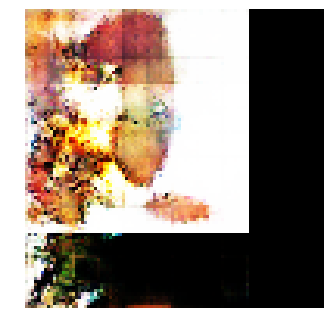


Epoch: 12100, D: -6.197, G: 5.957
Epoch: 12101, D: -4.918, G: 3.962
Epoch: 12102, D: -5.113, G: 4.203
Epoch: 12103, D: -6.299, G: 4.593
Epoch: 12104, D: -4.664, G: 3.124
Epoch: 12105, D: -5.795, G: 4.32
Epoch: 12106, D: -6.007, G: 3.448
Epoch: 12107, D: -6.914, G: 5.114
Epoch: 12108, D: -7.748, G: 4.949
Epoch: 12109, D: -5.646, G: 3.015
Epoch: 12110, D: -5.923, G: 4.191
Epoch: 12111, D: -6.28, G: 8.147
Epoch: 12112, D: -5.284, G: 5.101
Epoch: 12113, D: -5.762, G: 4.883
Epoch: 12114, D: -6.236, G: 1.596
Epoch: 12115, D: -5.929, G: 5.236
Epoch: 12116, D: -6.428, G: 1.648
Epoch: 12117, D: -6.08, G: 4.308
Epoch: 12118, D: -6.422, G: 3.014
Epoch: 12119, D: -5.901, G: 4.44


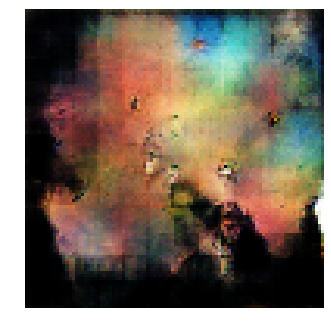


Epoch: 12120, D: -6.427, G: 6.9
Epoch: 12121, D: -6.069, G: 3.712
Epoch: 12122, D: -5.074, G: 3.441
Epoch: 12123, D: -6.637, G: 4.447
Epoch: 12124, D: -6.541, G: 3.257
Epoch: 12125, D: -5.179, G: 3.413
Epoch: 12126, D: -6.015, G: 3.611
Epoch: 12127, D: -5.889, G: 2.379
Epoch: 12128, D: -6.623, G: 3.275
Epoch: 12129, D: -5.106, G: 4.082
Epoch: 12130, D: -6.24, G: 4.269
Epoch: 12131, D: -4.606, G: 5.213
Epoch: 12132, D: -6.539, G: 4.317
Epoch: 12133, D: -6.773, G: 5.339
Epoch: 12134, D: -6.578, G: 2.754
Epoch: 12135, D: -6.87, G: 5.847
Epoch: 12136, D: -5.837, G: 4.727
Epoch: 12137, D: -6.053, G: 2.509
Epoch: 12138, D: -6.208, G: 3.372
Epoch: 12139, D: -5.396, G: 3.686


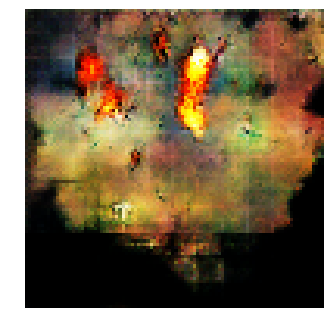


Epoch: 12140, D: -5.229, G: 5.04
Epoch: 12141, D: -5.471, G: 5.4
Epoch: 12142, D: -6.301, G: 5.642
Epoch: 12143, D: -6.586, G: 3.858
Epoch: 12144, D: -6.483, G: 1.861
Epoch: 12145, D: -5.96, G: 3.082
Epoch: 12146, D: -5.411, G: 2.366
Epoch: 12147, D: -6.007, G: 4.113
Epoch: 12148, D: -5.966, G: 4.26
Epoch: 12149, D: -6.739, G: 4.454
Epoch: 12150, D: -5.783, G: 4.612
Epoch: 12151, D: -6.604, G: 2.91
Epoch: 12152, D: -6.468, G: 5.087
Epoch: 12153, D: -5.778, G: 3.072
Epoch: 12154, D: -5.685, G: 3.431
Epoch: 12155, D: -6.506, G: 4.098
Epoch: 12156, D: -6.218, G: 3.457
Epoch: 12157, D: -5.858, G: 4.639
Epoch: 12158, D: -7.288, G: 4.928
Epoch: 12159, D: -5.415, G: 2.938


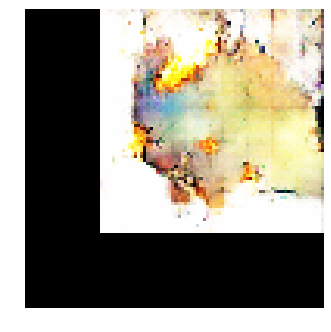


Epoch: 12160, D: -5.575, G: 4.986
Epoch: 12161, D: -6.214, G: 1.202
Epoch: 12162, D: -6.255, G: 3.518
Epoch: 12163, D: -7.143, G: 5.423
Epoch: 12164, D: -6.196, G: 5.766
Epoch: 12165, D: -6.201, G: 4.356
Epoch: 12166, D: -7.018, G: 3.483
Epoch: 12167, D: -5.844, G: 1.885
Epoch: 12168, D: -6.637, G: 1.122
Epoch: 12169, D: -6.713, G: 4.199
Epoch: 12170, D: -6.621, G: 5.503
Epoch: 12171, D: -5.823, G: 1.422
Epoch: 12172, D: -6.698, G: 4.118
Epoch: 12173, D: -5.711, G: 3.643
Epoch: 12174, D: -6.304, G: 4.263
Epoch: 12175, D: -6.477, G: 5.63
Epoch: 12176, D: -5.03, G: 5.814
Epoch: 12177, D: -4.745, G: 3.897
Epoch: 12178, D: -6.446, G: 2.944
Epoch: 12179, D: -5.993, G: 3.93


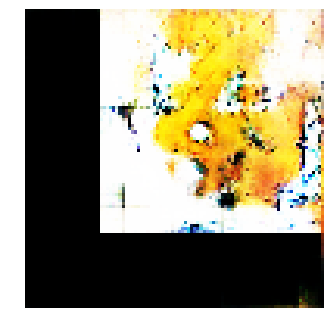


Epoch: 12180, D: -5.099, G: 3.846
Epoch: 12181, D: -5.842, G: 3.464
Epoch: 12182, D: -5.088, G: 3.323
Epoch: 12183, D: -5.885, G: 5.105
Epoch: 12184, D: -6.7, G: 3.595
Epoch: 12185, D: -5.442, G: 3.603
Epoch: 12186, D: -6.822, G: 3.958
Epoch: 12187, D: -5.978, G: 3.985
Epoch: 12188, D: -5.427, G: 4.119
Epoch: 12189, D: -7.604, G: 2.556
Epoch: 12190, D: -6.383, G: 4.634
Epoch: 12191, D: -5.634, G: 2.939
Epoch: 12192, D: -4.518, G: 4.306
Epoch: 12193, D: -5.873, G: 5.806
Epoch: 12194, D: -5.443, G: 4.178
Epoch: 12195, D: -6.771, G: 3.825
Epoch: 12196, D: -5.421, G: 4.459
Epoch: 12197, D: -7.491, G: 2.944
Epoch: 12198, D: -5.667, G: 5.56
Epoch: 12199, D: -6.412, G: 2.984


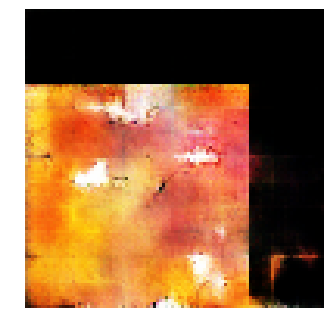


Epoch: 12200, D: -6.402, G: 4.099
Epoch: 12201, D: -5.722, G: 3.361
Epoch: 12202, D: -5.274, G: 2.355
Epoch: 12203, D: -6.655, G: 4.189
Epoch: 12204, D: -6.455, G: 4.881
Epoch: 12205, D: -5.646, G: 4.86
Epoch: 12206, D: -7.739, G: 4.516
Epoch: 12207, D: -5.736, G: 0.9321
Epoch: 12208, D: -6.015, G: 3.774
Epoch: 12209, D: -5.201, G: 4.004
Epoch: 12210, D: -8.134, G: 3.676
Epoch: 12211, D: -6.689, G: 5.202
Epoch: 12212, D: -4.779, G: 3.062
Epoch: 12213, D: -5.26, G: 4.505
Epoch: 12214, D: -6.774, G: 4.406
Epoch: 12215, D: -6.465, G: 0.3135
Epoch: 12216, D: -5.315, G: 5.088
Epoch: 12217, D: -4.909, G: 4.454
Epoch: 12218, D: -6.709, G: 3.165
Epoch: 12219, D: -5.148, G: 3.636


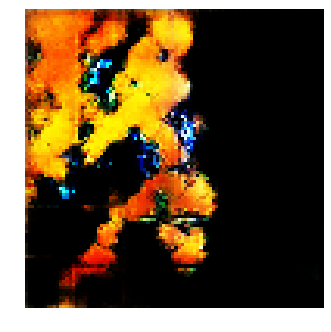


Epoch: 12220, D: -6.374, G: 1.883
Epoch: 12221, D: -6.913, G: 3.001
Epoch: 12222, D: -5.255, G: 5.03
Epoch: 12223, D: -5.747, G: 3.854
Epoch: 12224, D: -6.161, G: 3.314
Epoch: 12225, D: -6.255, G: 3.31
Epoch: 12226, D: -6.646, G: 3.849
Epoch: 12227, D: -5.496, G: 3.139
Epoch: 12228, D: -6.679, G: 3.678
Epoch: 12229, D: -5.657, G: 5.2
Epoch: 12230, D: -5.425, G: 2.95
Epoch: 12231, D: -6.087, G: 3.696
Epoch: 12232, D: -5.621, G: 3.701
Epoch: 12233, D: -5.743, G: 3.179
Epoch: 12234, D: -6.601, G: 4.001
Epoch: 12235, D: -6.269, G: 2.581
Epoch: 12236, D: -6.275, G: 5.656
Epoch: 12237, D: -5.978, G: 2.328
Epoch: 12238, D: -5.175, G: 3.978
Epoch: 12239, D: -5.25, G: 3.366


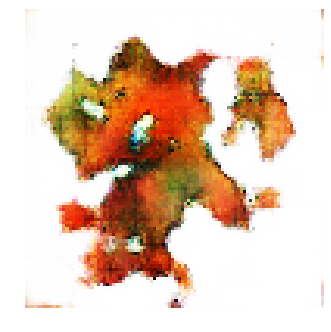


Epoch: 12240, D: -6.693, G: 5.205
Epoch: 12241, D: -6.407, G: 2.614
Epoch: 12242, D: -5.528, G: 6.887
Epoch: 12243, D: -6.078, G: 5.803
Epoch: 12244, D: -5.336, G: 3.405
Epoch: 12245, D: -6.741, G: 3.372
Epoch: 12246, D: -5.19, G: 6.222
Epoch: 12247, D: -5.221, G: 5.983
Epoch: 12248, D: -7.11, G: 3.896
Epoch: 12249, D: -4.41, G: 4.805
Epoch: 12250, D: -6.052, G: 5.234
Epoch: 12251, D: -6.09, G: 5.321
Epoch: 12252, D: -6.363, G: 3.158
Epoch: 12253, D: -6.887, G: 1.455
Epoch: 12254, D: -6.479, G: 1.786
Epoch: 12255, D: -6.178, G: 4.414
Epoch: 12256, D: -6.58, G: 3.136
Epoch: 12257, D: -7.766, G: 1.401
Epoch: 12258, D: -5.513, G: 5.98
Epoch: 12259, D: -6.028, G: 2.307


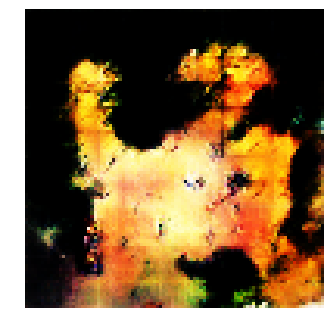


Epoch: 12260, D: -4.483, G: 3.326
Epoch: 12261, D: -6.641, G: 6.496
Epoch: 12262, D: -5.387, G: 3.184
Epoch: 12263, D: -5.648, G: 1.902
Epoch: 12264, D: -6.142, G: 3.391
Epoch: 12265, D: -5.969, G: 3.346
Epoch: 12266, D: -6.947, G: 4.062
Epoch: 12267, D: -7.199, G: 6.916
Epoch: 12268, D: -4.853, G: 5.356
Epoch: 12269, D: -5.479, G: 2.204
Epoch: 12270, D: -6.412, G: 5.209
Epoch: 12271, D: -5.489, G: 3.287
Epoch: 12272, D: -5.207, G: 4.667
Epoch: 12273, D: -7.842, G: 3.672
Epoch: 12274, D: -5.798, G: 1.765
Epoch: 12275, D: -5.527, G: 4.575
Epoch: 12276, D: -4.757, G: 4.481
Epoch: 12277, D: -6.747, G: 2.597
Epoch: 12278, D: -5.739, G: 4.062
Epoch: 12279, D: -6.643, G: 4.063


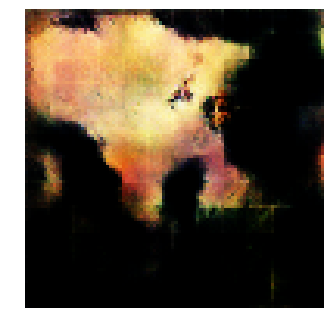


Epoch: 12280, D: -6.311, G: 1.913
Epoch: 12281, D: -6.202, G: 2.839
Epoch: 12282, D: -5.43, G: 6.058
Epoch: 12283, D: -4.844, G: 3.392
Epoch: 12284, D: -5.827, G: 3.638
Epoch: 12285, D: -6.355, G: 3.686
Epoch: 12286, D: -5.801, G: 2.94
Epoch: 12287, D: -6.355, G: 1.457
Epoch: 12288, D: -5.599, G: 1.179
Epoch: 12289, D: -5.962, G: 4.858
Epoch: 12290, D: -4.48, G: 4.68
Epoch: 12291, D: -7.15, G: 4.225
Epoch: 12292, D: -5.869, G: 3.787
Epoch: 12293, D: -5.724, G: 3.486
Epoch: 12294, D: -7.355, G: 5.491
Epoch: 12295, D: -6.58, G: 2.106
Epoch: 12296, D: -6.445, G: 2.3
Epoch: 12297, D: -7.081, G: 4.001
Epoch: 12298, D: -6.527, G: 3.522
Epoch: 12299, D: -6.65, G: 3.758


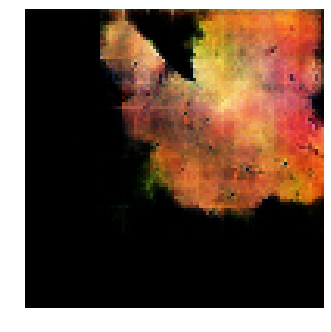


Epoch: 12300, D: -4.988, G: 6.898
Epoch: 12301, D: -7.004, G: 3.713
Epoch: 12302, D: -4.977, G: 5.289
Epoch: 12303, D: -4.74, G: 2.295
Epoch: 12304, D: -5.488, G: 7.171
Epoch: 12305, D: -6.495, G: 3.802
Epoch: 12306, D: -6.127, G: 2.475
Epoch: 12307, D: -5.471, G: 3.55
Epoch: 12308, D: -5.592, G: 4.541
Epoch: 12309, D: -5.351, G: 4.19
Epoch: 12310, D: -5.523, G: 2.703
Epoch: 12311, D: -5.381, G: 7.849
Epoch: 12312, D: -5.916, G: 6.599
Epoch: 12313, D: -5.489, G: 3.59
Epoch: 12314, D: -5.675, G: 3.515
Epoch: 12315, D: -6.011, G: 4.934
Epoch: 12316, D: -7.025, G: 2.838
Epoch: 12317, D: -6.527, G: 3.984
Epoch: 12318, D: -5.554, G: 4.738
Epoch: 12319, D: -6.887, G: 4.57


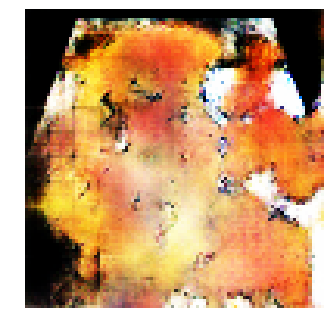


Epoch: 12320, D: -5.929, G: 6.681
Epoch: 12321, D: -6.363, G: 5.752
Epoch: 12322, D: -7.434, G: 3.523
Epoch: 12323, D: -6.198, G: -2.291
Epoch: 12324, D: -6.089, G: 1.205
Epoch: 12325, D: -6.53, G: 3.925
Epoch: 12326, D: -6.542, G: 2.903
Epoch: 12327, D: -6.336, G: 2.007
Epoch: 12328, D: -6.002, G: 2.093
Epoch: 12329, D: -6.555, G: 4.922
Epoch: 12330, D: -4.206, G: 3.018
Epoch: 12331, D: -5.978, G: 2.299
Epoch: 12332, D: -5.209, G: 4.496
Epoch: 12333, D: -5.656, G: 4.387
Epoch: 12334, D: -5.788, G: 3.97
Epoch: 12335, D: -4.735, G: 2.996
Epoch: 12336, D: -4.6, G: 5.121
Epoch: 12337, D: -5.981, G: 1.855
Epoch: 12338, D: -6.521, G: 4.329
Epoch: 12339, D: -5.977, G: 1.714


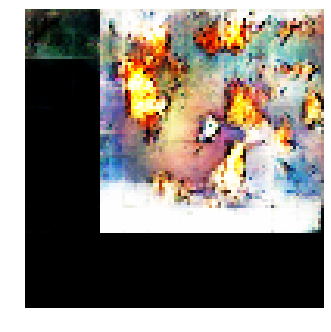


Epoch: 12340, D: -6.739, G: 1.947
Epoch: 12341, D: -4.949, G: 1.52
Epoch: 12342, D: -6.306, G: 2.972
Epoch: 12343, D: -4.989, G: 4.631
Epoch: 12344, D: -4.497, G: 4.746
Epoch: 12345, D: -5.749, G: 1.953
Epoch: 12346, D: -6.924, G: 3.744
Epoch: 12347, D: -6.551, G: 5.567
Epoch: 12348, D: -6.852, G: 3.821
Epoch: 12349, D: -6.096, G: 2.456
Epoch: 12350, D: -6.55, G: 3.594
Epoch: 12351, D: -4.622, G: 3.815
Epoch: 12352, D: -5.338, G: 4.497
Epoch: 12353, D: -7.838, G: 3.088
Epoch: 12354, D: -6.867, G: 3.181
Epoch: 12355, D: -5.539, G: 2.196
Epoch: 12356, D: -5.206, G: 3.825
Epoch: 12357, D: -7.768, G: 2.21
Epoch: 12358, D: -7.071, G: 2.572
Epoch: 12359, D: -6.9, G: 2.426


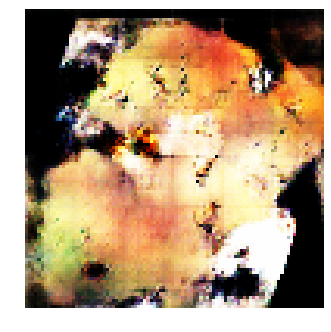


Epoch: 12360, D: -7.039, G: 3.575
Epoch: 12361, D: -4.747, G: 2.764
Epoch: 12362, D: -5.577, G: 4.042
Epoch: 12363, D: -6.327, G: 3.192
Epoch: 12364, D: -6.25, G: 3.773
Epoch: 12365, D: -6.235, G: 4.315
Epoch: 12366, D: -6.04, G: 4.136
Epoch: 12367, D: -7.166, G: 5.081
Epoch: 12368, D: -4.832, G: 2.516
Epoch: 12369, D: -7.026, G: 6.217
Epoch: 12370, D: -6.733, G: 3.561
Epoch: 12371, D: -4.89, G: 4.32
Epoch: 12372, D: -6.388, G: 2.839
Epoch: 12373, D: -7.679, G: 5.418
Epoch: 12374, D: -4.502, G: 8.72
Epoch: 12375, D: -5.428, G: 2.419
Epoch: 12376, D: -4.862, G: 4.544
Epoch: 12377, D: -6.194, G: 6.106
Epoch: 12378, D: -7.341, G: 5.049
Epoch: 12379, D: -6.291, G: 4.949


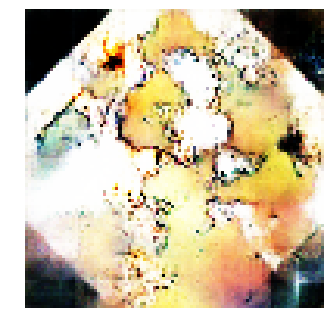


Epoch: 12380, D: -6.613, G: 6.972
Epoch: 12381, D: -6.691, G: 5.248
Epoch: 12382, D: -5.983, G: 4.12
Epoch: 12383, D: -6.391, G: 3.877
Epoch: 12384, D: -6.611, G: 2.306
Epoch: 12385, D: -5.724, G: 5.398
Epoch: 12386, D: -5.463, G: 3.897
Epoch: 12387, D: -6.105, G: 2.219
Epoch: 12388, D: -6.201, G: 4.269
Epoch: 12389, D: -5.774, G: 3.385
Epoch: 12390, D: -7.017, G: 2.922
Epoch: 12391, D: -7.203, G: 1.759
Epoch: 12392, D: -6.57, G: 5.709
Epoch: 12393, D: -6.713, G: 6.675
Epoch: 12394, D: -6.617, G: 5.629
Epoch: 12395, D: -5.026, G: 5.41
Epoch: 12396, D: -6.639, G: 5.372
Epoch: 12397, D: -5.581, G: 5.43
Epoch: 12398, D: -6.29, G: 3.419
Epoch: 12399, D: -6.197, G: 6.95


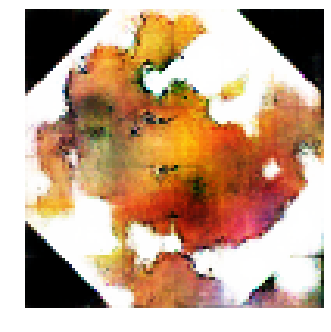


Epoch: 12400, D: -6.435, G: 3.626
Epoch: 12401, D: -6.052, G: 5.08
Epoch: 12402, D: -6.012, G: 3.597
Epoch: 12403, D: -5.63, G: 4.606
Epoch: 12404, D: -6.114, G: 5.939
Epoch: 12405, D: -5.347, G: 1.816
Epoch: 12406, D: -5.834, G: 5.772
Epoch: 12407, D: -5.644, G: 3.283
Epoch: 12408, D: -5.14, G: 2.732
Epoch: 12409, D: -7.482, G: 5.22
Epoch: 12410, D: -5.864, G: 3.216
Epoch: 12411, D: -6.665, G: 1.707
Epoch: 12412, D: -5.585, G: 4.281
Epoch: 12413, D: -6.339, G: 2.545
Epoch: 12414, D: -6.163, G: 3.008
Epoch: 12415, D: -6.047, G: 4.886
Epoch: 12416, D: -5.798, G: 5.895
Epoch: 12417, D: -5.212, G: 2.215
Epoch: 12418, D: -5.533, G: 5.627
Epoch: 12419, D: -5.37, G: 2.734


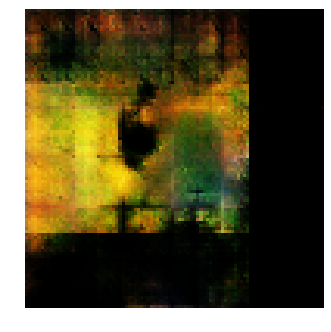


Epoch: 12420, D: -6.126, G: 2.016
Epoch: 12421, D: -5.999, G: 2.261
Epoch: 12422, D: -6.62, G: 3.634
Epoch: 12423, D: -3.917, G: 4.832
Epoch: 12424, D: -7.315, G: 2.725
Epoch: 12425, D: -6.719, G: 2.621
Epoch: 12426, D: -6.295, G: 1.173
Epoch: 12427, D: -6.302, G: 3.749
Epoch: 12428, D: -6.274, G: 4.67
Epoch: 12429, D: -6.889, G: 3.876
Epoch: 12430, D: -6.067, G: 1.481
Epoch: 12431, D: -5.115, G: 2.263
Epoch: 12432, D: -4.752, G: 3.985
Epoch: 12433, D: -6.356, G: 8.48
Epoch: 12434, D: -6.665, G: 5.316
Epoch: 12435, D: -6.758, G: 4.381
Epoch: 12436, D: -5.802, G: 2.146
Epoch: 12437, D: -4.579, G: 4.645
Epoch: 12438, D: -6.124, G: 3.45
Epoch: 12439, D: -7.382, G: 3.067


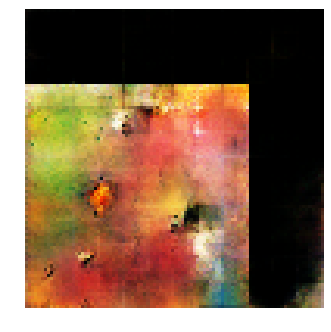


Epoch: 12440, D: -5.097, G: 5.671
Epoch: 12441, D: -4.836, G: 2.193
Epoch: 12442, D: -5.751, G: 3.293
Epoch: 12443, D: -6.467, G: 3.088
Epoch: 12444, D: -5.268, G: 4.914
Epoch: 12445, D: -6.691, G: 6.135
Epoch: 12446, D: -6.258, G: 4.812
Epoch: 12447, D: -5.736, G: 4.894
Epoch: 12448, D: -6.654, G: 4.724
Epoch: 12449, D: -5.666, G: 5.123
Epoch: 12450, D: -6.794, G: 4.177
Epoch: 12451, D: -5.112, G: 2.425
Epoch: 12452, D: -6.31, G: 2.785
Epoch: 12453, D: -4.956, G: -0.0867
Epoch: 12454, D: -6.137, G: 4.945
Epoch: 12455, D: -7.05, G: 5.178
Epoch: 12456, D: -5.653, G: 2.046
Epoch: 12457, D: -5.844, G: 5.567
Epoch: 12458, D: -5.13, G: 2.346
Epoch: 12459, D: -4.836, G: 4.0


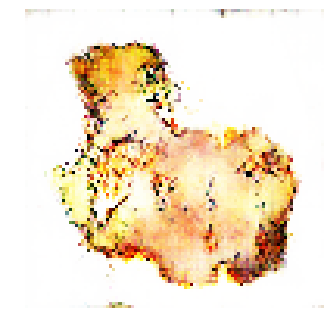


Epoch: 12460, D: -5.116, G: 3.294
Epoch: 12461, D: -4.328, G: 2.785
Epoch: 12462, D: -6.319, G: 1.458
Epoch: 12463, D: -6.772, G: 4.784
Epoch: 12464, D: -5.089, G: 2.253
Epoch: 12465, D: -7.444, G: 3.596
Epoch: 12466, D: -6.874, G: 0.9734
Epoch: 12467, D: -5.37, G: 2.697
Epoch: 12468, D: -6.511, G: 3.919
Epoch: 12469, D: -5.627, G: 4.866
Epoch: 12470, D: -5.334, G: 3.018
Epoch: 12471, D: -6.941, G: 4.336
Epoch: 12472, D: -5.995, G: 5.559
Epoch: 12473, D: -5.558, G: 4.554
Epoch: 12474, D: -6.235, G: 3.294
Epoch: 12475, D: -6.432, G: 3.57
Epoch: 12476, D: -4.775, G: 3.61
Epoch: 12477, D: -5.005, G: 4.025
Epoch: 12478, D: -6.308, G: 2.2
Epoch: 12479, D: -6.429, G: 1.541


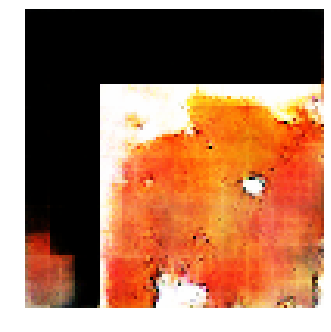


Epoch: 12480, D: -4.233, G: 4.735
Epoch: 12481, D: -5.365, G: 3.8
Epoch: 12482, D: -6.069, G: 5.073
Epoch: 12483, D: -5.715, G: 5.197
Epoch: 12484, D: -5.53, G: 3.384
Epoch: 12485, D: -5.25, G: 3.173
Epoch: 12486, D: -6.076, G: 3.981
Epoch: 12487, D: -6.054, G: 4.549
Epoch: 12488, D: -6.326, G: 3.732
Epoch: 12489, D: -6.779, G: 5.758
Epoch: 12490, D: -6.422, G: 4.62
Epoch: 12491, D: -6.23, G: 2.607
Epoch: 12492, D: -6.003, G: 3.311
Epoch: 12493, D: -6.396, G: 1.351
Epoch: 12494, D: -6.673, G: 2.19
Epoch: 12495, D: -5.738, G: 4.703
Epoch: 12496, D: -4.59, G: 3.698
Epoch: 12497, D: -5.335, G: 4.957
Epoch: 12498, D: -6.029, G: 5.197
Epoch: 12499, D: -5.46, G: 5.088


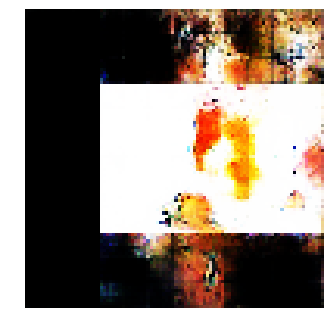


Epoch: 12500, D: -6.633, G: 4.134
Epoch: 12501, D: -5.272, G: 3.828
Epoch: 12502, D: -6.209, G: 3.365
Epoch: 12503, D: -6.756, G: 3.712
Epoch: 12504, D: -6.193, G: 3.763
Epoch: 12505, D: -5.514, G: 3.3
Epoch: 12506, D: -5.758, G: 3.588
Epoch: 12507, D: -7.509, G: 4.171
Epoch: 12508, D: -5.721, G: 4.473
Epoch: 12509, D: -6.828, G: 3.487
Epoch: 12510, D: -5.383, G: 2.886
Epoch: 12511, D: -5.237, G: -0.03192
Epoch: 12512, D: -6.374, G: 3.977
Epoch: 12513, D: -6.922, G: 1.746
Epoch: 12514, D: -6.677, G: 3.566
Epoch: 12515, D: -5.702, G: 2.571
Epoch: 12516, D: -5.164, G: 4.738
Epoch: 12517, D: -5.562, G: 3.791
Epoch: 12518, D: -6.32, G: 4.665
Epoch: 12519, D: -5.551, G: 3.712


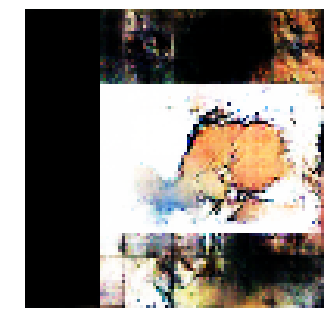


Epoch: 12520, D: -6.393, G: 6.143
Epoch: 12521, D: -7.709, G: 4.258
Epoch: 12522, D: -5.696, G: 7.259
Epoch: 12523, D: -6.153, G: 4.271
Epoch: 12524, D: -6.183, G: 3.407
Epoch: 12525, D: -5.129, G: 5.901
Epoch: 12526, D: -4.647, G: 4.743
Epoch: 12527, D: -6.597, G: 3.907
Epoch: 12528, D: -5.313, G: 4.124
Epoch: 12529, D: -7.007, G: 3.587
Epoch: 12530, D: -5.836, G: 4.632
Epoch: 12531, D: -7.226, G: 4.042
Epoch: 12532, D: -6.479, G: 2.65
Epoch: 12533, D: -5.363, G: 5.209
Epoch: 12534, D: -7.455, G: 3.459
Epoch: 12535, D: -7.176, G: 5.269
Epoch: 12536, D: -5.426, G: 4.631
Epoch: 12537, D: -4.615, G: 4.524
Epoch: 12538, D: -7.32, G: 3.186
Epoch: 12539, D: -6.099, G: 5.312


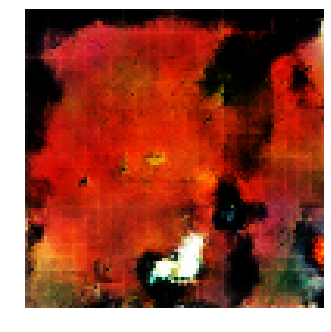


Epoch: 12540, D: -7.027, G: 3.46
Epoch: 12541, D: -5.808, G: 4.559
Epoch: 12542, D: -6.637, G: 3.771
Epoch: 12543, D: -5.812, G: 4.959
Epoch: 12544, D: -6.657, G: 4.131
Epoch: 12545, D: -4.906, G: 4.442
Epoch: 12546, D: -5.635, G: 3.416
Epoch: 12547, D: -5.209, G: 2.311
Epoch: 12548, D: -6.528, G: 6.14
Epoch: 12549, D: -5.672, G: 3.9
Epoch: 12550, D: -6.487, G: 2.852
Epoch: 12551, D: -7.199, G: 5.54
Epoch: 12552, D: -5.927, G: 2.86
Epoch: 12553, D: -5.92, G: 4.362
Epoch: 12554, D: -6.207, G: 3.82
Epoch: 12555, D: -4.785, G: 5.389
Epoch: 12556, D: -5.966, G: 4.902
Epoch: 12557, D: -7.248, G: 4.684
Epoch: 12558, D: -4.869, G: 7.547
Epoch: 12559, D: -6.128, G: 7.067


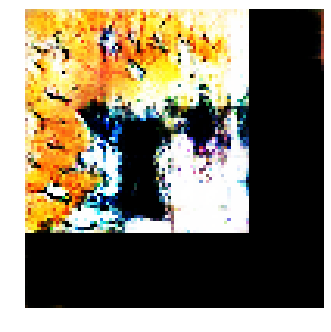


Epoch: 12560, D: -7.308, G: 4.988
Epoch: 12561, D: -5.482, G: 3.517
Epoch: 12562, D: -6.208, G: 3.15
Epoch: 12563, D: -5.187, G: 3.407
Epoch: 12564, D: -5.287, G: 5.507
Epoch: 12565, D: -6.007, G: 6.736
Epoch: 12566, D: -6.004, G: 4.393
Epoch: 12567, D: -6.595, G: 4.738
Epoch: 12568, D: -6.339, G: 5.216
Epoch: 12569, D: -5.025, G: 2.884
Epoch: 12570, D: -6.444, G: 6.195
Epoch: 12571, D: -6.114, G: 4.271
Epoch: 12572, D: -7.176, G: 2.68
Epoch: 12573, D: -6.602, G: 2.301
Epoch: 12574, D: -5.384, G: 2.717
Epoch: 12575, D: -6.012, G: 3.971
Epoch: 12576, D: -5.983, G: 3.992
Epoch: 12577, D: -6.4, G: 4.738
Epoch: 12578, D: -5.637, G: 6.145
Epoch: 12579, D: -5.705, G: 2.815


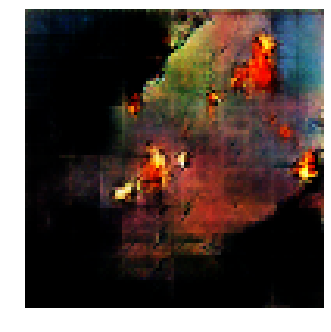


Epoch: 12580, D: -5.838, G: 3.245
Epoch: 12581, D: -6.015, G: 2.747
Epoch: 12582, D: -7.384, G: 3.872
Epoch: 12583, D: -5.665, G: 0.2784
Epoch: 12584, D: -6.179, G: 2.453
Epoch: 12585, D: -6.174, G: 2.951
Epoch: 12586, D: -5.686, G: 1.179
Epoch: 12587, D: -5.858, G: 1.588
Epoch: 12588, D: -4.785, G: 1.887
Epoch: 12589, D: -5.181, G: 1.242
Epoch: 12590, D: -5.446, G: 3.62
Epoch: 12591, D: -5.044, G: 4.856
Epoch: 12592, D: -4.991, G: 3.359
Epoch: 12593, D: -6.252, G: 3.283
Epoch: 12594, D: -5.484, G: 5.716
Epoch: 12595, D: -5.741, G: 6.421
Epoch: 12596, D: -4.858, G: 5.28
Epoch: 12597, D: -5.234, G: 3.628
Epoch: 12598, D: -5.925, G: 4.163
Epoch: 12599, D: -6.301, G: 3.726


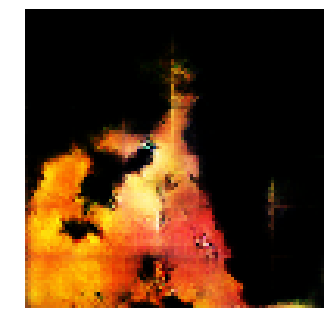


Epoch: 12600, D: -5.236, G: 2.399
Epoch: 12601, D: -6.634, G: 2.91
Epoch: 12602, D: -7.34, G: 4.771
Epoch: 12603, D: -5.794, G: 4.125
Epoch: 12604, D: -6.379, G: 3.85
Epoch: 12605, D: -7.34, G: 5.686
Epoch: 12606, D: -6.589, G: 0.9076
Epoch: 12607, D: -5.642, G: 2.273
Epoch: 12608, D: -6.135, G: 3.936
Epoch: 12609, D: -7.195, G: 5.422
Epoch: 12610, D: -6.185, G: 2.793
Epoch: 12611, D: -6.299, G: 6.107
Epoch: 12612, D: -6.319, G: 7.153
Epoch: 12613, D: -5.535, G: 5.68
Epoch: 12614, D: -6.934, G: 3.897
Epoch: 12615, D: -6.379, G: 4.618
Epoch: 12616, D: -6.428, G: 3.714
Epoch: 12617, D: -5.399, G: 1.997
Epoch: 12618, D: -6.155, G: 3.137
Epoch: 12619, D: -5.326, G: 3.536


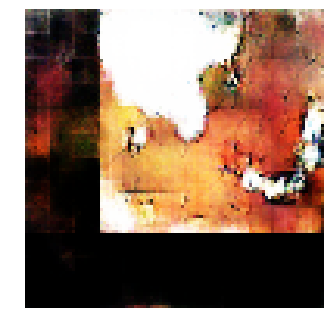


Epoch: 12620, D: -5.685, G: 2.243
Epoch: 12621, D: -4.83, G: 2.726
Epoch: 12622, D: -6.067, G: 5.637
Epoch: 12623, D: -6.399, G: 4.389
Epoch: 12624, D: -5.518, G: 5.794
Epoch: 12625, D: -5.616, G: 2.348
Epoch: 12626, D: -5.975, G: 5.798
Epoch: 12627, D: -7.153, G: 4.664
Epoch: 12628, D: -6.193, G: 0.7824
Epoch: 12629, D: -6.504, G: 3.479
Epoch: 12630, D: -6.491, G: 4.769
Epoch: 12631, D: -7.196, G: 2.301
Epoch: 12632, D: -6.922, G: 3.702
Epoch: 12633, D: -5.754, G: 6.073
Epoch: 12634, D: -5.319, G: 4.693
Epoch: 12635, D: -5.526, G: 5.505
Epoch: 12636, D: -5.13, G: 3.254
Epoch: 12637, D: -6.107, G: 3.257
Epoch: 12638, D: -4.432, G: 4.833
Epoch: 12639, D: -4.432, G: 4.779


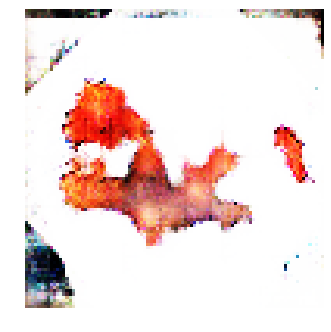


Epoch: 12640, D: -6.165, G: 5.129
Epoch: 12641, D: -7.53, G: 2.101
Epoch: 12642, D: -5.628, G: 2.339
Epoch: 12643, D: -5.713, G: 5.999
Epoch: 12644, D: -5.73, G: 3.314
Epoch: 12645, D: -6.267, G: 4.286
Epoch: 12646, D: -5.561, G: 2.622
Epoch: 12647, D: -6.889, G: 2.371
Epoch: 12648, D: -5.651, G: 4.203
Epoch: 12649, D: -5.971, G: 4.091
Epoch: 12650, D: -5.995, G: 5.292
Epoch: 12651, D: -5.514, G: 3.531
Epoch: 12652, D: -5.468, G: 3.213
Epoch: 12653, D: -5.484, G: 6.348
Epoch: 12654, D: -4.698, G: 1.651
Epoch: 12655, D: -6.365, G: 3.042
Epoch: 12656, D: -6.377, G: 2.709
Epoch: 12657, D: -5.861, G: 1.867
Epoch: 12658, D: -6.49, G: 2.128
Epoch: 12659, D: -5.133, G: 1.802


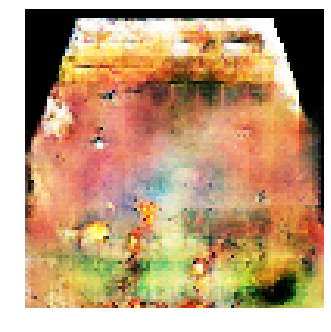


Epoch: 12660, D: -7.142, G: 3.833
Epoch: 12661, D: -5.939, G: 3.417
Epoch: 12662, D: -6.079, G: 2.461
Epoch: 12663, D: -5.877, G: 4.495
Epoch: 12664, D: -6.163, G: 3.486
Epoch: 12665, D: -5.568, G: 2.04
Epoch: 12666, D: -6.37, G: 6.226
Epoch: 12667, D: -5.753, G: 2.87
Epoch: 12668, D: -5.601, G: 4.813
Epoch: 12669, D: -4.708, G: 4.308
Epoch: 12670, D: -5.696, G: 4.451
Epoch: 12671, D: -5.704, G: 4.609
Epoch: 12672, D: -6.454, G: 5.026
Epoch: 12673, D: -6.544, G: 4.716
Epoch: 12674, D: -6.803, G: 1.762
Epoch: 12675, D: -5.784, G: 2.186
Epoch: 12676, D: -5.726, G: 4.57
Epoch: 12677, D: -6.383, G: 4.026
Epoch: 12678, D: -6.984, G: 1.959
Epoch: 12679, D: -6.7, G: 4.23


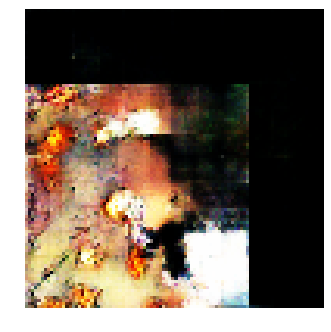


Epoch: 12680, D: -7.359, G: 3.559
Epoch: 12681, D: -5.316, G: 1.607
Epoch: 12682, D: -5.682, G: 3.304
Epoch: 12683, D: -5.377, G: 5.481
Epoch: 12684, D: -6.265, G: 5.807
Epoch: 12685, D: -6.917, G: 1.914
Epoch: 12686, D: -6.123, G: 6.895
Epoch: 12687, D: -5.075, G: 5.379
Epoch: 12688, D: -5.732, G: 2.745
Epoch: 12689, D: -6.123, G: 3.585
Epoch: 12690, D: -6.216, G: 1.947
Epoch: 12691, D: -5.613, G: 3.222
Epoch: 12692, D: -4.428, G: 4.905
Epoch: 12693, D: -6.514, G: 2.394
Epoch: 12694, D: -6.365, G: 2.786
Epoch: 12695, D: -4.854, G: 2.611
Epoch: 12696, D: -5.854, G: 4.163
Epoch: 12697, D: -5.749, G: 1.21
Epoch: 12698, D: -6.533, G: 1.298
Epoch: 12699, D: -6.959, G: 1.197


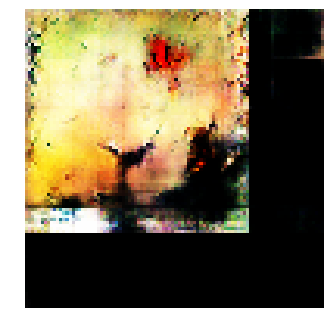


Epoch: 12700, D: -5.442, G: 3.77
Epoch: 12701, D: -5.664, G: 2.694
Epoch: 12702, D: -6.246, G: 1.925
Epoch: 12703, D: -6.455, G: 1.929
Epoch: 12704, D: -5.694, G: 3.446
Epoch: 12705, D: -6.469, G: 4.607
Epoch: 12706, D: -4.378, G: 5.008
Epoch: 12707, D: -5.908, G: 3.892
Epoch: 12708, D: -5.979, G: 4.672
Epoch: 12709, D: -5.258, G: 3.539
Epoch: 12710, D: -5.833, G: 1.997
Epoch: 12711, D: -5.99, G: 3.297
Epoch: 12712, D: -7.322, G: 4.863
Epoch: 12713, D: -6.554, G: 5.492
Epoch: 12714, D: -6.307, G: 4.71
Epoch: 12715, D: -5.151, G: 5.601
Epoch: 12716, D: -5.922, G: 2.64
Epoch: 12717, D: -6.224, G: 4.594
Epoch: 12718, D: -5.628, G: 2.542
Epoch: 12719, D: -6.907, G: 3.34


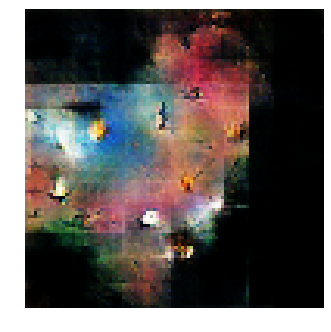


Epoch: 12720, D: -5.531, G: 1.674
Epoch: 12721, D: -7.053, G: 4.694
Epoch: 12722, D: -5.651, G: 2.612
Epoch: 12723, D: -4.931, G: 2.599
Epoch: 12724, D: -3.909, G: 5.56
Epoch: 12725, D: -6.13, G: 5.627
Epoch: 12726, D: -5.214, G: 2.594
Epoch: 12727, D: -5.483, G: 3.458
Epoch: 12728, D: -6.686, G: 3.671
Epoch: 12729, D: -5.602, G: 2.184
Epoch: 12730, D: -6.148, G: 5.464
Epoch: 12731, D: -6.33, G: 0.9585
Epoch: 12732, D: -5.007, G: 6.312
Epoch: 12733, D: -6.571, G: 5.058
Epoch: 12734, D: -5.141, G: 5.551
Epoch: 12735, D: -6.063, G: 3.931
Epoch: 12736, D: -6.253, G: 3.293
Epoch: 12737, D: -4.648, G: 4.78
Epoch: 12738, D: -6.171, G: 2.552
Epoch: 12739, D: -5.304, G: 4.538


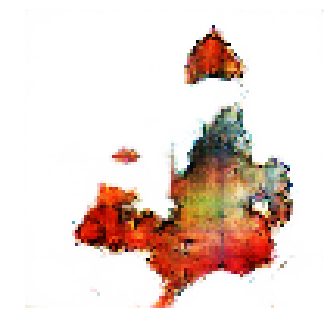


Epoch: 12740, D: -5.766, G: 1.566
Epoch: 12741, D: -6.398, G: 4.409
Epoch: 12742, D: -6.309, G: 2.364
Epoch: 12743, D: -6.137, G: 2.649
Epoch: 12744, D: -5.361, G: 3.336
Epoch: 12745, D: -5.529, G: 2.893
Epoch: 12746, D: -5.693, G: 1.983
Epoch: 12747, D: -5.242, G: 4.777
Epoch: 12748, D: -5.989, G: 4.08
Epoch: 12749, D: -6.146, G: 3.303
Epoch: 12750, D: -6.194, G: 3.444
Epoch: 12751, D: -5.907, G: 3.22
Epoch: 12752, D: -6.092, G: 2.535
Epoch: 12753, D: -6.07, G: 3.916
Epoch: 12754, D: -5.041, G: 8.218
Epoch: 12755, D: -6.445, G: 5.292
Epoch: 12756, D: -5.008, G: 3.889
Epoch: 12757, D: -5.861, G: 3.706
Epoch: 12758, D: -6.285, G: 3.178
Epoch: 12759, D: -6.207, G: 3.73


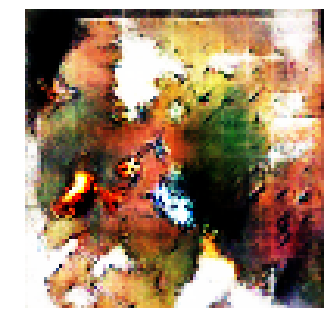


Epoch: 12760, D: -6.06, G: 3.958
Epoch: 12761, D: -4.468, G: 3.694
Epoch: 12762, D: -7.131, G: 4.276
Epoch: 12763, D: -6.512, G: 4.685
Epoch: 12764, D: -5.341, G: 2.981
Epoch: 12765, D: -5.805, G: 4.104
Epoch: 12766, D: -5.827, G: 4.909
Epoch: 12767, D: -6.179, G: 3.333
Epoch: 12768, D: -5.314, G: 2.978
Epoch: 12769, D: -5.65, G: 3.869
Epoch: 12770, D: -6.741, G: 2.761
Epoch: 12771, D: -7.445, G: 2.369
Epoch: 12772, D: -5.744, G: 5.181
Epoch: 12773, D: -6.004, G: 5.851
Epoch: 12774, D: -4.525, G: 4.315
Epoch: 12775, D: -6.147, G: 3.218
Epoch: 12776, D: -7.5, G: 3.191
Epoch: 12777, D: -5.68, G: 6.483
Epoch: 12778, D: -7.476, G: 1.563
Epoch: 12779, D: -5.721, G: -7.869e-05


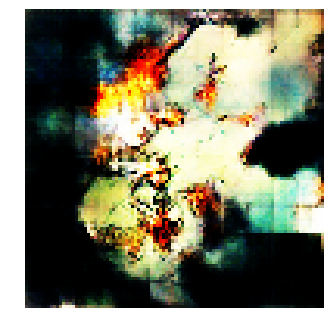


Epoch: 12780, D: -7.267, G: 4.211
Epoch: 12781, D: -6.437, G: 3.035
Epoch: 12782, D: -5.389, G: 3.856
Epoch: 12783, D: -6.449, G: 3.716
Epoch: 12784, D: -6.353, G: 1.67
Epoch: 12785, D: -6.041, G: 1.583
Epoch: 12786, D: -6.574, G: 4.24
Epoch: 12787, D: -6.733, G: 4.071
Epoch: 12788, D: -4.743, G: 4.056
Epoch: 12789, D: -5.605, G: 0.8283
Epoch: 12790, D: -6.381, G: 2.026
Epoch: 12791, D: -4.303, G: 4.633
Epoch: 12792, D: -5.823, G: 2.952
Epoch: 12793, D: -6.496, G: 3.304
Epoch: 12794, D: -5.263, G: 3.708
Epoch: 12795, D: -6.826, G: 4.375
Epoch: 12796, D: -6.606, G: 1.987
Epoch: 12797, D: -5.947, G: 2.936
Epoch: 12798, D: -5.363, G: 2.154
Epoch: 12799, D: -5.765, G: 6.494


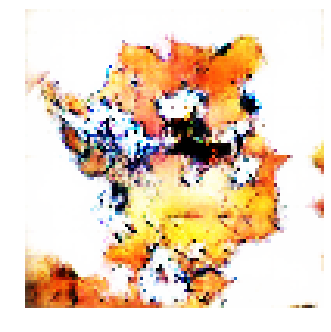


Epoch: 12800, D: -5.91, G: 2.745
Epoch: 12801, D: -6.389, G: 2.512
Epoch: 12802, D: -6.383, G: 5.681
Epoch: 12803, D: -6.803, G: 1.841
Epoch: 12804, D: -7.147, G: 3.015
Epoch: 12805, D: -6.393, G: 5.85
Epoch: 12806, D: -7.032, G: 4.21
Epoch: 12807, D: -7.638, G: 4.292
Epoch: 12808, D: -6.51, G: 2.096
Epoch: 12809, D: -5.379, G: 3.495
Epoch: 12810, D: -6.753, G: 6.282
Epoch: 12811, D: -4.286, G: 4.07
Epoch: 12812, D: -4.693, G: 5.029
Epoch: 12813, D: -6.359, G: 5.008
Epoch: 12814, D: -5.572, G: 3.78
Epoch: 12815, D: -6.342, G: 1.794
Epoch: 12816, D: -5.638, G: 3.408
Epoch: 12817, D: -7.086, G: 5.152
Epoch: 12818, D: -6.894, G: 2.854
Epoch: 12819, D: -5.647, G: 2.394


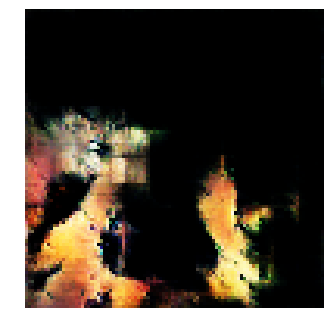


Epoch: 12820, D: -5.424, G: 4.544
Epoch: 12821, D: -6.007, G: 4.436
Epoch: 12822, D: -6.729, G: 3.861
Epoch: 12823, D: -6.131, G: 4.169
Epoch: 12824, D: -5.258, G: 5.086
Epoch: 12825, D: -6.503, G: 3.599
Epoch: 12826, D: -5.492, G: 2.33
Epoch: 12827, D: -4.391, G: 1.633
Epoch: 12828, D: -5.909, G: 3.273
Epoch: 12829, D: -6.002, G: 2.164
Epoch: 12830, D: -6.197, G: 3.962
Epoch: 12831, D: -6.603, G: 5.035
Epoch: 12832, D: -7.974, G: 4.796
Epoch: 12833, D: -6.404, G: 2.506
Epoch: 12834, D: -6.743, G: 5.488
Epoch: 12835, D: -5.931, G: 5.308
Epoch: 12836, D: -6.246, G: 6.04
Epoch: 12837, D: -7.582, G: 2.842
Epoch: 12838, D: -5.778, G: 1.796
Epoch: 12839, D: -5.424, G: 3.863


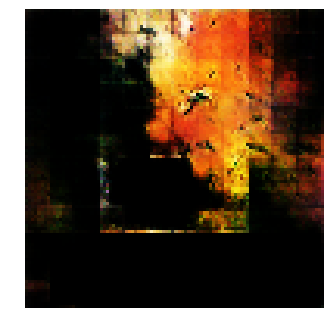


Epoch: 12840, D: -6.61, G: 3.967
Epoch: 12841, D: -6.485, G: 5.581
Epoch: 12842, D: -5.732, G: 4.173
Epoch: 12843, D: -7.499, G: 5.816
Epoch: 12844, D: -6.775, G: 5.724
Epoch: 12845, D: -5.284, G: 5.882
Epoch: 12846, D: -5.793, G: 5.973
Epoch: 12847, D: -6.391, G: 5.321
Epoch: 12848, D: -7.26, G: 3.909
Epoch: 12849, D: -6.71, G: 2.471
Epoch: 12850, D: -6.174, G: 3.561
Epoch: 12851, D: -7.123, G: 4.132
Epoch: 12852, D: -6.981, G: 4.124
Epoch: 12853, D: -5.638, G: 0.8373
Epoch: 12854, D: -5.873, G: 3.633
Epoch: 12855, D: -6.224, G: 4.729
Epoch: 12856, D: -6.85, G: 3.771
Epoch: 12857, D: -6.031, G: 2.506
Epoch: 12858, D: -5.487, G: 1.836
Epoch: 12859, D: -7.046, G: 4.914


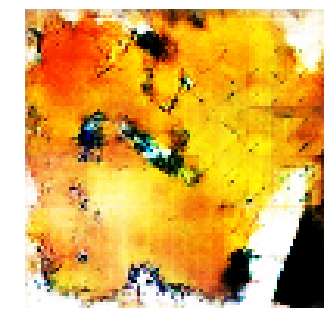


Epoch: 12860, D: -6.361, G: 3.977
Epoch: 12861, D: -5.97, G: 4.358
Epoch: 12862, D: -7.634, G: 2.963
Epoch: 12863, D: -6.2, G: 0.06113
Epoch: 12864, D: -5.249, G: 3.562
Epoch: 12865, D: -6.541, G: 2.795
Epoch: 12866, D: -5.633, G: 2.108
Epoch: 12867, D: -6.901, G: 2.492
Epoch: 12868, D: -5.499, G: 1.928
Epoch: 12869, D: -6.174, G: 3.756
Epoch: 12870, D: -5.485, G: 1.675
Epoch: 12871, D: -6.185, G: 3.54
Epoch: 12872, D: -5.817, G: 2.789
Epoch: 12873, D: -6.289, G: 4.763
Epoch: 12874, D: -5.658, G: 1.176
Epoch: 12875, D: -5.894, G: 4.35
Epoch: 12876, D: -7.096, G: 5.007
Epoch: 12877, D: -5.551, G: -0.5648
Epoch: 12878, D: -7.493, G: 6.046
Epoch: 12879, D: -5.441, G: 4.568


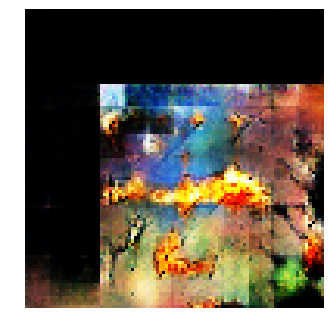


Epoch: 12880, D: -5.847, G: 1.974
Epoch: 12881, D: -5.95, G: 2.773
Epoch: 12882, D: -5.085, G: 2.584
Epoch: 12883, D: -7.083, G: 2.489
Epoch: 12884, D: -4.368, G: 0.3623
Epoch: 12885, D: -5.935, G: 4.135
Epoch: 12886, D: -7.455, G: 6.105
Epoch: 12887, D: -6.057, G: 3.523
Epoch: 12888, D: -6.651, G: 5.622
Epoch: 12889, D: -5.771, G: 1.33
Epoch: 12890, D: -5.29, G: 3.651
Epoch: 12891, D: -6.686, G: 4.672
Epoch: 12892, D: -7.57, G: 3.894
Epoch: 12893, D: -5.602, G: 2.092
Epoch: 12894, D: -4.691, G: 4.766
Epoch: 12895, D: -5.326, G: 2.793
Epoch: 12896, D: -4.699, G: 3.725
Epoch: 12897, D: -4.984, G: 5.044
Epoch: 12898, D: -5.704, G: 4.954
Epoch: 12899, D: -6.996, G: 5.831


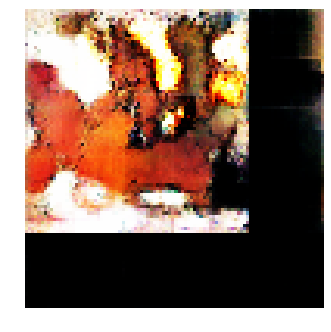


Epoch: 12900, D: -5.976, G: 2.482
Epoch: 12901, D: -7.012, G: 3.264
Epoch: 12902, D: -6.104, G: 4.208
Epoch: 12903, D: -5.971, G: 2.613
Epoch: 12904, D: -6.727, G: 0.7185
Epoch: 12905, D: -6.286, G: 1.714
Epoch: 12906, D: -5.806, G: 6.722
Epoch: 12907, D: -3.474, G: 1.823
Epoch: 12908, D: -6.749, G: 3.547
Epoch: 12909, D: -6.312, G: 4.541
Epoch: 12910, D: -6.434, G: 4.128
Epoch: 12911, D: -5.401, G: 4.316
Epoch: 12912, D: -5.43, G: 2.718
Epoch: 12913, D: -6.277, G: 3.162
Epoch: 12914, D: -5.128, G: 0.1398
Epoch: 12915, D: -6.326, G: 3.504
Epoch: 12916, D: -5.749, G: 4.418
Epoch: 12917, D: -6.787, G: 3.157
Epoch: 12918, D: -5.628, G: 1.926
Epoch: 12919, D: -6.116, G: 4.38


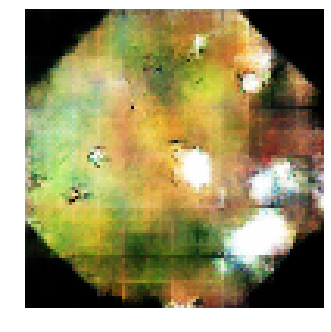


Epoch: 12920, D: -6.724, G: 1.35
Epoch: 12921, D: -4.837, G: 3.459
Epoch: 12922, D: -6.318, G: 2.712
Epoch: 12923, D: -7.253, G: 4.438
Epoch: 12924, D: -6.769, G: 3.723
Epoch: 12925, D: -5.183, G: 1.263
Epoch: 12926, D: -7.068, G: 4.836
Epoch: 12927, D: -6.394, G: 5.517
Epoch: 12928, D: -7.802, G: 6.666
Epoch: 12929, D: -6.288, G: 3.943
Epoch: 12930, D: -6.007, G: 4.548
Epoch: 12931, D: -5.863, G: 4.851
Epoch: 12932, D: -6.125, G: -0.003368
Epoch: 12933, D: -6.528, G: 4.868
Epoch: 12934, D: -5.61, G: 1.993
Epoch: 12935, D: -5.819, G: 4.836
Epoch: 12936, D: -5.351, G: 3.416
Epoch: 12937, D: -5.137, G: 3.285
Epoch: 12938, D: -5.486, G: 3.981
Epoch: 12939, D: -6.378, G: 5.902


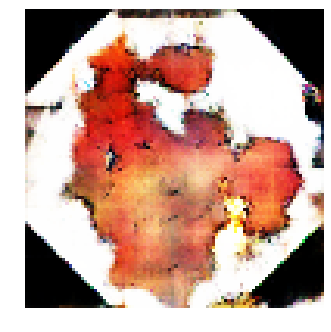


Epoch: 12940, D: -6.531, G: 3.092
Epoch: 12941, D: -5.791, G: 4.378
Epoch: 12942, D: -5.176, G: 4.757
Epoch: 12943, D: -7.047, G: 3.757
Epoch: 12944, D: -5.266, G: 1.734
Epoch: 12945, D: -6.001, G: 3.58
Epoch: 12946, D: -5.397, G: 4.435
Epoch: 12947, D: -6.023, G: 4.474
Epoch: 12948, D: -6.871, G: 4.501
Epoch: 12949, D: -5.401, G: 4.619
Epoch: 12950, D: -6.769, G: 3.089
Epoch: 12951, D: -4.312, G: 5.437
Epoch: 12952, D: -5.849, G: 4.674
Epoch: 12953, D: -6.768, G: 2.264
Epoch: 12954, D: -6.65, G: 4.991
Epoch: 12955, D: -4.975, G: 5.517
Epoch: 12956, D: -6.535, G: 6.357
Epoch: 12957, D: -5.206, G: 5.729
Epoch: 12958, D: -6.289, G: 3.27
Epoch: 12959, D: -6.131, G: 5.846


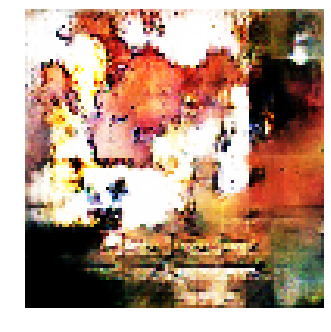


Epoch: 12960, D: -7.033, G: 5.894
Epoch: 12961, D: -6.279, G: 4.591
Epoch: 12962, D: -5.192, G: 4.497
Epoch: 12963, D: -6.57, G: 1.899
Epoch: 12964, D: -5.27, G: 5.003
Epoch: 12965, D: -4.716, G: 2.621
Epoch: 12966, D: -4.643, G: 5.253
Epoch: 12967, D: -6.511, G: 6.181
Epoch: 12968, D: -6.416, G: 6.087
Epoch: 12969, D: -5.755, G: 4.034
Epoch: 12970, D: -6.277, G: 5.701
Epoch: 12971, D: -6.989, G: 2.991
Epoch: 12972, D: -6.26, G: 1.975
Epoch: 12973, D: -5.726, G: 3.148
Epoch: 12974, D: -4.583, G: 0.7499
Epoch: 12975, D: -6.415, G: 4.47
Epoch: 12976, D: -5.765, G: 6.659
Epoch: 12977, D: -6.516, G: 3.693
Epoch: 12978, D: -4.772, G: 4.38
Epoch: 12979, D: -6.592, G: 4.737


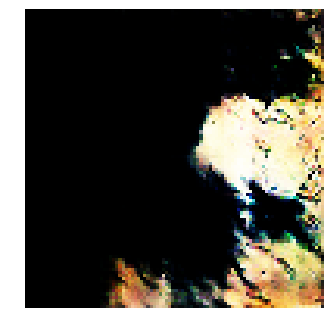


Epoch: 12980, D: -5.694, G: 4.311
Epoch: 12981, D: -6.117, G: 2.608
Epoch: 12982, D: -5.361, G: 1.654
Epoch: 12983, D: -6.595, G: 1.041
Epoch: 12984, D: -6.643, G: 3.043
Epoch: 12985, D: -5.997, G: 6.53
Epoch: 12986, D: -5.438, G: 3.739
Epoch: 12987, D: -5.117, G: 3.332
Epoch: 12988, D: -5.849, G: 2.665
Epoch: 12989, D: -5.943, G: 1.948
Epoch: 12990, D: -5.916, G: 2.493
Epoch: 12991, D: -6.401, G: 1.503
Epoch: 12992, D: -5.345, G: 3.35
Epoch: 12993, D: -6.562, G: 4.177
Epoch: 12994, D: -5.904, G: 3.85
Epoch: 12995, D: -5.416, G: 7.215
Epoch: 12996, D: -6.376, G: 6.259
Epoch: 12997, D: -6.265, G: 2.33
Epoch: 12998, D: -6.553, G: 3.93
Epoch: 12999, D: -6.37, G: 3.565


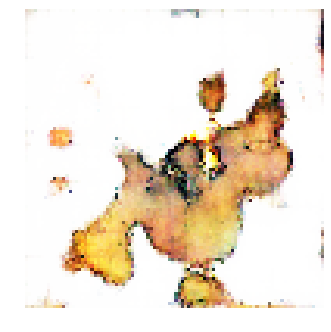


Epoch: 13000, D: -6.293, G: 0.4952
Epoch: 13001, D: -4.89, G: 1.476
Epoch: 13002, D: -5.382, G: 4.771
Epoch: 13003, D: -5.331, G: 2.588
Epoch: 13004, D: -6.726, G: 7.374
Epoch: 13005, D: -6.454, G: 4.005
Epoch: 13006, D: -5.616, G: 2.374
Epoch: 13007, D: -5.507, G: 4.016
Epoch: 13008, D: -6.487, G: 3.369
Epoch: 13009, D: -5.617, G: 1.722
Epoch: 13010, D: -6.487, G: 3.89
Epoch: 13011, D: -5.357, G: 3.545
Epoch: 13012, D: -6.35, G: 5.416
Epoch: 13013, D: -5.976, G: 2.107
Epoch: 13014, D: -6.935, G: 4.942
Epoch: 13015, D: -5.528, G: 4.154
Epoch: 13016, D: -5.976, G: 3.217
Epoch: 13017, D: -6.548, G: 3.69
Epoch: 13018, D: -5.668, G: 4.642
Epoch: 13019, D: -6.445, G: 5.377


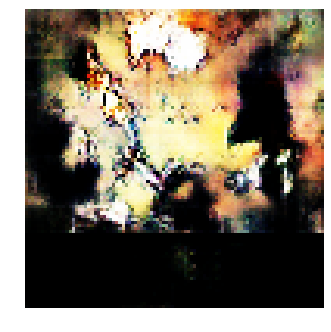


Epoch: 13020, D: -5.764, G: 5.845
Epoch: 13021, D: -5.552, G: 3.757
Epoch: 13022, D: -6.207, G: 2.728
Epoch: 13023, D: -6.213, G: 3.02
Epoch: 13024, D: -6.379, G: 3.674
Epoch: 13025, D: -5.671, G: 4.919
Epoch: 13026, D: -6.666, G: 2.758
Epoch: 13027, D: -5.921, G: 3.929
Epoch: 13028, D: -5.782, G: 3.91
Epoch: 13029, D: -5.066, G: 3.113
Epoch: 13030, D: -6.025, G: 5.831
Epoch: 13031, D: -5.536, G: 2.888
Epoch: 13032, D: -5.421, G: 2.745
Epoch: 13033, D: -6.252, G: 6.221
Epoch: 13034, D: -6.981, G: 4.275
Epoch: 13035, D: -5.974, G: 4.475
Epoch: 13036, D: -4.541, G: 4.121
Epoch: 13037, D: -6.192, G: 3.226
Epoch: 13038, D: -6.562, G: 4.089
Epoch: 13039, D: -5.743, G: 3.443


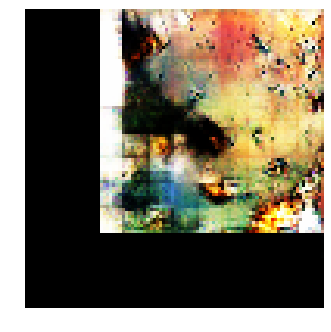


Epoch: 13040, D: -3.955, G: 4.717
Epoch: 13041, D: -4.681, G: 4.956
Epoch: 13042, D: -6.715, G: 3.973
Epoch: 13043, D: -6.072, G: 4.771
Epoch: 13044, D: -5.578, G: 2.404
Epoch: 13045, D: -6.484, G: 3.753
Epoch: 13046, D: -6.937, G: 2.083
Epoch: 13047, D: -7.461, G: 3.696
Epoch: 13048, D: -5.752, G: 3.544
Epoch: 13049, D: -6.025, G: 2.845
Epoch: 13050, D: -6.56, G: 6.068
Epoch: 13051, D: -5.172, G: 3.669
Epoch: 13052, D: -5.287, G: 4.732
Epoch: 13053, D: -7.042, G: 2.517
Epoch: 13054, D: -6.5, G: 1.845
Epoch: 13055, D: -7.209, G: 3.651
Epoch: 13056, D: -6.086, G: 4.67
Epoch: 13057, D: -4.603, G: 4.223
Epoch: 13058, D: -6.314, G: 3.15
Epoch: 13059, D: -6.798, G: 4.978


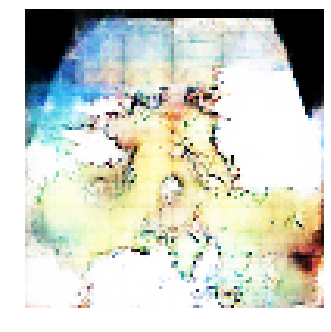


Epoch: 13060, D: -5.62, G: 5.445
Epoch: 13061, D: -5.284, G: 4.111
Epoch: 13062, D: -5.37, G: 3.092
Epoch: 13063, D: -7.007, G: 4.815
Epoch: 13064, D: -5.978, G: 2.4
Epoch: 13065, D: -6.248, G: 2.579
Epoch: 13066, D: -4.685, G: 3.468
Epoch: 13067, D: -5.451, G: 4.142
Epoch: 13068, D: -6.086, G: 6.962
Epoch: 13069, D: -5.469, G: 4.318
Epoch: 13070, D: -5.43, G: 6.83
Epoch: 13071, D: -6.984, G: 3.511
Epoch: 13072, D: -6.003, G: 4.164
Epoch: 13073, D: -5.189, G: 2.058
Epoch: 13074, D: -5.081, G: 2.872
Epoch: 13075, D: -5.852, G: 1.272
Epoch: 13076, D: -4.097, G: 2.777
Epoch: 13077, D: -5.59, G: 5.381
Epoch: 13078, D: -5.149, G: 2.692
Epoch: 13079, D: -5.906, G: 4.061


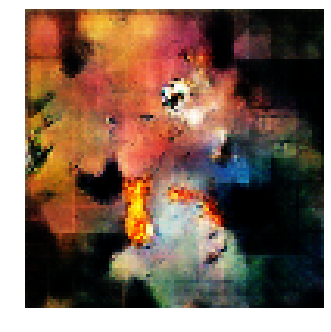


Epoch: 13080, D: -5.385, G: 4.707
Epoch: 13081, D: -6.833, G: 5.42
Epoch: 13082, D: -5.49, G: 4.478
Epoch: 13083, D: -6.221, G: 3.479
Epoch: 13084, D: -4.603, G: 5.057
Epoch: 13085, D: -6.36, G: 4.394
Epoch: 13086, D: -6.084, G: 4.124
Epoch: 13087, D: -5.712, G: 1.275
Epoch: 13088, D: -5.663, G: 3.449
Epoch: 13089, D: -6.123, G: 3.622
Epoch: 13090, D: -5.893, G: -1.696
Epoch: 13091, D: -6.24, G: 3.703
Epoch: 13092, D: -6.085, G: 2.269
Epoch: 13093, D: -6.48, G: 2.91
Epoch: 13094, D: -6.741, G: 4.286
Epoch: 13095, D: -5.07, G: 4.38
Epoch: 13096, D: -6.469, G: 5.215
Epoch: 13097, D: -5.464, G: 3.29
Epoch: 13098, D: -6.181, G: 2.3
Epoch: 13099, D: -4.885, G: 4.599


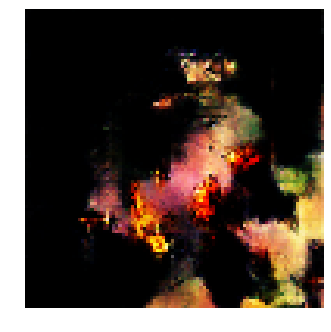


Epoch: 13100, D: -6.827, G: 2.996
Epoch: 13101, D: -5.412, G: 2.751
Epoch: 13102, D: -6.038, G: 2.372
Epoch: 13103, D: -5.728, G: 3.394
Epoch: 13104, D: -5.159, G: 4.083
Epoch: 13105, D: -4.858, G: 3.788
Epoch: 13106, D: -6.172, G: 3.775
Epoch: 13107, D: -6.688, G: 4.604
Epoch: 13108, D: -6.293, G: 2.716
Epoch: 13109, D: -5.657, G: 4.37
Epoch: 13110, D: -6.582, G: 2.64
Epoch: 13111, D: -6.565, G: 4.67
Epoch: 13112, D: -6.211, G: 3.778
Epoch: 13113, D: -7.216, G: 2.586
Epoch: 13114, D: -6.652, G: 1.242
Epoch: 13115, D: -5.176, G: 3.301
Epoch: 13116, D: -5.847, G: 3.585
Epoch: 13117, D: -6.456, G: 4.797
Epoch: 13118, D: -6.055, G: 5.734
Epoch: 13119, D: -5.38, G: 1.559


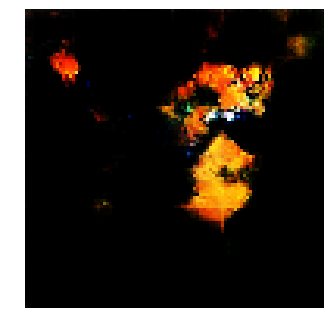


Epoch: 13120, D: -5.808, G: 3.925
Epoch: 13121, D: -5.522, G: 4.098
Epoch: 13122, D: -3.578, G: 5.602
Epoch: 13123, D: -5.588, G: 4.136
Epoch: 13124, D: -5.511, G: 2.519
Epoch: 13125, D: -6.585, G: 4.204
Epoch: 13126, D: -5.983, G: 1.604
Epoch: 13127, D: -6.143, G: 5.66
Epoch: 13128, D: -5.403, G: 2.196
Epoch: 13129, D: -5.976, G: 3.477
Epoch: 13130, D: -4.96, G: 4.985
Epoch: 13131, D: -6.424, G: 3.574
Epoch: 13132, D: -7.129, G: 1.329
Epoch: 13133, D: -6.413, G: 4.883
Epoch: 13134, D: -7.238, G: 3.835
Epoch: 13135, D: -5.412, G: 1.125
Epoch: 13136, D: -7.19, G: 3.147
Epoch: 13137, D: -6.138, G: 4.257
Epoch: 13138, D: -6.13, G: 3.122
Epoch: 13139, D: -5.763, G: 3.366


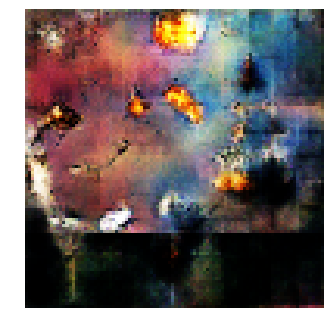


Epoch: 13140, D: -6.657, G: 4.233
Epoch: 13141, D: -6.616, G: 5.001
Epoch: 13142, D: -6.524, G: 5.089
Epoch: 13143, D: -5.551, G: 6.507
Epoch: 13144, D: -4.683, G: 5.371
Epoch: 13145, D: -6.16, G: 2.902
Epoch: 13146, D: -4.804, G: 2.894
Epoch: 13147, D: -5.606, G: 6.658
Epoch: 13148, D: -6.939, G: 4.667
Epoch: 13149, D: -5.968, G: 2.823
Epoch: 13150, D: -6.286, G: 5.306
Epoch: 13151, D: -5.155, G: 5.084
Epoch: 13152, D: -6.046, G: 5.299
Epoch: 13153, D: -5.369, G: 1.879
Epoch: 13154, D: -4.395, G: 3.986
Epoch: 13155, D: -5.889, G: 4.794
Epoch: 13156, D: -5.617, G: 4.611
Epoch: 13157, D: -5.914, G: 3.851
Epoch: 13158, D: -6.515, G: 1.886
Epoch: 13159, D: -5.988, G: 3.749


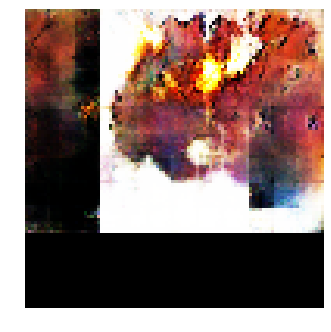


Epoch: 13160, D: -5.597, G: 4.791
Epoch: 13161, D: -5.585, G: 3.979
Epoch: 13162, D: -6.085, G: 4.63
Epoch: 13163, D: -5.667, G: 2.689
Epoch: 13164, D: -6.772, G: 1.223
Epoch: 13165, D: -6.863, G: 3.403
Epoch: 13166, D: -6.834, G: 3.262
Epoch: 13167, D: -5.862, G: 5.256
Epoch: 13168, D: -6.491, G: 2.067
Epoch: 13169, D: -5.495, G: 0.8844
Epoch: 13170, D: -4.982, G: 3.62
Epoch: 13171, D: -7.33, G: 4.003
Epoch: 13172, D: -5.353, G: 6.915
Epoch: 13173, D: -7.367, G: 3.568
Epoch: 13174, D: -5.456, G: 6.179
Epoch: 13175, D: -5.861, G: 3.818
Epoch: 13176, D: -5.506, G: 3.29
Epoch: 13177, D: -6.146, G: 3.252
Epoch: 13178, D: -6.044, G: 2.728
Epoch: 13179, D: -6.601, G: 4.023


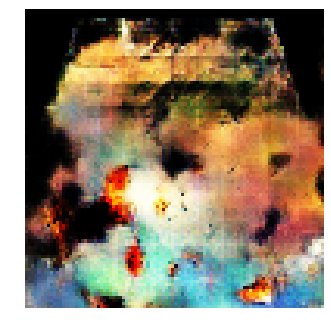


Epoch: 13180, D: -6.889, G: 4.124
Epoch: 13181, D: -6.134, G: 1.139
Epoch: 13182, D: -5.609, G: 3.959
Epoch: 13183, D: -7.393, G: 2.24
Epoch: 13184, D: -6.342, G: -0.5497
Epoch: 13185, D: -5.693, G: 6.363
Epoch: 13186, D: -6.773, G: 3.772
Epoch: 13187, D: -7.379, G: 2.601
Epoch: 13188, D: -5.945, G: 6.473
Epoch: 13189, D: -6.372, G: 3.509
Epoch: 13190, D: -7.267, G: 6.468
Epoch: 13191, D: -6.015, G: 4.562
Epoch: 13192, D: -6.173, G: 4.962
Epoch: 13193, D: -6.226, G: 7.937
Epoch: 13194, D: -6.853, G: 4.269
Epoch: 13195, D: -5.488, G: 2.317
Epoch: 13196, D: -6.113, G: 3.554
Epoch: 13197, D: -5.534, G: 5.398
Epoch: 13198, D: -6.124, G: 4.213
Epoch: 13199, D: -6.536, G: 3.938


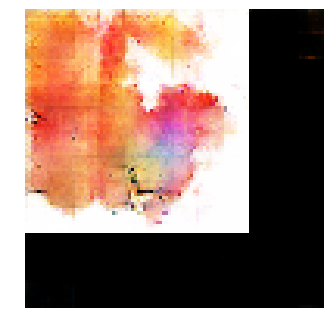


Epoch: 13200, D: -5.179, G: 3.151
Epoch: 13201, D: -5.951, G: 6.358
Epoch: 13202, D: -6.504, G: 3.103
Epoch: 13203, D: -6.521, G: 1.754
Epoch: 13204, D: -6.749, G: 2.126
Epoch: 13205, D: -6.467, G: 4.879
Epoch: 13206, D: -6.301, G: 2.208
Epoch: 13207, D: -4.784, G: 1.141
Epoch: 13208, D: -6.648, G: 6.017
Epoch: 13209, D: -5.026, G: 2.791
Epoch: 13210, D: -6.937, G: 3.986
Epoch: 13211, D: -5.943, G: 4.257
Epoch: 13212, D: -6.531, G: 2.655
Epoch: 13213, D: -6.371, G: 4.201
Epoch: 13214, D: -6.774, G: 2.57
Epoch: 13215, D: -5.492, G: 3.444
Epoch: 13216, D: -5.548, G: 4.5
Epoch: 13217, D: -6.496, G: 6.088
Epoch: 13218, D: -5.544, G: 3.447
Epoch: 13219, D: -5.754, G: 8.585


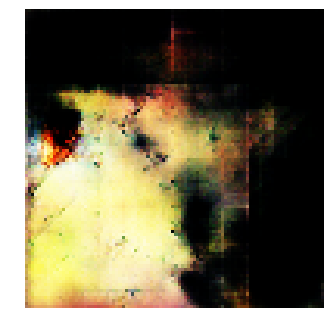


Epoch: 13220, D: -6.131, G: 5.672
Epoch: 13221, D: -5.698, G: 3.624
Epoch: 13222, D: -5.383, G: 5.266
Epoch: 13223, D: -6.735, G: 2.901
Epoch: 13224, D: -4.606, G: 4.318
Epoch: 13225, D: -5.248, G: 5.096
Epoch: 13226, D: -6.075, G: 5.864
Epoch: 13227, D: -5.91, G: 4.388
Epoch: 13228, D: -5.468, G: 2.199
Epoch: 13229, D: -6.28, G: 4.105
Epoch: 13230, D: -6.044, G: 2.19
Epoch: 13231, D: -5.771, G: 5.206
Epoch: 13232, D: -6.236, G: 1.493
Epoch: 13233, D: -5.823, G: 4.179
Epoch: 13234, D: -5.823, G: 3.205
Epoch: 13235, D: -5.65, G: 2.991
Epoch: 13236, D: -7.943, G: 4.374
Epoch: 13237, D: -5.513, G: 4.883
Epoch: 13238, D: -4.667, G: 2.806
Epoch: 13239, D: -5.652, G: 3.738


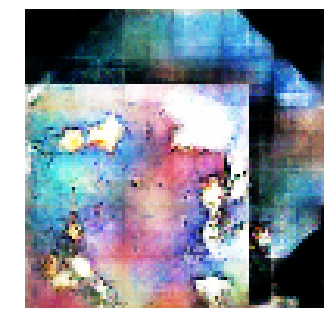


Epoch: 13240, D: -7.682, G: 3.232
Epoch: 13241, D: -5.889, G: 2.833
Epoch: 13242, D: -6.495, G: 2.613
Epoch: 13243, D: -6.15, G: 1.788
Epoch: 13244, D: -5.625, G: 4.227
Epoch: 13245, D: -6.086, G: 6.662
Epoch: 13246, D: -5.273, G: 2.981
Epoch: 13247, D: -5.637, G: 3.011
Epoch: 13248, D: -6.443, G: 4.229
Epoch: 13249, D: -5.999, G: 5.958
Epoch: 13250, D: -6.968, G: 3.618
Epoch: 13251, D: -6.114, G: 5.148
Epoch: 13252, D: -5.636, G: 5.32
Epoch: 13253, D: -5.387, G: 4.949
Epoch: 13254, D: -5.722, G: 4.693
Epoch: 13255, D: -5.995, G: 3.266
Epoch: 13256, D: -5.597, G: 1.963
Epoch: 13257, D: -6.941, G: 3.181
Epoch: 13258, D: -7.46, G: 5.617
Epoch: 13259, D: -4.726, G: 4.214


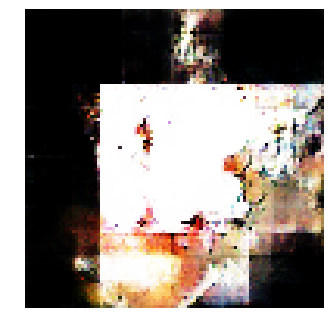


Epoch: 13260, D: -6.329, G: 4.135
Epoch: 13261, D: -6.68, G: 2.246
Epoch: 13262, D: -5.596, G: 3.386
Epoch: 13263, D: -5.931, G: 3.409
Epoch: 13264, D: -5.795, G: 6.11
Epoch: 13265, D: -5.698, G: 4.802
Epoch: 13266, D: -6.492, G: 3.199
Epoch: 13267, D: -7.293, G: 3.236
Epoch: 13268, D: -4.153, G: 4.592
Epoch: 13269, D: -6.044, G: 6.392
Epoch: 13270, D: -6.2, G: 1.946
Epoch: 13271, D: -6.434, G: 3.635
Epoch: 13272, D: -5.347, G: 2.032
Epoch: 13273, D: -5.909, G: 3.12
Epoch: 13274, D: -6.655, G: 2.841
Epoch: 13275, D: -6.408, G: 3.648
Epoch: 13276, D: -4.798, G: 3.25
Epoch: 13277, D: -5.582, G: 4.467
Epoch: 13278, D: -6.083, G: 3.62
Epoch: 13279, D: -6.016, G: 2.528


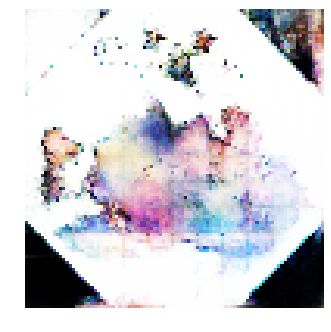


Epoch: 13280, D: -5.965, G: 3.036
Epoch: 13281, D: -5.512, G: 3.973
Epoch: 13282, D: -6.546, G: 4.781
Epoch: 13283, D: -7.332, G: 1.469
Epoch: 13284, D: -6.035, G: 2.813
Epoch: 13285, D: -6.548, G: 3.006
Epoch: 13286, D: -7.818, G: 7.101
Epoch: 13287, D: -5.594, G: 4.62
Epoch: 13288, D: -5.212, G: 5.442
Epoch: 13289, D: -6.181, G: 2.905
Epoch: 13290, D: -4.901, G: 3.296
Epoch: 13291, D: -8.218, G: 5.912
Epoch: 13292, D: -5.868, G: 4.86
Epoch: 13293, D: -5.68, G: 2.631
Epoch: 13294, D: -6.931, G: 6.498
Epoch: 13295, D: -5.809, G: 4.053
Epoch: 13296, D: -5.036, G: 3.892
Epoch: 13297, D: -6.361, G: 5.289
Epoch: 13298, D: -7.689, G: 4.104
Epoch: 13299, D: -6.759, G: 3.226


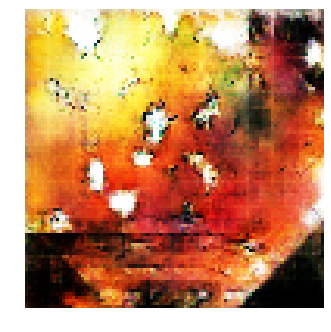


Epoch: 13300, D: -5.647, G: 3.606
Epoch: 13301, D: -5.636, G: 4.685
Epoch: 13302, D: -5.331, G: 5.709
Epoch: 13303, D: -5.861, G: 6.214
Epoch: 13304, D: -6.663, G: 3.271
Epoch: 13305, D: -7.1, G: 4.4
Epoch: 13306, D: -5.496, G: 5.418
Epoch: 13307, D: -5.448, G: 2.643
Epoch: 13308, D: -6.633, G: 2.326
Epoch: 13309, D: -6.615, G: 2.596
Epoch: 13310, D: -5.09, G: 1.845
Epoch: 13311, D: -5.129, G: 3.539
Epoch: 13312, D: -6.499, G: 5.755
Epoch: 13313, D: -7.973, G: 4.566
Epoch: 13314, D: -6.713, G: 3.712
Epoch: 13315, D: -5.079, G: 3.907
Epoch: 13316, D: -6.248, G: 5.219
Epoch: 13317, D: -4.386, G: 3.75
Epoch: 13318, D: -5.307, G: 4.712
Epoch: 13319, D: -4.208, G: 3.681


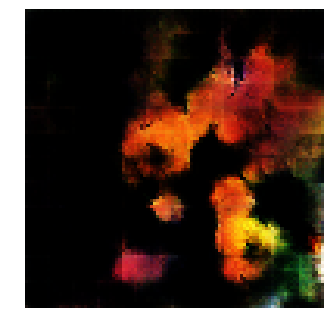


Epoch: 13320, D: -5.853, G: 4.877
Epoch: 13321, D: -6.448, G: 5.959
Epoch: 13322, D: -5.285, G: 5.473
Epoch: 13323, D: -5.19, G: 4.968
Epoch: 13324, D: -5.162, G: 3.241
Epoch: 13325, D: -6.849, G: 6.157
Epoch: 13326, D: -7.29, G: 2.551
Epoch: 13327, D: -6.259, G: 3.606
Epoch: 13328, D: -6.329, G: 4.846
Epoch: 13329, D: -5.172, G: 5.598
Epoch: 13330, D: -6.588, G: 1.732
Epoch: 13331, D: -6.752, G: 2.378
Epoch: 13332, D: -5.665, G: 1.567
Epoch: 13333, D: -4.97, G: 2.904
Epoch: 13334, D: -5.142, G: 3.609
Epoch: 13335, D: -6.487, G: 4.165
Epoch: 13336, D: -5.919, G: 3.124
Epoch: 13337, D: -5.276, G: 2.327
Epoch: 13338, D: -6.521, G: 2.748
Epoch: 13339, D: -6.583, G: 3.345


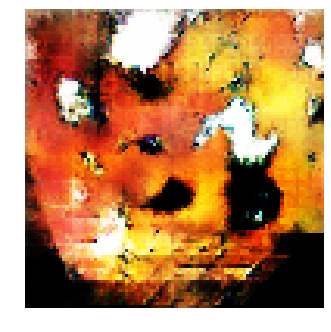


Epoch: 13340, D: -6.636, G: 2.511
Epoch: 13341, D: -6.72, G: 4.119
Epoch: 13342, D: -6.172, G: 4.486
Epoch: 13343, D: -5.897, G: 2.817
Epoch: 13344, D: -6.386, G: 1.612
Epoch: 13345, D: -6.537, G: 6.556
Epoch: 13346, D: -6.925, G: 3.508
Epoch: 13347, D: -5.657, G: 2.531
Epoch: 13348, D: -6.276, G: 2.744
Epoch: 13349, D: -5.596, G: 5.421
Epoch: 13350, D: -6.446, G: 1.963
Epoch: 13351, D: -6.196, G: 2.938
Epoch: 13352, D: -5.833, G: 3.59
Epoch: 13353, D: -5.545, G: 2.488
Epoch: 13354, D: -6.728, G: 3.122
Epoch: 13355, D: -6.994, G: 1.88
Epoch: 13356, D: -6.273, G: 2.972
Epoch: 13357, D: -5.377, G: 4.797
Epoch: 13358, D: -5.877, G: 2.106
Epoch: 13359, D: -6.119, G: 2.022


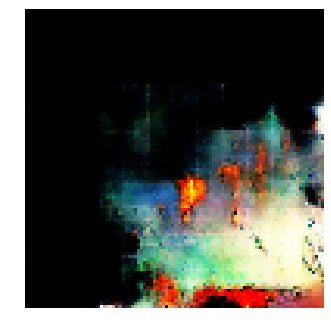


Epoch: 13360, D: -6.066, G: 5.137
Epoch: 13361, D: -6.675, G: 5.66
Epoch: 13362, D: -5.763, G: 5.109
Epoch: 13363, D: -5.006, G: 3.689
Epoch: 13364, D: -5.48, G: 4.039
Epoch: 13365, D: -6.179, G: 3.498
Epoch: 13366, D: -5.742, G: 1.47
Epoch: 13367, D: -5.02, G: 4.771
Epoch: 13368, D: -4.632, G: 4.9
Epoch: 13369, D: -6.44, G: 3.033
Epoch: 13370, D: -5.143, G: 1.511
Epoch: 13371, D: -6.671, G: 1.022
Epoch: 13372, D: -6.748, G: 2.912
Epoch: 13373, D: -5.251, G: 3.193
Epoch: 13374, D: -5.887, G: 5.085
Epoch: 13375, D: -5.546, G: 5.015
Epoch: 13376, D: -5.156, G: 2.314
Epoch: 13377, D: -4.953, G: 6.242
Epoch: 13378, D: -6.194, G: 4.572
Epoch: 13379, D: -6.996, G: 3.396


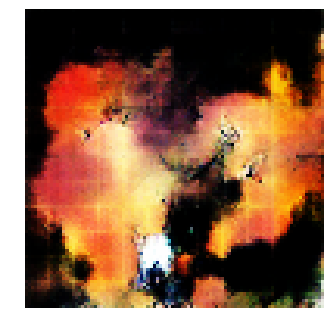


Epoch: 13380, D: -5.155, G: 4.313
Epoch: 13381, D: -6.697, G: 3.835
Epoch: 13382, D: -6.636, G: 5.233
Epoch: 13383, D: -7.295, G: 5.36
Epoch: 13384, D: -5.734, G: 4.342
Epoch: 13385, D: -6.309, G: 5.602
Epoch: 13386, D: -6.99, G: 3.514
Epoch: 13387, D: -6.223, G: 5.206
Epoch: 13388, D: -5.92, G: 2.222
Epoch: 13389, D: -6.314, G: 5.891
Epoch: 13390, D: -6.297, G: 1.44
Epoch: 13391, D: -5.373, G: 4.385
Epoch: 13392, D: -6.17, G: 3.905
Epoch: 13393, D: -5.922, G: 2.348
Epoch: 13394, D: -5.13, G: 3.276
Epoch: 13395, D: -6.749, G: 1.774
Epoch: 13396, D: -7.448, G: 4.622
Epoch: 13397, D: -5.626, G: 3.29
Epoch: 13398, D: -6.102, G: 2.624
Epoch: 13399, D: -5.043, G: 6.514


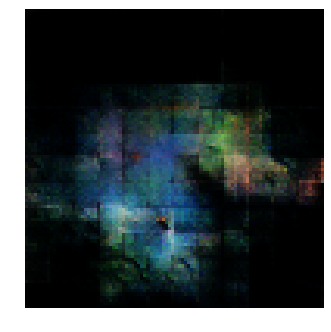


Epoch: 13400, D: -5.574, G: 4.198
Epoch: 13401, D: -5.058, G: 1.653
Epoch: 13402, D: -6.029, G: 2.733
Epoch: 13403, D: -6.473, G: 1.834
Epoch: 13404, D: -4.879, G: 2.589
Epoch: 13405, D: -5.925, G: 2.69
Epoch: 13406, D: -6.262, G: 2.02
Epoch: 13407, D: -6.332, G: 4.67
Epoch: 13408, D: -6.109, G: 4.934
Epoch: 13409, D: -5.636, G: 5.498
Epoch: 13410, D: -7.284, G: 5.273
Epoch: 13411, D: -4.827, G: 4.364
Epoch: 13412, D: -5.878, G: 1.471
Epoch: 13413, D: -5.313, G: 3.887
Epoch: 13414, D: -6.139, G: 5.061
Epoch: 13415, D: -6.68, G: 2.097
Epoch: 13416, D: -5.677, G: 2.571
Epoch: 13417, D: -5.416, G: 3.752
Epoch: 13418, D: -5.994, G: 2.971
Epoch: 13419, D: -6.503, G: 5.241


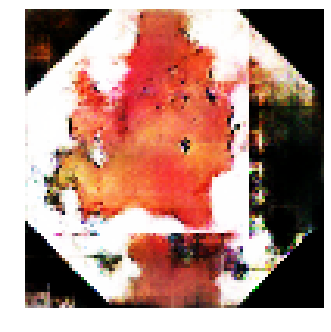


Epoch: 13420, D: -5.165, G: 5.43
Epoch: 13421, D: -6.326, G: 2.208
Epoch: 13422, D: -6.706, G: 3.538
Epoch: 13423, D: -5.704, G: 4.271
Epoch: 13424, D: -6.054, G: 3.564
Epoch: 13425, D: -5.466, G: 4.765
Epoch: 13426, D: -5.335, G: 3.057
Epoch: 13427, D: -6.66, G: 2.141
Epoch: 13428, D: -6.155, G: 3.325
Epoch: 13429, D: -5.634, G: 2.807
Epoch: 13430, D: -6.403, G: 3.952
Epoch: 13431, D: -6.26, G: 1.786
Epoch: 13432, D: -6.775, G: 4.746
Epoch: 13433, D: -5.943, G: 4.762
Epoch: 13434, D: -6.288, G: 2.521
Epoch: 13435, D: -5.469, G: 8.015
Epoch: 13436, D: -5.298, G: 2.925
Epoch: 13437, D: -4.698, G: 3.984
Epoch: 13438, D: -5.678, G: 4.116
Epoch: 13439, D: -5.582, G: 6.602


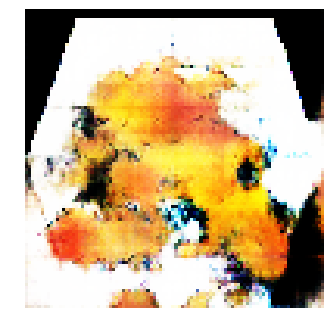


Epoch: 13440, D: -6.946, G: 2.578
Epoch: 13441, D: -5.969, G: 4.07
Epoch: 13442, D: -5.54, G: 4.237
Epoch: 13443, D: -6.207, G: -0.777
Epoch: 13444, D: -6.894, G: 2.344
Epoch: 13445, D: -6.592, G: 3.53
Epoch: 13446, D: -6.421, G: 3.907
Epoch: 13447, D: -5.951, G: 3.296
Epoch: 13448, D: -5.305, G: 2.72
Epoch: 13449, D: -4.813, G: 1.527
Epoch: 13450, D: -5.891, G: 4.606
Epoch: 13451, D: -7.119, G: 3.885
Epoch: 13452, D: -5.482, G: 5.206
Epoch: 13453, D: -7.087, G: 2.822
Epoch: 13454, D: -6.084, G: 1.098
Epoch: 13455, D: -4.523, G: 4.967
Epoch: 13456, D: -6.243, G: 4.718
Epoch: 13457, D: -5.961, G: 5.879
Epoch: 13458, D: -5.199, G: 3.699
Epoch: 13459, D: -4.14, G: 4.326


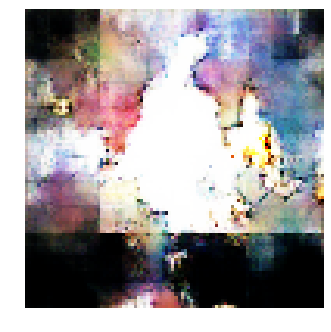


Epoch: 13460, D: -5.517, G: 3.051
Epoch: 13461, D: -6.273, G: 5.458
Epoch: 13462, D: -5.6, G: 4.698
Epoch: 13463, D: -7.411, G: 3.553
Epoch: 13464, D: -6.492, G: 2.151
Epoch: 13465, D: -6.225, G: 5.282
Epoch: 13466, D: -6.067, G: 0.9842
Epoch: 13467, D: -6.162, G: 2.841
Epoch: 13468, D: -5.446, G: 5.365
Epoch: 13469, D: -5.831, G: 4.162
Epoch: 13470, D: -7.072, G: 4.849
Epoch: 13471, D: -5.965, G: 5.21
Epoch: 13472, D: -7.624, G: 1.496
Epoch: 13473, D: -5.967, G: 3.651
Epoch: 13474, D: -6.323, G: 6.005
Epoch: 13475, D: -6.341, G: 4.097
Epoch: 13476, D: -7.348, G: 4.19
Epoch: 13477, D: -5.169, G: 4.538
Epoch: 13478, D: -4.403, G: 5.125
Epoch: 13479, D: -4.987, G: 3.953


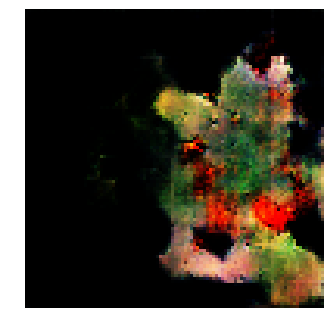


Epoch: 13480, D: -5.72, G: 5.053
Epoch: 13481, D: -6.601, G: 5.349
Epoch: 13482, D: -5.056, G: 2.116
Epoch: 13483, D: -5.682, G: 0.8468
Epoch: 13484, D: -6.262, G: 3.098
Epoch: 13485, D: -5.795, G: 4.795
Epoch: 13486, D: -6.238, G: 3.472
Epoch: 13487, D: -6.299, G: 6.705
Epoch: 13488, D: -6.159, G: 4.671
Epoch: 13489, D: -4.512, G: 4.262
Epoch: 13490, D: -6.1, G: 3.758
Epoch: 13491, D: -5.042, G: 3.37
Epoch: 13492, D: -5.415, G: 4.882
Epoch: 13493, D: -6.57, G: 4.92
Epoch: 13494, D: -5.798, G: 4.593
Epoch: 13495, D: -6.091, G: 3.974
Epoch: 13496, D: -5.248, G: 3.507
Epoch: 13497, D: -5.809, G: 6.206
Epoch: 13498, D: -6.736, G: 4.051
Epoch: 13499, D: -3.758, G: 2.601


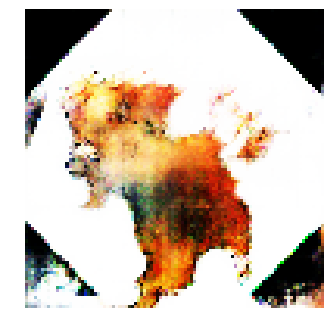


Epoch: 13500, D: -4.999, G: 4.633
Epoch: 13501, D: -4.849, G: 1.797
Epoch: 13502, D: -6.079, G: 5.325
Epoch: 13503, D: -5.389, G: 4.508
Epoch: 13504, D: -5.212, G: 4.288
Epoch: 13505, D: -6.303, G: 5.509
Epoch: 13506, D: -5.186, G: 5.704
Epoch: 13507, D: -6.839, G: 4.942
Epoch: 13508, D: -7.398, G: 6.938
Epoch: 13509, D: -6.704, G: 3.281
Epoch: 13510, D: -5.403, G: 4.316
Epoch: 13511, D: -6.293, G: 3.005
Epoch: 13512, D: -5.174, G: 1.512
Epoch: 13513, D: -6.039, G: 4.889
Epoch: 13514, D: -5.839, G: 4.196
Epoch: 13515, D: -6.633, G: 4.127
Epoch: 13516, D: -5.208, G: 7.153
Epoch: 13517, D: -6.665, G: 4.921
Epoch: 13518, D: -5.378, G: 2.584
Epoch: 13519, D: -6.343, G: 3.237


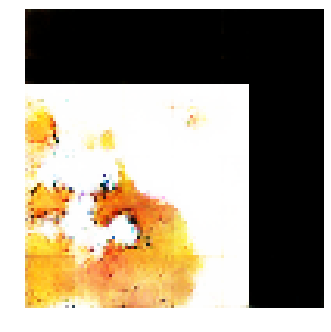


Epoch: 13520, D: -5.85, G: 3.896
Epoch: 13521, D: -5.223, G: 3.407
Epoch: 13522, D: -6.203, G: 3.883
Epoch: 13523, D: -5.56, G: 6.066
Epoch: 13524, D: -6.38, G: 4.287
Epoch: 13525, D: -6.401, G: 1.091
Epoch: 13526, D: -5.51, G: 4.64
Epoch: 13527, D: -5.888, G: 2.059
Epoch: 13528, D: -6.312, G: 4.08
Epoch: 13529, D: -6.7, G: 5.317
Epoch: 13530, D: -5.559, G: 4.316
Epoch: 13531, D: -5.825, G: 3.199
Epoch: 13532, D: -5.961, G: 4.839
Epoch: 13533, D: -5.951, G: 3.084
Epoch: 13534, D: -6.258, G: 5.086
Epoch: 13535, D: -6.555, G: 4.792
Epoch: 13536, D: -8.087, G: 2.395
Epoch: 13537, D: -5.626, G: 3.573
Epoch: 13538, D: -5.472, G: 4.034
Epoch: 13539, D: -6.196, G: 2.102


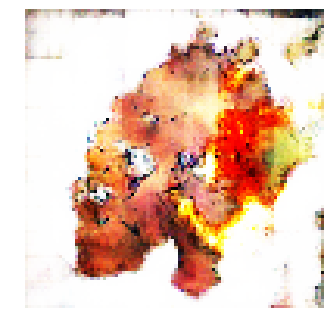


Epoch: 13540, D: -6.447, G: 4.714
Epoch: 13541, D: -5.731, G: 3.622
Epoch: 13542, D: -6.905, G: 2.925
Epoch: 13543, D: -6.95, G: 4.274
Epoch: 13544, D: -5.517, G: 4.289
Epoch: 13545, D: -7.043, G: 3.776
Epoch: 13546, D: -6.036, G: 2.804
Epoch: 13547, D: -6.706, G: 2.761
Epoch: 13548, D: -6.298, G: 3.289
Epoch: 13549, D: -7.056, G: 3.702
Epoch: 13550, D: -6.405, G: 3.41
Epoch: 13551, D: -5.109, G: 2.788
Epoch: 13552, D: -6.697, G: 5.213
Epoch: 13553, D: -5.748, G: 4.374
Epoch: 13554, D: -6.225, G: 2.614
Epoch: 13555, D: -6.279, G: 4.339
Epoch: 13556, D: -5.927, G: 4.225
Epoch: 13557, D: -5.757, G: 5.95
Epoch: 13558, D: -6.585, G: 3.337
Epoch: 13559, D: -4.276, G: 2.47


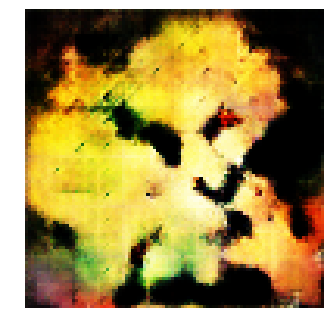


Epoch: 13560, D: -5.887, G: 3.67
Epoch: 13561, D: -5.126, G: 5.427
Epoch: 13562, D: -6.343, G: 2.419
Epoch: 13563, D: -5.567, G: 2.633
Epoch: 13564, D: -5.806, G: 3.491
Epoch: 13565, D: -5.897, G: 3.909
Epoch: 13566, D: -5.451, G: 5.312
Epoch: 13567, D: -6.603, G: 3.35
Epoch: 13568, D: -5.562, G: 4.391
Epoch: 13569, D: -5.781, G: 2.715
Epoch: 13570, D: -7.414, G: -0.0621
Epoch: 13571, D: -6.244, G: 3.301
Epoch: 13572, D: -6.485, G: 3.89
Epoch: 13573, D: -5.483, G: 5.053
Epoch: 13574, D: -5.576, G: 5.536
Epoch: 13575, D: -6.619, G: 5.157
Epoch: 13576, D: -5.572, G: 3.485
Epoch: 13577, D: -4.238, G: 3.092
Epoch: 13578, D: -6.382, G: 3.249
Epoch: 13579, D: -6.537, G: 3.547


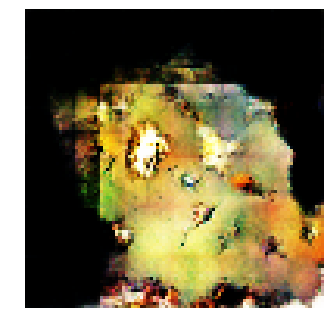


Epoch: 13580, D: -6.117, G: 3.654
Epoch: 13581, D: -6.799, G: 1.37
Epoch: 13582, D: -6.676, G: 0.7298
Epoch: 13583, D: -4.832, G: 3.67
Epoch: 13584, D: -5.669, G: 4.115
Epoch: 13585, D: -5.348, G: 5.652
Epoch: 13586, D: -5.423, G: 4.907
Epoch: 13587, D: -4.545, G: 3.396
Epoch: 13588, D: -3.895, G: 4.113
Epoch: 13589, D: -7.196, G: 3.022
Epoch: 13590, D: -5.197, G: 3.225
Epoch: 13591, D: -5.916, G: 2.365
Epoch: 13592, D: -5.588, G: 2.194
Epoch: 13593, D: -6.058, G: 4.253
Epoch: 13594, D: -5.64, G: 2.33
Epoch: 13595, D: -6.214, G: 4.071
Epoch: 13596, D: -7.135, G: 0.7225
Epoch: 13597, D: -5.589, G: 5.879
Epoch: 13598, D: -4.835, G: 3.515
Epoch: 13599, D: -4.424, G: 3.494


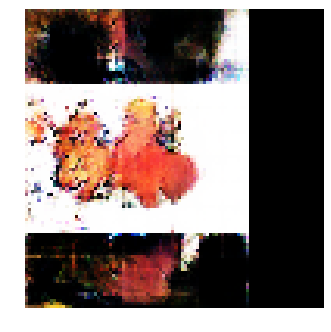


Epoch: 13600, D: -5.974, G: 5.412
Epoch: 13601, D: -6.495, G: 4.204
Epoch: 13602, D: -5.959, G: 2.961
Epoch: 13603, D: -6.679, G: 1.699
Epoch: 13604, D: -5.032, G: 6.418
Epoch: 13605, D: -4.88, G: 4.505
Epoch: 13606, D: -4.285, G: 4.089
Epoch: 13607, D: -7.238, G: 3.686
Epoch: 13608, D: -5.873, G: 4.922
Epoch: 13609, D: -5.542, G: 3.555
Epoch: 13610, D: -4.77, G: 3.027
Epoch: 13611, D: -5.707, G: 0.9007
Epoch: 13612, D: -6.998, G: 5.585
Epoch: 13613, D: -5.609, G: 3.825
Epoch: 13614, D: -6.915, G: 5.731
Epoch: 13615, D: -5.099, G: 3.652
Epoch: 13616, D: -6.457, G: 4.173
Epoch: 13617, D: -6.288, G: 3.588
Epoch: 13618, D: -6.245, G: 3.219
Epoch: 13619, D: -5.918, G: 3.552


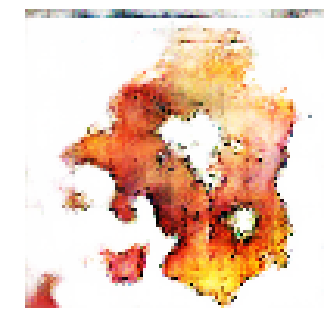


Epoch: 13620, D: -6.493, G: 5.53
Epoch: 13621, D: -4.573, G: 0.8034
Epoch: 13622, D: -5.091, G: 1.521
Epoch: 13623, D: -5.011, G: 2.694
Epoch: 13624, D: -5.657, G: 3.251
Epoch: 13625, D: -5.581, G: 0.4166
Epoch: 13626, D: -4.683, G: 5.738
Epoch: 13627, D: -6.486, G: 2.918
Epoch: 13628, D: -5.495, G: 4.11
Epoch: 13629, D: -6.125, G: 2.95
Epoch: 13630, D: -6.327, G: 3.65
Epoch: 13631, D: -6.332, G: 3.439
Epoch: 13632, D: -3.928, G: 4.141
Epoch: 13633, D: -5.785, G: 4.115
Epoch: 13634, D: -5.931, G: 4.555
Epoch: 13635, D: -5.581, G: 1.314
Epoch: 13636, D: -5.74, G: 4.316
Epoch: 13637, D: -5.418, G: 2.643
Epoch: 13638, D: -6.332, G: 5.745
Epoch: 13639, D: -5.734, G: 4.668


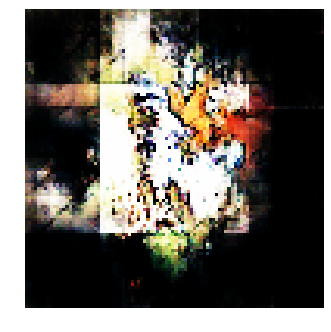


Epoch: 13640, D: -6.803, G: 3.595
Epoch: 13641, D: -4.679, G: 1.31
Epoch: 13642, D: -6.003, G: 4.884
Epoch: 13643, D: -5.523, G: 2.009
Epoch: 13644, D: -6.243, G: 2.281
Epoch: 13645, D: -6.724, G: 3.946
Epoch: 13646, D: -6.818, G: 3.401
Epoch: 13647, D: -6.218, G: 2.676
Epoch: 13648, D: -5.395, G: 2.145
Epoch: 13649, D: -6.563, G: 3.028
Epoch: 13650, D: -6.523, G: 2.007
Epoch: 13651, D: -5.879, G: 2.954
Epoch: 13652, D: -6.391, G: 2.678
Epoch: 13653, D: -6.742, G: 2.99
Epoch: 13654, D: -6.569, G: 4.103
Epoch: 13655, D: -6.796, G: 2.47
Epoch: 13656, D: -5.857, G: 2.754
Epoch: 13657, D: -6.519, G: 3.588
Epoch: 13658, D: -6.995, G: 2.978
Epoch: 13659, D: -4.941, G: 4.224


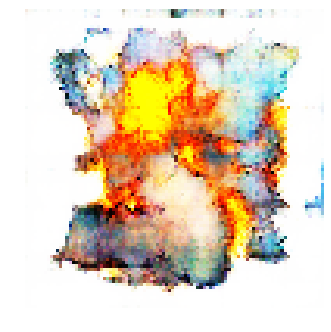


Epoch: 13660, D: -5.784, G: 3.155
Epoch: 13661, D: -6.631, G: 4.908
Epoch: 13662, D: -5.386, G: 3.218
Epoch: 13663, D: -6.586, G: 4.025
Epoch: 13664, D: -5.982, G: 1.971
Epoch: 13665, D: -7.799, G: 3.672
Epoch: 13666, D: -5.208, G: 0.8206
Epoch: 13667, D: -4.664, G: 5.211
Epoch: 13668, D: -5.976, G: 2.277
Epoch: 13669, D: -5.707, G: 4.488
Epoch: 13670, D: -6.786, G: 2.644
Epoch: 13671, D: -5.717, G: 2.93
Epoch: 13672, D: -6.008, G: 3.231
Epoch: 13673, D: -6.162, G: 3.929
Epoch: 13674, D: -6.343, G: 4.581
Epoch: 13675, D: -5.898, G: 4.97
Epoch: 13676, D: -6.151, G: 1.62
Epoch: 13677, D: -5.573, G: 4.066
Epoch: 13678, D: -6.491, G: 3.611
Epoch: 13679, D: -6.545, G: 3.166


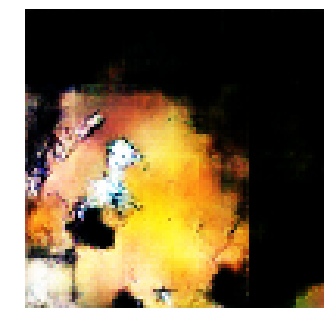


Epoch: 13680, D: -5.879, G: 3.599
Epoch: 13681, D: -4.497, G: 4.545
Epoch: 13682, D: -5.751, G: 3.352
Epoch: 13683, D: -5.66, G: 5.025
Epoch: 13684, D: -6.614, G: 5.411
Epoch: 13685, D: -5.177, G: 2.738
Epoch: 13686, D: -5.076, G: 2.594
Epoch: 13687, D: -5.266, G: 5.448
Epoch: 13688, D: -4.45, G: 4.905
Epoch: 13689, D: -5.282, G: 3.336
Epoch: 13690, D: -6.243, G: 5.207
Epoch: 13691, D: -6.157, G: 3.664
Epoch: 13692, D: -6.308, G: 4.721
Epoch: 13693, D: -5.076, G: 3.674
Epoch: 13694, D: -5.784, G: 1.406
Epoch: 13695, D: -5.084, G: 1.78
Epoch: 13696, D: -6.052, G: 3.093
Epoch: 13697, D: -5.335, G: 3.131
Epoch: 13698, D: -6.137, G: 4.557
Epoch: 13699, D: -5.852, G: 6.997


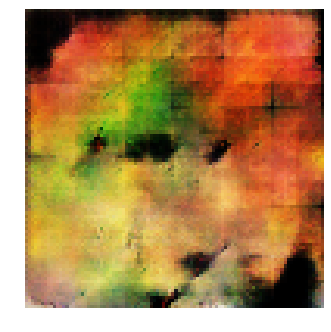


Epoch: 13700, D: -7.724, G: 2.779
Epoch: 13701, D: -6.879, G: 2.943
Epoch: 13702, D: -5.105, G: 3.524
Epoch: 13703, D: -7.73, G: 4.795
Epoch: 13704, D: -7.805, G: 0.9767
Epoch: 13705, D: -6.305, G: 3.402
Epoch: 13706, D: -6.861, G: 4.457
Epoch: 13707, D: -6.317, G: 6.321
Epoch: 13708, D: -6.482, G: 3.458
Epoch: 13709, D: -5.213, G: 4.773
Epoch: 13710, D: -6.329, G: 3.833
Epoch: 13711, D: -5.591, G: 4.183
Epoch: 13712, D: -5.874, G: 2.028
Epoch: 13713, D: -7.292, G: 1.926
Epoch: 13714, D: -5.068, G: 1.598
Epoch: 13715, D: -6.963, G: 5.946
Epoch: 13716, D: -5.618, G: 3.209
Epoch: 13717, D: -5.663, G: 3.107
Epoch: 13718, D: -5.84, G: 5.289
Epoch: 13719, D: -6.096, G: 2.492


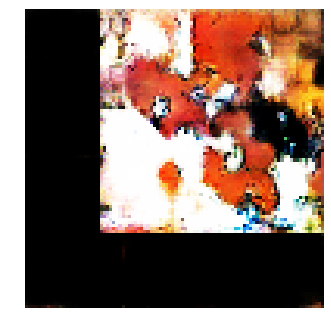


Epoch: 13720, D: -7.063, G: 5.761
Epoch: 13721, D: -7.368, G: 2.609
Epoch: 13722, D: -6.077, G: 2.909
Epoch: 13723, D: -5.103, G: 3.32
Epoch: 13724, D: -6.964, G: 2.47
Epoch: 13725, D: -6.478, G: 4.009
Epoch: 13726, D: -5.189, G: 1.931
Epoch: 13727, D: -4.926, G: 1.822
Epoch: 13728, D: -6.344, G: 5.856
Epoch: 13729, D: -6.834, G: 2.167
Epoch: 13730, D: -7.199, G: 6.969
Epoch: 13731, D: -6.946, G: 3.749
Epoch: 13732, D: -6.383, G: 2.156
Epoch: 13733, D: -6.488, G: 5.002
Epoch: 13734, D: -6.933, G: 5.285
Epoch: 13735, D: -5.935, G: 2.785
Epoch: 13736, D: -5.219, G: 5.1
Epoch: 13737, D: -6.332, G: 3.852
Epoch: 13738, D: -5.53, G: 3.582
Epoch: 13739, D: -5.591, G: 2.471


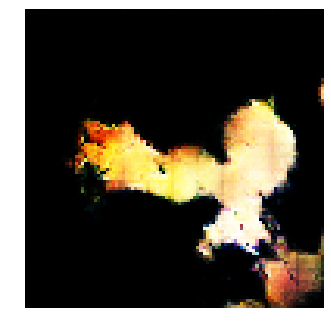


Epoch: 13740, D: -5.4, G: 3.197
Epoch: 13741, D: -6.053, G: 5.484
Epoch: 13742, D: -5.761, G: 2.968
Epoch: 13743, D: -6.569, G: 3.487
Epoch: 13744, D: -5.644, G: 4.206
Epoch: 13745, D: -7.093, G: 2.896
Epoch: 13746, D: -5.914, G: 4.166
Epoch: 13747, D: -6.032, G: 3.041
Epoch: 13748, D: -4.887, G: 3.008
Epoch: 13749, D: -6.973, G: 4.721
Epoch: 13750, D: -6.278, G: 4.795
Epoch: 13751, D: -4.564, G: 1.76
Epoch: 13752, D: -7.17, G: 6.78
Epoch: 13753, D: -6.364, G: 4.178
Epoch: 13754, D: -5.245, G: 2.397
Epoch: 13755, D: -6.874, G: 4.894
Epoch: 13756, D: -5.973, G: 4.564
Epoch: 13757, D: -5.891, G: 4.023
Epoch: 13758, D: -6.628, G: 4.742
Epoch: 13759, D: -6.75, G: 1.395


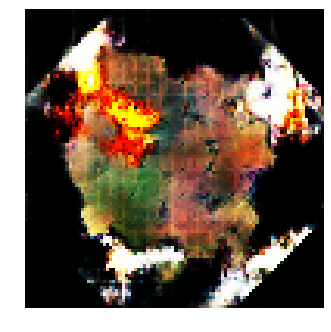


Epoch: 13760, D: -6.771, G: 3.034
Epoch: 13761, D: -5.486, G: 4.63
Epoch: 13762, D: -5.612, G: 2.64
Epoch: 13763, D: -7.201, G: 6.084
Epoch: 13764, D: -5.694, G: 2.669
Epoch: 13765, D: -6.487, G: 3.308
Epoch: 13766, D: -5.754, G: 1.812
Epoch: 13767, D: -5.301, G: 2.649
Epoch: 13768, D: -4.656, G: 2.217
Epoch: 13769, D: -5.452, G: 3.401
Epoch: 13770, D: -7.37, G: 5.245
Epoch: 13771, D: -4.69, G: 2.968
Epoch: 13772, D: -6.426, G: 5.117
Epoch: 13773, D: -4.832, G: 4.006
Epoch: 13774, D: -7.033, G: 3.821
Epoch: 13775, D: -5.419, G: 4.514
Epoch: 13776, D: -6.192, G: 4.159
Epoch: 13777, D: -5.908, G: 6.889
Epoch: 13778, D: -5.501, G: 4.399
Epoch: 13779, D: -6.178, G: 4.926


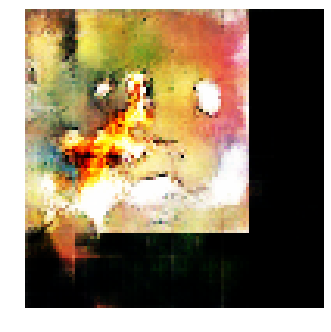


Epoch: 13780, D: -8.154, G: 3.994
Epoch: 13781, D: -6.87, G: 5.567
Epoch: 13782, D: -5.463, G: 2.788
Epoch: 13783, D: -6.166, G: 5.368
Epoch: 13784, D: -5.641, G: 5.219
Epoch: 13785, D: -6.263, G: 2.637
Epoch: 13786, D: -6.401, G: 3.124
Epoch: 13787, D: -6.775, G: 5.126
Epoch: 13788, D: -4.598, G: 6.338
Epoch: 13789, D: -7.947, G: 4.748
Epoch: 13790, D: -5.602, G: 1.638
Epoch: 13791, D: -4.975, G: 3.566
Epoch: 13792, D: -6.052, G: 6.221
Epoch: 13793, D: -6.303, G: 2.668
Epoch: 13794, D: -4.72, G: 2.53
Epoch: 13795, D: -5.032, G: 2.982
Epoch: 13796, D: -5.74, G: 4.017
Epoch: 13797, D: -6.937, G: 4.164
Epoch: 13798, D: -6.663, G: 3.666
Epoch: 13799, D: -5.898, G: 4.18


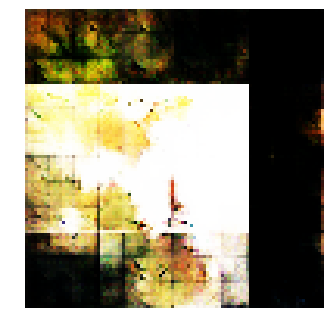


Epoch: 13800, D: -5.974, G: 2.866
Epoch: 13801, D: -6.089, G: 3.493
Epoch: 13802, D: -6.678, G: 4.871
Epoch: 13803, D: -5.976, G: 2.856
Epoch: 13804, D: -6.849, G: 4.262
Epoch: 13805, D: -4.955, G: 3.99
Epoch: 13806, D: -4.947, G: 3.637
Epoch: 13807, D: -5.113, G: 2.31
Epoch: 13808, D: -3.75, G: 3.434
Epoch: 13809, D: -7.3, G: 4.455
Epoch: 13810, D: -5.749, G: 2.939
Epoch: 13811, D: -6.63, G: 5.93
Epoch: 13812, D: -5.701, G: 3.773
Epoch: 13813, D: -4.901, G: 3.852
Epoch: 13814, D: -6.634, G: 5.814
Epoch: 13815, D: -6.51, G: 3.747
Epoch: 13816, D: -4.399, G: 4.55
Epoch: 13817, D: -6.99, G: 2.271
Epoch: 13818, D: -6.305, G: 1.327
Epoch: 13819, D: -5.208, G: 3.805


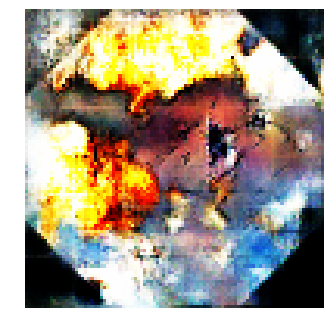


Epoch: 13820, D: -4.781, G: 4.735
Epoch: 13821, D: -5.039, G: 4.474
Epoch: 13822, D: -5.834, G: 2.4
Epoch: 13823, D: -5.4, G: 3.326
Epoch: 13824, D: -4.881, G: 3.816
Epoch: 13825, D: -5.606, G: 4.293
Epoch: 13826, D: -5.349, G: 4.147
Epoch: 13827, D: -5.465, G: 3.147
Epoch: 13828, D: -5.309, G: 3.892
Epoch: 13829, D: -4.678, G: 4.137
Epoch: 13830, D: -6.21, G: 3.86
Epoch: 13831, D: -6.132, G: 2.357
Epoch: 13832, D: -5.753, G: 6.015
Epoch: 13833, D: -4.904, G: 3.051
Epoch: 13834, D: -5.418, G: 3.624
Epoch: 13835, D: -5.514, G: 2.932
Epoch: 13836, D: -5.7, G: 3.12
Epoch: 13837, D: -5.998, G: 5.43
Epoch: 13838, D: -5.519, G: 4.489
Epoch: 13839, D: -6.201, G: 6.871


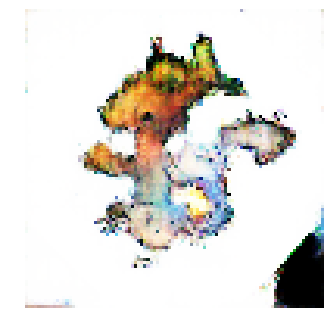


Epoch: 13840, D: -5.586, G: 5.104
Epoch: 13841, D: -4.731, G: 3.449
Epoch: 13842, D: -4.687, G: 2.99
Epoch: 13843, D: -6.02, G: 3.313
Epoch: 13844, D: -5.328, G: 2.141
Epoch: 13845, D: -7.428, G: 3.706
Epoch: 13846, D: -6.435, G: 4.235
Epoch: 13847, D: -5.169, G: 4.629
Epoch: 13848, D: -7.748, G: 4.0
Epoch: 13849, D: -5.106, G: 4.258
Epoch: 13850, D: -6.627, G: 2.393
Epoch: 13851, D: -5.164, G: 2.551
Epoch: 13852, D: -6.784, G: 4.336
Epoch: 13853, D: -5.619, G: 2.627
Epoch: 13854, D: -6.227, G: 6.238
Epoch: 13855, D: -6.329, G: 4.279
Epoch: 13856, D: -5.944, G: 2.484
Epoch: 13857, D: -4.786, G: 3.082
Epoch: 13858, D: -5.785, G: 3.385
Epoch: 13859, D: -5.739, G: 2.832


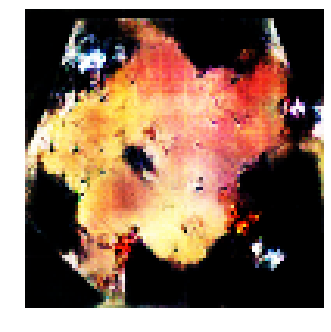


Epoch: 13860, D: -5.205, G: 2.712
Epoch: 13861, D: -5.23, G: 2.534
Epoch: 13862, D: -6.557, G: 4.907
Epoch: 13863, D: -6.854, G: 2.329
Epoch: 13864, D: -5.507, G: 4.07
Epoch: 13865, D: -5.172, G: 3.923
Epoch: 13866, D: -6.572, G: 2.909
Epoch: 13867, D: -5.576, G: 4.711
Epoch: 13868, D: -5.456, G: 1.942
Epoch: 13869, D: -6.32, G: 4.441
Epoch: 13870, D: -7.519, G: 2.627
Epoch: 13871, D: -4.736, G: 1.745
Epoch: 13872, D: -7.014, G: 3.014
Epoch: 13873, D: -6.792, G: 4.49
Epoch: 13874, D: -6.339, G: 1.801
Epoch: 13875, D: -5.326, G: 4.53
Epoch: 13876, D: -5.612, G: 4.384
Epoch: 13877, D: -6.017, G: 4.666
Epoch: 13878, D: -5.015, G: 1.27
Epoch: 13879, D: -6.252, G: 4.015


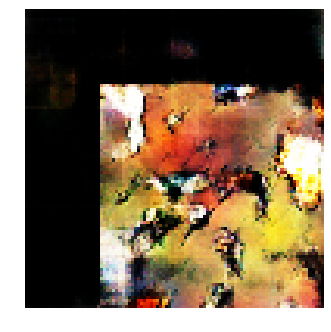


Epoch: 13880, D: -5.531, G: 6.317
Epoch: 13881, D: -6.087, G: 4.963
Epoch: 13882, D: -5.501, G: 2.292
Epoch: 13883, D: -4.642, G: 3.533
Epoch: 13884, D: -5.149, G: 4.84
Epoch: 13885, D: -7.42, G: 4.283
Epoch: 13886, D: -5.189, G: 3.1
Epoch: 13887, D: -6.817, G: 2.595
Epoch: 13888, D: -6.505, G: 3.802
Epoch: 13889, D: -6.988, G: 4.954
Epoch: 13890, D: -5.239, G: 6.5
Epoch: 13891, D: -6.392, G: 5.367
Epoch: 13892, D: -5.83, G: 2.806
Epoch: 13893, D: -5.677, G: 5.526
Epoch: 13894, D: -7.486, G: 2.861
Epoch: 13895, D: -5.933, G: 5.039
Epoch: 13896, D: -7.571, G: 3.92
Epoch: 13897, D: -5.177, G: 2.824
Epoch: 13898, D: -5.005, G: 4.328
Epoch: 13899, D: -6.379, G: 3.132


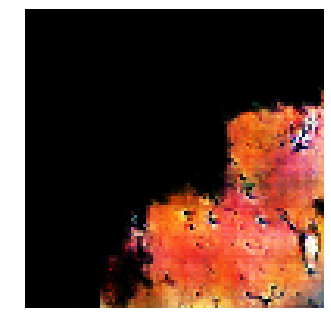


Epoch: 13900, D: -5.194, G: 4.74
Epoch: 13901, D: -4.119, G: 4.918
Epoch: 13902, D: -6.499, G: 4.662
Epoch: 13903, D: -5.686, G: 1.75
Epoch: 13904, D: -5.967, G: 5.333
Epoch: 13905, D: -5.948, G: 5.628
Epoch: 13906, D: -4.995, G: 3.459
Epoch: 13907, D: -7.972, G: 5.796
Epoch: 13908, D: -4.468, G: 3.42
Epoch: 13909, D: -5.63, G: 5.285
Epoch: 13910, D: -5.791, G: 4.849
Epoch: 13911, D: -4.235, G: 2.322
Epoch: 13912, D: -5.039, G: 4.251
Epoch: 13913, D: -7.183, G: 1.999
Epoch: 13914, D: -6.061, G: -0.6466
Epoch: 13915, D: -6.228, G: 2.26
Epoch: 13916, D: -6.122, G: 3.196
Epoch: 13917, D: -5.084, G: 3.35
Epoch: 13918, D: -7.272, G: 5.561
Epoch: 13919, D: -6.575, G: 3.248


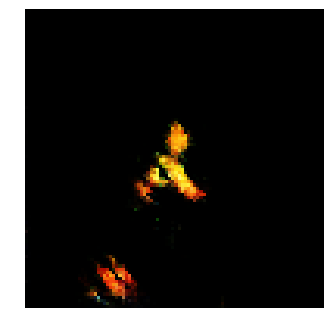


Epoch: 13920, D: -5.709, G: 4.208
Epoch: 13921, D: -5.723, G: 3.824
Epoch: 13922, D: -5.409, G: 4.415
Epoch: 13923, D: -6.993, G: 4.044
Epoch: 13924, D: -6.489, G: 1.365
Epoch: 13925, D: -6.266, G: 4.131
Epoch: 13926, D: -5.937, G: 3.052
Epoch: 13927, D: -6.215, G: 3.074
Epoch: 13928, D: -5.845, G: 3.957
Epoch: 13929, D: -5.682, G: 4.843
Epoch: 13930, D: -6.13, G: 1.574
Epoch: 13931, D: -7.367, G: 4.966
Epoch: 13932, D: -7.357, G: 4.243
Epoch: 13933, D: -5.08, G: 4.054
Epoch: 13934, D: -5.193, G: 3.395
Epoch: 13935, D: -4.503, G: 5.149
Epoch: 13936, D: -6.766, G: 5.521
Epoch: 13937, D: -7.451, G: 2.584
Epoch: 13938, D: -6.932, G: 1.922
Epoch: 13939, D: -5.888, G: 4.112


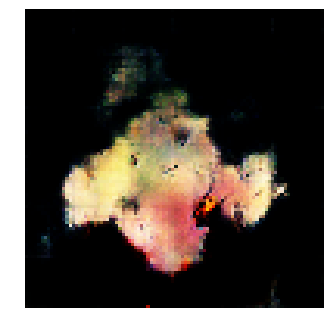


Epoch: 13940, D: -6.049, G: 2.599
Epoch: 13941, D: -6.464, G: 1.747
Epoch: 13942, D: -6.964, G: 3.8
Epoch: 13943, D: -4.618, G: 3.002
Epoch: 13944, D: -5.666, G: 5.331
Epoch: 13945, D: -6.563, G: 6.471
Epoch: 13946, D: -5.562, G: 4.479
Epoch: 13947, D: -5.435, G: 4.203
Epoch: 13948, D: -6.743, G: 5.764
Epoch: 13949, D: -5.583, G: 3.409
Epoch: 13950, D: -5.44, G: 3.95
Epoch: 13951, D: -6.396, G: 3.544
Epoch: 13952, D: -6.089, G: 4.757
Epoch: 13953, D: -7.622, G: 5.349
Epoch: 13954, D: -4.953, G: 4.65
Epoch: 13955, D: -6.706, G: 3.034
Epoch: 13956, D: -7.205, G: 3.19
Epoch: 13957, D: -5.87, G: 2.615
Epoch: 13958, D: -6.328, G: 0.3363
Epoch: 13959, D: -6.259, G: 3.444


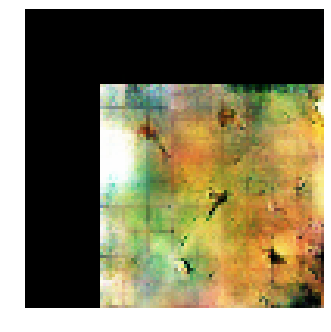


Epoch: 13960, D: -6.145, G: 4.679
Epoch: 13961, D: -5.605, G: 2.61
Epoch: 13962, D: -6.055, G: 5.566
Epoch: 13963, D: -8.493, G: 2.83
Epoch: 13964, D: -5.454, G: 4.247
Epoch: 13965, D: -6.537, G: 3.498
Epoch: 13966, D: -5.212, G: 3.453
Epoch: 13967, D: -5.795, G: 1.826
Epoch: 13968, D: -6.467, G: 4.395
Epoch: 13969, D: -5.293, G: 3.746
Epoch: 13970, D: -5.137, G: 4.54
Epoch: 13971, D: -8.192, G: 5.521
Epoch: 13972, D: -5.384, G: 4.914
Epoch: 13973, D: -7.303, G: 4.146
Epoch: 13974, D: -4.999, G: 4.576
Epoch: 13975, D: -6.374, G: 5.268
Epoch: 13976, D: -5.85, G: 3.154
Epoch: 13977, D: -5.97, G: 4.11
Epoch: 13978, D: -6.786, G: 3.842
Epoch: 13979, D: -5.61, G: 1.851


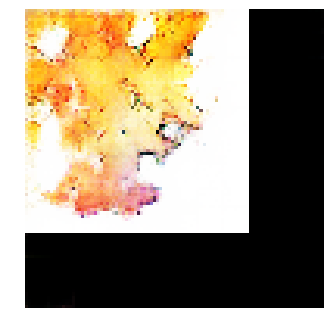


Epoch: 13980, D: -5.645, G: 4.363
Epoch: 13981, D: -6.638, G: 4.12
Epoch: 13982, D: -7.23, G: 4.178
Epoch: 13983, D: -6.434, G: 3.526
Epoch: 13984, D: -7.252, G: 2.942
Epoch: 13985, D: -5.135, G: 4.628
Epoch: 13986, D: -7.25, G: 4.113
Epoch: 13987, D: -6.031, G: 4.887
Epoch: 13988, D: -7.0, G: 3.566
Epoch: 13989, D: -5.403, G: 5.049
Epoch: 13990, D: -5.686, G: 4.029
Epoch: 13991, D: -6.29, G: 4.633
Epoch: 13992, D: -4.861, G: 5.49
Epoch: 13993, D: -5.537, G: 3.315
Epoch: 13994, D: -5.367, G: 3.276
Epoch: 13995, D: -7.109, G: 2.547
Epoch: 13996, D: -5.829, G: 2.722
Epoch: 13997, D: -6.418, G: 4.827
Epoch: 13998, D: -4.526, G: 3.672
Epoch: 13999, D: -5.274, G: 2.956


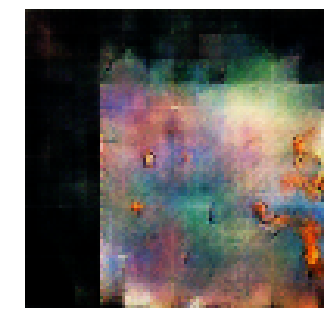


Epoch: 14000, D: -6.382, G: 1.754
Epoch: 14001, D: -5.669, G: 4.505
Epoch: 14002, D: -6.172, G: 4.762
Epoch: 14003, D: -6.15, G: 2.733
Epoch: 14004, D: -6.219, G: 4.04
Epoch: 14005, D: -5.673, G: 2.903
Epoch: 14006, D: -5.509, G: 3.192
Epoch: 14007, D: -5.47, G: 1.976
Epoch: 14008, D: -6.611, G: 1.855
Epoch: 14009, D: -5.646, G: 3.134
Epoch: 14010, D: -5.651, G: 3.877
Epoch: 14011, D: -6.574, G: 3.632
Epoch: 14012, D: -6.685, G: 3.487
Epoch: 14013, D: -5.749, G: 4.243
Epoch: 14014, D: -6.278, G: 3.6
Epoch: 14015, D: -6.396, G: 4.012
Epoch: 14016, D: -6.39, G: 4.548
Epoch: 14017, D: -4.545, G: 1.304
Epoch: 14018, D: -6.074, G: 4.785
Epoch: 14019, D: -5.12, G: 4.4


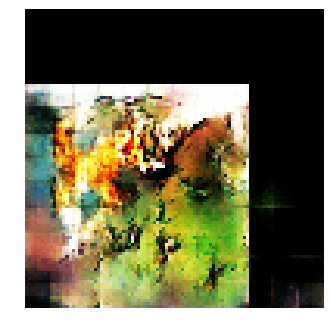


Epoch: 14020, D: -5.963, G: 4.584
Epoch: 14021, D: -6.335, G: 3.17
Epoch: 14022, D: -5.533, G: 5.6
Epoch: 14023, D: -6.927, G: 4.573
Epoch: 14024, D: -6.252, G: 2.371
Epoch: 14025, D: -4.759, G: 1.585
Epoch: 14026, D: -5.342, G: 3.674
Epoch: 14027, D: -5.864, G: 3.087
Epoch: 14028, D: -6.304, G: 2.895
Epoch: 14029, D: -6.587, G: 4.011
Epoch: 14030, D: -6.842, G: 2.415
Epoch: 14031, D: -5.519, G: 1.466
Epoch: 14032, D: -5.462, G: 6.691
Epoch: 14033, D: -5.782, G: 4.977
Epoch: 14034, D: -5.687, G: 2.426
Epoch: 14035, D: -4.735, G: 3.065
Epoch: 14036, D: -6.643, G: 2.524
Epoch: 14037, D: -5.845, G: 1.152
Epoch: 14038, D: -5.797, G: 2.008
Epoch: 14039, D: -6.002, G: 3.593


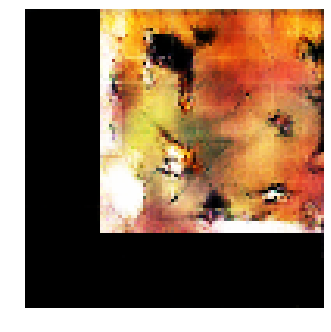


Epoch: 14040, D: -5.319, G: 3.388
Epoch: 14041, D: -5.464, G: 4.015
Epoch: 14042, D: -5.915, G: 4.265
Epoch: 14043, D: -6.46, G: 4.474
Epoch: 14044, D: -6.081, G: 5.453
Epoch: 14045, D: -6.643, G: 5.16
Epoch: 14046, D: -5.341, G: 3.888
Epoch: 14047, D: -6.336, G: 1.274
Epoch: 14048, D: -5.532, G: 1.484
Epoch: 14049, D: -5.137, G: 4.154
Epoch: 14050, D: -6.324, G: 4.665
Epoch: 14051, D: -4.912, G: 4.741
Epoch: 14052, D: -5.981, G: 4.409
Epoch: 14053, D: -5.974, G: 3.702
Epoch: 14054, D: -5.806, G: 3.343
Epoch: 14055, D: -6.242, G: 4.536
Epoch: 14056, D: -5.329, G: 1.895
Epoch: 14057, D: -6.595, G: 6.231
Epoch: 14058, D: -6.53, G: 4.425
Epoch: 14059, D: -6.191, G: 2.055


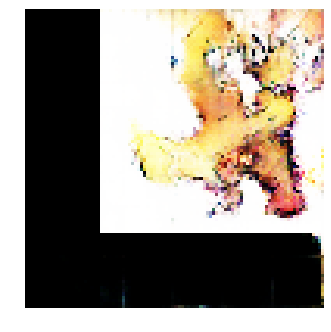


Epoch: 14060, D: -4.765, G: 3.723
Epoch: 14061, D: -6.852, G: 3.932
Epoch: 14062, D: -7.631, G: 5.111
Epoch: 14063, D: -5.676, G: 2.135
Epoch: 14064, D: -5.946, G: 4.421
Epoch: 14065, D: -6.466, G: 4.077
Epoch: 14066, D: -6.993, G: 5.202
Epoch: 14067, D: -6.948, G: 1.356
Epoch: 14068, D: -5.208, G: 2.718
Epoch: 14069, D: -6.976, G: 3.899
Epoch: 14070, D: -6.612, G: 2.569
Epoch: 14071, D: -6.566, G: 4.615
Epoch: 14072, D: -5.162, G: 2.195
Epoch: 14073, D: -5.179, G: 2.72
Epoch: 14074, D: -5.771, G: 4.731
Epoch: 14075, D: -5.399, G: 4.395
Epoch: 14076, D: -6.116, G: 3.458
Epoch: 14077, D: -7.319, G: 5.869
Epoch: 14078, D: -6.088, G: 2.944
Epoch: 14079, D: -7.362, G: 3.03


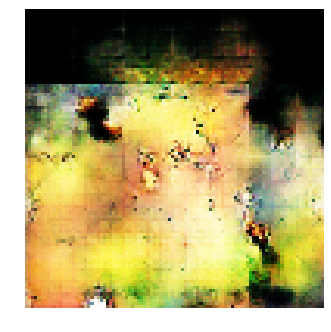


Epoch: 14080, D: -5.235, G: 0.2174
Epoch: 14081, D: -5.676, G: 4.491
Epoch: 14082, D: -6.045, G: 4.982
Epoch: 14083, D: -7.114, G: 4.653
Epoch: 14084, D: -7.183, G: 4.495
Epoch: 14085, D: -5.957, G: 4.007
Epoch: 14086, D: -4.947, G: 4.815
Epoch: 14087, D: -5.932, G: 1.842
Epoch: 14088, D: -7.365, G: 0.7195
Epoch: 14089, D: -7.288, G: 4.568
Epoch: 14090, D: -6.013, G: 4.574
Epoch: 14091, D: -6.849, G: 4.15
Epoch: 14092, D: -6.451, G: 2.792
Epoch: 14093, D: -7.961, G: 5.968
Epoch: 14094, D: -7.292, G: 1.598
Epoch: 14095, D: -5.202, G: 1.843
Epoch: 14096, D: -6.621, G: 5.597
Epoch: 14097, D: -6.729, G: 0.5051
Epoch: 14098, D: -5.326, G: 4.114
Epoch: 14099, D: -5.661, G: 4.336


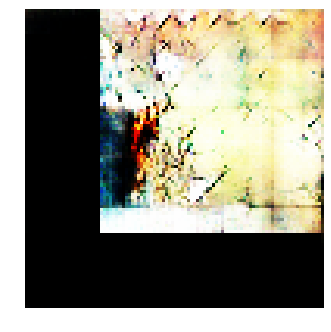


Epoch: 14100, D: -6.767, G: 4.791
Epoch: 14101, D: -5.075, G: 2.277
Epoch: 14102, D: -5.701, G: 3.421
Epoch: 14103, D: -5.901, G: 4.985
Epoch: 14104, D: -5.984, G: 5.657
Epoch: 14105, D: -5.222, G: 3.267
Epoch: 14106, D: -4.161, G: 4.248
Epoch: 14107, D: -5.322, G: 5.108
Epoch: 14108, D: -5.407, G: 2.327
Epoch: 14109, D: -5.775, G: 0.7949
Epoch: 14110, D: -5.155, G: 4.888
Epoch: 14111, D: -6.976, G: 1.903
Epoch: 14112, D: -6.705, G: 3.389
Epoch: 14113, D: -5.911, G: 3.228
Epoch: 14114, D: -6.601, G: 3.277
Epoch: 14115, D: -6.694, G: 3.049
Epoch: 14116, D: -5.618, G: 4.347
Epoch: 14117, D: -6.781, G: 2.557
Epoch: 14118, D: -5.404, G: 1.118
Epoch: 14119, D: -5.562, G: 3.352


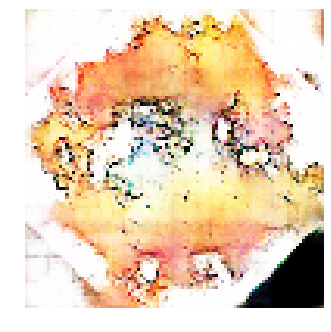


Epoch: 14120, D: -6.144, G: 3.421
Epoch: 14121, D: -5.669, G: 4.111
Epoch: 14122, D: -6.925, G: 4.821
Epoch: 14123, D: -5.282, G: 4.281
Epoch: 14124, D: -6.686, G: 5.46
Epoch: 14125, D: -5.474, G: 4.426
Epoch: 14126, D: -6.162, G: 4.865
Epoch: 14127, D: -5.712, G: 0.8141
Epoch: 14128, D: -6.611, G: 2.191
Epoch: 14129, D: -7.023, G: 3.369
Epoch: 14130, D: -5.604, G: 3.913
Epoch: 14131, D: -5.602, G: 4.238
Epoch: 14132, D: -5.727, G: 1.778
Epoch: 14133, D: -5.806, G: 2.411
Epoch: 14134, D: -6.304, G: 3.257
Epoch: 14135, D: -6.671, G: 2.493
Epoch: 14136, D: -6.084, G: 3.971
Epoch: 14137, D: -5.411, G: 4.054
Epoch: 14138, D: -4.259, G: 3.856
Epoch: 14139, D: -6.327, G: 3.314


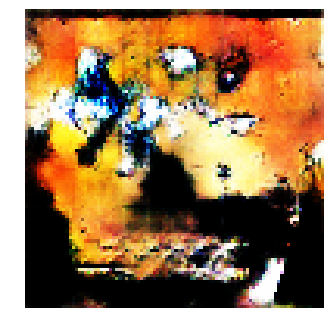


Epoch: 14140, D: -5.927, G: 4.191
Epoch: 14141, D: -6.564, G: 2.941
Epoch: 14142, D: -5.908, G: 4.285
Epoch: 14143, D: -5.901, G: 5.265
Epoch: 14144, D: -7.462, G: 2.866
Epoch: 14145, D: -6.024, G: 7.157
Epoch: 14146, D: -5.078, G: 3.276
Epoch: 14147, D: -4.819, G: 2.698
Epoch: 14148, D: -5.446, G: 3.642
Epoch: 14149, D: -5.519, G: 1.113
Epoch: 14150, D: -6.005, G: 2.543
Epoch: 14151, D: -6.518, G: 6.425
Epoch: 14152, D: -5.658, G: 5.559
Epoch: 14153, D: -4.694, G: 3.829
Epoch: 14154, D: -6.5, G: 3.549
Epoch: 14155, D: -5.847, G: 4.665
Epoch: 14156, D: -6.558, G: 4.112
Epoch: 14157, D: -7.169, G: 0.4614
Epoch: 14158, D: -4.453, G: 1.892
Epoch: 14159, D: -7.583, G: 2.053


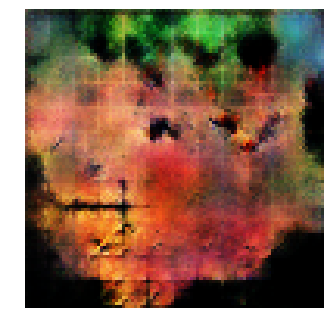


Epoch: 14160, D: -5.751, G: -0.8773
Epoch: 14161, D: -6.059, G: 5.288
Epoch: 14162, D: -6.184, G: 3.901
Epoch: 14163, D: -6.35, G: 4.535
Epoch: 14164, D: -4.429, G: 1.253
Epoch: 14165, D: -6.977, G: 5.227
Epoch: 14166, D: -5.662, G: 2.711
Epoch: 14167, D: -5.506, G: 3.18
Epoch: 14168, D: -5.288, G: 4.223
Epoch: 14169, D: -5.443, G: 2.337
Epoch: 14170, D: -6.367, G: 5.973
Epoch: 14171, D: -5.989, G: 3.108
Epoch: 14172, D: -6.937, G: 2.683
Epoch: 14173, D: -5.589, G: 4.124
Epoch: 14174, D: -5.862, G: 4.158
Epoch: 14175, D: -5.428, G: 4.471
Epoch: 14176, D: -6.696, G: 2.895
Epoch: 14177, D: -5.217, G: 4.356
Epoch: 14178, D: -5.546, G: 5.249
Epoch: 14179, D: -5.134, G: 5.26


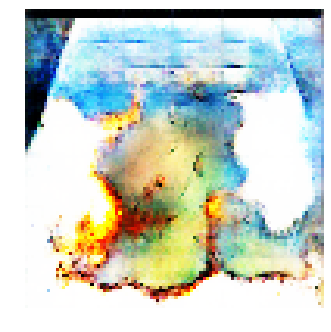


Epoch: 14180, D: -6.866, G: 3.074
Epoch: 14181, D: -6.875, G: 3.512
Epoch: 14182, D: -6.668, G: 7.099
Epoch: 14183, D: -6.812, G: 4.955
Epoch: 14184, D: -5.876, G: 4.361
Epoch: 14185, D: -6.733, G: 4.926
Epoch: 14186, D: -6.157, G: 5.633
Epoch: 14187, D: -6.384, G: 3.881
Epoch: 14188, D: -6.322, G: 5.131
Epoch: 14189, D: -5.927, G: 4.654
Epoch: 14190, D: -5.756, G: 4.772
Epoch: 14191, D: -6.965, G: 3.605
Epoch: 14192, D: -7.078, G: 2.97
Epoch: 14193, D: -5.689, G: 1.117
Epoch: 14194, D: -6.463, G: 6.012
Epoch: 14195, D: -6.223, G: 3.231
Epoch: 14196, D: -5.448, G: 2.732
Epoch: 14197, D: -6.367, G: 2.906
Epoch: 14198, D: -6.647, G: 3.593
Epoch: 14199, D: -6.025, G: 2.965


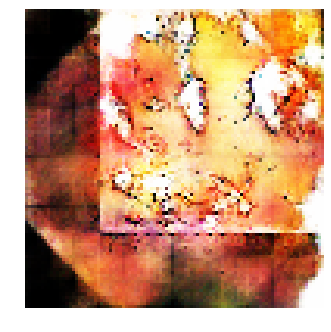


Epoch: 14200, D: -5.256, G: 3.608
Epoch: 14201, D: -5.052, G: 3.161
Epoch: 14202, D: -7.607, G: 5.265
Epoch: 14203, D: -6.883, G: 3.713
Epoch: 14204, D: -6.396, G: 4.921
Epoch: 14205, D: -5.362, G: 3.153
Epoch: 14206, D: -5.865, G: 4.369
Epoch: 14207, D: -6.525, G: 3.233
Epoch: 14208, D: -5.638, G: 4.067
Epoch: 14209, D: -6.319, G: 1.393
Epoch: 14210, D: -5.317, G: 3.987
Epoch: 14211, D: -5.344, G: 5.812
Epoch: 14212, D: -4.687, G: 6.111
Epoch: 14213, D: -5.814, G: 4.437
Epoch: 14214, D: -6.862, G: 1.822
Epoch: 14215, D: -5.161, G: 5.881
Epoch: 14216, D: -6.562, G: 4.29
Epoch: 14217, D: -5.616, G: 3.793
Epoch: 14218, D: -6.224, G: 5.541
Epoch: 14219, D: -5.96, G: 2.169


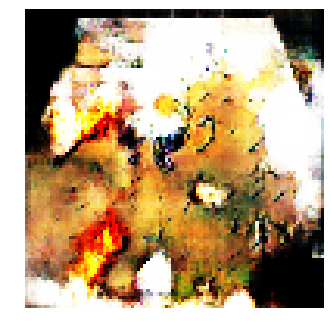


Epoch: 14220, D: -7.111, G: 5.428
Epoch: 14221, D: -6.005, G: 5.167
Epoch: 14222, D: -5.622, G: 2.017
Epoch: 14223, D: -5.535, G: 4.13
Epoch: 14224, D: -6.649, G: 3.248
Epoch: 14225, D: -5.802, G: 2.733
Epoch: 14226, D: -5.206, G: 4.816
Epoch: 14227, D: -5.533, G: 4.94
Epoch: 14228, D: -6.652, G: 2.682
Epoch: 14229, D: -6.235, G: 4.179
Epoch: 14230, D: -5.707, G: 0.4413
Epoch: 14231, D: -5.753, G: 2.028
Epoch: 14232, D: -5.783, G: 2.034
Epoch: 14233, D: -5.788, G: 4.433
Epoch: 14234, D: -5.607, G: 3.128
Epoch: 14235, D: -6.154, G: 2.17
Epoch: 14236, D: -6.754, G: 3.423
Epoch: 14237, D: -7.551, G: 2.728
Epoch: 14238, D: -4.771, G: 1.501
Epoch: 14239, D: -6.204, G: 5.073


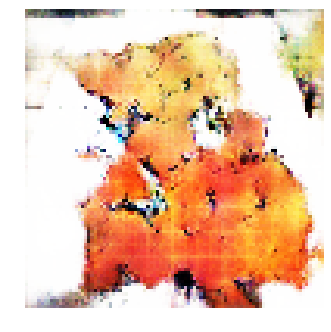


Epoch: 14240, D: -6.759, G: 5.754
Epoch: 14241, D: -5.614, G: 4.371
Epoch: 14242, D: -7.186, G: 5.42
Epoch: 14243, D: -6.332, G: 2.562
Epoch: 14244, D: -5.977, G: 1.351
Epoch: 14245, D: -5.478, G: 4.942
Epoch: 14246, D: -6.813, G: 3.077
Epoch: 14247, D: -5.508, G: 1.095
Epoch: 14248, D: -6.135, G: 4.29
Epoch: 14249, D: -5.988, G: 5.247
Epoch: 14250, D: -5.546, G: 1.489
Epoch: 14251, D: -5.086, G: 1.459
Epoch: 14252, D: -5.996, G: 5.722
Epoch: 14253, D: -6.756, G: 5.288
Epoch: 14254, D: -6.363, G: 3.662
Epoch: 14255, D: -5.912, G: 4.133
Epoch: 14256, D: -4.92, G: 5.274
Epoch: 14257, D: -4.417, G: 3.743
Epoch: 14258, D: -5.911, G: 4.697
Epoch: 14259, D: -6.569, G: 2.059


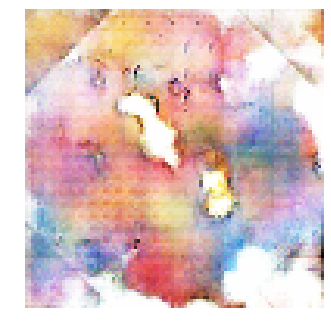


Epoch: 14260, D: -7.295, G: 4.772
Epoch: 14261, D: -6.453, G: 2.193
Epoch: 14262, D: -7.492, G: 1.254
Epoch: 14263, D: -6.507, G: 2.256
Epoch: 14264, D: -6.158, G: 2.669
Epoch: 14265, D: -4.291, G: 1.932
Epoch: 14266, D: -5.947, G: 3.181
Epoch: 14267, D: -8.098, G: 2.157
Epoch: 14268, D: -5.435, G: 3.702
Epoch: 14269, D: -6.257, G: 3.971
Epoch: 14270, D: -6.832, G: 4.398
Epoch: 14271, D: -6.627, G: 3.331
Epoch: 14272, D: -6.286, G: 4.939
Epoch: 14273, D: -6.147, G: 4.651
Epoch: 14274, D: -5.842, G: 4.107
Epoch: 14275, D: -6.627, G: 4.816
Epoch: 14276, D: -5.278, G: 2.548
Epoch: 14277, D: -5.798, G: 3.479
Epoch: 14278, D: -5.946, G: 3.852
Epoch: 14279, D: -5.153, G: 3.465


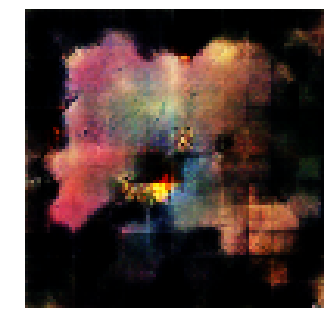


Epoch: 14280, D: -6.144, G: 4.2
Epoch: 14281, D: -5.991, G: 2.059
Epoch: 14282, D: -7.171, G: 3.705
Epoch: 14283, D: -4.78, G: 4.091
Epoch: 14284, D: -5.235, G: 2.862
Epoch: 14285, D: -5.471, G: 2.166
Epoch: 14286, D: -6.26, G: 4.42
Epoch: 14287, D: -5.647, G: 3.923
Epoch: 14288, D: -5.023, G: 1.262
Epoch: 14289, D: -6.933, G: 3.576
Epoch: 14290, D: -5.604, G: 4.196
Epoch: 14291, D: -6.761, G: 6.215
Epoch: 14292, D: -4.882, G: 4.508
Epoch: 14293, D: -6.74, G: 2.832
Epoch: 14294, D: -4.542, G: 2.94
Epoch: 14295, D: -6.354, G: 5.15
Epoch: 14296, D: -6.69, G: 3.475
Epoch: 14297, D: -7.516, G: 2.123
Epoch: 14298, D: -6.507, G: 2.878
Epoch: 14299, D: -5.562, G: 5.45


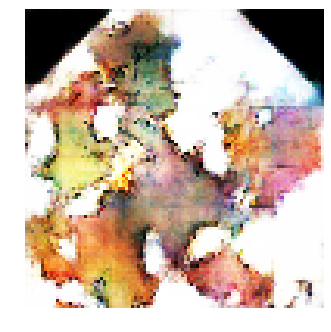


Epoch: 14300, D: -6.346, G: 4.309
Epoch: 14301, D: -6.58, G: 1.281
Epoch: 14302, D: -4.355, G: 2.596
Epoch: 14303, D: -5.511, G: 3.732
Epoch: 14304, D: -6.178, G: 5.388
Epoch: 14305, D: -5.427, G: 5.268
Epoch: 14306, D: -5.326, G: 4.539
Epoch: 14307, D: -5.769, G: 0.1779
Epoch: 14308, D: -5.975, G: 3.017
Epoch: 14309, D: -6.481, G: 4.878
Epoch: 14310, D: -6.63, G: 2.853
Epoch: 14311, D: -4.787, G: 2.167
Epoch: 14312, D: -5.99, G: 7.377
Epoch: 14313, D: -6.397, G: 3.15
Epoch: 14314, D: -4.432, G: 2.6
Epoch: 14315, D: -4.44, G: 3.706
Epoch: 14316, D: -6.201, G: 4.015
Epoch: 14317, D: -6.574, G: 0.1486
Epoch: 14318, D: -6.176, G: 3.309
Epoch: 14319, D: -6.172, G: 3.055


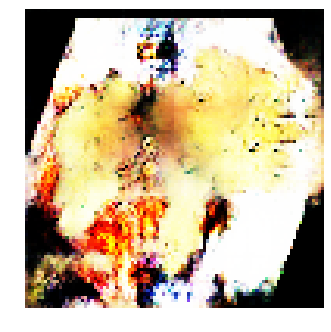


Epoch: 14320, D: -5.426, G: 1.378
Epoch: 14321, D: -5.491, G: 3.019
Epoch: 14322, D: -6.08, G: 4.757
Epoch: 14323, D: -6.019, G: 3.81
Epoch: 14324, D: -6.953, G: 5.135
Epoch: 14325, D: -5.226, G: 3.55
Epoch: 14326, D: -6.579, G: 5.272
Epoch: 14327, D: -6.338, G: 2.514
Epoch: 14328, D: -4.642, G: 0.8888
Epoch: 14329, D: -5.992, G: 3.43
Epoch: 14330, D: -5.473, G: 4.249
Epoch: 14331, D: -4.801, G: 3.554
Epoch: 14332, D: -6.25, G: 2.359
Epoch: 14333, D: -6.127, G: 3.28
Epoch: 14334, D: -6.945, G: 4.329
Epoch: 14335, D: -4.817, G: 2.087
Epoch: 14336, D: -6.18, G: 3.32
Epoch: 14337, D: -7.063, G: 2.795
Epoch: 14338, D: -6.879, G: 3.58
Epoch: 14339, D: -4.697, G: 3.109


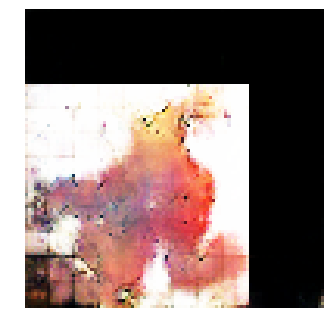


Epoch: 14340, D: -6.215, G: 4.413
Epoch: 14341, D: -5.108, G: 5.106
Epoch: 14342, D: -6.424, G: 3.26
Epoch: 14343, D: -6.618, G: 3.8
Epoch: 14344, D: -6.421, G: 4.657
Epoch: 14345, D: -5.785, G: 5.743
Epoch: 14346, D: -5.718, G: 3.592
Epoch: 14347, D: -6.858, G: 5.017
Epoch: 14348, D: -6.239, G: 2.752
Epoch: 14349, D: -6.262, G: 3.799
Epoch: 14350, D: -4.453, G: 5.406
Epoch: 14351, D: -6.287, G: 5.252
Epoch: 14352, D: -5.982, G: 4.072
Epoch: 14353, D: -5.544, G: 4.451
Epoch: 14354, D: -5.239, G: 4.433
Epoch: 14355, D: -7.373, G: 4.474
Epoch: 14356, D: -5.349, G: 2.892
Epoch: 14357, D: -7.037, G: 3.06
Epoch: 14358, D: -5.487, G: 3.965
Epoch: 14359, D: -6.198, G: 3.504


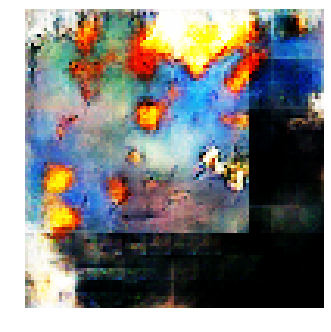


Epoch: 14360, D: -5.213, G: 2.673
Epoch: 14361, D: -5.45, G: 3.814
Epoch: 14362, D: -5.501, G: 4.435
Epoch: 14363, D: -5.093, G: 4.457
Epoch: 14364, D: -6.632, G: 3.353
Epoch: 14365, D: -6.042, G: 1.55
Epoch: 14366, D: -6.608, G: 1.926
Epoch: 14367, D: -6.055, G: 5.22
Epoch: 14368, D: -6.594, G: 6.082
Epoch: 14369, D: -5.974, G: 4.276
Epoch: 14370, D: -5.424, G: 7.24
Epoch: 14371, D: -4.25, G: 2.924
Epoch: 14372, D: -6.121, G: 3.588
Epoch: 14373, D: -6.274, G: 1.288
Epoch: 14374, D: -5.598, G: 5.364
Epoch: 14375, D: -5.718, G: 6.186
Epoch: 14376, D: -7.163, G: 3.083
Epoch: 14377, D: -5.569, G: 4.721
Epoch: 14378, D: -7.179, G: 4.121
Epoch: 14379, D: -4.599, G: 4.557


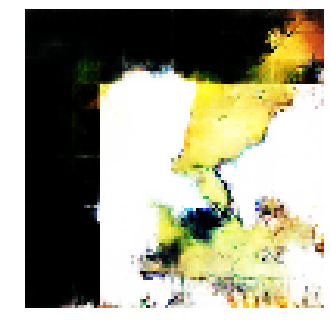


Epoch: 14380, D: -6.812, G: 1.882
Epoch: 14381, D: -4.664, G: 3.607
Epoch: 14382, D: -5.711, G: 3.39
Epoch: 14383, D: -7.523, G: 6.901
Epoch: 14384, D: -6.04, G: 4.438
Epoch: 14385, D: -6.424, G: 4.265
Epoch: 14386, D: -6.632, G: 4.794
Epoch: 14387, D: -6.048, G: 4.137
Epoch: 14388, D: -5.729, G: 3.145
Epoch: 14389, D: -8.283, G: 4.867
Epoch: 14390, D: -6.456, G: 3.9
Epoch: 14391, D: -5.929, G: 5.709
Epoch: 14392, D: -5.567, G: 4.322
Epoch: 14393, D: -5.371, G: 2.766
Epoch: 14394, D: -6.052, G: 4.331
Epoch: 14395, D: -6.679, G: 4.808
Epoch: 14396, D: -7.099, G: 3.482
Epoch: 14397, D: -6.005, G: 2.62
Epoch: 14398, D: -7.616, G: 4.331
Epoch: 14399, D: -7.972, G: 3.711


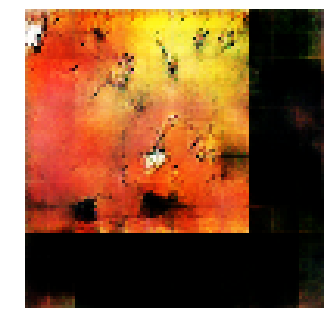


Epoch: 14400, D: -6.816, G: 3.848
Epoch: 14401, D: -6.089, G: 3.399
Epoch: 14402, D: -5.692, G: 4.321
Epoch: 14403, D: -5.69, G: 3.21
Epoch: 14404, D: -4.879, G: 2.615
Epoch: 14405, D: -5.612, G: 2.229
Epoch: 14406, D: -5.94, G: 2.17
Epoch: 14407, D: -6.097, G: 3.034
Epoch: 14408, D: -5.62, G: 4.561
Epoch: 14409, D: -6.813, G: 4.778
Epoch: 14410, D: -6.005, G: 3.716
Epoch: 14411, D: -4.746, G: 6.043
Epoch: 14412, D: -6.242, G: 3.157
Epoch: 14413, D: -6.202, G: 2.707
Epoch: 14414, D: -6.529, G: 5.689
Epoch: 14415, D: -7.36, G: 4.3
Epoch: 14416, D: -4.94, G: 4.776
Epoch: 14417, D: -7.092, G: 4.359
Epoch: 14418, D: -5.919, G: 3.903
Epoch: 14419, D: -7.275, G: 3.552


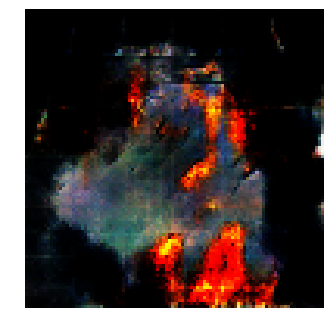


Epoch: 14420, D: -7.338, G: 3.142
Epoch: 14421, D: -5.841, G: 7.913
Epoch: 14422, D: -6.233, G: 5.412
Epoch: 14423, D: -5.12, G: 8.49
Epoch: 14424, D: -7.086, G: 1.683
Epoch: 14425, D: -5.969, G: 3.586
Epoch: 14426, D: -7.218, G: 3.702
Epoch: 14427, D: -4.707, G: 4.098
Epoch: 14428, D: -4.784, G: 2.25
Epoch: 14429, D: -7.135, G: 4.987
Epoch: 14430, D: -4.738, G: 3.965
Epoch: 14431, D: -5.964, G: 4.315
Epoch: 14432, D: -5.979, G: 2.321
Epoch: 14433, D: -5.663, G: 4.749
Epoch: 14434, D: -5.484, G: 3.239
Epoch: 14435, D: -7.759, G: 7.068
Epoch: 14436, D: -5.631, G: 4.549
Epoch: 14437, D: -6.431, G: 4.269
Epoch: 14438, D: -7.009, G: 3.568
Epoch: 14439, D: -6.191, G: 3.428


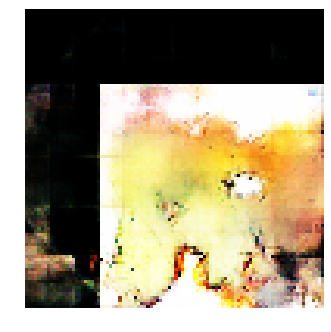


Epoch: 14440, D: -6.462, G: 4.305
Epoch: 14441, D: -5.969, G: 3.399
Epoch: 14442, D: -6.146, G: 3.603
Epoch: 14443, D: -6.597, G: 3.438
Epoch: 14444, D: -4.53, G: 3.824
Epoch: 14445, D: -6.907, G: 3.852
Epoch: 14446, D: -6.113, G: 4.612
Epoch: 14447, D: -6.239, G: 1.761
Epoch: 14448, D: -6.193, G: 2.467
Epoch: 14449, D: -7.045, G: 5.901
Epoch: 14450, D: -5.72, G: 8.031
Epoch: 14451, D: -6.906, G: 1.254
Epoch: 14452, D: -6.697, G: 3.837
Epoch: 14453, D: -6.006, G: 3.459
Epoch: 14454, D: -6.908, G: 3.621
Epoch: 14455, D: -6.169, G: 4.679
Epoch: 14456, D: -4.14, G: 1.667
Epoch: 14457, D: -6.002, G: 3.159
Epoch: 14458, D: -6.212, G: 3.342
Epoch: 14459, D: -5.309, G: 2.35


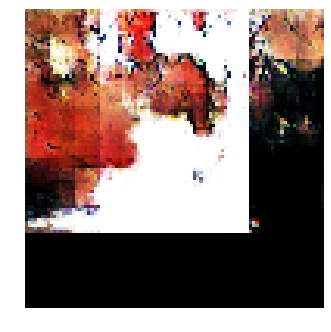


Epoch: 14460, D: -5.552, G: 5.052
Epoch: 14461, D: -5.953, G: 0.9451
Epoch: 14462, D: -5.896, G: 4.157
Epoch: 14463, D: -5.552, G: 3.964
Epoch: 14464, D: -6.615, G: 5.409
Epoch: 14465, D: -4.783, G: 3.127
Epoch: 14466, D: -5.537, G: 3.777
Epoch: 14467, D: -6.839, G: 6.121
Epoch: 14468, D: -7.341, G: 4.908
Epoch: 14469, D: -6.778, G: 5.251
Epoch: 14470, D: -4.784, G: 6.587
Epoch: 14471, D: -6.069, G: 4.959
Epoch: 14472, D: -6.075, G: 2.816
Epoch: 14473, D: -5.903, G: 3.774
Epoch: 14474, D: -6.97, G: 5.506
Epoch: 14475, D: -5.872, G: 3.644
Epoch: 14476, D: -5.512, G: 3.423
Epoch: 14477, D: -5.804, G: 4.852
Epoch: 14478, D: -6.441, G: 1.766
Epoch: 14479, D: -5.222, G: 2.76


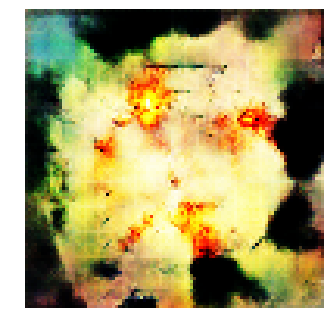


Epoch: 14480, D: -7.207, G: 6.747
Epoch: 14481, D: -5.434, G: 3.491
Epoch: 14482, D: -7.198, G: 6.874
Epoch: 14483, D: -5.354, G: 2.116
Epoch: 14484, D: -6.223, G: 5.842
Epoch: 14485, D: -6.093, G: 2.246
Epoch: 14486, D: -5.72, G: 4.102
Epoch: 14487, D: -5.236, G: 2.386
Epoch: 14488, D: -5.304, G: 3.134
Epoch: 14489, D: -5.575, G: 3.851
Epoch: 14490, D: -4.962, G: 3.691
Epoch: 14491, D: -6.606, G: 2.599
Epoch: 14492, D: -5.458, G: 2.648
Epoch: 14493, D: -6.658, G: 4.291
Epoch: 14494, D: -5.245, G: 4.687
Epoch: 14495, D: -6.889, G: 3.823
Epoch: 14496, D: -5.503, G: 3.723
Epoch: 14497, D: -5.596, G: 5.279
Epoch: 14498, D: -5.041, G: 2.584
Epoch: 14499, D: -6.038, G: 3.554


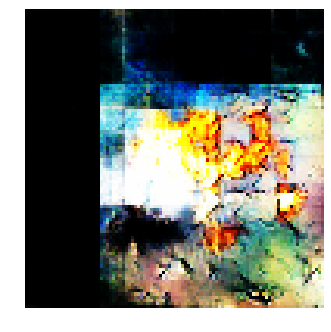


Epoch: 14500, D: -5.885, G: 3.889
Epoch: 14501, D: -6.528, G: 3.569
Epoch: 14502, D: -5.865, G: 4.622
Epoch: 14503, D: -5.591, G: 4.928
Epoch: 14504, D: -6.278, G: 2.339
Epoch: 14505, D: -7.075, G: 1.579
Epoch: 14506, D: -5.0, G: 1.292
Epoch: 14507, D: -6.312, G: 4.513
Epoch: 14508, D: -4.926, G: 4.309
Epoch: 14509, D: -5.118, G: 2.946
Epoch: 14510, D: -5.287, G: 3.933
Epoch: 14511, D: -6.24, G: 5.46
Epoch: 14512, D: -6.014, G: 3.562
Epoch: 14513, D: -5.746, G: 3.306
Epoch: 14514, D: -6.059, G: 4.119
Epoch: 14515, D: -6.371, G: 2.813
Epoch: 14516, D: -6.189, G: 3.964
Epoch: 14517, D: -7.139, G: 3.083
Epoch: 14518, D: -6.606, G: 2.284
Epoch: 14519, D: -5.927, G: 2.997


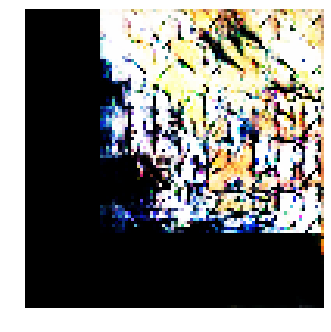


Epoch: 14520, D: -6.194, G: 3.116
Epoch: 14521, D: -6.441, G: 5.536
Epoch: 14522, D: -4.948, G: 4.403
Epoch: 14523, D: -6.334, G: 2.804
Epoch: 14524, D: -5.233, G: 2.776
Epoch: 14525, D: -6.555, G: 3.828
Epoch: 14526, D: -6.723, G: 3.802
Epoch: 14527, D: -5.477, G: 1.892
Epoch: 14528, D: -6.402, G: 5.788
Epoch: 14529, D: -5.509, G: 1.175
Epoch: 14530, D: -5.962, G: 4.638
Epoch: 14531, D: -4.908, G: 1.21
Epoch: 14532, D: -7.237, G: 4.831
Epoch: 14533, D: -5.401, G: 1.825
Epoch: 14534, D: -5.334, G: 4.845
Epoch: 14535, D: -6.192, G: 2.214
Epoch: 14536, D: -6.24, G: 4.131
Epoch: 14537, D: -5.457, G: 4.061
Epoch: 14538, D: -5.532, G: 5.386
Epoch: 14539, D: -6.087, G: 2.041


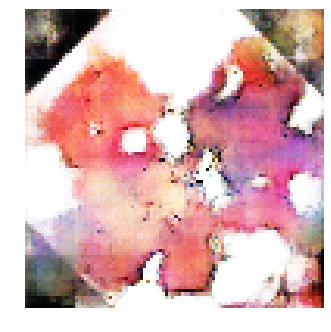


Epoch: 14540, D: -6.101, G: 6.842
Epoch: 14541, D: -6.905, G: 5.505
Epoch: 14542, D: -6.333, G: 2.325
Epoch: 14543, D: -6.228, G: 3.159
Epoch: 14544, D: -5.611, G: 2.824
Epoch: 14545, D: -5.075, G: 5.822
Epoch: 14546, D: -6.386, G: 3.639
Epoch: 14547, D: -6.56, G: 4.106
Epoch: 14548, D: -5.962, G: 7.58
Epoch: 14549, D: -5.782, G: 3.518
Epoch: 14550, D: -6.31, G: 4.14
Epoch: 14551, D: -6.44, G: 4.051
Epoch: 14552, D: -6.485, G: 2.568
Epoch: 14553, D: -6.995, G: 1.938
Epoch: 14554, D: -5.46, G: 4.15
Epoch: 14555, D: -4.995, G: 1.024
Epoch: 14556, D: -5.637, G: 2.479
Epoch: 14557, D: -5.078, G: 3.407
Epoch: 14558, D: -5.202, G: 4.809
Epoch: 14559, D: -6.319, G: 5.411


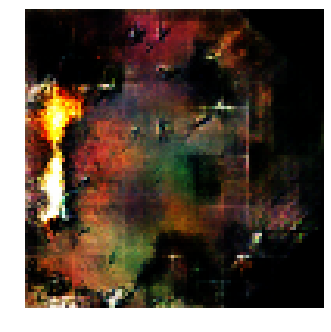


Epoch: 14560, D: -7.035, G: 3.659
Epoch: 14561, D: -5.374, G: 3.69
Epoch: 14562, D: -5.543, G: 3.668
Epoch: 14563, D: -7.027, G: 5.992
Epoch: 14564, D: -7.058, G: 1.824
Epoch: 14565, D: -5.198, G: 5.69
Epoch: 14566, D: -6.274, G: 2.31
Epoch: 14567, D: -5.551, G: 1.951
Epoch: 14568, D: -7.668, G: 2.431
Epoch: 14569, D: -7.095, G: 3.678
Epoch: 14570, D: -5.494, G: 2.556
Epoch: 14571, D: -6.974, G: 2.783
Epoch: 14572, D: -6.104, G: 2.581
Epoch: 14573, D: -6.649, G: 4.56
Epoch: 14574, D: -6.153, G: 4.012
Epoch: 14575, D: -5.108, G: 5.665
Epoch: 14576, D: -6.929, G: 4.128
Epoch: 14577, D: -6.699, G: 4.95
Epoch: 14578, D: -6.057, G: 3.61
Epoch: 14579, D: -5.485, G: 3.746


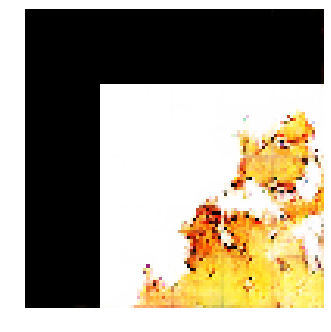


Epoch: 14580, D: -5.784, G: 4.115
Epoch: 14581, D: -5.496, G: 4.441
Epoch: 14582, D: -6.598, G: 2.195
Epoch: 14583, D: -6.147, G: 4.785
Epoch: 14584, D: -5.071, G: 4.023
Epoch: 14585, D: -6.36, G: 3.395
Epoch: 14586, D: -5.114, G: 3.042
Epoch: 14587, D: -7.275, G: 4.331
Epoch: 14588, D: -4.435, G: 5.765
Epoch: 14589, D: -3.548, G: 5.262
Epoch: 14590, D: -5.521, G: 3.987
Epoch: 14591, D: -7.151, G: 3.501
Epoch: 14592, D: -4.869, G: 3.896
Epoch: 14593, D: -5.635, G: 3.772
Epoch: 14594, D: -6.344, G: 6.285
Epoch: 14595, D: -5.939, G: 2.255
Epoch: 14596, D: -6.945, G: 3.482
Epoch: 14597, D: -5.996, G: 2.653
Epoch: 14598, D: -5.948, G: 4.246
Epoch: 14599, D: -6.178, G: 4.795


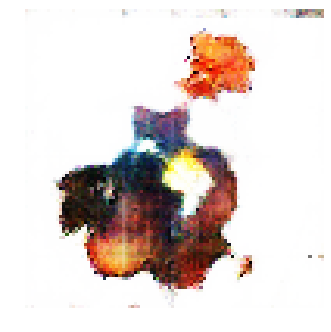


Epoch: 14600, D: -6.102, G: 3.77
Epoch: 14601, D: -5.79, G: 2.384
Epoch: 14602, D: -4.991, G: 5.251
Epoch: 14603, D: -6.2, G: 3.864
Epoch: 14604, D: -6.141, G: 4.426
Epoch: 14605, D: -5.925, G: 2.832
Epoch: 14606, D: -7.141, G: 2.402
Epoch: 14607, D: -6.297, G: 0.9251
Epoch: 14608, D: -6.396, G: 2.848
Epoch: 14609, D: -5.555, G: 3.497
Epoch: 14610, D: -5.418, G: 0.9745
Epoch: 14611, D: -6.029, G: 3.406
Epoch: 14612, D: -5.486, G: 2.032
Epoch: 14613, D: -4.413, G: 3.584
Epoch: 14614, D: -4.123, G: 3.812
Epoch: 14615, D: -5.729, G: 2.725
Epoch: 14616, D: -5.96, G: 3.004
Epoch: 14617, D: -5.463, G: 4.144
Epoch: 14618, D: -6.425, G: 6.432
Epoch: 14619, D: -4.882, G: 3.376


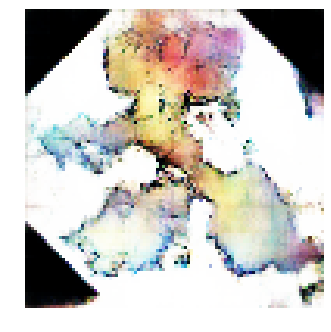


Epoch: 14620, D: -6.934, G: 3.881
Epoch: 14621, D: -5.826, G: 5.229
Epoch: 14622, D: -5.391, G: 3.732
Epoch: 14623, D: -5.876, G: 3.917
Epoch: 14624, D: -5.787, G: 5.536
Epoch: 14625, D: -5.604, G: 5.809
Epoch: 14626, D: -5.173, G: 5.387
Epoch: 14627, D: -5.001, G: 4.871
Epoch: 14628, D: -4.995, G: 4.387
Epoch: 14629, D: -5.57, G: 4.724
Epoch: 14630, D: -6.217, G: 3.366
Epoch: 14631, D: -6.96, G: 4.716
Epoch: 14632, D: -5.407, G: 4.221
Epoch: 14633, D: -6.511, G: 3.512
Epoch: 14634, D: -6.53, G: 2.214
Epoch: 14635, D: -6.165, G: 5.138
Epoch: 14636, D: -5.001, G: 3.757
Epoch: 14637, D: -6.484, G: 2.835
Epoch: 14638, D: -5.683, G: 4.589
Epoch: 14639, D: -6.137, G: 3.475


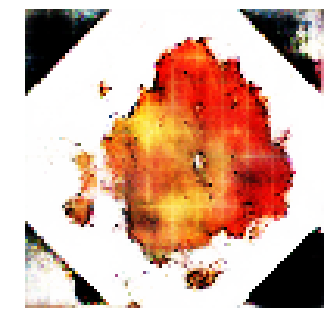


Epoch: 14640, D: -6.962, G: 6.989
Epoch: 14641, D: -5.897, G: 4.988
Epoch: 14642, D: -5.956, G: 5.424
Epoch: 14643, D: -6.874, G: 5.004
Epoch: 14644, D: -4.443, G: 1.598
Epoch: 14645, D: -4.753, G: 3.584
Epoch: 14646, D: -5.607, G: 3.893
Epoch: 14647, D: -6.901, G: 3.963
Epoch: 14648, D: -6.364, G: 4.198
Epoch: 14649, D: -6.208, G: 3.653
Epoch: 14650, D: -6.298, G: 5.387
Epoch: 14651, D: -5.653, G: 4.006
Epoch: 14652, D: -5.287, G: 4.44
Epoch: 14653, D: -6.125, G: 1.582
Epoch: 14654, D: -7.272, G: 4.116
Epoch: 14655, D: -5.359, G: 5.07
Epoch: 14656, D: -6.779, G: 3.799
Epoch: 14657, D: -5.955, G: 4.272
Epoch: 14658, D: -5.79, G: 1.721
Epoch: 14659, D: -5.44, G: 2.322


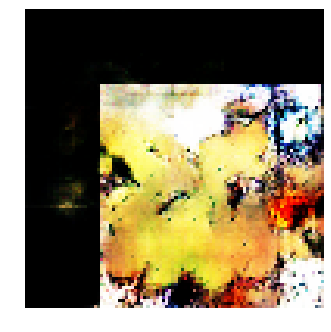


Epoch: 14660, D: -6.863, G: 2.107
Epoch: 14661, D: -6.017, G: 2.065
Epoch: 14662, D: -4.461, G: 3.573
Epoch: 14663, D: -6.244, G: 4.424
Epoch: 14664, D: -5.07, G: 2.059
Epoch: 14665, D: -6.772, G: 4.075
Epoch: 14666, D: -6.338, G: 2.187
Epoch: 14667, D: -4.863, G: 3.753
Epoch: 14668, D: -5.791, G: 6.249
Epoch: 14669, D: -6.163, G: 5.068
Epoch: 14670, D: -5.554, G: 2.407
Epoch: 14671, D: -7.669, G: 3.663
Epoch: 14672, D: -6.506, G: 4.251
Epoch: 14673, D: -6.757, G: 2.721
Epoch: 14674, D: -6.038, G: 4.37
Epoch: 14675, D: -6.549, G: 2.116
Epoch: 14676, D: -6.27, G: 3.868
Epoch: 14677, D: -5.814, G: 3.107
Epoch: 14678, D: -5.389, G: 3.76
Epoch: 14679, D: -5.797, G: 4.206


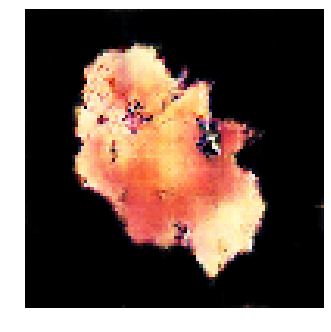


Epoch: 14680, D: -4.811, G: 4.31
Epoch: 14681, D: -6.432, G: 2.708
Epoch: 14682, D: -6.067, G: 1.965
Epoch: 14683, D: -5.001, G: 1.06
Epoch: 14684, D: -5.542, G: 4.295
Epoch: 14685, D: -5.565, G: 3.312
Epoch: 14686, D: -5.615, G: 2.698
Epoch: 14687, D: -6.201, G: 3.696
Epoch: 14688, D: -5.786, G: 4.119
Epoch: 14689, D: -7.011, G: 3.165
Epoch: 14690, D: -6.368, G: 3.63
Epoch: 14691, D: -6.471, G: 2.221
Epoch: 14692, D: -6.019, G: 2.819
Epoch: 14693, D: -7.051, G: 2.598
Epoch: 14694, D: -6.47, G: 3.898
Epoch: 14695, D: -5.365, G: 3.989
Epoch: 14696, D: -7.705, G: 2.311
Epoch: 14697, D: -7.159, G: 2.149
Epoch: 14698, D: -6.027, G: 3.674
Epoch: 14699, D: -5.095, G: 3.674


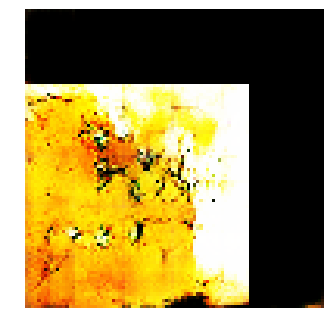


Epoch: 14700, D: -5.126, G: 3.786
Epoch: 14701, D: -5.768, G: 4.968
Epoch: 14702, D: -5.625, G: 4.499
Epoch: 14703, D: -6.253, G: 5.686
Epoch: 14704, D: -7.507, G: 6.827
Epoch: 14705, D: -5.388, G: 4.59
Epoch: 14706, D: -6.057, G: 3.086
Epoch: 14707, D: -5.688, G: 4.532
Epoch: 14708, D: -5.63, G: 3.629
Epoch: 14709, D: -4.951, G: 3.706
Epoch: 14710, D: -5.642, G: 4.609
Epoch: 14711, D: -5.027, G: 1.606
Epoch: 14712, D: -6.989, G: 3.224
Epoch: 14713, D: -4.828, G: 1.143
Epoch: 14714, D: -5.365, G: 3.988
Epoch: 14715, D: -5.831, G: 2.076
Epoch: 14716, D: -5.645, G: 4.389
Epoch: 14717, D: -6.009, G: 2.206
Epoch: 14718, D: -6.395, G: 2.833
Epoch: 14719, D: -5.405, G: 2.11


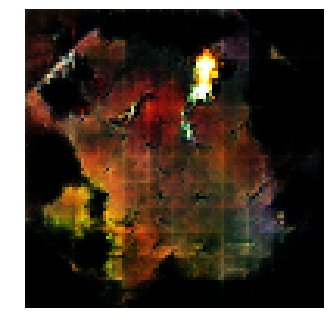


Epoch: 14720, D: -6.635, G: 5.229
Epoch: 14721, D: -5.589, G: 3.438
Epoch: 14722, D: -6.558, G: 3.283
Epoch: 14723, D: -5.739, G: 3.753
Epoch: 14724, D: -6.149, G: 3.1
Epoch: 14725, D: -6.094, G: 2.455
Epoch: 14726, D: -5.407, G: 5.944
Epoch: 14727, D: -5.303, G: 4.863
Epoch: 14728, D: -6.709, G: 4.095
Epoch: 14729, D: -6.956, G: 2.634
Epoch: 14730, D: -6.359, G: 3.805
Epoch: 14731, D: -6.07, G: 2.528
Epoch: 14732, D: -6.026, G: 3.45
Epoch: 14733, D: -5.591, G: 1.758
Epoch: 14734, D: -5.877, G: 3.354
Epoch: 14735, D: -6.908, G: 1.059
Epoch: 14736, D: -5.222, G: 1.895
Epoch: 14737, D: -5.475, G: 4.711
Epoch: 14738, D: -5.227, G: 4.359
Epoch: 14739, D: -5.399, G: 1.625


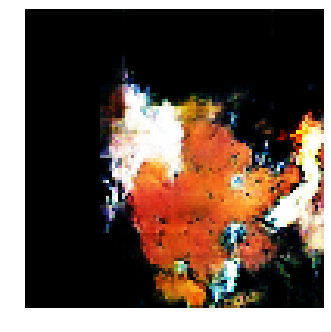


Epoch: 14740, D: -5.601, G: 3.443
Epoch: 14741, D: -7.168, G: 3.711
Epoch: 14742, D: -6.475, G: 4.351
Epoch: 14743, D: -5.618, G: 5.043
Epoch: 14744, D: -6.355, G: 3.642
Epoch: 14745, D: -6.645, G: 3.098
Epoch: 14746, D: -5.913, G: 4.784
Epoch: 14747, D: -6.382, G: 3.212
Epoch: 14748, D: -6.068, G: 6.159
Epoch: 14749, D: -5.768, G: 2.407
Epoch: 14750, D: -5.319, G: 4.037
Epoch: 14751, D: -5.82, G: 3.826
Epoch: 14752, D: -5.535, G: 4.625
Epoch: 14753, D: -5.7, G: 3.486
Epoch: 14754, D: -6.409, G: 5.242
Epoch: 14755, D: -7.193, G: 3.605
Epoch: 14756, D: -5.824, G: 1.398
Epoch: 14757, D: -6.394, G: 3.72
Epoch: 14758, D: -5.406, G: 5.292
Epoch: 14759, D: -5.911, G: 3.849


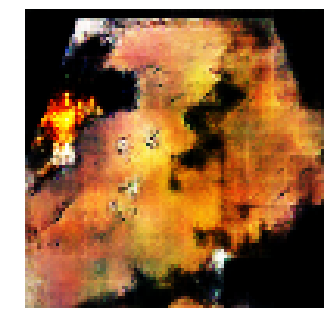


Epoch: 14760, D: -7.64, G: 4.89
Epoch: 14761, D: -6.649, G: 4.241
Epoch: 14762, D: -7.84, G: 5.199
Epoch: 14763, D: -6.314, G: 4.276
Epoch: 14764, D: -5.638, G: 4.738
Epoch: 14765, D: -6.098, G: 5.619
Epoch: 14766, D: -7.819, G: 3.999
Epoch: 14767, D: -4.513, G: 1.631
Epoch: 14768, D: -6.519, G: 4.385
Epoch: 14769, D: -4.838, G: 2.917
Epoch: 14770, D: -6.136, G: 3.266
Epoch: 14771, D: -5.059, G: 3.393
Epoch: 14772, D: -5.805, G: 3.931
Epoch: 14773, D: -7.632, G: 2.0
Epoch: 14774, D: -5.766, G: 2.763
Epoch: 14775, D: -6.458, G: 4.687
Epoch: 14776, D: -6.2, G: 3.632
Epoch: 14777, D: -5.816, G: 4.208
Epoch: 14778, D: -6.006, G: 5.59
Epoch: 14779, D: -6.648, G: 6.565


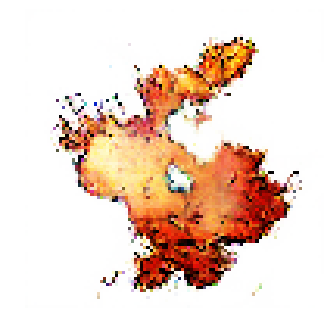


Epoch: 14780, D: -5.52, G: 4.962
Epoch: 14781, D: -6.258, G: 3.228
Epoch: 14782, D: -6.19, G: 2.765
Epoch: 14783, D: -5.851, G: 1.379
Epoch: 14784, D: -4.171, G: 7.535
Epoch: 14785, D: -6.386, G: 4.198
Epoch: 14786, D: -5.132, G: 2.739
Epoch: 14787, D: -6.244, G: 5.404
Epoch: 14788, D: -6.245, G: 3.989
Epoch: 14789, D: -5.866, G: 5.167
Epoch: 14790, D: -7.059, G: 6.46
Epoch: 14791, D: -6.5, G: 4.288
Epoch: 14792, D: -5.972, G: 2.462
Epoch: 14793, D: -5.93, G: 3.104
Epoch: 14794, D: -5.4, G: 2.988
Epoch: 14795, D: -6.661, G: 3.84
Epoch: 14796, D: -5.199, G: 1.015
Epoch: 14797, D: -6.138, G: 0.7061
Epoch: 14798, D: -6.647, G: 4.892
Epoch: 14799, D: -6.19, G: 6.044


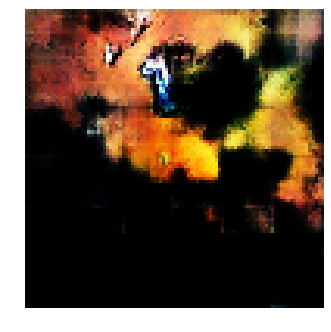


Epoch: 14800, D: -4.778, G: 1.511
Epoch: 14801, D: -6.464, G: 2.931
Epoch: 14802, D: -5.311, G: 4.96
Epoch: 14803, D: -5.367, G: 4.929
Epoch: 14804, D: -5.081, G: 4.862
Epoch: 14805, D: -5.541, G: 5.723
Epoch: 14806, D: -6.109, G: 5.954
Epoch: 14807, D: -5.222, G: 1.832
Epoch: 14808, D: -6.458, G: 5.151
Epoch: 14809, D: -4.52, G: 3.389
Epoch: 14810, D: -6.418, G: 4.73
Epoch: 14811, D: -6.818, G: 4.609
Epoch: 14812, D: -5.771, G: 2.528
Epoch: 14813, D: -7.359, G: 3.477
Epoch: 14814, D: -5.942, G: 2.129
Epoch: 14815, D: -6.288, G: 4.533
Epoch: 14816, D: -5.992, G: 3.086
Epoch: 14817, D: -4.909, G: 4.398
Epoch: 14818, D: -4.957, G: 5.013
Epoch: 14819, D: -6.394, G: 2.343


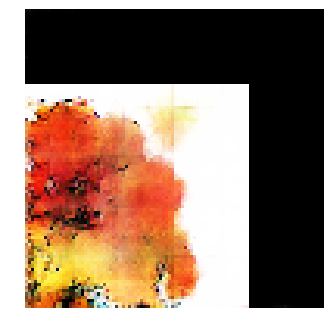


Epoch: 14820, D: -6.615, G: 3.943
Epoch: 14821, D: -5.779, G: 4.561
Epoch: 14822, D: -6.098, G: 4.049
Epoch: 14823, D: -5.511, G: 2.452
Epoch: 14824, D: -5.946, G: 3.889
Epoch: 14825, D: -6.522, G: 5.7
Epoch: 14826, D: -5.388, G: 4.866
Epoch: 14827, D: -5.695, G: 3.397
Epoch: 14828, D: -6.104, G: 2.129
Epoch: 14829, D: -6.857, G: 1.58
Epoch: 14830, D: -5.945, G: 3.002
Epoch: 14831, D: -5.253, G: 4.947
Epoch: 14832, D: -4.479, G: 4.319
Epoch: 14833, D: -5.778, G: 0.6416
Epoch: 14834, D: -7.146, G: 3.259
Epoch: 14835, D: -4.454, G: 3.174
Epoch: 14836, D: -4.987, G: 2.053
Epoch: 14837, D: -5.231, G: 1.817
Epoch: 14838, D: -5.111, G: 2.208
Epoch: 14839, D: -5.264, G: 3.367


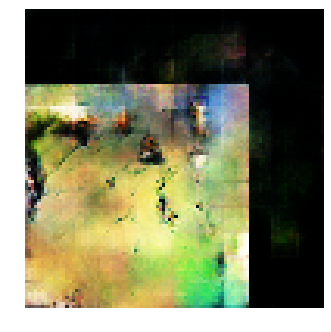


Epoch: 14840, D: -5.669, G: 2.532
Epoch: 14841, D: -6.007, G: 1.143
Epoch: 14842, D: -5.891, G: 4.446
Epoch: 14843, D: -6.894, G: 2.949
Epoch: 14844, D: -5.381, G: 5.008
Epoch: 14845, D: -6.38, G: 4.086
Epoch: 14846, D: -6.236, G: 4.847
Epoch: 14847, D: -7.541, G: 3.998
Epoch: 14848, D: -7.45, G: 3.499
Epoch: 14849, D: -5.439, G: 3.41
Epoch: 14850, D: -6.006, G: 4.043
Epoch: 14851, D: -6.353, G: 2.951
Epoch: 14852, D: -5.165, G: 3.663
Epoch: 14853, D: -5.752, G: 4.204
Epoch: 14854, D: -5.946, G: 4.266
Epoch: 14855, D: -5.4, G: 5.846
Epoch: 14856, D: -6.445, G: 5.053
Epoch: 14857, D: -6.793, G: 6.191
Epoch: 14858, D: -5.604, G: 2.319
Epoch: 14859, D: -5.751, G: 3.497


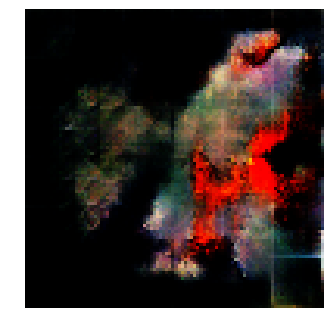


Epoch: 14860, D: -5.964, G: 4.69
Epoch: 14861, D: -5.888, G: 2.101
Epoch: 14862, D: -5.251, G: 3.568
Epoch: 14863, D: -5.667, G: 4.246
Epoch: 14864, D: -5.523, G: 3.659
Epoch: 14865, D: -7.104, G: 3.293
Epoch: 14866, D: -6.646, G: 2.045
Epoch: 14867, D: -6.141, G: 3.214
Epoch: 14868, D: -7.073, G: 3.437
Epoch: 14869, D: -5.555, G: 3.867
Epoch: 14870, D: -5.768, G: 3.381
Epoch: 14871, D: -6.593, G: 5.285
Epoch: 14872, D: -5.854, G: 4.295
Epoch: 14873, D: -5.904, G: 3.894
Epoch: 14874, D: -6.165, G: 4.612
Epoch: 14875, D: -5.057, G: 2.039
Epoch: 14876, D: -6.288, G: 4.321
Epoch: 14877, D: -5.691, G: 4.115
Epoch: 14878, D: -5.204, G: 6.516
Epoch: 14879, D: -7.625, G: 4.371


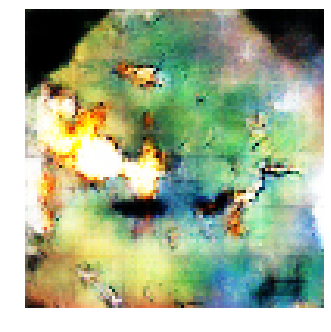


Epoch: 14880, D: -4.953, G: 4.133
Epoch: 14881, D: -5.178, G: 3.782
Epoch: 14882, D: -6.027, G: 1.72
Epoch: 14883, D: -6.983, G: 4.317
Epoch: 14884, D: -6.074, G: 3.956
Epoch: 14885, D: -6.108, G: 4.749
Epoch: 14886, D: -7.061, G: 4.222
Epoch: 14887, D: -5.299, G: 2.527
Epoch: 14888, D: -4.969, G: 4.165
Epoch: 14889, D: -6.779, G: 4.001
Epoch: 14890, D: -5.595, G: 5.94
Epoch: 14891, D: -5.52, G: 1.028
Epoch: 14892, D: -5.597, G: 3.688
Epoch: 14893, D: -6.237, G: 3.909
Epoch: 14894, D: -6.521, G: 3.142
Epoch: 14895, D: -6.224, G: 1.762
Epoch: 14896, D: -5.848, G: 2.768
Epoch: 14897, D: -6.705, G: 3.369
Epoch: 14898, D: -6.909, G: 3.378
Epoch: 14899, D: -5.688, G: 2.747


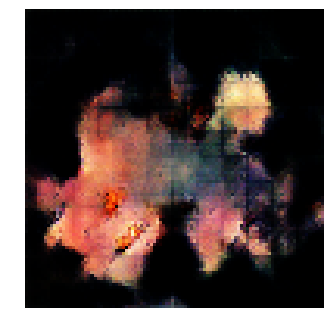


Epoch: 14900, D: -5.147, G: 2.486
Epoch: 14901, D: -5.849, G: 2.77
Epoch: 14902, D: -6.21, G: 1.803
Epoch: 14903, D: -7.338, G: 3.616
Epoch: 14904, D: -6.813, G: 2.15
Epoch: 14905, D: -5.172, G: 2.708
Epoch: 14906, D: -7.261, G: 3.219
Epoch: 14907, D: -5.503, G: 2.499
Epoch: 14908, D: -4.331, G: 2.449
Epoch: 14909, D: -6.02, G: 7.433
Epoch: 14910, D: -5.888, G: 5.416
Epoch: 14911, D: -5.718, G: 6.057
Epoch: 14912, D: -5.844, G: 4.191
Epoch: 14913, D: -5.555, G: 3.793
Epoch: 14914, D: -5.637, G: 4.149
Epoch: 14915, D: -6.244, G: 5.709
Epoch: 14916, D: -6.016, G: 4.952
Epoch: 14917, D: -5.499, G: 4.73
Epoch: 14918, D: -5.113, G: 4.47
Epoch: 14919, D: -4.268, G: 6.311


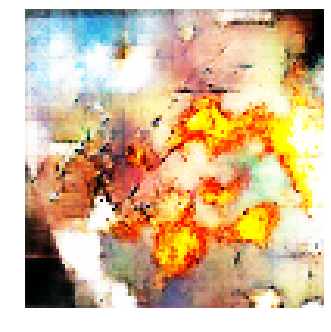


Epoch: 14920, D: -6.799, G: 2.909
Epoch: 14921, D: -6.342, G: 4.425
Epoch: 14922, D: -6.096, G: 2.091
Epoch: 14923, D: -4.668, G: 3.052
Epoch: 14924, D: -5.779, G: 2.112
Epoch: 14925, D: -6.76, G: 3.606
Epoch: 14926, D: -6.803, G: 4.521
Epoch: 14927, D: -7.07, G: 6.102
Epoch: 14928, D: -6.622, G: 3.789
Epoch: 14929, D: -5.324, G: 1.794
Epoch: 14930, D: -5.13, G: 4.292
Epoch: 14931, D: -5.328, G: 4.577
Epoch: 14932, D: -7.112, G: 3.711
Epoch: 14933, D: -6.516, G: 2.367
Epoch: 14934, D: -4.782, G: 2.869
Epoch: 14935, D: -6.937, G: 5.441
Epoch: 14936, D: -6.365, G: 4.138
Epoch: 14937, D: -5.746, G: 3.645
Epoch: 14938, D: -6.695, G: 2.297
Epoch: 14939, D: -6.101, G: 2.41


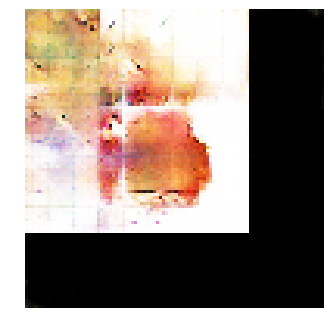


Epoch: 14940, D: -4.862, G: 5.602
Epoch: 14941, D: -5.173, G: 4.807
Epoch: 14942, D: -5.809, G: 4.221
Epoch: 14943, D: -6.029, G: 2.689
Epoch: 14944, D: -6.784, G: 3.652
Epoch: 14945, D: -7.749, G: 4.227
Epoch: 14946, D: -6.168, G: 3.603
Epoch: 14947, D: -4.535, G: 3.504
Epoch: 14948, D: -6.934, G: 5.112
Epoch: 14949, D: -6.704, G: 5.729
Epoch: 14950, D: -5.987, G: 6.395
Epoch: 14951, D: -5.303, G: 3.293
Epoch: 14952, D: -6.018, G: 4.574
Epoch: 14953, D: -5.173, G: 2.744
Epoch: 14954, D: -6.724, G: 3.473
Epoch: 14955, D: -6.273, G: 5.803
Epoch: 14956, D: -6.464, G: 4.725
Epoch: 14957, D: -6.596, G: 3.565
Epoch: 14958, D: -5.933, G: 7.757
Epoch: 14959, D: -5.749, G: 3.041


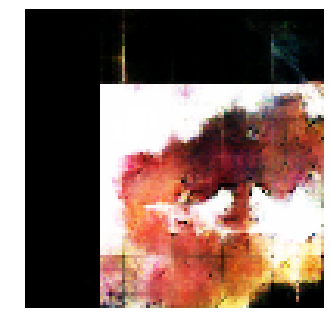


Epoch: 14960, D: -6.891, G: 2.164
Epoch: 14961, D: -6.287, G: 2.363
Epoch: 14962, D: -5.72, G: 3.881
Epoch: 14963, D: -5.564, G: 4.539
Epoch: 14964, D: -5.968, G: 3.722
Epoch: 14965, D: -6.014, G: 3.497
Epoch: 14966, D: -6.407, G: 1.53
Epoch: 14967, D: -5.524, G: 1.537
Epoch: 14968, D: -6.32, G: 2.773
Epoch: 14969, D: -6.915, G: 3.658
Epoch: 14970, D: -6.786, G: 5.129
Epoch: 14971, D: -6.806, G: 3.697
Epoch: 14972, D: -6.418, G: 1.233
Epoch: 14973, D: -7.05, G: 6.085
Epoch: 14974, D: -4.948, G: 5.168
Epoch: 14975, D: -6.214, G: 2.762
Epoch: 14976, D: -5.089, G: 2.939
Epoch: 14977, D: -5.932, G: 5.964
Epoch: 14978, D: -6.979, G: 4.057
Epoch: 14979, D: -6.847, G: 4.488


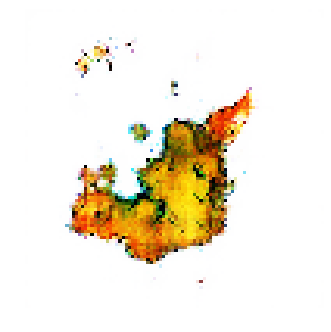


Epoch: 14980, D: -6.27, G: 2.365
Epoch: 14981, D: -7.239, G: 4.101
Epoch: 14982, D: -5.568, G: 3.592
Epoch: 14983, D: -4.675, G: 4.598
Epoch: 14984, D: -4.333, G: 5.214
Epoch: 14985, D: -5.18, G: 5.425
Epoch: 14986, D: -6.257, G: 1.975
Epoch: 14987, D: -6.394, G: 0.953
Epoch: 14988, D: -6.502, G: 3.038
Epoch: 14989, D: -5.504, G: 3.275
Epoch: 14990, D: -5.78, G: 3.711
Epoch: 14991, D: -6.067, G: 2.209
Epoch: 14992, D: -5.964, G: 1.122
Epoch: 14993, D: -5.489, G: 4.475
Epoch: 14994, D: -6.225, G: 2.769
Epoch: 14995, D: -5.518, G: 4.498
Epoch: 14996, D: -6.175, G: 2.487
Epoch: 14997, D: -5.492, G: 4.735
Epoch: 14998, D: -4.681, G: 6.702
Epoch: 14999, D: -6.174, G: 2.699


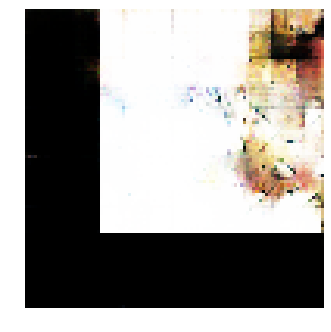


Epoch: 15000, D: -5.616, G: 2.733
Epoch: 15001, D: -6.025, G: 5.95
Epoch: 15002, D: -6.148, G: 4.546
Epoch: 15003, D: -6.511, G: 7.055
Epoch: 15004, D: -5.892, G: 2.864
Epoch: 15005, D: -4.95, G: 2.281
Epoch: 15006, D: -4.626, G: 4.47
Epoch: 15007, D: -4.962, G: 4.444
Epoch: 15008, D: -6.44, G: 1.52
Epoch: 15009, D: -5.459, G: 3.647
Epoch: 15010, D: -5.767, G: 5.036
Epoch: 15011, D: -6.327, G: 4.114
Epoch: 15012, D: -5.988, G: 3.774
Epoch: 15013, D: -6.579, G: 2.852
Epoch: 15014, D: -6.34, G: 2.314
Epoch: 15015, D: -6.345, G: 2.55
Epoch: 15016, D: -5.872, G: 3.519
Epoch: 15017, D: -5.601, G: 4.368
Epoch: 15018, D: -4.074, G: 3.488
Epoch: 15019, D: -4.109, G: 4.319


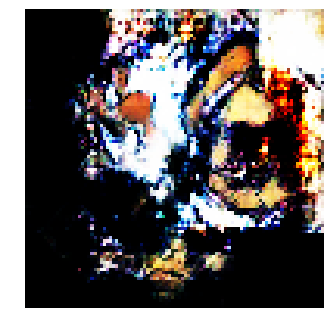


Epoch: 15020, D: -6.376, G: 2.037
Epoch: 15021, D: -6.903, G: 2.125
Epoch: 15022, D: -5.853, G: 1.584
Epoch: 15023, D: -5.562, G: 3.199
Epoch: 15024, D: -5.562, G: 5.627
Epoch: 15025, D: -5.499, G: 1.768
Epoch: 15026, D: -4.457, G: 3.314
Epoch: 15027, D: -6.522, G: 2.552
Epoch: 15028, D: -5.931, G: 1.774
Epoch: 15029, D: -5.702, G: 6.391
Epoch: 15030, D: -4.574, G: 4.898
Epoch: 15031, D: -6.149, G: 1.647
Epoch: 15032, D: -5.81, G: 3.81
Epoch: 15033, D: -5.56, G: 4.111
Epoch: 15034, D: -5.453, G: 3.19
Epoch: 15035, D: -6.348, G: 2.63
Epoch: 15036, D: -5.339, G: 4.068
Epoch: 15037, D: -6.694, G: 4.625
Epoch: 15038, D: -6.465, G: 0.8726
Epoch: 15039, D: -7.145, G: 2.04


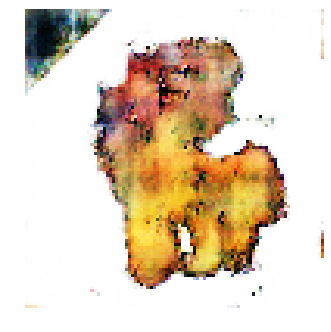


Epoch: 15040, D: -5.393, G: 3.826
Epoch: 15041, D: -6.069, G: 2.146
Epoch: 15042, D: -6.698, G: 5.211
Epoch: 15043, D: -5.647, G: 4.118
Epoch: 15044, D: -5.939, G: 5.41
Epoch: 15045, D: -7.215, G: 3.705
Epoch: 15046, D: -5.31, G: 6.051
Epoch: 15047, D: -5.521, G: 4.317
Epoch: 15048, D: -6.329, G: 5.321
Epoch: 15049, D: -5.323, G: 6.917
Epoch: 15050, D: -6.675, G: 2.2
Epoch: 15051, D: -6.03, G: 2.49
Epoch: 15052, D: -6.191, G: 5.87
Epoch: 15053, D: -6.872, G: 8.551
Epoch: 15054, D: -4.243, G: 3.776
Epoch: 15055, D: -5.906, G: 3.692
Epoch: 15056, D: -5.127, G: 2.363
Epoch: 15057, D: -5.09, G: 3.178
Epoch: 15058, D: -7.614, G: 4.363
Epoch: 15059, D: -6.903, G: 3.54


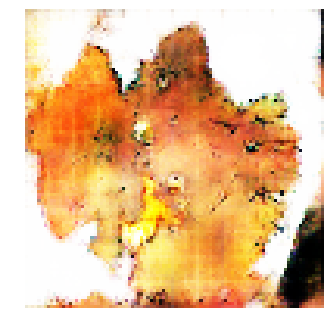


Epoch: 15060, D: -4.811, G: 0.8688
Epoch: 15061, D: -6.747, G: 4.502
Epoch: 15062, D: -6.394, G: 1.002
Epoch: 15063, D: -5.758, G: 6.036
Epoch: 15064, D: -5.625, G: 3.703
Epoch: 15065, D: -6.32, G: 4.499
Epoch: 15066, D: -5.393, G: 2.664
Epoch: 15067, D: -5.352, G: 4.143
Epoch: 15068, D: -6.741, G: 7.523
Epoch: 15069, D: -4.762, G: 4.852
Epoch: 15070, D: -5.724, G: 4.439
Epoch: 15071, D: -7.091, G: 3.815
Epoch: 15072, D: -5.974, G: 4.388
Epoch: 15073, D: -5.748, G: 4.568
Epoch: 15074, D: -5.578, G: 3.693
Epoch: 15075, D: -5.842, G: 4.917
Epoch: 15076, D: -5.054, G: 3.65
Epoch: 15077, D: -5.886, G: 2.777
Epoch: 15078, D: -5.605, G: 2.843
Epoch: 15079, D: -6.785, G: 2.728


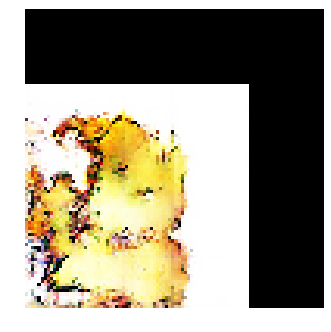


Epoch: 15080, D: -6.02, G: 3.175
Epoch: 15081, D: -5.485, G: 3.688
Epoch: 15082, D: -7.227, G: 2.404
Epoch: 15083, D: -5.503, G: 3.334
Epoch: 15084, D: -5.996, G: 4.5
Epoch: 15085, D: -5.654, G: 3.303
Epoch: 15086, D: -6.264, G: 2.558
Epoch: 15087, D: -7.205, G: 1.321
Epoch: 15088, D: -6.158, G: 4.003
Epoch: 15089, D: -6.704, G: 5.256
Epoch: 15090, D: -6.815, G: 3.178
Epoch: 15091, D: -6.428, G: 5.673
Epoch: 15092, D: -4.813, G: 4.739
Epoch: 15093, D: -5.648, G: 5.11
Epoch: 15094, D: -5.461, G: 2.689
Epoch: 15095, D: -5.051, G: 2.593
Epoch: 15096, D: -6.83, G: 4.727
Epoch: 15097, D: -6.944, G: 3.802
Epoch: 15098, D: -5.145, G: 2.05
Epoch: 15099, D: -6.036, G: 2.515


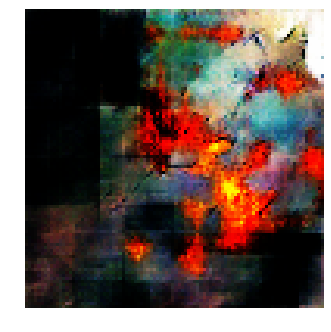


Epoch: 15100, D: -5.873, G: 4.703
Epoch: 15101, D: -6.153, G: 3.838
Epoch: 15102, D: -5.715, G: 4.56
Epoch: 15103, D: -5.406, G: 1.816
Epoch: 15104, D: -5.226, G: 3.409
Epoch: 15105, D: -4.809, G: 2.979
Epoch: 15106, D: -5.192, G: 5.026
Epoch: 15107, D: -6.073, G: 4.781
Epoch: 15108, D: -5.839, G: 3.124
Epoch: 15109, D: -7.024, G: 3.471
Epoch: 15110, D: -6.546, G: 1.497
Epoch: 15111, D: -5.947, G: 1.114
Epoch: 15112, D: -5.654, G: 2.173
Epoch: 15113, D: -6.308, G: 2.848
Epoch: 15114, D: -6.527, G: 3.849
Epoch: 15115, D: -5.945, G: 4.587
Epoch: 15116, D: -6.34, G: 3.686
Epoch: 15117, D: -6.611, G: 3.134
Epoch: 15118, D: -5.873, G: 1.318
Epoch: 15119, D: -6.557, G: 3.789


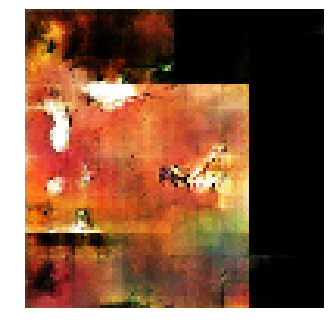


Epoch: 15120, D: -6.52, G: 4.267
Epoch: 15121, D: -6.599, G: 5.792
Epoch: 15122, D: -7.536, G: 4.723
Epoch: 15123, D: -5.993, G: 4.874
Epoch: 15124, D: -5.874, G: 3.779
Epoch: 15125, D: -6.591, G: 2.493
Epoch: 15126, D: -6.087, G: 5.336
Epoch: 15127, D: -5.51, G: 4.595
Epoch: 15128, D: -6.599, G: 5.501
Epoch: 15129, D: -7.071, G: 4.851
Epoch: 15130, D: -5.889, G: 2.607
Epoch: 15131, D: -5.556, G: 4.509
Epoch: 15132, D: -6.552, G: 3.373
Epoch: 15133, D: -4.357, G: 3.603
Epoch: 15134, D: -6.168, G: 4.196
Epoch: 15135, D: -6.222, G: 3.903
Epoch: 15136, D: -7.0, G: 3.909
Epoch: 15137, D: -5.229, G: 3.26
Epoch: 15138, D: -5.479, G: 4.737
Epoch: 15139, D: -4.944, G: 4.767


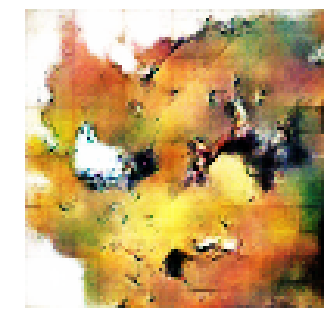


Epoch: 15140, D: -4.974, G: 3.619
Epoch: 15141, D: -4.907, G: 2.848
Epoch: 15142, D: -5.777, G: 5.641
Epoch: 15143, D: -6.826, G: 2.443
Epoch: 15144, D: -5.73, G: 3.062
Epoch: 15145, D: -7.395, G: 5.572
Epoch: 15146, D: -5.805, G: 2.949
Epoch: 15147, D: -5.511, G: 3.233
Epoch: 15148, D: -6.65, G: 2.743
Epoch: 15149, D: -6.974, G: 3.412
Epoch: 15150, D: -5.739, G: 3.302
Epoch: 15151, D: -5.613, G: 5.46
Epoch: 15152, D: -5.906, G: 3.468
Epoch: 15153, D: -6.09, G: 3.951
Epoch: 15154, D: -6.497, G: 6.821
Epoch: 15155, D: -4.443, G: 1.71
Epoch: 15156, D: -5.902, G: 4.74
Epoch: 15157, D: -6.225, G: 3.944
Epoch: 15158, D: -5.545, G: 3.079
Epoch: 15159, D: -5.85, G: 4.274


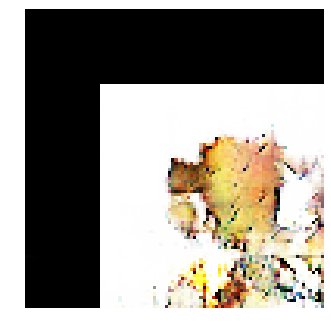


Epoch: 15160, D: -5.472, G: 3.664
Epoch: 15161, D: -6.847, G: 4.732
Epoch: 15162, D: -6.604, G: 2.102
Epoch: 15163, D: -6.695, G: -0.1928
Epoch: 15164, D: -5.982, G: 4.164
Epoch: 15165, D: -7.233, G: 4.196
Epoch: 15166, D: -8.228, G: 2.499
Epoch: 15167, D: -5.702, G: 2.38
Epoch: 15168, D: -5.405, G: 1.735
Epoch: 15169, D: -5.811, G: 3.072
Epoch: 15170, D: -7.418, G: 3.744
Epoch: 15171, D: -6.172, G: 6.864
Epoch: 15172, D: -4.405, G: 4.668
Epoch: 15173, D: -6.555, G: 6.222
Epoch: 15174, D: -6.991, G: 3.692
Epoch: 15175, D: -5.382, G: 3.07
Epoch: 15176, D: -6.218, G: 3.99
Epoch: 15177, D: -4.992, G: 5.642
Epoch: 15178, D: -5.657, G: 4.281
Epoch: 15179, D: -5.779, G: 4.211


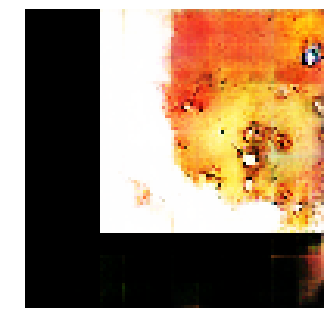


Epoch: 15180, D: -5.392, G: 3.966
Epoch: 15181, D: -6.399, G: 4.939
Epoch: 15182, D: -6.029, G: 4.213
Epoch: 15183, D: -5.654, G: 5.386
Epoch: 15184, D: -4.96, G: 2.502
Epoch: 15185, D: -6.839, G: 3.221
Epoch: 15186, D: -6.142, G: 5.562
Epoch: 15187, D: -5.126, G: 4.863
Epoch: 15188, D: -5.379, G: 4.892
Epoch: 15189, D: -5.534, G: 4.288
Epoch: 15190, D: -5.244, G: 4.545
Epoch: 15191, D: -5.929, G: 4.834
Epoch: 15192, D: -5.35, G: 7.112
Epoch: 15193, D: -6.869, G: 3.263
Epoch: 15194, D: -6.368, G: 2.118
Epoch: 15195, D: -6.284, G: 4.249
Epoch: 15196, D: -5.708, G: 2.044
Epoch: 15197, D: -5.217, G: 4.975
Epoch: 15198, D: -5.735, G: 2.414
Epoch: 15199, D: -6.746, G: 4.946


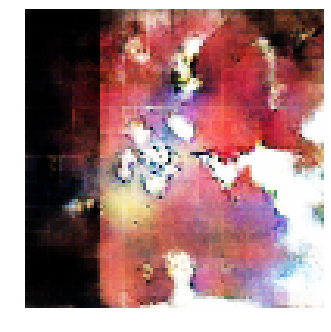


Epoch: 15200, D: -6.662, G: 2.938
Epoch: 15201, D: -4.628, G: 2.038
Epoch: 15202, D: -5.629, G: 3.36
Epoch: 15203, D: -5.533, G: 1.687
Epoch: 15204, D: -6.189, G: 3.348
Epoch: 15205, D: -6.262, G: 2.954
Epoch: 15206, D: -5.436, G: 2.738
Epoch: 15207, D: -6.237, G: 4.635
Epoch: 15208, D: -6.061, G: 3.203
Epoch: 15209, D: -6.136, G: 3.4
Epoch: 15210, D: -6.102, G: 5.949
Epoch: 15211, D: -4.23, G: 4.534
Epoch: 15212, D: -6.9, G: 3.367
Epoch: 15213, D: -6.866, G: 3.83
Epoch: 15214, D: -5.35, G: 4.856
Epoch: 15215, D: -4.994, G: 4.562
Epoch: 15216, D: -6.683, G: 4.051
Epoch: 15217, D: -6.101, G: 2.3
Epoch: 15218, D: -6.072, G: 4.962
Epoch: 15219, D: -7.06, G: 3.933


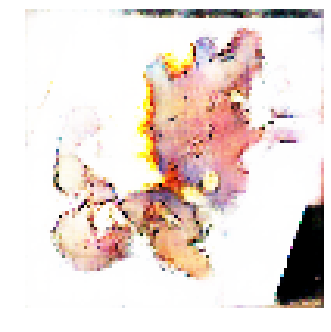


Epoch: 15220, D: -5.511, G: 3.386
Epoch: 15221, D: -5.918, G: 3.042
Epoch: 15222, D: -5.126, G: 2.966
Epoch: 15223, D: -5.781, G: 3.956
Epoch: 15224, D: -6.166, G: 4.718
Epoch: 15225, D: -6.122, G: 3.631
Epoch: 15226, D: -6.866, G: 2.281
Epoch: 15227, D: -5.857, G: 2.523
Epoch: 15228, D: -4.43, G: 2.887
Epoch: 15229, D: -6.263, G: 2.637
Epoch: 15230, D: -6.399, G: 3.542
Epoch: 15231, D: -6.171, G: 3.941
Epoch: 15232, D: -6.088, G: 4.572
Epoch: 15233, D: -5.434, G: 6.762
Epoch: 15234, D: -6.147, G: 2.93
Epoch: 15235, D: -6.175, G: 3.202
Epoch: 15236, D: -5.745, G: 4.974
Epoch: 15237, D: -5.837, G: 4.896
Epoch: 15238, D: -5.665, G: 4.387
Epoch: 15239, D: -5.802, G: 4.805


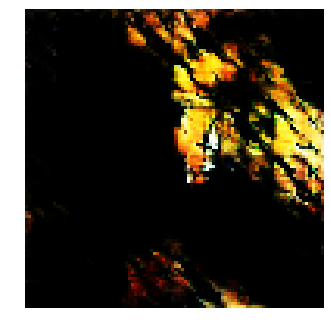


Epoch: 15240, D: -6.063, G: 3.988
Epoch: 15241, D: -5.066, G: 4.256
Epoch: 15242, D: -5.985, G: 3.728
Epoch: 15243, D: -5.066, G: 2.075
Epoch: 15244, D: -7.128, G: 5.117
Epoch: 15245, D: -6.386, G: 3.895
Epoch: 15246, D: -5.995, G: 7.466
Epoch: 15247, D: -4.509, G: 4.479
Epoch: 15248, D: -5.962, G: 4.807
Epoch: 15249, D: -5.664, G: 2.688
Epoch: 15250, D: -5.196, G: 4.85
Epoch: 15251, D: -6.216, G: 5.048
Epoch: 15252, D: -5.753, G: 4.725
Epoch: 15253, D: -6.168, G: 2.908
Epoch: 15254, D: -6.432, G: 3.041
Epoch: 15255, D: -6.538, G: 3.047
Epoch: 15256, D: -6.079, G: 3.288
Epoch: 15257, D: -6.009, G: 3.498
Epoch: 15258, D: -6.547, G: 2.98
Epoch: 15259, D: -4.726, G: 2.315


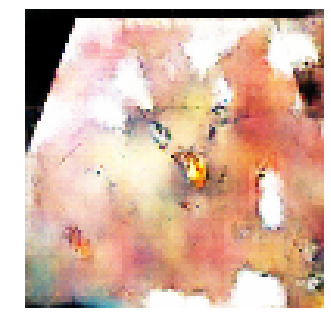


Epoch: 15260, D: -6.09, G: 4.677
Epoch: 15261, D: -6.373, G: 2.482
Epoch: 15262, D: -4.941, G: 3.935
Epoch: 15263, D: -5.3, G: 3.487
Epoch: 15264, D: -6.096, G: 4.4
Epoch: 15265, D: -5.832, G: 5.33
Epoch: 15266, D: -6.52, G: 3.6
Epoch: 15267, D: -4.9, G: 3.393
Epoch: 15268, D: -6.186, G: 5.499
Epoch: 15269, D: -5.23, G: 4.201
Epoch: 15270, D: -5.112, G: 3.168
Epoch: 15271, D: -5.715, G: 4.29
Epoch: 15272, D: -4.952, G: 2.615
Epoch: 15273, D: -5.213, G: 3.576
Epoch: 15274, D: -5.467, G: 4.195
Epoch: 15275, D: -5.697, G: 3.391
Epoch: 15276, D: -5.741, G: 4.532
Epoch: 15277, D: -5.014, G: 3.64
Epoch: 15278, D: -7.263, G: 4.965
Epoch: 15279, D: -7.561, G: 4.637


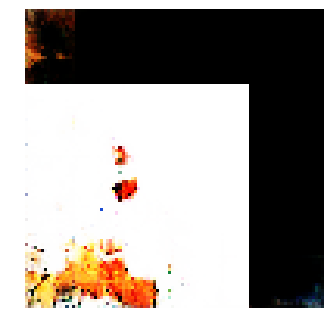


Epoch: 15280, D: -3.853, G: 5.794
Epoch: 15281, D: -5.769, G: 4.111
Epoch: 15282, D: -6.718, G: 4.788
Epoch: 15283, D: -7.581, G: 7.45
Epoch: 15284, D: -5.729, G: 5.403
Epoch: 15285, D: -7.0, G: 5.181
Epoch: 15286, D: -6.108, G: 2.489
Epoch: 15287, D: -6.365, G: 3.341
Epoch: 15288, D: -7.248, G: 3.069
Epoch: 15289, D: -5.867, G: 3.714
Epoch: 15290, D: -5.3, G: 4.464
Epoch: 15291, D: -6.119, G: 4.254
Epoch: 15292, D: -6.498, G: 3.018
Epoch: 15293, D: -6.025, G: 1.824
Epoch: 15294, D: -6.376, G: 3.22
Epoch: 15295, D: -4.753, G: 3.409
Epoch: 15296, D: -5.856, G: 4.806
Epoch: 15297, D: -5.48, G: 2.311
Epoch: 15298, D: -6.843, G: 3.879
Epoch: 15299, D: -5.536, G: 3.962


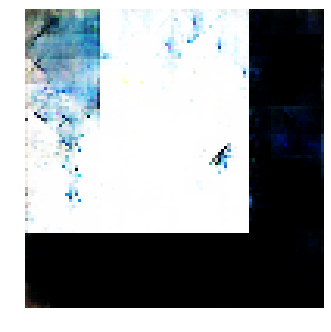


Epoch: 15300, D: -6.334, G: 5.238
Epoch: 15301, D: -7.125, G: 2.213
Epoch: 15302, D: -5.419, G: 2.907
Epoch: 15303, D: -5.373, G: 3.04
Epoch: 15304, D: -5.673, G: 4.14
Epoch: 15305, D: -5.527, G: 3.292
Epoch: 15306, D: -7.041, G: 2.413
Epoch: 15307, D: -5.11, G: 2.928
Epoch: 15308, D: -5.919, G: 4.32
Epoch: 15309, D: -5.827, G: 4.944
Epoch: 15310, D: -5.12, G: 3.051
Epoch: 15311, D: -5.722, G: 3.272
Epoch: 15312, D: -5.897, G: 4.413
Epoch: 15313, D: -6.66, G: 3.541
Epoch: 15314, D: -6.073, G: 2.024
Epoch: 15315, D: -4.828, G: 3.884
Epoch: 15316, D: -6.023, G: 3.606
Epoch: 15317, D: -7.902, G: 3.066
Epoch: 15318, D: -6.282, G: 3.073
Epoch: 15319, D: -6.121, G: 4.136


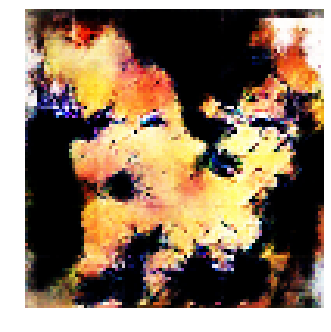


Epoch: 15320, D: -5.981, G: 6.451
Epoch: 15321, D: -4.822, G: 4.229
Epoch: 15322, D: -5.207, G: 5.744
Epoch: 15323, D: -3.074, G: 6.385
Epoch: 15324, D: -7.732, G: 5.161
Epoch: 15325, D: -7.063, G: 3.489
Epoch: 15326, D: -4.228, G: 5.013
Epoch: 15327, D: -5.28, G: 2.634
Epoch: 15328, D: -6.609, G: 3.187
Epoch: 15329, D: -6.286, G: 3.453
Epoch: 15330, D: -5.435, G: 1.601
Epoch: 15331, D: -6.799, G: 4.429
Epoch: 15332, D: -6.954, G: 4.695
Epoch: 15333, D: -8.475, G: 2.791
Epoch: 15334, D: -7.441, G: 1.868
Epoch: 15335, D: -4.788, G: 5.346
Epoch: 15336, D: -6.528, G: 3.357
Epoch: 15337, D: -4.885, G: 2.838
Epoch: 15338, D: -6.557, G: 3.629
Epoch: 15339, D: -5.413, G: 3.231


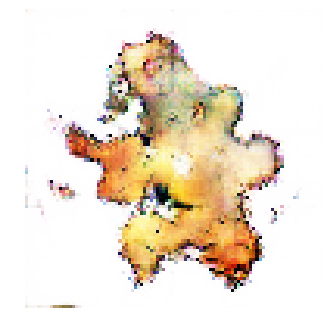


Epoch: 15340, D: -6.077, G: 1.875
Epoch: 15341, D: -6.589, G: 2.407
Epoch: 15342, D: -7.205, G: 2.742
Epoch: 15343, D: -5.506, G: 5.43
Epoch: 15344, D: -5.294, G: 4.464
Epoch: 15345, D: -4.764, G: 3.681
Epoch: 15346, D: -5.659, G: 6.176
Epoch: 15347, D: -7.629, G: 3.559
Epoch: 15348, D: -6.81, G: 5.441
Epoch: 15349, D: -6.379, G: 2.947
Epoch: 15350, D: -4.688, G: 6.058
Epoch: 15351, D: -6.374, G: 3.888
Epoch: 15352, D: -6.08, G: 1.996
Epoch: 15353, D: -5.093, G: 3.761
Epoch: 15354, D: -6.627, G: 2.35
Epoch: 15355, D: -5.041, G: 4.637
Epoch: 15356, D: -7.133, G: 2.359
Epoch: 15357, D: -6.179, G: 3.576
Epoch: 15358, D: -6.709, G: 4.206
Epoch: 15359, D: -5.402, G: 4.193


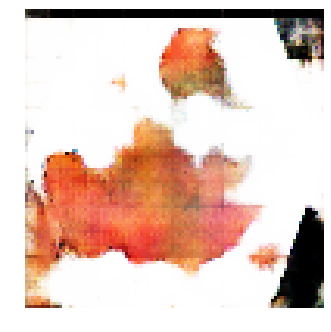


Epoch: 15360, D: -6.822, G: 4.731
Epoch: 15361, D: -5.905, G: 2.929
Epoch: 15362, D: -5.67, G: 5.182
Epoch: 15363, D: -5.1, G: 3.846
Epoch: 15364, D: -6.116, G: 4.139
Epoch: 15365, D: -6.993, G: 2.042
Epoch: 15366, D: -5.581, G: 3.149
Epoch: 15367, D: -6.084, G: 3.879
Epoch: 15368, D: -5.772, G: 3.328
Epoch: 15369, D: -6.705, G: 3.949
Epoch: 15370, D: -6.138, G: 3.05
Epoch: 15371, D: -7.132, G: 1.811
Epoch: 15372, D: -5.901, G: 3.672
Epoch: 15373, D: -5.637, G: 3.787
Epoch: 15374, D: -6.67, G: 3.564
Epoch: 15375, D: -5.221, G: -0.4664
Epoch: 15376, D: -5.981, G: 4.568
Epoch: 15377, D: -7.197, G: 3.856
Epoch: 15378, D: -5.531, G: 1.338
Epoch: 15379, D: -6.073, G: 2.282


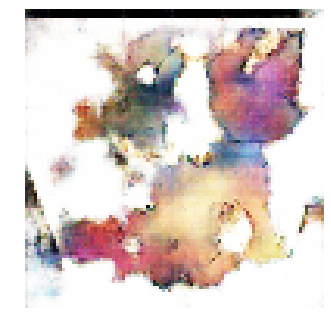


Epoch: 15380, D: -7.29, G: 1.504
Epoch: 15381, D: -5.301, G: 3.891
Epoch: 15382, D: -6.259, G: 5.658
Epoch: 15383, D: -5.306, G: 2.347
Epoch: 15384, D: -6.88, G: 5.138
Epoch: 15385, D: -6.248, G: 4.153
Epoch: 15386, D: -6.141, G: 2.973
Epoch: 15387, D: -5.651, G: 1.909
Epoch: 15388, D: -7.068, G: 4.723
Epoch: 15389, D: -6.915, G: 2.105
Epoch: 15390, D: -6.803, G: 2.567
Epoch: 15391, D: -7.274, G: 3.358
Epoch: 15392, D: -5.452, G: 3.858
Epoch: 15393, D: -5.656, G: 5.174
Epoch: 15394, D: -5.539, G: 5.868
Epoch: 15395, D: -6.005, G: 2.855
Epoch: 15396, D: -5.81, G: 4.625
Epoch: 15397, D: -4.889, G: 3.486
Epoch: 15398, D: -4.987, G: 3.311
Epoch: 15399, D: -6.215, G: 2.125


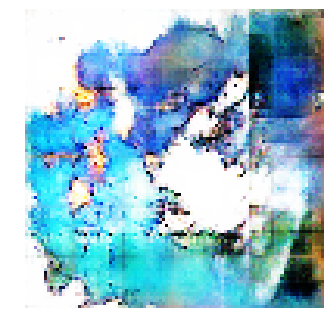


Epoch: 15400, D: -5.288, G: 3.182
Epoch: 15401, D: -6.109, G: 3.721
Epoch: 15402, D: -6.506, G: 2.826
Epoch: 15403, D: -6.007, G: 1.836
Epoch: 15404, D: -5.842, G: 5.055
Epoch: 15405, D: -5.174, G: 5.186
Epoch: 15406, D: -6.05, G: 8.02
Epoch: 15407, D: -6.99, G: 2.54
Epoch: 15408, D: -6.789, G: 4.448
Epoch: 15409, D: -5.441, G: 3.45
Epoch: 15410, D: -7.018, G: 4.281
Epoch: 15411, D: -5.853, G: 3.169
Epoch: 15412, D: -5.293, G: 3.533
Epoch: 15413, D: -6.562, G: 3.483
Epoch: 15414, D: -6.368, G: 1.844
Epoch: 15415, D: -5.796, G: 4.444
Epoch: 15416, D: -6.194, G: 4.386
Epoch: 15417, D: -7.493, G: 4.099
Epoch: 15418, D: -5.211, G: 4.108
Epoch: 15419, D: -5.274, G: 4.248


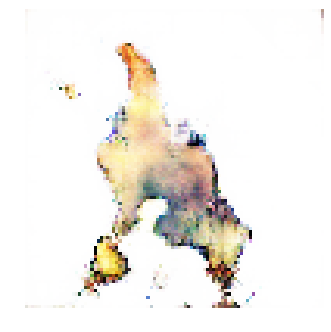


Epoch: 15420, D: -6.248, G: 5.602
Epoch: 15421, D: -6.577, G: 1.682
Epoch: 15422, D: -6.233, G: 3.162
Epoch: 15423, D: -6.432, G: 3.943
Epoch: 15424, D: -5.828, G: 2.949
Epoch: 15425, D: -5.591, G: 2.168
Epoch: 15426, D: -3.952, G: 2.197
Epoch: 15427, D: -5.719, G: 4.427
Epoch: 15428, D: -5.496, G: 5.555
Epoch: 15429, D: -7.493, G: 3.25
Epoch: 15430, D: -5.704, G: 3.014
Epoch: 15431, D: -5.535, G: 2.753
Epoch: 15432, D: -6.515, G: 3.631
Epoch: 15433, D: -6.142, G: 3.717
Epoch: 15434, D: -6.232, G: 2.107
Epoch: 15435, D: -5.337, G: 1.964
Epoch: 15436, D: -4.892, G: 4.882
Epoch: 15437, D: -4.377, G: 4.707
Epoch: 15438, D: -5.646, G: 5.02
Epoch: 15439, D: -6.259, G: 3.961


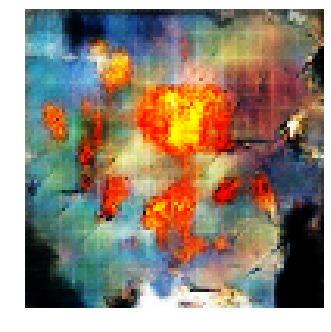


Epoch: 15440, D: -7.206, G: 4.645
Epoch: 15441, D: -6.026, G: 4.619
Epoch: 15442, D: -6.143, G: 2.12
Epoch: 15443, D: -6.493, G: 2.85
Epoch: 15444, D: -5.03, G: 3.126
Epoch: 15445, D: -6.05, G: 6.068
Epoch: 15446, D: -6.446, G: 3.132
Epoch: 15447, D: -6.381, G: 2.279
Epoch: 15448, D: -5.39, G: 7.175
Epoch: 15449, D: -6.178, G: 5.594
Epoch: 15450, D: -6.636, G: 3.42
Epoch: 15451, D: -5.966, G: 1.015
Epoch: 15452, D: -5.452, G: 3.134
Epoch: 15453, D: -6.928, G: 3.364
Epoch: 15454, D: -6.581, G: 2.347
Epoch: 15455, D: -4.921, G: 4.908
Epoch: 15456, D: -6.78, G: 3.997
Epoch: 15457, D: -7.301, G: 4.621
Epoch: 15458, D: -3.502, G: 2.8
Epoch: 15459, D: -5.985, G: 5.143


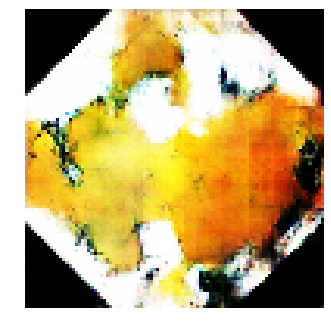


Epoch: 15460, D: -7.341, G: 2.583
Epoch: 15461, D: -6.781, G: 5.236
Epoch: 15462, D: -5.827, G: 4.103
Epoch: 15463, D: -4.658, G: 3.461
Epoch: 15464, D: -5.73, G: 4.66
Epoch: 15465, D: -5.486, G: 5.058
Epoch: 15466, D: -6.218, G: 5.034
Epoch: 15467, D: -6.092, G: 1.87
Epoch: 15468, D: -5.925, G: 5.003
Epoch: 15469, D: -6.063, G: 3.337
Epoch: 15470, D: -4.98, G: 4.13
Epoch: 15471, D: -5.858, G: 5.412
Epoch: 15472, D: -6.929, G: 2.798
Epoch: 15473, D: -7.252, G: 3.214
Epoch: 15474, D: -6.42, G: 3.414
Epoch: 15475, D: -4.678, G: 4.681
Epoch: 15476, D: -7.436, G: 2.846
Epoch: 15477, D: -6.448, G: 6.327
Epoch: 15478, D: -6.862, G: 4.153
Epoch: 15479, D: -6.496, G: 3.686


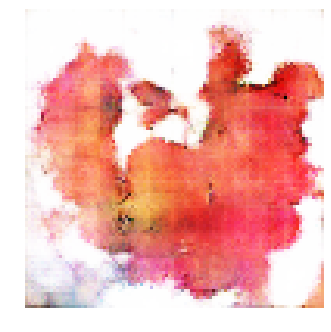


Epoch: 15480, D: -6.93, G: 3.936
Epoch: 15481, D: -5.175, G: 4.526
Epoch: 15482, D: -6.605, G: 2.815
Epoch: 15483, D: -6.037, G: 3.725
Epoch: 15484, D: -4.929, G: 2.726
Epoch: 15485, D: -6.479, G: 4.295
Epoch: 15486, D: -5.085, G: 6.955
Epoch: 15487, D: -6.381, G: 5.163
Epoch: 15488, D: -7.058, G: 2.381
Epoch: 15489, D: -5.551, G: 5.12
Epoch: 15490, D: -6.482, G: 4.921
Epoch: 15491, D: -6.713, G: 3.98
Epoch: 15492, D: -4.699, G: 5.052
Epoch: 15493, D: -5.067, G: 3.247
Epoch: 15494, D: -5.803, G: 3.382
Epoch: 15495, D: -6.599, G: 2.68
Epoch: 15496, D: -5.948, G: 3.898
Epoch: 15497, D: -5.965, G: 3.095
Epoch: 15498, D: -6.8, G: 1.945
Epoch: 15499, D: -6.247, G: 1.383


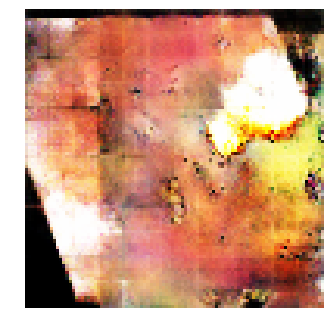


Epoch: 15500, D: -5.912, G: 3.474
Epoch: 15501, D: -7.014, G: 4.135
Epoch: 15502, D: -6.732, G: 5.345
Epoch: 15503, D: -5.104, G: 3.102
Epoch: 15504, D: -6.453, G: 2.406
Epoch: 15505, D: -5.572, G: 3.323
Epoch: 15506, D: -6.388, G: 4.566
Epoch: 15507, D: -6.779, G: 3.972
Epoch: 15508, D: -4.827, G: 3.322
Epoch: 15509, D: -6.301, G: 4.291
Epoch: 15510, D: -6.847, G: 2.944
Epoch: 15511, D: -6.875, G: 2.422
Epoch: 15512, D: -7.808, G: 1.961
Epoch: 15513, D: -5.953, G: 2.87
Epoch: 15514, D: -5.495, G: 2.119
Epoch: 15515, D: -6.138, G: 4.274
Epoch: 15516, D: -5.286, G: 3.459
Epoch: 15517, D: -6.349, G: 3.823
Epoch: 15518, D: -6.298, G: 2.075
Epoch: 15519, D: -5.663, G: 3.609


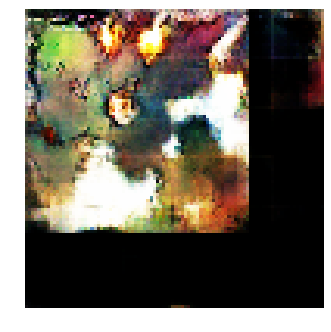


Epoch: 15520, D: -6.578, G: 3.142
Epoch: 15521, D: -5.896, G: 3.857
Epoch: 15522, D: -6.082, G: 2.162
Epoch: 15523, D: -5.871, G: 3.062
Epoch: 15524, D: -5.487, G: 6.162
Epoch: 15525, D: -5.417, G: 4.482
Epoch: 15526, D: -6.021, G: 2.435
Epoch: 15527, D: -5.208, G: 2.954
Epoch: 15528, D: -5.849, G: 1.943
Epoch: 15529, D: -5.045, G: 3.955
Epoch: 15530, D: -4.852, G: 2.754
Epoch: 15531, D: -5.117, G: 5.346
Epoch: 15532, D: -5.752, G: 2.089
Epoch: 15533, D: -6.045, G: 3.085
Epoch: 15534, D: -5.692, G: 4.064
Epoch: 15535, D: -7.891, G: 1.381
Epoch: 15536, D: -6.303, G: 8.731
Epoch: 15537, D: -5.721, G: 4.326
Epoch: 15538, D: -5.15, G: 4.275
Epoch: 15539, D: -5.098, G: 2.807


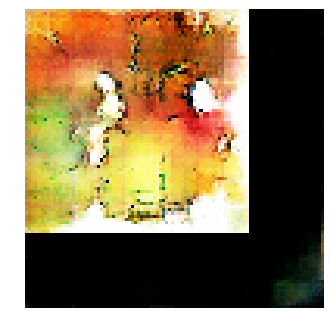


Epoch: 15540, D: -6.439, G: 3.523
Epoch: 15541, D: -4.492, G: 4.975
Epoch: 15542, D: -5.144, G: 5.047
Epoch: 15543, D: -7.11, G: 3.753
Epoch: 15544, D: -6.617, G: 0.6934
Epoch: 15545, D: -6.514, G: 3.307
Epoch: 15546, D: -6.063, G: 2.725
Epoch: 15547, D: -4.707, G: 4.577
Epoch: 15548, D: -6.073, G: 2.587
Epoch: 15549, D: -6.227, G: 3.081
Epoch: 15550, D: -5.669, G: 3.182
Epoch: 15551, D: -5.935, G: 5.938
Epoch: 15552, D: -5.943, G: 5.167
Epoch: 15553, D: -5.707, G: 3.363
Epoch: 15554, D: -5.564, G: 1.606
Epoch: 15555, D: -5.67, G: 3.97
Epoch: 15556, D: -5.62, G: 1.769
Epoch: 15557, D: -5.539, G: 2.346
Epoch: 15558, D: -6.645, G: 5.433
Epoch: 15559, D: -6.232, G: 3.901


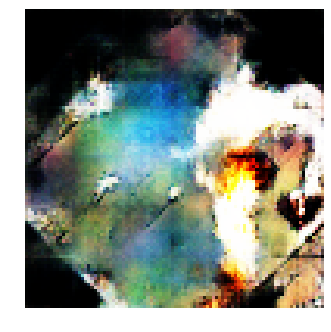


Epoch: 15560, D: -6.715, G: 3.359
Epoch: 15561, D: -6.275, G: 4.192
Epoch: 15562, D: -6.692, G: 2.851
Epoch: 15563, D: -4.914, G: 0.618
Epoch: 15564, D: -5.296, G: 4.188
Epoch: 15565, D: -7.439, G: 3.239
Epoch: 15566, D: -4.783, G: 3.707
Epoch: 15567, D: -4.554, G: 4.654
Epoch: 15568, D: -7.554, G: 4.192
Epoch: 15569, D: -6.182, G: 5.003
Epoch: 15570, D: -5.915, G: 3.805
Epoch: 15571, D: -5.822, G: 4.997
Epoch: 15572, D: -6.54, G: 5.559
Epoch: 15573, D: -7.099, G: 4.059
Epoch: 15574, D: -6.177, G: 2.581
Epoch: 15575, D: -6.554, G: 5.421
Epoch: 15576, D: -5.775, G: 3.828
Epoch: 15577, D: -6.134, G: 5.746
Epoch: 15578, D: -4.655, G: 3.384
Epoch: 15579, D: -6.656, G: 4.447


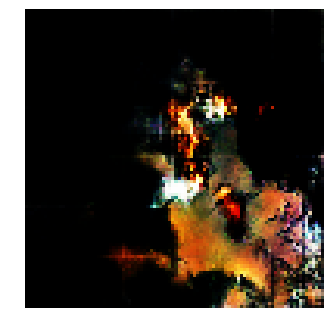


Epoch: 15580, D: -5.653, G: 4.454
Epoch: 15581, D: -6.476, G: 4.208
Epoch: 15582, D: -6.614, G: 6.575
Epoch: 15583, D: -5.82, G: 3.319
Epoch: 15584, D: -6.666, G: 2.339
Epoch: 15585, D: -6.26, G: 2.742
Epoch: 15586, D: -6.36, G: 4.314
Epoch: 15587, D: -5.969, G: 4.36
Epoch: 15588, D: -6.665, G: 5.383
Epoch: 15589, D: -4.604, G: 2.807
Epoch: 15590, D: -7.496, G: 3.697
Epoch: 15591, D: -5.551, G: 1.036
Epoch: 15592, D: -5.677, G: 6.301
Epoch: 15593, D: -6.264, G: 4.727
Epoch: 15594, D: -6.551, G: 6.245
Epoch: 15595, D: -5.684, G: 4.12
Epoch: 15596, D: -6.804, G: 4.512
Epoch: 15597, D: -5.9, G: 3.634
Epoch: 15598, D: -6.826, G: 2.003
Epoch: 15599, D: -6.406, G: 3.164


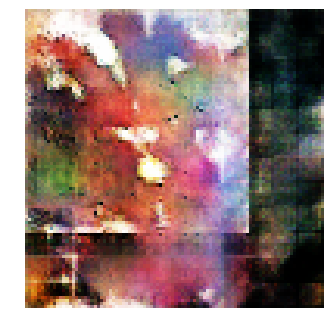


Epoch: 15600, D: -7.306, G: 5.722
Epoch: 15601, D: -6.538, G: 2.686
Epoch: 15602, D: -6.962, G: 4.59
Epoch: 15603, D: -6.482, G: 4.239
Epoch: 15604, D: -6.466, G: 3.349
Epoch: 15605, D: -5.726, G: 1.891
Epoch: 15606, D: -7.54, G: 4.378
Epoch: 15607, D: -5.584, G: 3.79
Epoch: 15608, D: -5.565, G: 4.484
Epoch: 15609, D: -6.652, G: 4.521
Epoch: 15610, D: -6.326, G: 1.221
Epoch: 15611, D: -6.13, G: 1.863
Epoch: 15612, D: -6.956, G: 3.549
Epoch: 15613, D: -5.862, G: 4.223
Epoch: 15614, D: -6.526, G: 4.602
Epoch: 15615, D: -5.316, G: 1.541
Epoch: 15616, D: -8.214, G: 3.153
Epoch: 15617, D: -5.865, G: 0.8544
Epoch: 15618, D: -5.227, G: 4.674
Epoch: 15619, D: -5.916, G: 2.761


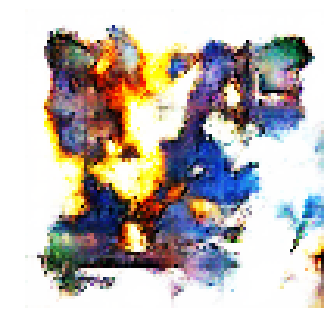


Epoch: 15620, D: -4.792, G: 3.147
Epoch: 15621, D: -7.068, G: 2.23
Epoch: 15622, D: -6.468, G: 4.391
Epoch: 15623, D: -5.79, G: 1.943
Epoch: 15624, D: -5.44, G: 4.287
Epoch: 15625, D: -6.625, G: 2.339
Epoch: 15626, D: -5.881, G: 2.226
Epoch: 15627, D: -5.534, G: 5.993
Epoch: 15628, D: -5.738, G: 3.169
Epoch: 15629, D: -6.666, G: 1.8
Epoch: 15630, D: -5.475, G: 2.771
Epoch: 15631, D: -6.126, G: 6.349
Epoch: 15632, D: -6.138, G: 2.63
Epoch: 15633, D: -6.801, G: 3.044
Epoch: 15634, D: -5.849, G: 2.644
Epoch: 15635, D: -6.78, G: 5.735
Epoch: 15636, D: -6.394, G: 2.726
Epoch: 15637, D: -5.617, G: 1.811
Epoch: 15638, D: -5.314, G: 2.897
Epoch: 15639, D: -5.58, G: 2.471


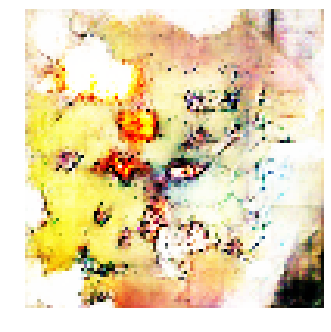


Epoch: 15640, D: -4.802, G: 5.804
Epoch: 15641, D: -6.842, G: 3.95
Epoch: 15642, D: -5.094, G: 5.278
Epoch: 15643, D: -5.971, G: 3.309
Epoch: 15644, D: -6.183, G: 2.252
Epoch: 15645, D: -5.553, G: 4.098
Epoch: 15646, D: -6.403, G: 3.994
Epoch: 15647, D: -5.46, G: 5.247
Epoch: 15648, D: -4.928, G: 3.184
Epoch: 15649, D: -5.819, G: 2.371
Epoch: 15650, D: -6.745, G: 2.703
Epoch: 15651, D: -5.066, G: 3.856
Epoch: 15652, D: -5.803, G: 2.061
Epoch: 15653, D: -5.67, G: 4.599
Epoch: 15654, D: -5.646, G: 4.064
Epoch: 15655, D: -7.087, G: 3.767
Epoch: 15656, D: -7.008, G: 3.47
Epoch: 15657, D: -5.296, G: 3.273
Epoch: 15658, D: -5.537, G: 4.229
Epoch: 15659, D: -5.539, G: 4.612


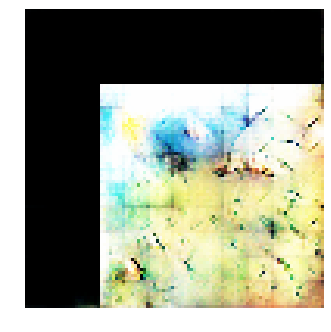


Epoch: 15660, D: -5.196, G: 2.82
Epoch: 15661, D: -5.932, G: 3.353
Epoch: 15662, D: -6.862, G: 6.161
Epoch: 15663, D: -6.179, G: 4.576
Epoch: 15664, D: -5.274, G: 3.135
Epoch: 15665, D: -6.68, G: 3.5
Epoch: 15666, D: -6.223, G: 2.135
Epoch: 15667, D: -4.644, G: 4.177
Epoch: 15668, D: -6.337, G: 3.097
Epoch: 15669, D: -5.764, G: 6.639
Epoch: 15670, D: -5.961, G: 3.695
Epoch: 15671, D: -7.118, G: 6.186
Epoch: 15672, D: -5.955, G: 3.549
Epoch: 15673, D: -5.15, G: 3.219
Epoch: 15674, D: -5.767, G: 4.255
Epoch: 15675, D: -6.986, G: 3.327
Epoch: 15676, D: -4.03, G: 3.71
Epoch: 15677, D: -6.847, G: 4.713
Epoch: 15678, D: -6.045, G: 2.006
Epoch: 15679, D: -4.762, G: 4.239


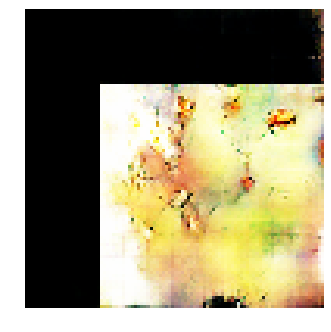


Epoch: 15680, D: -6.583, G: 5.139
Epoch: 15681, D: -5.885, G: 7.259
Epoch: 15682, D: -5.092, G: 5.033
Epoch: 15683, D: -5.799, G: 3.998
Epoch: 15684, D: -6.572, G: 4.537
Epoch: 15685, D: -5.938, G: 2.881
Epoch: 15686, D: -5.53, G: 3.607
Epoch: 15687, D: -6.607, G: 4.642
Epoch: 15688, D: -6.248, G: 5.2
Epoch: 15689, D: -6.562, G: 3.39
Epoch: 15690, D: -7.059, G: 4.725
Epoch: 15691, D: -5.627, G: 4.123
Epoch: 15692, D: -4.844, G: 3.334
Epoch: 15693, D: -4.876, G: 4.428
Epoch: 15694, D: -5.325, G: 4.033
Epoch: 15695, D: -5.737, G: 2.758
Epoch: 15696, D: -5.609, G: 5.164
Epoch: 15697, D: -5.776, G: 3.051
Epoch: 15698, D: -6.106, G: 4.856
Epoch: 15699, D: -6.253, G: 3.152


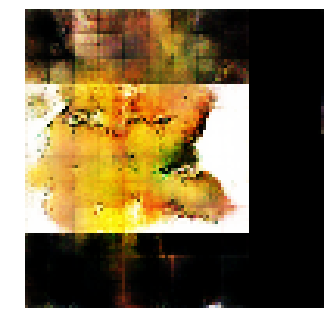


Epoch: 15700, D: -4.898, G: 2.399
Epoch: 15701, D: -5.602, G: 2.224
Epoch: 15702, D: -6.771, G: 2.49
Epoch: 15703, D: -4.446, G: 1.438
Epoch: 15704, D: -6.003, G: 4.298
Epoch: 15705, D: -5.3, G: 4.38
Epoch: 15706, D: -4.744, G: 4.704
Epoch: 15707, D: -6.523, G: 5.432
Epoch: 15708, D: -7.633, G: 4.275
Epoch: 15709, D: -6.253, G: 3.618
Epoch: 15710, D: -5.394, G: 2.69
Epoch: 15711, D: -7.037, G: 2.834
Epoch: 15712, D: -6.564, G: 5.677
Epoch: 15713, D: -5.373, G: 2.209
Epoch: 15714, D: -5.793, G: 2.27
Epoch: 15715, D: -5.5, G: 2.177
Epoch: 15716, D: -7.074, G: 0.5341
Epoch: 15717, D: -6.335, G: 2.785
Epoch: 15718, D: -5.749, G: 5.8
Epoch: 15719, D: -4.341, G: 3.503


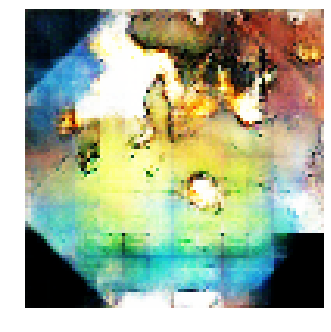


Epoch: 15720, D: -5.07, G: 3.604
Epoch: 15721, D: -6.691, G: 3.774
Epoch: 15722, D: -5.433, G: 4.303
Epoch: 15723, D: -5.818, G: 3.233
Epoch: 15724, D: -6.92, G: 4.157
Epoch: 15725, D: -5.27, G: 4.426
Epoch: 15726, D: -7.267, G: 4.632
Epoch: 15727, D: -6.045, G: 4.048
Epoch: 15728, D: -6.295, G: 4.59
Epoch: 15729, D: -5.73, G: 4.754
Epoch: 15730, D: -4.283, G: 4.37
Epoch: 15731, D: -7.532, G: 3.704
Epoch: 15732, D: -5.739, G: 3.821
Epoch: 15733, D: -5.826, G: 5.578
Epoch: 15734, D: -4.571, G: 4.977
Epoch: 15735, D: -5.941, G: 4.769
Epoch: 15736, D: -4.342, G: 3.295
Epoch: 15737, D: -6.508, G: 1.002
Epoch: 15738, D: -4.501, G: 3.565
Epoch: 15739, D: -6.281, G: 4.038


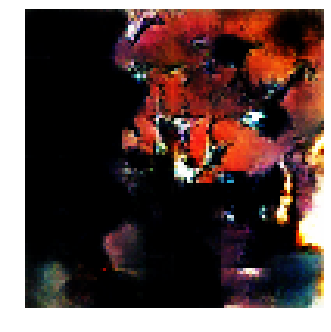


Epoch: 15740, D: -6.268, G: 2.331
Epoch: 15741, D: -5.235, G: 2.327
Epoch: 15742, D: -6.437, G: 2.53
Epoch: 15743, D: -5.117, G: 3.735
Epoch: 15744, D: -5.992, G: 3.743
Epoch: 15745, D: -4.701, G: 3.151
Epoch: 15746, D: -5.581, G: 4.783
Epoch: 15747, D: -6.038, G: 3.566
Epoch: 15748, D: -7.807, G: 3.644
Epoch: 15749, D: -7.315, G: 1.19
Epoch: 15750, D: -5.621, G: 1.96
Epoch: 15751, D: -5.565, G: 5.443
Epoch: 15752, D: -5.556, G: 5.139
Epoch: 15753, D: -4.901, G: 1.681
Epoch: 15754, D: -6.105, G: 3.668
Epoch: 15755, D: -4.818, G: 4.396
Epoch: 15756, D: -5.621, G: 3.878
Epoch: 15757, D: -4.767, G: 2.511
Epoch: 15758, D: -6.582, G: 2.877
Epoch: 15759, D: -5.667, G: 3.306


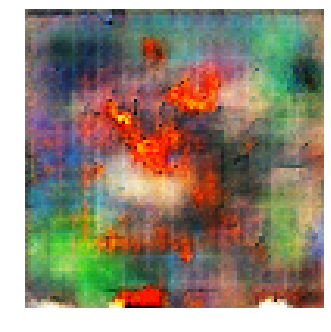


Epoch: 15760, D: -5.396, G: 4.8
Epoch: 15761, D: -6.666, G: 6.051
Epoch: 15762, D: -4.636, G: 1.262
Epoch: 15763, D: -5.696, G: 2.256
Epoch: 15764, D: -6.676, G: 2.345
Epoch: 15765, D: -6.224, G: 3.216
Epoch: 15766, D: -5.931, G: 3.571
Epoch: 15767, D: -7.3, G: 2.342
Epoch: 15768, D: -6.455, G: 4.206
Epoch: 15769, D: -5.601, G: 2.282
Epoch: 15770, D: -6.583, G: 4.786
Epoch: 15771, D: -5.456, G: 2.789
Epoch: 15772, D: -5.468, G: 6.186
Epoch: 15773, D: -7.456, G: 4.085
Epoch: 15774, D: -4.855, G: 3.041
Epoch: 15775, D: -6.537, G: 4.694
Epoch: 15776, D: -6.657, G: 4.09
Epoch: 15777, D: -5.177, G: 1.656
Epoch: 15778, D: -5.798, G: 3.967
Epoch: 15779, D: -4.804, G: 3.324


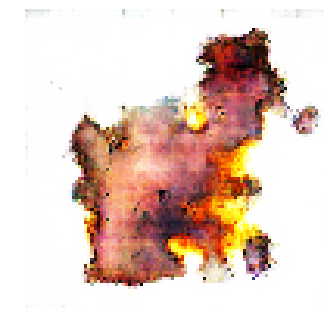


Epoch: 15780, D: -6.841, G: 4.243
Epoch: 15781, D: -6.107, G: 2.771
Epoch: 15782, D: -5.896, G: 3.027
Epoch: 15783, D: -6.199, G: 4.646
Epoch: 15784, D: -6.744, G: 6.731
Epoch: 15785, D: -6.114, G: 3.701
Epoch: 15786, D: -6.445, G: 3.869
Epoch: 15787, D: -5.264, G: 2.698
Epoch: 15788, D: -5.896, G: 4.803
Epoch: 15789, D: -5.596, G: 4.56
Epoch: 15790, D: -6.973, G: 3.491
Epoch: 15791, D: -5.557, G: 1.536
Epoch: 15792, D: -5.572, G: 2.438
Epoch: 15793, D: -5.921, G: 0.4272
Epoch: 15794, D: -5.169, G: 3.388
Epoch: 15795, D: -6.257, G: 3.159
Epoch: 15796, D: -6.997, G: 4.214
Epoch: 15797, D: -5.786, G: 3.07
Epoch: 15798, D: -6.86, G: 3.096
Epoch: 15799, D: -6.182, G: 2.539


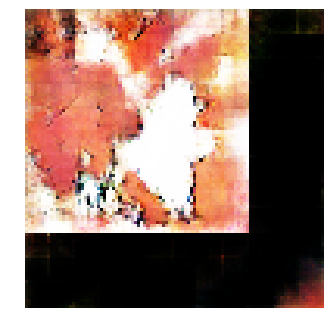


Epoch: 15800, D: -5.993, G: 3.723
Epoch: 15801, D: -6.867, G: 3.151
Epoch: 15802, D: -5.888, G: 6.323
Epoch: 15803, D: -7.593, G: 5.057
Epoch: 15804, D: -5.908, G: 3.056
Epoch: 15805, D: -5.296, G: 2.9
Epoch: 15806, D: -7.042, G: 4.354
Epoch: 15807, D: -6.894, G: 4.611
Epoch: 15808, D: -5.722, G: 2.849
Epoch: 15809, D: -6.964, G: 2.989
Epoch: 15810, D: -5.56, G: 3.559
Epoch: 15811, D: -5.313, G: 4.966
Epoch: 15812, D: -5.555, G: 3.575
Epoch: 15813, D: -5.181, G: 3.657
Epoch: 15814, D: -5.789, G: 4.013
Epoch: 15815, D: -6.075, G: 3.399
Epoch: 15816, D: -5.804, G: 1.89
Epoch: 15817, D: -6.177, G: 4.89
Epoch: 15818, D: -5.272, G: 3.607
Epoch: 15819, D: -6.977, G: 3.846


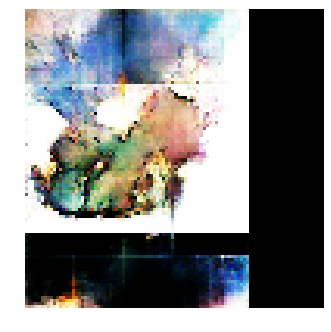


Epoch: 15820, D: -4.596, G: 3.331
Epoch: 15821, D: -5.986, G: 2.358
Epoch: 15822, D: -5.999, G: 3.651
Epoch: 15823, D: -6.464, G: 4.01
Epoch: 15824, D: -6.182, G: 3.348
Epoch: 15825, D: -6.095, G: 3.746
Epoch: 15826, D: -4.443, G: 3.195
Epoch: 15827, D: -6.497, G: 4.201
Epoch: 15828, D: -5.735, G: 1.882
Epoch: 15829, D: -5.492, G: 5.369
Epoch: 15830, D: -6.89, G: 4.081
Epoch: 15831, D: -6.716, G: 4.157
Epoch: 15832, D: -6.346, G: 0.9133
Epoch: 15833, D: -6.592, G: 5.825
Epoch: 15834, D: -5.249, G: 5.27
Epoch: 15835, D: -6.244, G: 4.93
Epoch: 15836, D: -5.768, G: 1.301
Epoch: 15837, D: -6.75, G: 3.939
Epoch: 15838, D: -4.616, G: 3.363
Epoch: 15839, D: -5.135, G: 2.656


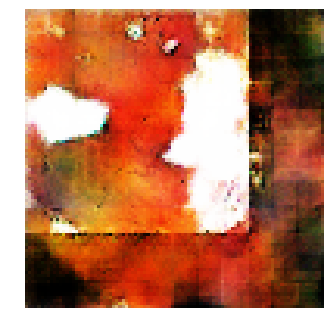


Epoch: 15840, D: -5.768, G: 3.539
Epoch: 15841, D: -5.588, G: 2.71
Epoch: 15842, D: -6.663, G: 4.398
Epoch: 15843, D: -6.271, G: 1.4
Epoch: 15844, D: -5.474, G: 4.774
Epoch: 15845, D: -6.673, G: 5.242
Epoch: 15846, D: -5.454, G: 3.99
Epoch: 15847, D: -5.233, G: 4.315
Epoch: 15848, D: -6.483, G: 2.576
Epoch: 15849, D: -6.035, G: 3.039
Epoch: 15850, D: -5.761, G: 4.949
Epoch: 15851, D: -6.666, G: 5.933
Epoch: 15852, D: -6.398, G: 5.11
Epoch: 15853, D: -6.401, G: 3.495
Epoch: 15854, D: -6.267, G: 3.113
Epoch: 15855, D: -7.654, G: 2.049
Epoch: 15856, D: -5.684, G: 2.015
Epoch: 15857, D: -5.071, G: 4.062
Epoch: 15858, D: -4.189, G: 3.332
Epoch: 15859, D: -5.298, G: 3.367


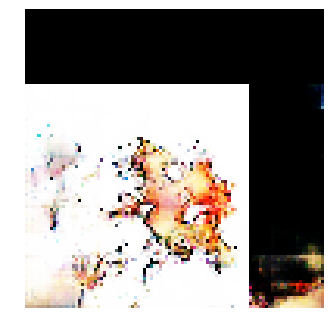


Epoch: 15860, D: -5.853, G: 3.536
Epoch: 15861, D: -6.288, G: 3.135
Epoch: 15862, D: -5.632, G: 2.493
Epoch: 15863, D: -3.888, G: 3.238
Epoch: 15864, D: -5.723, G: 2.446
Epoch: 15865, D: -7.345, G: 2.814
Epoch: 15866, D: -6.33, G: 4.791
Epoch: 15867, D: -6.313, G: 1.77
Epoch: 15868, D: -6.28, G: 1.702
Epoch: 15869, D: -6.636, G: 3.807
Epoch: 15870, D: -5.495, G: 3.851
Epoch: 15871, D: -6.544, G: 5.715
Epoch: 15872, D: -6.884, G: 3.849
Epoch: 15873, D: -5.571, G: 2.306
Epoch: 15874, D: -6.785, G: 2.822
Epoch: 15875, D: -5.658, G: 5.09
Epoch: 15876, D: -6.795, G: 6.362
Epoch: 15877, D: -6.801, G: 5.148
Epoch: 15878, D: -7.466, G: 4.206
Epoch: 15879, D: -6.478, G: 2.19


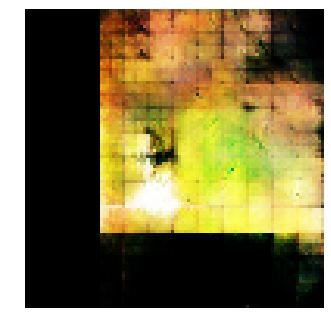


Epoch: 15880, D: -6.072, G: 5.117
Epoch: 15881, D: -5.884, G: 3.31
Epoch: 15882, D: -6.664, G: 3.663
Epoch: 15883, D: -5.545, G: 3.634
Epoch: 15884, D: -6.316, G: 2.998
Epoch: 15885, D: -6.568, G: 3.137
Epoch: 15886, D: -6.188, G: 1.774
Epoch: 15887, D: -5.884, G: 2.355
Epoch: 15888, D: -6.378, G: 5.962
Epoch: 15889, D: -6.018, G: 4.833
Epoch: 15890, D: -6.651, G: 4.698
Epoch: 15891, D: -5.666, G: 4.666
Epoch: 15892, D: -6.101, G: 4.028
Epoch: 15893, D: -6.209, G: 4.918
Epoch: 15894, D: -5.257, G: 0.807
Epoch: 15895, D: -7.106, G: 4.806
Epoch: 15896, D: -5.189, G: 1.117
Epoch: 15897, D: -6.972, G: -1.203
Epoch: 15898, D: -6.11, G: 1.912
Epoch: 15899, D: -7.733, G: 3.777


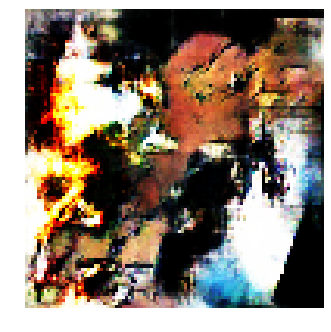


Epoch: 15900, D: -6.717, G: 2.77
Epoch: 15901, D: -5.681, G: 4.393
Epoch: 15902, D: -7.18, G: 4.086
Epoch: 15903, D: -5.566, G: 3.9
Epoch: 15904, D: -5.455, G: 3.567
Epoch: 15905, D: -6.019, G: 4.232
Epoch: 15906, D: -6.919, G: 2.109
Epoch: 15907, D: -5.77, G: 4.736
Epoch: 15908, D: -6.322, G: 4.569
Epoch: 15909, D: -6.32, G: 4.585
Epoch: 15910, D: -5.66, G: 2.483
Epoch: 15911, D: -5.075, G: 3.221
Epoch: 15912, D: -4.682, G: 3.71
Epoch: 15913, D: -5.526, G: 5.014
Epoch: 15914, D: -4.873, G: 3.251
Epoch: 15915, D: -5.553, G: 2.489
Epoch: 15916, D: -7.571, G: 3.189
Epoch: 15917, D: -6.95, G: 3.384
Epoch: 15918, D: -5.817, G: 6.956
Epoch: 15919, D: -6.228, G: 2.551


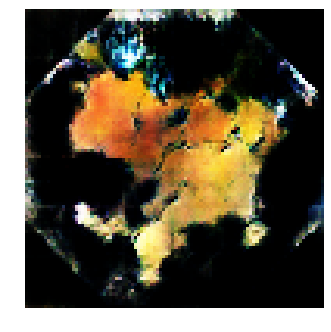


Epoch: 15920, D: -6.652, G: 3.059
Epoch: 15921, D: -7.157, G: 2.846
Epoch: 15922, D: -5.827, G: 5.589
Epoch: 15923, D: -5.028, G: 2.971
Epoch: 15924, D: -6.645, G: 3.445
Epoch: 15925, D: -5.691, G: 3.928
Epoch: 15926, D: -5.164, G: 4.019
Epoch: 15927, D: -7.08, G: 5.737
Epoch: 15928, D: -5.956, G: 4.078
Epoch: 15929, D: -6.615, G: 4.612
Epoch: 15930, D: -6.341, G: 3.734
Epoch: 15931, D: -7.372, G: 1.501
Epoch: 15932, D: -6.757, G: 2.689
Epoch: 15933, D: -5.569, G: 2.954
Epoch: 15934, D: -5.117, G: 3.101
Epoch: 15935, D: -4.673, G: 0.2127
Epoch: 15936, D: -6.697, G: 2.539
Epoch: 15937, D: -7.083, G: 3.788
Epoch: 15938, D: -5.95, G: 4.779
Epoch: 15939, D: -6.211, G: 5.486


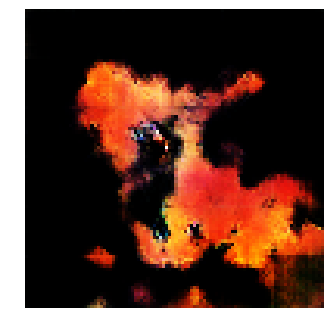


Epoch: 15940, D: -7.017, G: 2.333
Epoch: 15941, D: -5.666, G: 1.841
Epoch: 15942, D: -6.129, G: 4.706
Epoch: 15943, D: -5.585, G: 4.378
Epoch: 15944, D: -5.99, G: 1.736
Epoch: 15945, D: -5.86, G: 5.448
Epoch: 15946, D: -4.923, G: 4.14
Epoch: 15947, D: -6.221, G: 4.616
Epoch: 15948, D: -5.976, G: 2.277
Epoch: 15949, D: -5.486, G: 1.047
Epoch: 15950, D: -4.71, G: 5.139
Epoch: 15951, D: -6.1, G: 2.777
Epoch: 15952, D: -6.076, G: 3.479
Epoch: 15953, D: -6.283, G: 1.914
Epoch: 15954, D: -6.163, G: 5.447
Epoch: 15955, D: -6.268, G: 2.674
Epoch: 15956, D: -4.76, G: 2.916
Epoch: 15957, D: -6.629, G: 3.969
Epoch: 15958, D: -5.617, G: 3.562
Epoch: 15959, D: -5.981, G: 3.472


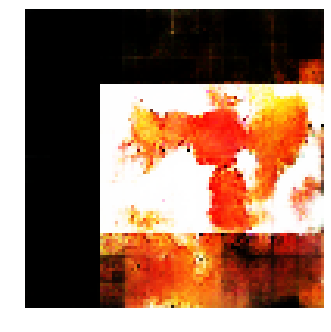


Epoch: 15960, D: -5.614, G: 2.683
Epoch: 15961, D: -6.286, G: 2.678
Epoch: 15962, D: -7.227, G: 2.97
Epoch: 15963, D: -6.751, G: 5.763
Epoch: 15964, D: -4.603, G: 2.405
Epoch: 15965, D: -4.894, G: 4.285
Epoch: 15966, D: -6.024, G: 1.369
Epoch: 15967, D: -5.734, G: 3.332
Epoch: 15968, D: -6.763, G: 1.873
Epoch: 15969, D: -5.295, G: 2.25
Epoch: 15970, D: -5.9, G: 3.25
Epoch: 15971, D: -4.86, G: 2.138
Epoch: 15972, D: -6.524, G: 2.339
Epoch: 15973, D: -4.987, G: 5.156
Epoch: 15974, D: -5.675, G: 4.908
Epoch: 15975, D: -5.668, G: 3.754
Epoch: 15976, D: -5.243, G: 2.115
Epoch: 15977, D: -6.102, G: 2.115
Epoch: 15978, D: -4.686, G: 2.601
Epoch: 15979, D: -5.971, G: 2.341


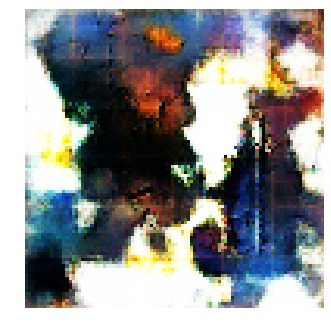


Epoch: 15980, D: -5.339, G: 5.739
Epoch: 15981, D: -5.489, G: 6.16
Epoch: 15982, D: -5.118, G: 2.691
Epoch: 15983, D: -6.767, G: 2.283
Epoch: 15984, D: -6.309, G: 3.446
Epoch: 15985, D: -5.05, G: 2.339
Epoch: 15986, D: -6.694, G: 4.159
Epoch: 15987, D: -6.971, G: 0.3575
Epoch: 15988, D: -5.241, G: 1.762
Epoch: 15989, D: -5.234, G: 3.98
Epoch: 15990, D: -6.112, G: 3.251
Epoch: 15991, D: -6.804, G: 5.903
Epoch: 15992, D: -4.901, G: 2.956
Epoch: 15993, D: -5.73, G: 2.132
Epoch: 15994, D: -7.042, G: 4.213
Epoch: 15995, D: -6.516, G: 4.06
Epoch: 15996, D: -5.973, G: 3.447
Epoch: 15997, D: -6.023, G: 2.62
Epoch: 15998, D: -4.515, G: 3.651
Epoch: 15999, D: -5.432, G: 3.643


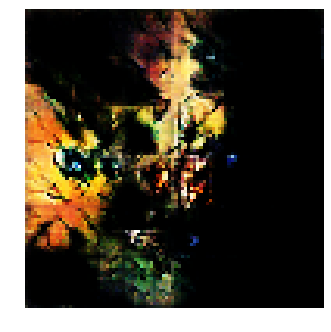


Epoch: 16000, D: -6.433, G: 5.549
Epoch: 16001, D: -5.475, G: 3.439
Epoch: 16002, D: -5.971, G: 3.913
Epoch: 16003, D: -7.12, G: 5.001
Epoch: 16004, D: -7.498, G: 4.973
Epoch: 16005, D: -6.853, G: 1.685
Epoch: 16006, D: -5.693, G: 4.346
Epoch: 16007, D: -6.403, G: 3.16
Epoch: 16008, D: -5.431, G: 0.1796
Epoch: 16009, D: -5.952, G: 5.346
Epoch: 16010, D: -4.882, G: 3.561
Epoch: 16011, D: -5.535, G: 4.701
Epoch: 16012, D: -7.124, G: 2.585
Epoch: 16013, D: -6.612, G: 3.497
Epoch: 16014, D: -5.939, G: 3.804
Epoch: 16015, D: -7.089, G: 2.432
Epoch: 16016, D: -5.789, G: 3.498
Epoch: 16017, D: -6.639, G: 2.163
Epoch: 16018, D: -5.578, G: 1.194
Epoch: 16019, D: -6.486, G: 3.03


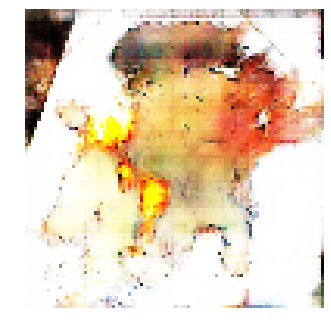


Epoch: 16020, D: -5.634, G: 2.87
Epoch: 16021, D: -5.458, G: 1.888
Epoch: 16022, D: -6.769, G: 2.505
Epoch: 16023, D: -5.727, G: 1.051
Epoch: 16024, D: -7.807, G: 3.579
Epoch: 16025, D: -4.217, G: 1.849
Epoch: 16026, D: -6.671, G: 3.111
Epoch: 16027, D: -5.572, G: 2.43
Epoch: 16028, D: -6.009, G: 2.436
Epoch: 16029, D: -5.507, G: 4.215
Epoch: 16030, D: -5.414, G: 3.964
Epoch: 16031, D: -5.928, G: 4.185
Epoch: 16032, D: -5.068, G: 4.09
Epoch: 16033, D: -4.787, G: 3.063
Epoch: 16034, D: -5.446, G: 4.594
Epoch: 16035, D: -5.112, G: 3.886
Epoch: 16036, D: -5.487, G: 6.502
Epoch: 16037, D: -5.895, G: 3.294
Epoch: 16038, D: -6.092, G: 5.092
Epoch: 16039, D: -6.166, G: 5.121


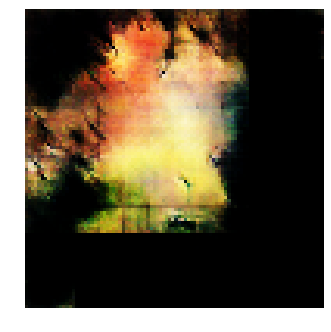


Epoch: 16040, D: -5.85, G: 3.855
Epoch: 16041, D: -5.772, G: 3.948
Epoch: 16042, D: -7.441, G: 4.399
Epoch: 16043, D: -5.799, G: 2.356
Epoch: 16044, D: -6.715, G: 3.397
Epoch: 16045, D: -5.863, G: 4.794
Epoch: 16046, D: -5.616, G: 2.532
Epoch: 16047, D: -5.679, G: 4.806
Epoch: 16048, D: -4.767, G: 1.82
Epoch: 16049, D: -5.525, G: 2.369
Epoch: 16050, D: -5.037, G: 5.131
Epoch: 16051, D: -5.544, G: 3.656
Epoch: 16052, D: -6.64, G: 3.339
Epoch: 16053, D: -7.559, G: 2.483
Epoch: 16054, D: -6.075, G: 3.77
Epoch: 16055, D: -5.254, G: 3.287
Epoch: 16056, D: -6.935, G: 4.664
Epoch: 16057, D: -6.797, G: 4.113
Epoch: 16058, D: -6.379, G: 0.9879
Epoch: 16059, D: -5.347, G: 4.257


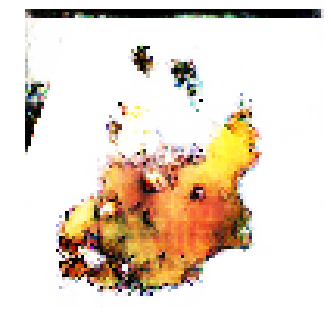


Epoch: 16060, D: -5.789, G: 3.792
Epoch: 16061, D: -5.591, G: 6.005
Epoch: 16062, D: -5.126, G: 3.356
Epoch: 16063, D: -5.699, G: 2.788
Epoch: 16064, D: -7.036, G: 2.516
Epoch: 16065, D: -5.933, G: 5.612
Epoch: 16066, D: -7.598, G: 3.403
Epoch: 16067, D: -6.516, G: 2.129
Epoch: 16068, D: -5.282, G: 4.967
Epoch: 16069, D: -5.045, G: 3.245
Epoch: 16070, D: -5.319, G: 4.489
Epoch: 16071, D: -5.468, G: 3.339
Epoch: 16072, D: -6.156, G: 3.919
Epoch: 16073, D: -4.654, G: 5.682
Epoch: 16074, D: -5.48, G: 5.449
Epoch: 16075, D: -5.272, G: 2.752
Epoch: 16076, D: -5.243, G: 2.627
Epoch: 16077, D: -5.37, G: 5.022
Epoch: 16078, D: -7.327, G: 3.015
Epoch: 16079, D: -6.513, G: 3.646


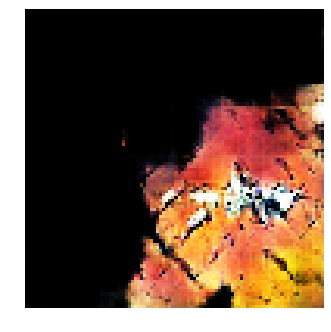


Epoch: 16080, D: -6.437, G: 3.874
Epoch: 16081, D: -5.706, G: 3.775
Epoch: 16082, D: -8.057, G: 4.228
Epoch: 16083, D: -5.425, G: 2.901
Epoch: 16084, D: -6.489, G: 3.529
Epoch: 16085, D: -5.791, G: 2.929
Epoch: 16086, D: -6.582, G: 3.2
Epoch: 16087, D: -6.398, G: 2.579
Epoch: 16088, D: -6.562, G: 4.498
Epoch: 16089, D: -5.878, G: 3.707
Epoch: 16090, D: -5.939, G: 2.833
Epoch: 16091, D: -5.933, G: 0.6699
Epoch: 16092, D: -6.653, G: 3.144
Epoch: 16093, D: -6.58, G: 2.614
Epoch: 16094, D: -5.871, G: 2.66
Epoch: 16095, D: -6.236, G: 2.077
Epoch: 16096, D: -5.103, G: 2.529
Epoch: 16097, D: -5.516, G: 3.056
Epoch: 16098, D: -5.889, G: 3.729
Epoch: 16099, D: -5.29, G: 3.535


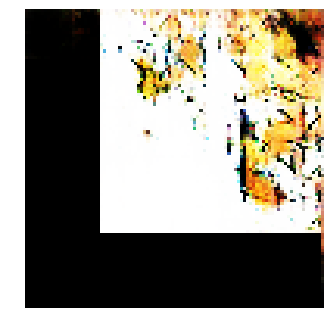


Epoch: 16100, D: -6.906, G: 4.968
Epoch: 16101, D: -6.792, G: 4.685
Epoch: 16102, D: -5.799, G: -0.1229
Epoch: 16103, D: -7.213, G: 4.062
Epoch: 16104, D: -5.119, G: 4.365
Epoch: 16105, D: -6.183, G: 3.738
Epoch: 16106, D: -6.665, G: 4.381
Epoch: 16107, D: -5.117, G: 4.96
Epoch: 16108, D: -5.769, G: 3.741
Epoch: 16109, D: -6.336, G: 1.634
Epoch: 16110, D: -6.502, G: 2.52
Epoch: 16111, D: -4.802, G: -0.6778
Epoch: 16112, D: -7.438, G: 3.942
Epoch: 16113, D: -5.798, G: 3.495
Epoch: 16114, D: -5.768, G: 4.019
Epoch: 16115, D: -6.122, G: 3.085
Epoch: 16116, D: -7.394, G: 4.42
Epoch: 16117, D: -5.449, G: 1.686
Epoch: 16118, D: -6.369, G: 4.707
Epoch: 16119, D: -6.094, G: 2.862


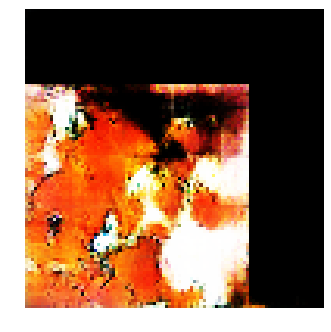


Epoch: 16120, D: -6.243, G: 3.46
Epoch: 16121, D: -5.65, G: 2.689
Epoch: 16122, D: -5.581, G: 5.86
Epoch: 16123, D: -5.469, G: 4.339
Epoch: 16124, D: -6.031, G: 5.151
Epoch: 16125, D: -6.396, G: 3.82
Epoch: 16126, D: -5.45, G: 2.683
Epoch: 16127, D: -4.979, G: 2.284
Epoch: 16128, D: -5.702, G: 2.153
Epoch: 16129, D: -6.56, G: 4.251
Epoch: 16130, D: -5.87, G: 4.17
Epoch: 16131, D: -5.749, G: 4.376
Epoch: 16132, D: -4.708, G: 5.714
Epoch: 16133, D: -5.143, G: 3.202
Epoch: 16134, D: -6.189, G: 4.521
Epoch: 16135, D: -5.295, G: 1.401
Epoch: 16136, D: -4.551, G: 1.557
Epoch: 16137, D: -5.973, G: 3.918
Epoch: 16138, D: -5.135, G: 6.98
Epoch: 16139, D: -5.525, G: 3.82


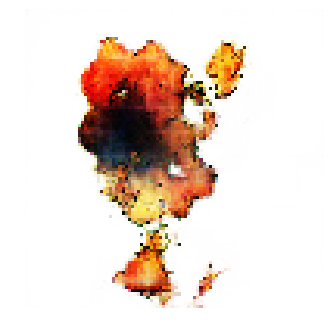


Epoch: 16140, D: -6.542, G: 5.873
Epoch: 16141, D: -5.564, G: 1.64
Epoch: 16142, D: -7.37, G: 4.071
Epoch: 16143, D: -6.563, G: 6.21
Epoch: 16144, D: -6.022, G: 2.114
Epoch: 16145, D: -7.152, G: 3.787
Epoch: 16146, D: -6.789, G: 3.354
Epoch: 16147, D: -6.161, G: 2.935
Epoch: 16148, D: -4.736, G: 3.106
Epoch: 16149, D: -4.876, G: 3.723
Epoch: 16150, D: -7.101, G: 4.053
Epoch: 16151, D: -5.829, G: 1.532
Epoch: 16152, D: -6.396, G: 3.301
Epoch: 16153, D: -4.995, G: 4.893
Epoch: 16154, D: -6.001, G: 4.847
Epoch: 16155, D: -5.795, G: 5.329
Epoch: 16156, D: -6.983, G: 2.595
Epoch: 16157, D: -5.654, G: 2.347
Epoch: 16158, D: -5.805, G: 3.604
Epoch: 16159, D: -5.889, G: 2.062


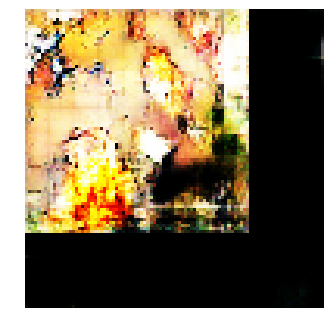


Epoch: 16160, D: -5.295, G: 3.824
Epoch: 16161, D: -6.31, G: 2.841
Epoch: 16162, D: -7.805, G: 4.377
Epoch: 16163, D: -6.987, G: 1.807
Epoch: 16164, D: -7.576, G: 2.127
Epoch: 16165, D: -7.288, G: 3.057
Epoch: 16166, D: -5.348, G: 3.58
Epoch: 16167, D: -5.576, G: 3.625
Epoch: 16168, D: -5.97, G: 3.723
Epoch: 16169, D: -5.588, G: 3.939
Epoch: 16170, D: -6.863, G: 3.252
Epoch: 16171, D: -5.454, G: 3.556
Epoch: 16172, D: -5.751, G: 4.463
Epoch: 16173, D: -6.598, G: 3.086
Epoch: 16174, D: -6.897, G: 2.761
Epoch: 16175, D: -5.241, G: 5.198
Epoch: 16176, D: -5.933, G: 5.013
Epoch: 16177, D: -5.548, G: 2.798
Epoch: 16178, D: -6.903, G: 3.788
Epoch: 16179, D: -7.063, G: 3.361


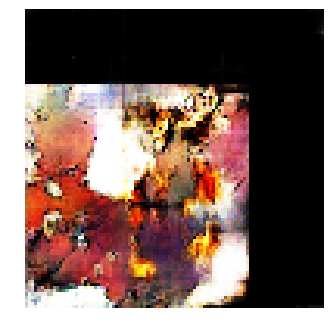


Epoch: 16180, D: -5.8, G: 3.869
Epoch: 16181, D: -6.918, G: 3.589
Epoch: 16182, D: -6.708, G: 4.42
Epoch: 16183, D: -5.357, G: 2.014
Epoch: 16184, D: -5.464, G: 2.81
Epoch: 16185, D: -6.397, G: 3.275
Epoch: 16186, D: -6.776, G: 4.501
Epoch: 16187, D: -7.245, G: 2.666
Epoch: 16188, D: -6.66, G: 2.314
Epoch: 16189, D: -5.421, G: 3.317
Epoch: 16190, D: -6.103, G: 3.803
Epoch: 16191, D: -5.382, G: 2.076
Epoch: 16192, D: -6.352, G: 2.954
Epoch: 16193, D: -5.685, G: 4.09
Epoch: 16194, D: -6.705, G: 3.899
Epoch: 16195, D: -6.09, G: 3.125
Epoch: 16196, D: -5.407, G: 3.23
Epoch: 16197, D: -6.551, G: 2.445
Epoch: 16198, D: -6.694, G: 2.236
Epoch: 16199, D: -5.138, G: 2.121


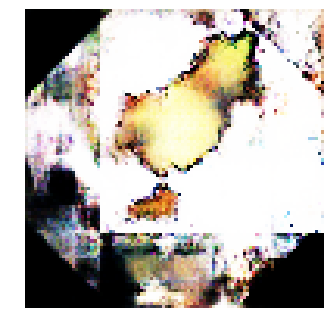


Epoch: 16200, D: -5.984, G: 3.706
Epoch: 16201, D: -6.366, G: 2.82
Epoch: 16202, D: -5.639, G: 2.734
Epoch: 16203, D: -5.584, G: 4.92
Epoch: 16204, D: -6.317, G: 1.648
Epoch: 16205, D: -5.872, G: 3.99
Epoch: 16206, D: -6.64, G: 4.458
Epoch: 16207, D: -7.071, G: 2.708
Epoch: 16208, D: -6.927, G: 4.477
Epoch: 16209, D: -5.225, G: 4.147
Epoch: 16210, D: -6.21, G: 6.592
Epoch: 16211, D: -6.625, G: 2.518
Epoch: 16212, D: -6.762, G: 2.286
Epoch: 16213, D: -5.814, G: 4.122
Epoch: 16214, D: -5.916, G: 3.123
Epoch: 16215, D: -5.73, G: 2.295
Epoch: 16216, D: -5.961, G: 1.932
Epoch: 16217, D: -6.243, G: 2.052
Epoch: 16218, D: -5.099, G: 2.182
Epoch: 16219, D: -6.332, G: 4.373


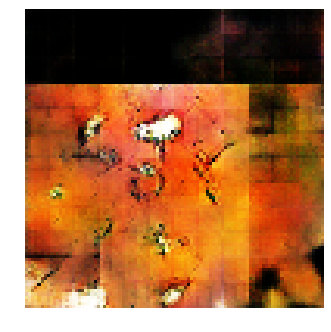


Epoch: 16220, D: -6.263, G: 3.278
Epoch: 16221, D: -5.659, G: 4.203
Epoch: 16222, D: -4.849, G: 2.9
Epoch: 16223, D: -5.853, G: 4.47
Epoch: 16224, D: -7.231, G: 3.183
Epoch: 16225, D: -5.489, G: 5.16
Epoch: 16226, D: -6.079, G: 5.5
Epoch: 16227, D: -5.697, G: 4.049
Epoch: 16228, D: -6.984, G: 1.065
Epoch: 16229, D: -4.923, G: 3.207
Epoch: 16230, D: -5.381, G: 2.49
Epoch: 16231, D: -6.659, G: 4.669
Epoch: 16232, D: -5.386, G: 5.055
Epoch: 16233, D: -6.317, G: 5.087
Epoch: 16234, D: -4.904, G: 6.696
Epoch: 16235, D: -5.662, G: 5.057
Epoch: 16236, D: -7.055, G: 2.397
Epoch: 16237, D: -6.464, G: 3.88
Epoch: 16238, D: -6.211, G: 1.343
Epoch: 16239, D: -6.388, G: 6.065


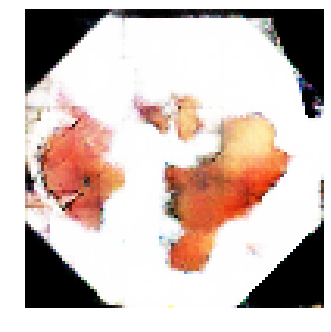


Epoch: 16240, D: -6.952, G: 5.198
Epoch: 16241, D: -5.475, G: 3.217
Epoch: 16242, D: -7.136, G: 3.666
Epoch: 16243, D: -5.318, G: 3.88
Epoch: 16244, D: -6.091, G: 4.129
Epoch: 16245, D: -6.385, G: 2.888
Epoch: 16246, D: -4.346, G: 2.562
Epoch: 16247, D: -6.393, G: 3.485
Epoch: 16248, D: -5.095, G: 2.013
Epoch: 16249, D: -5.791, G: 3.667
Epoch: 16250, D: -5.648, G: 2.123
Epoch: 16251, D: -6.509, G: 3.587
Epoch: 16252, D: -5.337, G: 3.976
Epoch: 16253, D: -5.667, G: 4.793
Epoch: 16254, D: -6.044, G: 2.306
Epoch: 16255, D: -6.078, G: 4.23
Epoch: 16256, D: -5.817, G: 2.552
Epoch: 16257, D: -6.71, G: 3.778
Epoch: 16258, D: -5.905, G: 2.888
Epoch: 16259, D: -5.481, G: 4.99


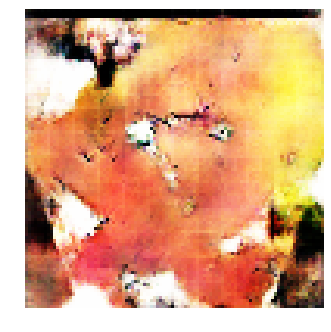


Epoch: 16260, D: -5.478, G: 1.431
Epoch: 16261, D: -5.019, G: 2.011
Epoch: 16262, D: -6.147, G: 4.189
Epoch: 16263, D: -5.842, G: 4.171
Epoch: 16264, D: -5.303, G: 5.302
Epoch: 16265, D: -5.133, G: 4.97
Epoch: 16266, D: -5.295, G: 1.038
Epoch: 16267, D: -6.473, G: 4.327
Epoch: 16268, D: -5.624, G: 2.456
Epoch: 16269, D: -4.815, G: 5.393
Epoch: 16270, D: -6.451, G: 3.748
Epoch: 16271, D: -4.859, G: 2.745
Epoch: 16272, D: -6.598, G: 3.343
Epoch: 16273, D: -7.192, G: 4.686
Epoch: 16274, D: -6.046, G: 4.843
Epoch: 16275, D: -5.438, G: 6.11
Epoch: 16276, D: -6.319, G: 3.006
Epoch: 16277, D: -6.496, G: 4.967
Epoch: 16278, D: -6.35, G: 4.707
Epoch: 16279, D: -5.569, G: 2.357


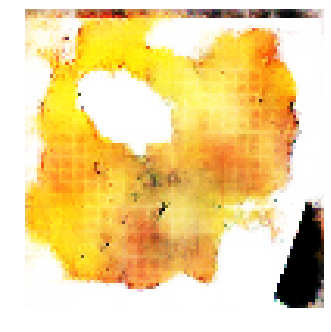


Epoch: 16280, D: -6.691, G: 3.213
Epoch: 16281, D: -4.907, G: 3.549
Epoch: 16282, D: -6.908, G: 3.665
Epoch: 16283, D: -6.149, G: 5.138
Epoch: 16284, D: -4.804, G: 3.118
Epoch: 16285, D: -6.907, G: 3.006
Epoch: 16286, D: -6.23, G: 5.723
Epoch: 16287, D: -5.426, G: 2.189
Epoch: 16288, D: -7.358, G: 3.11
Epoch: 16289, D: -6.279, G: 1.166
Epoch: 16290, D: -7.001, G: 3.707
Epoch: 16291, D: -6.32, G: 3.809
Epoch: 16292, D: -5.763, G: 5.91
Epoch: 16293, D: -6.793, G: 5.061
Epoch: 16294, D: -5.905, G: 3.831
Epoch: 16295, D: -6.387, G: 3.418
Epoch: 16296, D: -6.247, G: 2.244
Epoch: 16297, D: -5.895, G: 4.283
Epoch: 16298, D: -4.123, G: 1.63
Epoch: 16299, D: -5.483, G: 4.542


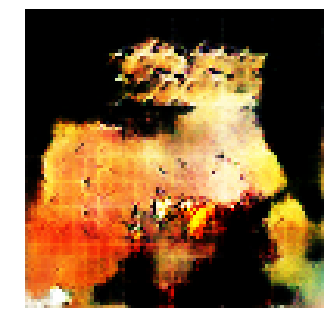


Epoch: 16300, D: -5.998, G: 4.8
Epoch: 16301, D: -6.005, G: 2.498
Epoch: 16302, D: -7.988, G: 1.667
Epoch: 16303, D: -4.934, G: 4.207
Epoch: 16304, D: -5.568, G: 2.004
Epoch: 16305, D: -6.2, G: 4.804
Epoch: 16306, D: -5.202, G: 2.226
Epoch: 16307, D: -5.953, G: 3.336
Epoch: 16308, D: -6.411, G: 5.935
Epoch: 16309, D: -6.492, G: 5.707
Epoch: 16310, D: -6.241, G: 0.2792
Epoch: 16311, D: -5.365, G: 4.675
Epoch: 16312, D: -5.322, G: 5.494
Epoch: 16313, D: -6.048, G: 3.858
Epoch: 16314, D: -7.16, G: 4.104
Epoch: 16315, D: -6.181, G: 2.259
Epoch: 16316, D: -4.952, G: 4.834
Epoch: 16317, D: -5.972, G: 5.572
Epoch: 16318, D: -5.575, G: 5.973
Epoch: 16319, D: -6.46, G: 3.724


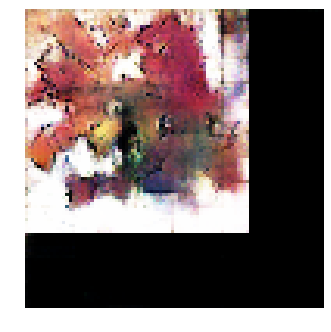


Epoch: 16320, D: -7.24, G: 1.96
Epoch: 16321, D: -5.183, G: 4.09
Epoch: 16322, D: -5.567, G: 4.885
Epoch: 16323, D: -6.184, G: 5.108
Epoch: 16324, D: -6.77, G: 4.587
Epoch: 16325, D: -5.0, G: 2.452
Epoch: 16326, D: -5.978, G: 2.394
Epoch: 16327, D: -6.052, G: 2.354
Epoch: 16328, D: -6.012, G: 2.459
Epoch: 16329, D: -5.224, G: 4.222
Epoch: 16330, D: -6.657, G: 3.524
Epoch: 16331, D: -5.414, G: 4.374
Epoch: 16332, D: -6.309, G: 2.227
Epoch: 16333, D: -4.961, G: 3.175
Epoch: 16334, D: -4.259, G: 4.803
Epoch: 16335, D: -5.244, G: 2.031
Epoch: 16336, D: -6.371, G: 3.493
Epoch: 16337, D: -5.229, G: 3.442
Epoch: 16338, D: -6.867, G: 4.467
Epoch: 16339, D: -6.288, G: 2.123


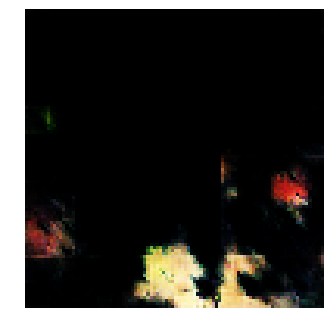


Epoch: 16340, D: -7.109, G: 1.961
Epoch: 16341, D: -5.201, G: 5.023
Epoch: 16342, D: -7.539, G: 5.309
Epoch: 16343, D: -8.058, G: 5.609
Epoch: 16344, D: -6.067, G: 6.765
Epoch: 16345, D: -6.74, G: 3.085
Epoch: 16346, D: -5.995, G: 3.024
Epoch: 16347, D: -6.578, G: 3.355
Epoch: 16348, D: -5.956, G: 2.358
Epoch: 16349, D: -6.501, G: 3.157
Epoch: 16350, D: -6.593, G: 3.413
Epoch: 16351, D: -5.196, G: 3.102
Epoch: 16352, D: -6.104, G: 3.339
Epoch: 16353, D: -5.92, G: 3.073
Epoch: 16354, D: -6.532, G: 5.18
Epoch: 16355, D: -5.894, G: 4.143
Epoch: 16356, D: -7.131, G: 4.218
Epoch: 16357, D: -6.255, G: 1.965
Epoch: 16358, D: -6.005, G: 3.422
Epoch: 16359, D: -7.185, G: 3.252


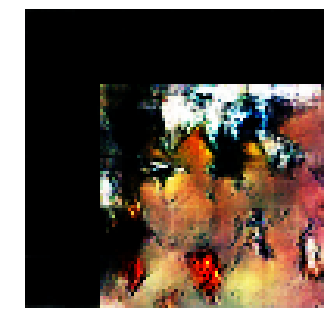


Epoch: 16360, D: -6.308, G: 0.1205
Epoch: 16361, D: -5.501, G: 7.428
Epoch: 16362, D: -5.946, G: 6.645
Epoch: 16363, D: -6.234, G: 5.44
Epoch: 16364, D: -6.152, G: 4.655
Epoch: 16365, D: -6.703, G: 2.896
Epoch: 16366, D: -4.944, G: 1.8
Epoch: 16367, D: -6.221, G: 4.811
Epoch: 16368, D: -6.548, G: 5.092
Epoch: 16369, D: -7.103, G: 3.233
Epoch: 16370, D: -5.815, G: 5.807
Epoch: 16371, D: -5.922, G: 2.487
Epoch: 16372, D: -6.484, G: 3.583
Epoch: 16373, D: -5.858, G: 5.064
Epoch: 16374, D: -6.895, G: 3.397
Epoch: 16375, D: -4.315, G: 3.009
Epoch: 16376, D: -5.823, G: 3.165
Epoch: 16377, D: -6.071, G: 2.772
Epoch: 16378, D: -6.408, G: 2.192
Epoch: 16379, D: -6.207, G: 4.309


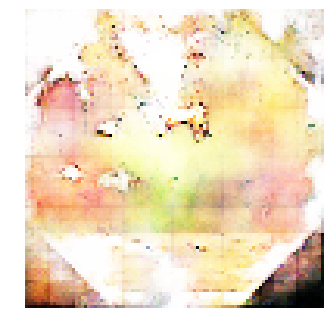


Epoch: 16380, D: -4.927, G: 2.313
Epoch: 16381, D: -5.736, G: 3.274
Epoch: 16382, D: -6.093, G: 4.303
Epoch: 16383, D: -6.964, G: 6.235
Epoch: 16384, D: -4.551, G: 2.273
Epoch: 16385, D: -5.985, G: 4.388
Epoch: 16386, D: -7.232, G: 8.083
Epoch: 16387, D: -5.376, G: 2.491
Epoch: 16388, D: -5.392, G: 5.04
Epoch: 16389, D: -5.616, G: 1.713
Epoch: 16390, D: -7.226, G: 0.3534
Epoch: 16391, D: -5.077, G: 3.221
Epoch: 16392, D: -7.416, G: 3.644
Epoch: 16393, D: -6.07, G: 4.406
Epoch: 16394, D: -5.602, G: 2.468
Epoch: 16395, D: -5.519, G: 6.946
Epoch: 16396, D: -5.801, G: 2.901
Epoch: 16397, D: -7.233, G: 3.84
Epoch: 16398, D: -5.278, G: 6.279
Epoch: 16399, D: -6.914, G: 4.397


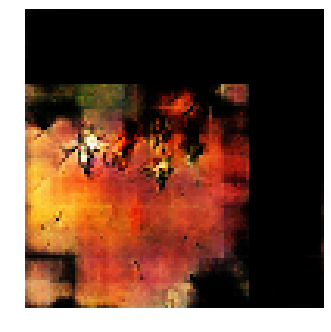


Epoch: 16400, D: -5.565, G: 3.777
Epoch: 16401, D: -4.052, G: 4.371
Epoch: 16402, D: -6.413, G: 4.527
Epoch: 16403, D: -6.852, G: 2.542
Epoch: 16404, D: -6.097, G: 3.925
Epoch: 16405, D: -5.743, G: 1.603
Epoch: 16406, D: -5.764, G: 3.696
Epoch: 16407, D: -5.814, G: 2.124
Epoch: 16408, D: -6.391, G: 1.262
Epoch: 16409, D: -5.524, G: 1.836
Epoch: 16410, D: -6.033, G: 2.828
Epoch: 16411, D: -7.273, G: 4.329
Epoch: 16412, D: -7.109, G: 1.228
Epoch: 16413, D: -6.754, G: 2.551
Epoch: 16414, D: -5.697, G: 3.835
Epoch: 16415, D: -5.507, G: 3.987
Epoch: 16416, D: -6.297, G: 3.807
Epoch: 16417, D: -6.762, G: 3.738
Epoch: 16418, D: -5.902, G: 3.394
Epoch: 16419, D: -6.895, G: 3.874


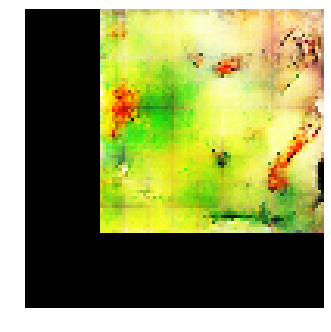


Epoch: 16420, D: -6.396, G: 3.075
Epoch: 16421, D: -5.865, G: 3.934
Epoch: 16422, D: -7.847, G: 1.081
Epoch: 16423, D: -7.219, G: 2.024
Epoch: 16424, D: -5.518, G: 4.315
Epoch: 16425, D: -5.892, G: 3.559
Epoch: 16426, D: -5.186, G: 2.085
Epoch: 16427, D: -6.165, G: 3.253
Epoch: 16428, D: -5.403, G: 4.141
Epoch: 16429, D: -6.517, G: 6.673
Epoch: 16430, D: -5.412, G: 5.36
Epoch: 16431, D: -6.006, G: 4.723
Epoch: 16432, D: -5.056, G: 3.02
Epoch: 16433, D: -6.818, G: 3.017
Epoch: 16434, D: -6.4, G: 4.89
Epoch: 16435, D: -6.768, G: 3.277
Epoch: 16436, D: -5.21, G: 6.146
Epoch: 16437, D: -6.313, G: 3.945
Epoch: 16438, D: -5.368, G: 4.393
Epoch: 16439, D: -7.302, G: 4.615


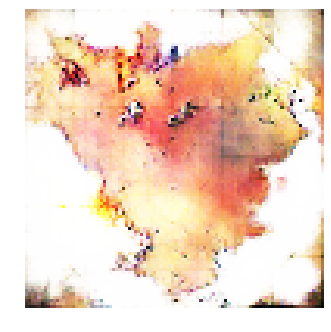


Epoch: 16440, D: -6.406, G: 4.465
Epoch: 16441, D: -5.651, G: 4.112
Epoch: 16442, D: -7.048, G: 2.803
Epoch: 16443, D: -6.368, G: 5.207
Epoch: 16444, D: -4.978, G: 4.341
Epoch: 16445, D: -5.522, G: 2.422
Epoch: 16446, D: -5.017, G: 2.553
Epoch: 16447, D: -7.568, G: 2.765
Epoch: 16448, D: -5.972, G: 1.881
Epoch: 16449, D: -5.115, G: 3.063
Epoch: 16450, D: -5.57, G: 4.225
Epoch: 16451, D: -5.847, G: 5.504
Epoch: 16452, D: -6.09, G: 2.218
Epoch: 16453, D: -5.363, G: 1.223
Epoch: 16454, D: -6.156, G: 1.051
Epoch: 16455, D: -5.231, G: 2.36
Epoch: 16456, D: -5.368, G: 1.03
Epoch: 16457, D: -5.958, G: 2.281
Epoch: 16458, D: -6.214, G: 3.543
Epoch: 16459, D: -4.278, G: 1.708


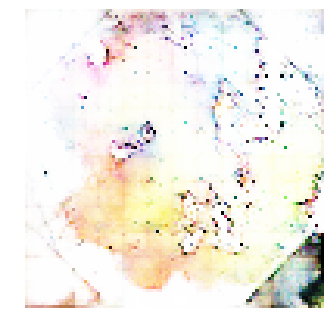


Epoch: 16460, D: -4.308, G: 3.188
Epoch: 16461, D: -6.653, G: 4.371
Epoch: 16462, D: -6.153, G: 3.522
Epoch: 16463, D: -5.71, G: 3.47
Epoch: 16464, D: -5.63, G: 3.312
Epoch: 16465, D: -5.229, G: 4.286
Epoch: 16466, D: -5.825, G: 3.882
Epoch: 16467, D: -6.884, G: 4.03
Epoch: 16468, D: -5.06, G: 1.954
Epoch: 16469, D: -7.281, G: 3.169
Epoch: 16470, D: -6.822, G: 3.484
Epoch: 16471, D: -6.82, G: 3.212
Epoch: 16472, D: -6.072, G: 3.212
Epoch: 16473, D: -5.956, G: 2.634
Epoch: 16474, D: -6.909, G: 1.759
Epoch: 16475, D: -5.913, G: 3.738
Epoch: 16476, D: -4.775, G: 4.844
Epoch: 16477, D: -5.012, G: 2.505
Epoch: 16478, D: -6.451, G: 3.987
Epoch: 16479, D: -4.854, G: 3.711


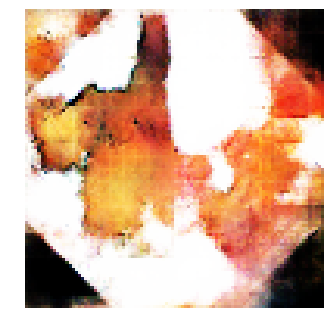


Epoch: 16480, D: -5.614, G: 1.083
Epoch: 16481, D: -5.935, G: 5.35
Epoch: 16482, D: -5.381, G: 2.543
Epoch: 16483, D: -5.392, G: 4.542
Epoch: 16484, D: -5.665, G: 3.646
Epoch: 16485, D: -5.305, G: 3.525
Epoch: 16486, D: -4.856, G: 3.429
Epoch: 16487, D: -5.26, G: 4.693
Epoch: 16488, D: -5.875, G: 4.2
Epoch: 16489, D: -5.549, G: 2.501
Epoch: 16490, D: -5.444, G: 3.54
Epoch: 16491, D: -5.985, G: 3.719
Epoch: 16492, D: -5.794, G: 2.888
Epoch: 16493, D: -5.986, G: 5.642
Epoch: 16494, D: -4.929, G: 3.991
Epoch: 16495, D: -4.977, G: 4.498
Epoch: 16496, D: -6.036, G: 3.986
Epoch: 16497, D: -4.749, G: 3.115
Epoch: 16498, D: -5.905, G: 3.407
Epoch: 16499, D: -4.684, G: 4.713


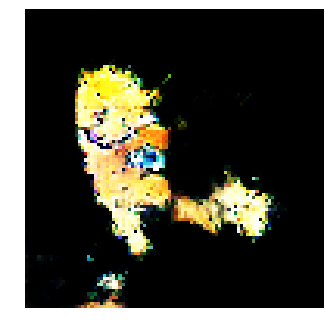


Epoch: 16500, D: -6.207, G: 2.251
Epoch: 16501, D: -6.342, G: 5.057
Epoch: 16502, D: -5.354, G: 3.114
Epoch: 16503, D: -5.699, G: 4.312
Epoch: 16504, D: -5.93, G: 2.317
Epoch: 16505, D: -6.283, G: 1.674
Epoch: 16506, D: -5.145, G: 4.034
Epoch: 16507, D: -5.684, G: 4.371
Epoch: 16508, D: -5.577, G: 4.555
Epoch: 16509, D: -5.66, G: 3.137
Epoch: 16510, D: -5.644, G: 5.149
Epoch: 16511, D: -5.889, G: 3.503
Epoch: 16512, D: -4.612, G: 4.338
Epoch: 16513, D: -5.344, G: 5.058
Epoch: 16514, D: -6.901, G: 2.247
Epoch: 16515, D: -6.475, G: 6.019
Epoch: 16516, D: -4.721, G: 2.875
Epoch: 16517, D: -6.943, G: 4.844
Epoch: 16518, D: -5.668, G: 5.021
Epoch: 16519, D: -7.251, G: 2.195


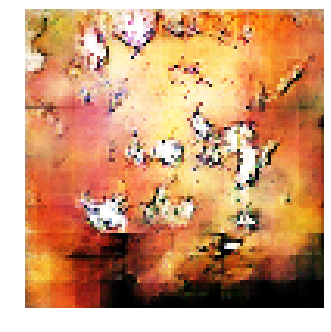


Epoch: 16520, D: -6.116, G: 2.37
Epoch: 16521, D: -6.93, G: 0.5896
Epoch: 16522, D: -6.011, G: 2.535
Epoch: 16523, D: -6.978, G: 4.655
Epoch: 16524, D: -5.892, G: 5.484
Epoch: 16525, D: -5.641, G: 1.884
Epoch: 16526, D: -6.221, G: 5.296
Epoch: 16527, D: -6.844, G: 2.076
Epoch: 16528, D: -5.465, G: 3.164
Epoch: 16529, D: -7.742, G: 3.536
Epoch: 16530, D: -4.944, G: 1.958
Epoch: 16531, D: -5.324, G: 4.083
Epoch: 16532, D: -6.851, G: 2.729
Epoch: 16533, D: -7.012, G: 2.103
Epoch: 16534, D: -5.896, G: -0.3704
Epoch: 16535, D: -6.401, G: 3.924
Epoch: 16536, D: -6.473, G: 2.983
Epoch: 16537, D: -5.73, G: 3.078
Epoch: 16538, D: -5.87, G: 4.057
Epoch: 16539, D: -7.758, G: 4.387


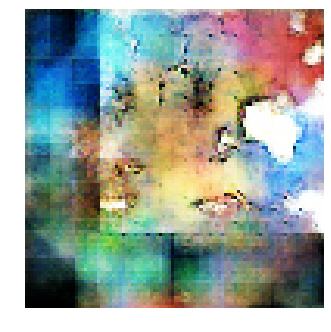


Epoch: 16540, D: -6.111, G: 3.903
Epoch: 16541, D: -6.768, G: 2.7
Epoch: 16542, D: -5.215, G: 3.346
Epoch: 16543, D: -5.545, G: 4.024
Epoch: 16544, D: -6.011, G: 3.451
Epoch: 16545, D: -5.082, G: 4.495
Epoch: 16546, D: -5.913, G: 3.628
Epoch: 16547, D: -6.104, G: 4.944
Epoch: 16548, D: -5.397, G: 4.082
Epoch: 16549, D: -5.719, G: 3.056
Epoch: 16550, D: -4.715, G: 2.242
Epoch: 16551, D: -7.048, G: 3.567
Epoch: 16552, D: -5.347, G: 1.881
Epoch: 16553, D: -6.486, G: 3.299
Epoch: 16554, D: -5.889, G: 2.592
Epoch: 16555, D: -5.882, G: 2.292
Epoch: 16556, D: -5.417, G: 3.581
Epoch: 16557, D: -5.44, G: 4.199
Epoch: 16558, D: -5.809, G: 4.136
Epoch: 16559, D: -5.53, G: 4.425


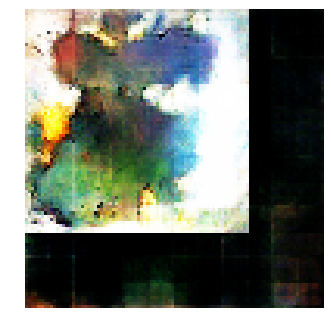


Epoch: 16560, D: -7.311, G: 3.728
Epoch: 16561, D: -6.06, G: 5.157
Epoch: 16562, D: -5.616, G: 4.257
Epoch: 16563, D: -5.252, G: 4.047
Epoch: 16564, D: -6.017, G: 4.548
Epoch: 16565, D: -5.352, G: 2.304
Epoch: 16566, D: -6.644, G: 4.656
Epoch: 16567, D: -6.089, G: 1.604
Epoch: 16568, D: -6.169, G: 4.379
Epoch: 16569, D: -6.343, G: 3.818
Epoch: 16570, D: -5.571, G: 3.506
Epoch: 16571, D: -6.83, G: 3.635
Epoch: 16572, D: -5.324, G: 2.886
Epoch: 16573, D: -6.921, G: 3.655
Epoch: 16574, D: -5.095, G: 2.503
Epoch: 16575, D: -5.71, G: 3.735
Epoch: 16576, D: -6.197, G: 2.676
Epoch: 16577, D: -6.599, G: 1.61
Epoch: 16578, D: -6.069, G: 2.379
Epoch: 16579, D: -5.701, G: 4.445


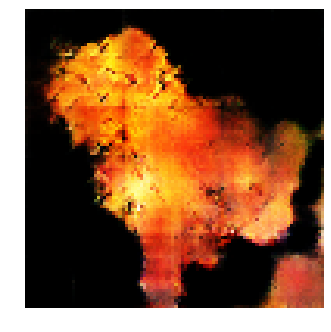


Epoch: 16580, D: -4.603, G: 2.879
Epoch: 16581, D: -5.258, G: 3.235
Epoch: 16582, D: -5.634, G: 4.961
Epoch: 16583, D: -4.867, G: 3.772
Epoch: 16584, D: -5.187, G: 2.384
Epoch: 16585, D: -6.938, G: 1.184
Epoch: 16586, D: -4.787, G: 2.174
Epoch: 16587, D: -6.051, G: 4.611
Epoch: 16588, D: -5.754, G: 4.973
Epoch: 16589, D: -6.197, G: 4.176
Epoch: 16590, D: -5.545, G: 4.521
Epoch: 16591, D: -5.765, G: 2.563
Epoch: 16592, D: -7.499, G: 5.024
Epoch: 16593, D: -5.95, G: 3.49
Epoch: 16594, D: -5.075, G: 1.189
Epoch: 16595, D: -5.615, G: 5.102
Epoch: 16596, D: -4.897, G: 3.131
Epoch: 16597, D: -5.782, G: 7.2
Epoch: 16598, D: -5.992, G: 5.129
Epoch: 16599, D: -6.172, G: 4.863


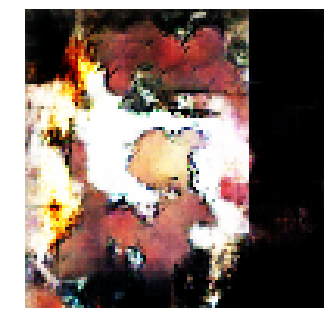


Epoch: 16600, D: -6.793, G: 5.771
Epoch: 16601, D: -7.148, G: 4.915
Epoch: 16602, D: -5.934, G: 7.269
Epoch: 16603, D: -6.068, G: 5.053
Epoch: 16604, D: -6.869, G: 3.099
Epoch: 16605, D: -6.083, G: 4.794
Epoch: 16606, D: -7.153, G: 2.428
Epoch: 16607, D: -6.845, G: 5.164
Epoch: 16608, D: -6.379, G: 2.65
Epoch: 16609, D: -5.125, G: 3.707
Epoch: 16610, D: -5.747, G: 2.802
Epoch: 16611, D: -5.879, G: 4.726
Epoch: 16612, D: -6.054, G: 3.675
Epoch: 16613, D: -5.755, G: 1.992
Epoch: 16614, D: -5.599, G: 4.186
Epoch: 16615, D: -6.684, G: 2.69
Epoch: 16616, D: -5.499, G: 4.465
Epoch: 16617, D: -6.478, G: 3.295
Epoch: 16618, D: -7.333, G: 3.474
Epoch: 16619, D: -6.021, G: 2.736


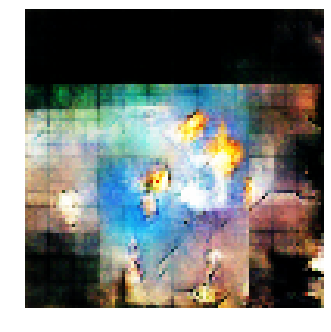


Epoch: 16620, D: -6.295, G: 4.608
Epoch: 16621, D: -5.295, G: 2.213
Epoch: 16622, D: -6.223, G: 3.591
Epoch: 16623, D: -6.027, G: 4.015
Epoch: 16624, D: -6.59, G: 3.508
Epoch: 16625, D: -5.165, G: 3.789
Epoch: 16626, D: -6.2, G: 2.936
Epoch: 16627, D: -6.797, G: 4.022
Epoch: 16628, D: -4.647, G: 3.353
Epoch: 16629, D: -5.13, G: 3.967
Epoch: 16630, D: -4.682, G: 1.943
Epoch: 16631, D: -6.678, G: 3.536
Epoch: 16632, D: -5.601, G: 2.489
Epoch: 16633, D: -5.776, G: 5.11
Epoch: 16634, D: -6.164, G: 2.944
Epoch: 16635, D: -5.812, G: 3.406
Epoch: 16636, D: -4.817, G: 1.88
Epoch: 16637, D: -7.002, G: 2.459
Epoch: 16638, D: -6.508, G: 6.479
Epoch: 16639, D: -7.882, G: 3.798


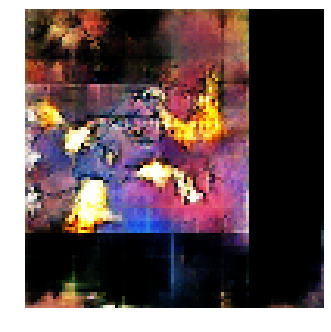


Epoch: 16640, D: -5.357, G: 4.001
Epoch: 16641, D: -5.193, G: 5.382
Epoch: 16642, D: -5.892, G: 2.815
Epoch: 16643, D: -5.071, G: 4.949
Epoch: 16644, D: -5.66, G: 5.972
Epoch: 16645, D: -5.852, G: 3.688
Epoch: 16646, D: -5.597, G: 2.094
Epoch: 16647, D: -6.283, G: 4.482
Epoch: 16648, D: -7.274, G: 3.248
Epoch: 16649, D: -6.443, G: 3.739
Epoch: 16650, D: -5.246, G: 4.135
Epoch: 16651, D: -5.665, G: 2.433
Epoch: 16652, D: -6.095, G: 3.951
Epoch: 16653, D: -5.328, G: 4.216
Epoch: 16654, D: -5.694, G: 3.145
Epoch: 16655, D: -4.921, G: 2.342
Epoch: 16656, D: -5.86, G: 3.698
Epoch: 16657, D: -6.482, G: 4.517
Epoch: 16658, D: -5.908, G: 4.006
Epoch: 16659, D: -6.481, G: 4.214


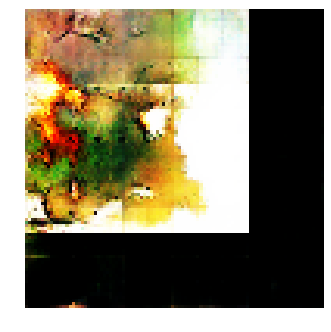


Epoch: 16660, D: -6.22, G: 4.633
Epoch: 16661, D: -5.072, G: 2.624
Epoch: 16662, D: -5.683, G: 4.347
Epoch: 16663, D: -5.765, G: 3.914
Epoch: 16664, D: -6.483, G: 4.206
Epoch: 16665, D: -6.467, G: 3.467
Epoch: 16666, D: -5.481, G: 5.227
Epoch: 16667, D: -5.698, G: 7.085
Epoch: 16668, D: -4.791, G: 3.435
Epoch: 16669, D: -5.024, G: 3.72
Epoch: 16670, D: -5.695, G: 2.69
Epoch: 16671, D: -6.031, G: 5.13
Epoch: 16672, D: -7.669, G: 4.622
Epoch: 16673, D: -6.694, G: 3.801
Epoch: 16674, D: -5.795, G: 4.098
Epoch: 16675, D: -7.454, G: 3.413
Epoch: 16676, D: -5.64, G: 3.551
Epoch: 16677, D: -6.572, G: 6.724
Epoch: 16678, D: -6.227, G: 6.064
Epoch: 16679, D: -4.927, G: 3.69


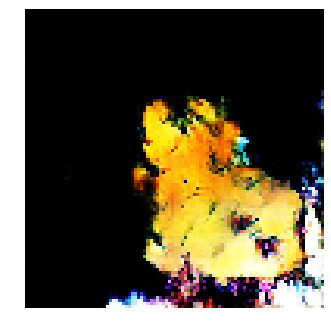


Epoch: 16680, D: -5.592, G: 3.677
Epoch: 16681, D: -5.232, G: 3.864
Epoch: 16682, D: -7.173, G: 4.805
Epoch: 16683, D: -5.648, G: 2.603
Epoch: 16684, D: -5.121, G: 4.346
Epoch: 16685, D: -5.138, G: 3.203
Epoch: 16686, D: -6.168, G: 2.427
Epoch: 16687, D: -6.456, G: 2.346
Epoch: 16688, D: -5.341, G: 0.005937
Epoch: 16689, D: -5.178, G: 4.07
Epoch: 16690, D: -5.44, G: 4.253
Epoch: 16691, D: -5.966, G: 3.858
Epoch: 16692, D: -6.301, G: 4.28
Epoch: 16693, D: -6.926, G: 3.294
Epoch: 16694, D: -6.147, G: 3.216
Epoch: 16695, D: -5.874, G: 7.044
Epoch: 16696, D: -5.79, G: 3.56
Epoch: 16697, D: -5.02, G: 4.104
Epoch: 16698, D: -6.812, G: 5.46
Epoch: 16699, D: -6.575, G: 4.666


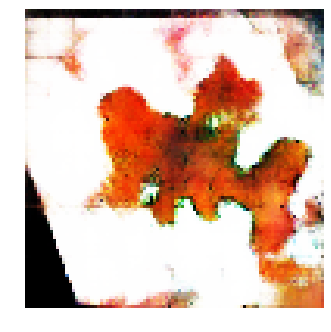


Epoch: 16700, D: -7.833, G: 0.475
Epoch: 16701, D: -5.694, G: 3.074
Epoch: 16702, D: -5.623, G: 4.096
Epoch: 16703, D: -5.868, G: 4.079
Epoch: 16704, D: -6.66, G: 2.932
Epoch: 16705, D: -6.643, G: 3.05
Epoch: 16706, D: -7.152, G: 3.888
Epoch: 16707, D: -6.661, G: 3.369
Epoch: 16708, D: -5.157, G: 3.304
Epoch: 16709, D: -5.966, G: 3.742
Epoch: 16710, D: -5.104, G: 4.876
Epoch: 16711, D: -5.972, G: 3.957
Epoch: 16712, D: -6.523, G: 0.1561
Epoch: 16713, D: -4.631, G: 3.479
Epoch: 16714, D: -6.296, G: 4.725
Epoch: 16715, D: -5.744, G: 4.301
Epoch: 16716, D: -6.502, G: 2.442
Epoch: 16717, D: -5.677, G: 3.243
Epoch: 16718, D: -6.461, G: 2.321
Epoch: 16719, D: -5.254, G: 2.155


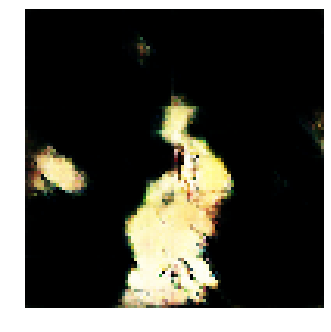


Epoch: 16720, D: -4.732, G: 4.526
Epoch: 16721, D: -5.825, G: 1.787
Epoch: 16722, D: -6.206, G: 4.14
Epoch: 16723, D: -4.648, G: 4.513
Epoch: 16724, D: -5.37, G: 3.832
Epoch: 16725, D: -7.142, G: 6.218
Epoch: 16726, D: -5.623, G: 4.478
Epoch: 16727, D: -5.556, G: 4.41
Epoch: 16728, D: -5.913, G: 2.411
Epoch: 16729, D: -6.151, G: 2.177
Epoch: 16730, D: -6.488, G: 3.503
Epoch: 16731, D: -6.709, G: 2.349
Epoch: 16732, D: -5.208, G: 1.333
Epoch: 16733, D: -7.195, G: 3.485
Epoch: 16734, D: -6.153, G: 3.834
Epoch: 16735, D: -6.063, G: 1.156
Epoch: 16736, D: -6.633, G: 2.476
Epoch: 16737, D: -5.976, G: 2.955
Epoch: 16738, D: -5.101, G: 2.648
Epoch: 16739, D: -4.556, G: 3.957


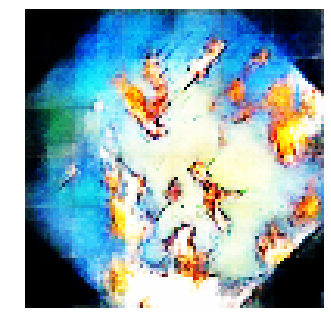


Epoch: 16740, D: -6.129, G: 1.315
Epoch: 16741, D: -7.169, G: 1.886
Epoch: 16742, D: -5.215, G: 3.881
Epoch: 16743, D: -5.789, G: 2.253
Epoch: 16744, D: -5.994, G: 3.452
Epoch: 16745, D: -4.988, G: 3.619
Epoch: 16746, D: -5.387, G: 5.357
Epoch: 16747, D: -6.076, G: 3.068
Epoch: 16748, D: -5.56, G: 3.29
Epoch: 16749, D: -5.251, G: 2.861
Epoch: 16750, D: -5.072, G: 3.432
Epoch: 16751, D: -5.513, G: 4.987
Epoch: 16752, D: -6.262, G: 4.561
Epoch: 16753, D: -6.67, G: 1.995
Epoch: 16754, D: -4.554, G: 2.23
Epoch: 16755, D: -6.108, G: 3.909
Epoch: 16756, D: -5.45, G: 2.432
Epoch: 16757, D: -6.016, G: 4.239
Epoch: 16758, D: -5.783, G: 3.934
Epoch: 16759, D: -6.677, G: 5.492


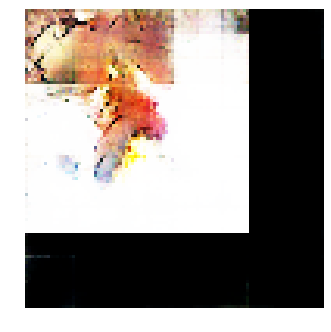


Epoch: 16760, D: -6.481, G: 2.511
Epoch: 16761, D: -5.696, G: 3.573
Epoch: 16762, D: -5.481, G: 4.555
Epoch: 16763, D: -6.856, G: 4.898
Epoch: 16764, D: -5.926, G: 7.316
Epoch: 16765, D: -6.954, G: 5.081
Epoch: 16766, D: -5.949, G: 6.867
Epoch: 16767, D: -5.242, G: 2.492
Epoch: 16768, D: -6.158, G: 4.4
Epoch: 16769, D: -5.909, G: 6.693
Epoch: 16770, D: -4.838, G: 4.276
Epoch: 16771, D: -6.149, G: 3.687
Epoch: 16772, D: -4.515, G: 3.161
Epoch: 16773, D: -6.429, G: 4.573
Epoch: 16774, D: -5.301, G: 4.11
Epoch: 16775, D: -6.305, G: 1.633
Epoch: 16776, D: -5.488, G: 3.467
Epoch: 16777, D: -6.146, G: 3.156
Epoch: 16778, D: -4.866, G: 4.079
Epoch: 16779, D: -6.106, G: 4.536


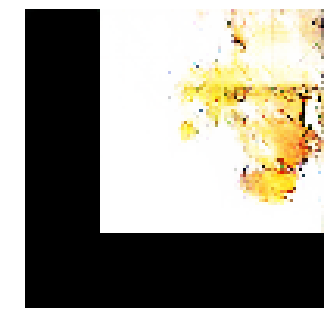


Epoch: 16780, D: -6.38, G: 1.238
Epoch: 16781, D: -4.967, G: 4.307
Epoch: 16782, D: -5.657, G: 4.213
Epoch: 16783, D: -6.872, G: 2.532
Epoch: 16784, D: -6.886, G: 5.639
Epoch: 16785, D: -4.847, G: 4.074
Epoch: 16786, D: -6.133, G: 3.384
Epoch: 16787, D: -6.403, G: 2.713
Epoch: 16788, D: -5.839, G: 5.801
Epoch: 16789, D: -5.841, G: 1.714
Epoch: 16790, D: -6.062, G: 3.399
Epoch: 16791, D: -6.947, G: 2.851
Epoch: 16792, D: -5.827, G: 1.487
Epoch: 16793, D: -6.523, G: 4.038
Epoch: 16794, D: -5.288, G: 2.515
Epoch: 16795, D: -6.523, G: 5.755
Epoch: 16796, D: -6.525, G: 5.096
Epoch: 16797, D: -4.985, G: 5.008
Epoch: 16798, D: -6.846, G: 4.791
Epoch: 16799, D: -6.451, G: 5.587


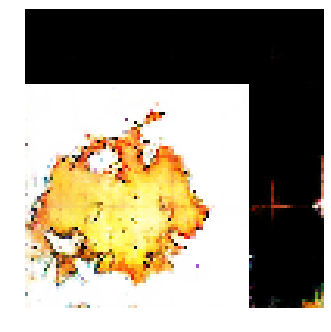


Epoch: 16800, D: -4.987, G: 4.171
Epoch: 16801, D: -6.041, G: 2.52
Epoch: 16802, D: -6.432, G: 3.03
Epoch: 16803, D: -5.719, G: 3.901
Epoch: 16804, D: -6.533, G: 2.763
Epoch: 16805, D: -5.499, G: 3.646
Epoch: 16806, D: -4.771, G: 1.895
Epoch: 16807, D: -5.805, G: 3.78
Epoch: 16808, D: -6.727, G: 5.543
Epoch: 16809, D: -5.2, G: 5.704
Epoch: 16810, D: -5.916, G: 4.365
Epoch: 16811, D: -6.56, G: 4.65
Epoch: 16812, D: -6.29, G: 2.588
Epoch: 16813, D: -5.986, G: 4.309
Epoch: 16814, D: -5.954, G: 4.366
Epoch: 16815, D: -5.487, G: 0.6797
Epoch: 16816, D: -6.621, G: 3.998
Epoch: 16817, D: -4.858, G: 4.06
Epoch: 16818, D: -5.732, G: 3.519
Epoch: 16819, D: -6.725, G: 2.862


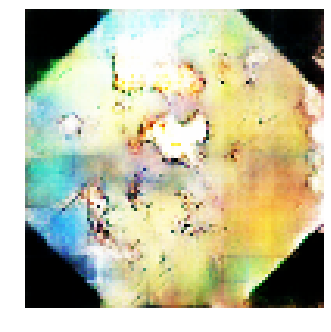


Epoch: 16820, D: -7.564, G: 3.67
Epoch: 16821, D: -5.948, G: 2.743
Epoch: 16822, D: -7.383, G: 4.665
Epoch: 16823, D: -7.549, G: 2.713
Epoch: 16824, D: -5.904, G: 3.991
Epoch: 16825, D: -5.904, G: 1.895
Epoch: 16826, D: -4.813, G: 3.987
Epoch: 16827, D: -5.924, G: 4.806
Epoch: 16828, D: -5.704, G: 2.466
Epoch: 16829, D: -6.706, G: 3.158
Epoch: 16830, D: -5.51, G: 4.454
Epoch: 16831, D: -6.158, G: 5.389
Epoch: 16832, D: -6.671, G: 3.858
Epoch: 16833, D: -5.8, G: 4.45
Epoch: 16834, D: -6.473, G: 2.784
Epoch: 16835, D: -5.724, G: 4.999
Epoch: 16836, D: -5.867, G: 4.479
Epoch: 16837, D: -4.908, G: 3.851
Epoch: 16838, D: -5.75, G: 3.757
Epoch: 16839, D: -5.195, G: 3.344


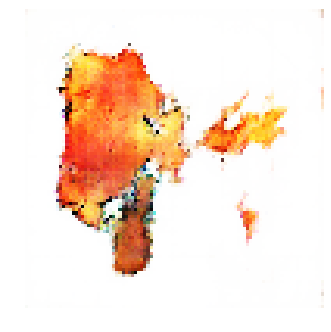


Epoch: 16840, D: -5.252, G: 5.343
Epoch: 16841, D: -6.039, G: 2.937
Epoch: 16842, D: -5.714, G: 3.44
Epoch: 16843, D: -6.16, G: 3.581
Epoch: 16844, D: -5.922, G: 1.268
Epoch: 16845, D: -5.94, G: 2.444
Epoch: 16846, D: -6.721, G: 2.376
Epoch: 16847, D: -6.118, G: 3.154
Epoch: 16848, D: -6.724, G: 1.384
Epoch: 16849, D: -5.962, G: 6.906
Epoch: 16850, D: -6.355, G: 4.416
Epoch: 16851, D: -6.251, G: 2.808
Epoch: 16852, D: -4.929, G: 3.764
Epoch: 16853, D: -5.415, G: 2.472
Epoch: 16854, D: -5.632, G: 1.997
Epoch: 16855, D: -6.69, G: 3.282
Epoch: 16856, D: -7.064, G: 3.107
Epoch: 16857, D: -6.485, G: 2.93
Epoch: 16858, D: -5.151, G: 6.273
Epoch: 16859, D: -5.25, G: 2.586


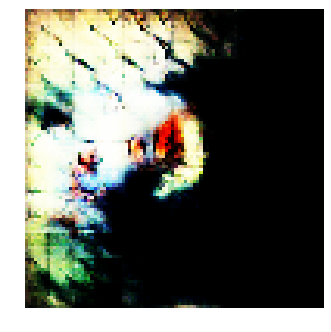


Epoch: 16860, D: -5.445, G: 1.83
Epoch: 16861, D: -5.706, G: 3.377
Epoch: 16862, D: -4.508, G: 2.719
Epoch: 16863, D: -5.793, G: 5.217
Epoch: 16864, D: -5.698, G: 2.788
Epoch: 16865, D: -5.966, G: 2.71
Epoch: 16866, D: -5.826, G: 5.102
Epoch: 16867, D: -5.757, G: 5.038
Epoch: 16868, D: -6.84, G: 3.251
Epoch: 16869, D: -5.215, G: 1.442
Epoch: 16870, D: -4.764, G: 3.148
Epoch: 16871, D: -4.784, G: 2.039
Epoch: 16872, D: -6.871, G: 3.358
Epoch: 16873, D: -6.092, G: 4.537
Epoch: 16874, D: -5.576, G: 5.614
Epoch: 16875, D: -5.796, G: 4.675
Epoch: 16876, D: -4.703, G: 5.467
Epoch: 16877, D: -6.926, G: 1.249
Epoch: 16878, D: -6.562, G: 5.035
Epoch: 16879, D: -6.133, G: 3.788


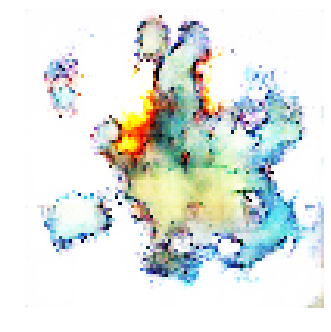


Epoch: 16880, D: -5.743, G: 1.672
Epoch: 16881, D: -6.123, G: 3.14
Epoch: 16882, D: -6.555, G: 2.319
Epoch: 16883, D: -6.378, G: 3.772
Epoch: 16884, D: -5.293, G: 3.724
Epoch: 16885, D: -5.878, G: 4.417
Epoch: 16886, D: -6.557, G: 1.876
Epoch: 16887, D: -6.828, G: 6.095
Epoch: 16888, D: -6.155, G: 3.327
Epoch: 16889, D: -6.149, G: 4.174
Epoch: 16890, D: -7.502, G: 3.091
Epoch: 16891, D: -6.229, G: 4.376
Epoch: 16892, D: -5.989, G: 3.629
Epoch: 16893, D: -6.024, G: 4.156
Epoch: 16894, D: -7.011, G: 4.947
Epoch: 16895, D: -6.671, G: 2.691
Epoch: 16896, D: -6.055, G: 2.807
Epoch: 16897, D: -6.836, G: 4.078
Epoch: 16898, D: -4.94, G: 6.066
Epoch: 16899, D: -6.646, G: 1.424


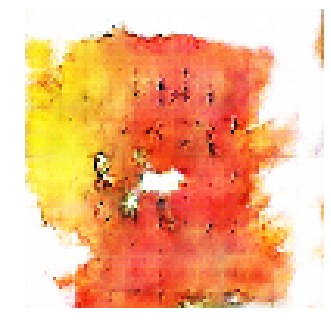


Epoch: 16900, D: -5.372, G: 4.854
Epoch: 16901, D: -5.163, G: 3.6
Epoch: 16902, D: -6.191, G: 2.62
Epoch: 16903, D: -4.666, G: 3.476
Epoch: 16904, D: -5.853, G: 3.885
Epoch: 16905, D: -6.403, G: 4.396
Epoch: 16906, D: -5.075, G: 3.128
Epoch: 16907, D: -7.548, G: 4.461
Epoch: 16908, D: -6.331, G: 4.849
Epoch: 16909, D: -6.454, G: 2.493
Epoch: 16910, D: -6.435, G: 4.498
Epoch: 16911, D: -6.06, G: 2.832
Epoch: 16912, D: -5.679, G: 1.495
Epoch: 16913, D: -6.845, G: 2.528
Epoch: 16914, D: -6.38, G: 3.545
Epoch: 16915, D: -5.075, G: 4.0
Epoch: 16916, D: -5.812, G: 3.991
Epoch: 16917, D: -6.467, G: 5.042
Epoch: 16918, D: -7.327, G: 3.999
Epoch: 16919, D: -5.557, G: 2.315


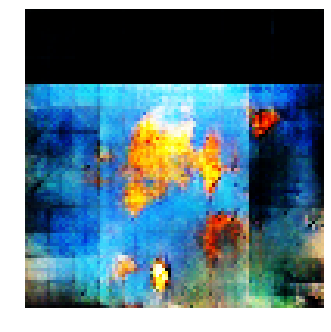


Epoch: 16920, D: -7.509, G: 3.763
Epoch: 16921, D: -5.72, G: 4.465
Epoch: 16922, D: -6.791, G: 4.074
Epoch: 16923, D: -6.696, G: 3.696
Epoch: 16924, D: -6.196, G: 3.807
Epoch: 16925, D: -6.27, G: 5.266
Epoch: 16926, D: -6.904, G: 2.565
Epoch: 16927, D: -6.314, G: 2.5
Epoch: 16928, D: -8.925, G: 1.574
Epoch: 16929, D: -5.72, G: 4.108
Epoch: 16930, D: -4.576, G: 1.712
Epoch: 16931, D: -5.978, G: 3.105
Epoch: 16932, D: -5.1, G: 5.463
Epoch: 16933, D: -5.445, G: 2.086
Epoch: 16934, D: -5.766, G: 3.112
Epoch: 16935, D: -6.328, G: 0.2872
Epoch: 16936, D: -5.716, G: 2.877
Epoch: 16937, D: -5.81, G: 3.723
Epoch: 16938, D: -5.649, G: 0.3337
Epoch: 16939, D: -5.134, G: 3.204


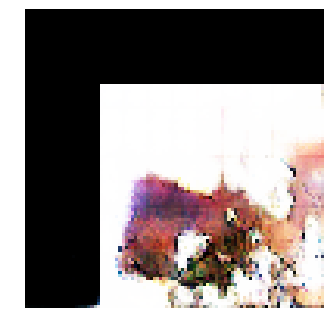


Epoch: 16940, D: -7.19, G: 2.724
Epoch: 16941, D: -6.418, G: 2.759
Epoch: 16942, D: -5.619, G: 3.364
Epoch: 16943, D: -5.022, G: 5.38
Epoch: 16944, D: -5.709, G: 4.584
Epoch: 16945, D: -6.76, G: 1.255
Epoch: 16946, D: -5.731, G: 2.486
Epoch: 16947, D: -5.189, G: 3.731
Epoch: 16948, D: -7.468, G: 2.087
Epoch: 16949, D: -5.992, G: 1.57
Epoch: 16950, D: -6.778, G: 4.178
Epoch: 16951, D: -5.43, G: 2.264
Epoch: 16952, D: -6.73, G: 4.849
Epoch: 16953, D: -6.452, G: 1.41
Epoch: 16954, D: -4.213, G: 3.058
Epoch: 16955, D: -5.167, G: 6.324
Epoch: 16956, D: -6.083, G: 2.675
Epoch: 16957, D: -5.521, G: 4.115
Epoch: 16958, D: -7.21, G: 4.753
Epoch: 16959, D: -5.915, G: 3.672


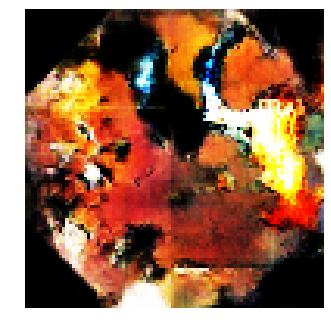


Epoch: 16960, D: -8.132, G: 4.333
Epoch: 16961, D: -5.514, G: 6.977
Epoch: 16962, D: -5.915, G: 1.216
Epoch: 16963, D: -4.481, G: 2.341
Epoch: 16964, D: -7.211, G: 3.985
Epoch: 16965, D: -6.796, G: 1.837
Epoch: 16966, D: -4.859, G: 1.95
Epoch: 16967, D: -5.91, G: 1.856
Epoch: 16968, D: -4.889, G: 2.482
Epoch: 16969, D: -6.024, G: 3.741
Epoch: 16970, D: -7.454, G: 3.778
Epoch: 16971, D: -6.003, G: 4.124
Epoch: 16972, D: -4.749, G: 5.097
Epoch: 16973, D: -4.853, G: 1.73
Epoch: 16974, D: -6.47, G: 3.2
Epoch: 16975, D: -7.152, G: 2.904
Epoch: 16976, D: -6.575, G: 7.118
Epoch: 16977, D: -6.174, G: 1.644
Epoch: 16978, D: -5.766, G: 5.453
Epoch: 16979, D: -6.21, G: 3.829


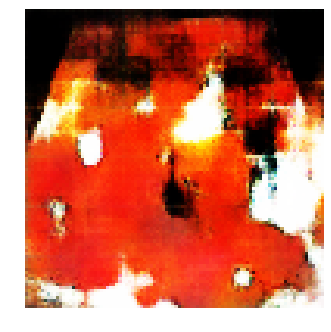


Epoch: 16980, D: -4.247, G: 3.359
Epoch: 16981, D: -5.688, G: 4.5
Epoch: 16982, D: -4.858, G: 4.001
Epoch: 16983, D: -7.181, G: 5.363
Epoch: 16984, D: -5.16, G: 1.379
Epoch: 16985, D: -5.77, G: 2.501
Epoch: 16986, D: -5.117, G: 2.199
Epoch: 16987, D: -6.163, G: 2.322
Epoch: 16988, D: -6.544, G: 2.968
Epoch: 16989, D: -7.585, G: 2.855
Epoch: 16990, D: -5.916, G: 0.105
Epoch: 16991, D: -7.09, G: 4.489
Epoch: 16992, D: -5.391, G: 0.6835
Epoch: 16993, D: -5.134, G: 4.243
Epoch: 16994, D: -5.137, G: 3.711
Epoch: 16995, D: -4.98, G: 5.46
Epoch: 16996, D: -6.538, G: 3.212
Epoch: 16997, D: -4.759, G: 4.212
Epoch: 16998, D: -6.618, G: 4.345
Epoch: 16999, D: -4.675, G: 3.02


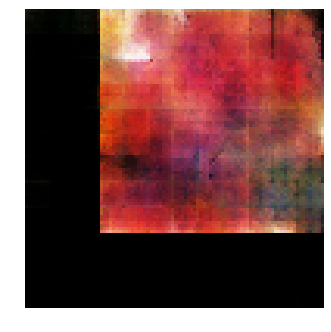


Epoch: 17000, D: -5.327, G: 5.184
Epoch: 17001, D: -6.831, G: 3.707
Epoch: 17002, D: -6.368, G: 3.121
Epoch: 17003, D: -7.131, G: 5.336
Epoch: 17004, D: -6.804, G: 1.487
Epoch: 17005, D: -6.454, G: 4.646
Epoch: 17006, D: -6.053, G: 3.275
Epoch: 17007, D: -5.825, G: 1.832
Epoch: 17008, D: -5.689, G: 3.857
Epoch: 17009, D: -5.327, G: 3.309
Epoch: 17010, D: -6.267, G: 2.305
Epoch: 17011, D: -5.34, G: 3.295
Epoch: 17012, D: -5.761, G: 2.894
Epoch: 17013, D: -5.645, G: 5.141
Epoch: 17014, D: -5.216, G: 4.039
Epoch: 17015, D: -6.449, G: 4.557
Epoch: 17016, D: -6.764, G: 4.359
Epoch: 17017, D: -6.577, G: 3.425
Epoch: 17018, D: -5.616, G: 3.289
Epoch: 17019, D: -5.768, G: 6.327


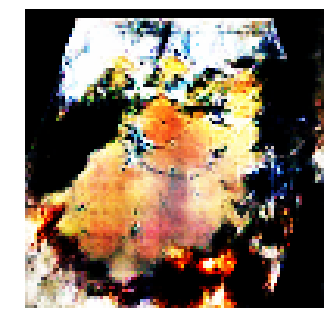


Epoch: 17020, D: -5.778, G: 3.962
Epoch: 17021, D: -5.992, G: 1.705
Epoch: 17022, D: -5.174, G: 4.603
Epoch: 17023, D: -6.201, G: 2.887
Epoch: 17024, D: -5.564, G: 2.444
Epoch: 17025, D: -6.319, G: 6.865
Epoch: 17026, D: -4.542, G: 2.845
Epoch: 17027, D: -5.669, G: 1.963
Epoch: 17028, D: -5.553, G: 3.499
Epoch: 17029, D: -5.247, G: 2.299
Epoch: 17030, D: -6.149, G: 3.58
Epoch: 17031, D: -7.213, G: 2.791
Epoch: 17032, D: -6.351, G: 2.877
Epoch: 17033, D: -7.259, G: 2.053
Epoch: 17034, D: -5.966, G: 3.641
Epoch: 17035, D: -6.924, G: 3.317
Epoch: 17036, D: -5.885, G: 3.721
Epoch: 17037, D: -5.8, G: 3.403
Epoch: 17038, D: -5.371, G: 3.564
Epoch: 17039, D: -6.178, G: 4.602


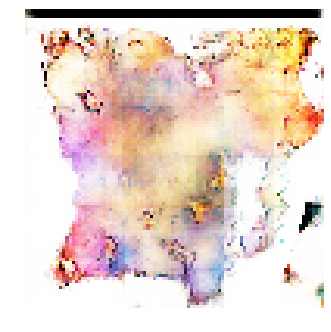


Epoch: 17040, D: -5.213, G: 2.551
Epoch: 17041, D: -5.381, G: 3.888
Epoch: 17042, D: -5.776, G: 4.344
Epoch: 17043, D: -7.051, G: 2.742
Epoch: 17044, D: -5.501, G: 2.726
Epoch: 17045, D: -5.059, G: 3.591
Epoch: 17046, D: -7.019, G: 4.588
Epoch: 17047, D: -6.705, G: 1.224
Epoch: 17048, D: -5.57, G: 1.601
Epoch: 17049, D: -4.984, G: 4.577
Epoch: 17050, D: -6.423, G: 3.829
Epoch: 17051, D: -8.52, G: 1.663
Epoch: 17052, D: -5.308, G: 2.926
Epoch: 17053, D: -6.463, G: 2.409
Epoch: 17054, D: -5.101, G: 1.403
Epoch: 17055, D: -6.508, G: 2.073
Epoch: 17056, D: -6.459, G: 3.11
Epoch: 17057, D: -5.399, G: 3.834
Epoch: 17058, D: -6.842, G: 2.809
Epoch: 17059, D: -5.449, G: 1.646


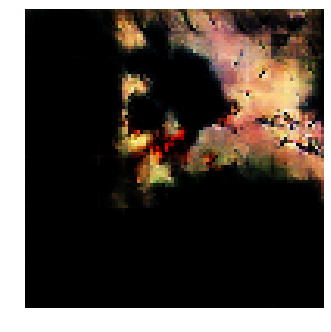


Epoch: 17060, D: -6.433, G: 2.891
Epoch: 17061, D: -5.861, G: 2.978
Epoch: 17062, D: -6.775, G: 2.108
Epoch: 17063, D: -6.386, G: 4.57
Epoch: 17064, D: -4.694, G: 4.436
Epoch: 17065, D: -6.191, G: 4.669
Epoch: 17066, D: -5.175, G: 6.65
Epoch: 17067, D: -6.156, G: 4.19
Epoch: 17068, D: -6.059, G: 5.906
Epoch: 17069, D: -5.698, G: 1.22
Epoch: 17070, D: -5.726, G: 2.817
Epoch: 17071, D: -6.169, G: 5.426
Epoch: 17072, D: -6.626, G: 5.528
Epoch: 17073, D: -6.111, G: 5.956
Epoch: 17074, D: -7.084, G: 4.432
Epoch: 17075, D: -4.645, G: 4.933
Epoch: 17076, D: -6.254, G: 5.062
Epoch: 17077, D: -6.534, G: 4.045
Epoch: 17078, D: -5.188, G: 3.386
Epoch: 17079, D: -5.248, G: 3.85


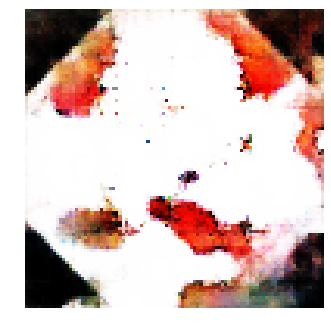


Epoch: 17080, D: -6.869, G: 3.877
Epoch: 17081, D: -5.868, G: 2.983
Epoch: 17082, D: -5.742, G: 3.088
Epoch: 17083, D: -6.136, G: 3.026
Epoch: 17084, D: -5.134, G: 6.403
Epoch: 17085, D: -6.548, G: 3.765
Epoch: 17086, D: -6.582, G: 2.981
Epoch: 17087, D: -6.434, G: 2.672
Epoch: 17088, D: -6.024, G: 3.909
Epoch: 17089, D: -6.007, G: 5.095
Epoch: 17090, D: -5.546, G: 3.637
Epoch: 17091, D: -6.952, G: 3.012
Epoch: 17092, D: -5.5, G: 3.581
Epoch: 17093, D: -6.923, G: 5.622
Epoch: 17094, D: -6.394, G: 1.203
Epoch: 17095, D: -5.047, G: 3.682
Epoch: 17096, D: -6.194, G: 1.082
Epoch: 17097, D: -4.391, G: 4.048
Epoch: 17098, D: -5.409, G: 5.563
Epoch: 17099, D: -4.875, G: 3.401


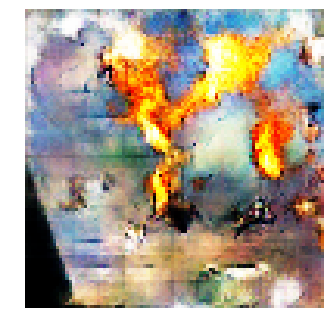


Epoch: 17100, D: -4.937, G: 2.792
Epoch: 17101, D: -5.362, G: 4.283
Epoch: 17102, D: -5.733, G: 4.818
Epoch: 17103, D: -5.654, G: 2.379
Epoch: 17104, D: -6.068, G: 2.943
Epoch: 17105, D: -6.055, G: 2.641
Epoch: 17106, D: -5.101, G: 6.062
Epoch: 17107, D: -5.475, G: 3.207
Epoch: 17108, D: -6.799, G: 3.869
Epoch: 17109, D: -7.264, G: 3.58
Epoch: 17110, D: -8.415, G: 3.868
Epoch: 17111, D: -6.017, G: 4.607
Epoch: 17112, D: -7.299, G: 2.483
Epoch: 17113, D: -6.311, G: 0.3472
Epoch: 17114, D: -6.028, G: 3.829
Epoch: 17115, D: -5.376, G: 2.422
Epoch: 17116, D: -5.818, G: 3.39
Epoch: 17117, D: -4.807, G: 5.272
Epoch: 17118, D: -5.675, G: 2.737
Epoch: 17119, D: -6.143, G: 3.454


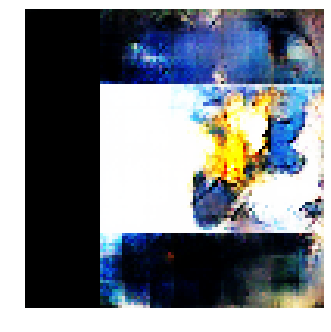


Epoch: 17120, D: -6.526, G: 4.984
Epoch: 17121, D: -7.778, G: 3.84
Epoch: 17122, D: -6.523, G: 5.069
Epoch: 17123, D: -6.777, G: 3.238
Epoch: 17124, D: -5.461, G: 4.465
Epoch: 17125, D: -5.653, G: 3.962
Epoch: 17126, D: -6.498, G: 2.097
Epoch: 17127, D: -6.43, G: 3.054
Epoch: 17128, D: -6.165, G: 3.685
Epoch: 17129, D: -5.352, G: 3.064
Epoch: 17130, D: -6.435, G: 2.525
Epoch: 17131, D: -5.055, G: 4.469
Epoch: 17132, D: -5.173, G: 3.368
Epoch: 17133, D: -5.708, G: 3.087
Epoch: 17134, D: -6.706, G: 4.03
Epoch: 17135, D: -4.845, G: 7.22
Epoch: 17136, D: -5.041, G: 4.323
Epoch: 17137, D: -6.366, G: 4.642
Epoch: 17138, D: -5.046, G: 2.723
Epoch: 17139, D: -5.664, G: 4.493


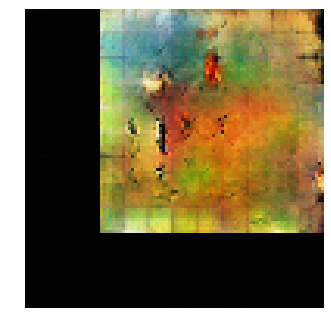


Epoch: 17140, D: -7.028, G: 3.903
Epoch: 17141, D: -5.371, G: 3.222
Epoch: 17142, D: -5.546, G: 4.527
Epoch: 17143, D: -5.389, G: 4.19
Epoch: 17144, D: -6.892, G: 3.439
Epoch: 17145, D: -7.078, G: 3.292
Epoch: 17146, D: -6.568, G: 2.653
Epoch: 17147, D: -5.451, G: 6.809
Epoch: 17148, D: -5.425, G: 2.623
Epoch: 17149, D: -6.819, G: 4.578
Epoch: 17150, D: -5.69, G: 2.706
Epoch: 17151, D: -6.61, G: 2.533
Epoch: 17152, D: -6.589, G: 1.37
Epoch: 17153, D: -5.728, G: 3.296
Epoch: 17154, D: -6.904, G: 5.255
Epoch: 17155, D: -7.99, G: 1.532
Epoch: 17156, D: -6.301, G: 1.27
Epoch: 17157, D: -6.367, G: 4.908
Epoch: 17158, D: -5.604, G: 3.436
Epoch: 17159, D: -5.982, G: 5.011


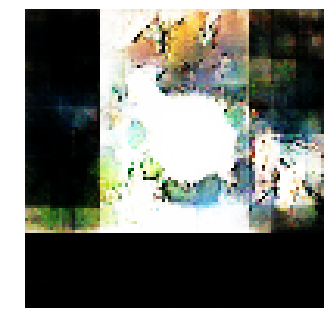


Epoch: 17160, D: -5.342, G: 6.566
Epoch: 17161, D: -5.823, G: 5.34
Epoch: 17162, D: -5.3, G: 1.769
Epoch: 17163, D: -5.756, G: 4.089
Epoch: 17164, D: -5.963, G: 4.944
Epoch: 17165, D: -4.472, G: 2.382
Epoch: 17166, D: -6.399, G: 2.794
Epoch: 17167, D: -5.133, G: 2.092
Epoch: 17168, D: -6.817, G: 3.15
Epoch: 17169, D: -5.546, G: 3.004
Epoch: 17170, D: -4.625, G: 4.853
Epoch: 17171, D: -6.047, G: 5.514
Epoch: 17172, D: -6.655, G: 3.888
Epoch: 17173, D: -6.811, G: 6.907
Epoch: 17174, D: -6.012, G: 3.771
Epoch: 17175, D: -5.699, G: 5.293
Epoch: 17176, D: -5.469, G: 1.998
Epoch: 17177, D: -6.183, G: 2.18
Epoch: 17178, D: -5.951, G: 4.544
Epoch: 17179, D: -6.901, G: 2.139


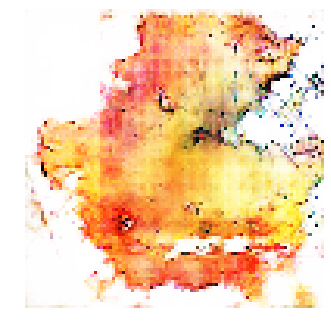


Epoch: 17180, D: -6.591, G: 2.376
Epoch: 17181, D: -6.797, G: 1.47
Epoch: 17182, D: -6.773, G: 3.739
Epoch: 17183, D: -6.469, G: 2.317
Epoch: 17184, D: -5.688, G: 2.598
Epoch: 17185, D: -5.595, G: 3.238
Epoch: 17186, D: -6.054, G: 4.457
Epoch: 17187, D: -5.031, G: 3.822
Epoch: 17188, D: -6.099, G: 3.22
Epoch: 17189, D: -6.29, G: 4.059
Epoch: 17190, D: -4.782, G: 5.675
Epoch: 17191, D: -6.104, G: 4.531
Epoch: 17192, D: -6.141, G: 4.102
Epoch: 17193, D: -5.149, G: 4.232
Epoch: 17194, D: -6.388, G: 2.94
Epoch: 17195, D: -5.653, G: 3.381
Epoch: 17196, D: -6.73, G: 4.715
Epoch: 17197, D: -6.197, G: 3.311
Epoch: 17198, D: -7.29, G: 4.804
Epoch: 17199, D: -5.218, G: 4.346


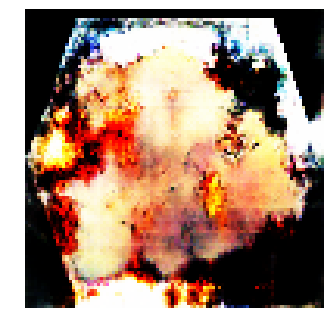


Epoch: 17200, D: -6.356, G: 5.115
Epoch: 17201, D: -6.335, G: 5.476
Epoch: 17202, D: -6.201, G: 5.438
Epoch: 17203, D: -5.138, G: 5.066
Epoch: 17204, D: -5.789, G: 5.28
Epoch: 17205, D: -5.514, G: 3.789
Epoch: 17206, D: -4.977, G: 5.86
Epoch: 17207, D: -5.707, G: 3.756
Epoch: 17208, D: -5.491, G: 3.388
Epoch: 17209, D: -6.363, G: 4.057
Epoch: 17210, D: -5.497, G: 1.789
Epoch: 17211, D: -6.228, G: 4.483
Epoch: 17212, D: -4.452, G: 3.197
Epoch: 17213, D: -5.715, G: 5.667
Epoch: 17214, D: -6.374, G: 4.743
Epoch: 17215, D: -4.542, G: 4.223
Epoch: 17216, D: -6.824, G: 5.37
Epoch: 17217, D: -5.939, G: 3.098
Epoch: 17218, D: -5.545, G: 3.478
Epoch: 17219, D: -5.52, G: 3.998


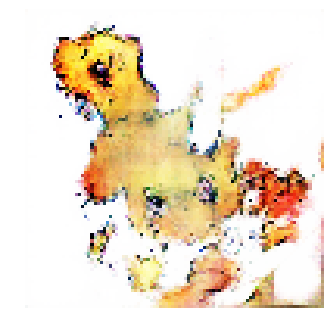


Epoch: 17220, D: -3.825, G: 5.347
Epoch: 17221, D: -6.713, G: 4.208
Epoch: 17222, D: -6.54, G: 4.867
Epoch: 17223, D: -6.254, G: 6.172
Epoch: 17224, D: -6.224, G: 4.34
Epoch: 17225, D: -5.501, G: 6.039
Epoch: 17226, D: -5.683, G: 3.477
Epoch: 17227, D: -5.152, G: 4.485
Epoch: 17228, D: -5.866, G: 4.545
Epoch: 17229, D: -6.028, G: 3.873
Epoch: 17230, D: -5.194, G: 5.282
Epoch: 17231, D: -6.695, G: 1.946
Epoch: 17232, D: -8.078, G: 6.337
Epoch: 17233, D: -4.873, G: 3.558
Epoch: 17234, D: -7.196, G: 4.382
Epoch: 17235, D: -6.404, G: 1.401
Epoch: 17236, D: -5.764, G: 3.473
Epoch: 17237, D: -5.238, G: 5.369
Epoch: 17238, D: -6.089, G: 3.161
Epoch: 17239, D: -5.438, G: 3.311


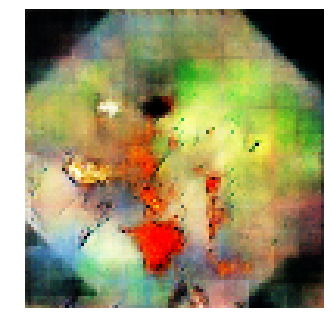


Epoch: 17240, D: -6.039, G: 2.037
Epoch: 17241, D: -6.133, G: 5.159
Epoch: 17242, D: -6.283, G: 2.824
Epoch: 17243, D: -5.351, G: 5.205
Epoch: 17244, D: -6.226, G: 3.414
Epoch: 17245, D: -5.66, G: 4.41
Epoch: 17246, D: -6.849, G: 3.66
Epoch: 17247, D: -6.651, G: 3.878
Epoch: 17248, D: -5.389, G: 4.885
Epoch: 17249, D: -4.621, G: 4.247
Epoch: 17250, D: -7.59, G: 7.317
Epoch: 17251, D: -3.821, G: 3.856
Epoch: 17252, D: -5.422, G: 3.574
Epoch: 17253, D: -7.108, G: 2.959
Epoch: 17254, D: -7.519, G: 4.226
Epoch: 17255, D: -6.066, G: 5.919
Epoch: 17256, D: -5.556, G: 5.981
Epoch: 17257, D: -6.378, G: 3.47
Epoch: 17258, D: -7.322, G: 4.247
Epoch: 17259, D: -7.212, G: 2.98


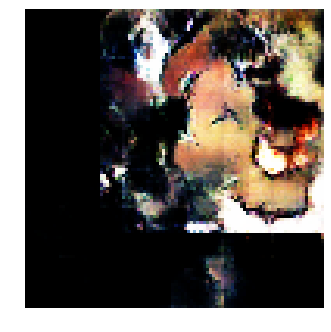


Epoch: 17260, D: -7.423, G: 0.779
Epoch: 17261, D: -5.417, G: 5.461
Epoch: 17262, D: -6.649, G: 4.079
Epoch: 17263, D: -4.252, G: 4.626
Epoch: 17264, D: -6.736, G: 1.343
Epoch: 17265, D: -6.761, G: 4.581
Epoch: 17266, D: -5.983, G: 3.957
Epoch: 17267, D: -6.289, G: 3.526
Epoch: 17268, D: -5.035, G: 2.473
Epoch: 17269, D: -5.182, G: 3.807
Epoch: 17270, D: -3.709, G: 3.343
Epoch: 17271, D: -5.628, G: 4.526
Epoch: 17272, D: -7.24, G: 4.521
Epoch: 17273, D: -5.534, G: 1.564
Epoch: 17274, D: -5.354, G: 3.194
Epoch: 17275, D: -7.013, G: 3.412
Epoch: 17276, D: -5.214, G: 2.664
Epoch: 17277, D: -6.197, G: 3.278
Epoch: 17278, D: -5.814, G: 2.848
Epoch: 17279, D: -6.429, G: 4.766


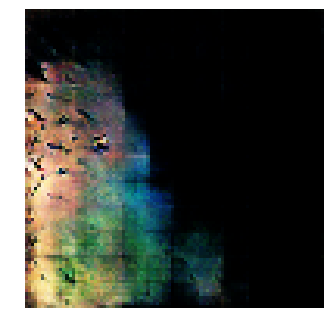


Epoch: 17280, D: -7.618, G: 4.08
Epoch: 17281, D: -6.982, G: 6.429
Epoch: 17282, D: -6.35, G: 3.788
Epoch: 17283, D: -6.568, G: 5.383
Epoch: 17284, D: -6.075, G: 3.656
Epoch: 17285, D: -5.425, G: 2.426
Epoch: 17286, D: -6.107, G: 5.343
Epoch: 17287, D: -5.875, G: 4.092
Epoch: 17288, D: -5.261, G: 6.159
Epoch: 17289, D: -5.62, G: 3.949
Epoch: 17290, D: -5.339, G: 0.9383
Epoch: 17291, D: -5.413, G: 4.4
Epoch: 17292, D: -6.755, G: 4.596
Epoch: 17293, D: -5.351, G: 4.867
Epoch: 17294, D: -5.769, G: 5.11
Epoch: 17295, D: -5.911, G: 3.437
Epoch: 17296, D: -6.42, G: 4.201
Epoch: 17297, D: -5.748, G: 2.844
Epoch: 17298, D: -5.718, G: 4.679
Epoch: 17299, D: -5.257, G: 3.832


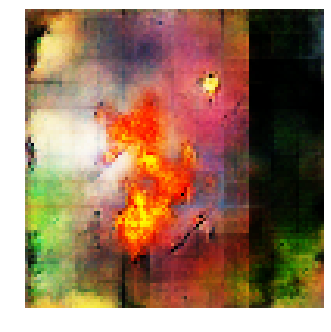


Epoch: 17300, D: -7.034, G: 4.617
Epoch: 17301, D: -4.365, G: 3.017
Epoch: 17302, D: -5.27, G: 2.289
Epoch: 17303, D: -5.008, G: 4.088
Epoch: 17304, D: -6.091, G: 1.581
Epoch: 17305, D: -6.114, G: 5.874
Epoch: 17306, D: -4.731, G: 3.055
Epoch: 17307, D: -6.562, G: 6.02
Epoch: 17308, D: -5.735, G: 3.576
Epoch: 17309, D: -6.725, G: 2.981
Epoch: 17310, D: -5.397, G: 4.823
Epoch: 17311, D: -6.312, G: 3.88
Epoch: 17312, D: -7.11, G: 3.74
Epoch: 17313, D: -5.441, G: 4.479
Epoch: 17314, D: -5.655, G: 5.206
Epoch: 17315, D: -5.202, G: 2.551
Epoch: 17316, D: -5.716, G: 3.67
Epoch: 17317, D: -5.052, G: 3.671
Epoch: 17318, D: -5.725, G: 3.226
Epoch: 17319, D: -6.013, G: 0.3079


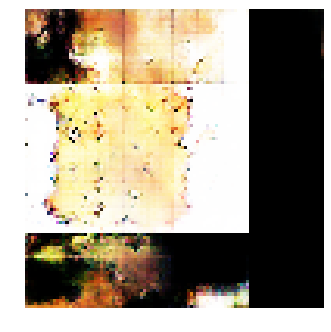


Epoch: 17320, D: -5.944, G: 3.431
Epoch: 17321, D: -6.243, G: 2.245
Epoch: 17322, D: -7.368, G: 4.282
Epoch: 17323, D: -6.051, G: 3.963
Epoch: 17324, D: -6.549, G: 1.697
Epoch: 17325, D: -6.388, G: 2.027
Epoch: 17326, D: -7.287, G: 3.908
Epoch: 17327, D: -5.257, G: 5.538
Epoch: 17328, D: -6.968, G: 5.02
Epoch: 17329, D: -7.311, G: 4.004
Epoch: 17330, D: -4.508, G: 6.136
Epoch: 17331, D: -6.481, G: 3.354
Epoch: 17332, D: -6.426, G: 4.204
Epoch: 17333, D: -6.215, G: 1.835
Epoch: 17334, D: -5.881, G: 3.299
Epoch: 17335, D: -5.629, G: 3.677
Epoch: 17336, D: -6.081, G: 2.477
Epoch: 17337, D: -6.03, G: 3.723
Epoch: 17338, D: -5.738, G: 3.763
Epoch: 17339, D: -6.04, G: 6.251


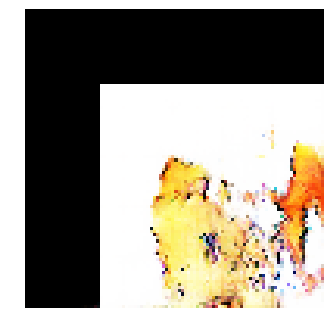


Epoch: 17340, D: -6.312, G: 5.239
Epoch: 17341, D: -6.13, G: 3.598
Epoch: 17342, D: -5.008, G: 5.178
Epoch: 17343, D: -5.624, G: 5.851
Epoch: 17344, D: -4.319, G: 3.492
Epoch: 17345, D: -5.358, G: 0.296
Epoch: 17346, D: -5.669, G: 3.934
Epoch: 17347, D: -4.555, G: 5.4
Epoch: 17348, D: -5.256, G: 4.42
Epoch: 17349, D: -4.314, G: 4.873
Epoch: 17350, D: -5.177, G: 2.143
Epoch: 17351, D: -5.732, G: 1.897
Epoch: 17352, D: -5.196, G: 4.696
Epoch: 17353, D: -6.44, G: 3.844
Epoch: 17354, D: -6.171, G: 3.197
Epoch: 17355, D: -6.942, G: 4.71
Epoch: 17356, D: -6.884, G: 2.122
Epoch: 17357, D: -7.393, G: 4.433
Epoch: 17358, D: -5.092, G: 2.058
Epoch: 17359, D: -4.363, G: 4.484


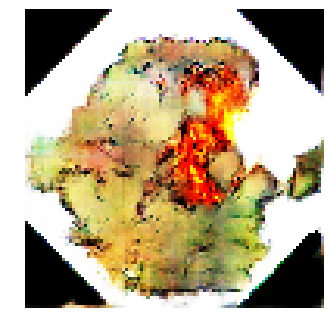


Epoch: 17360, D: -7.138, G: 2.841
Epoch: 17361, D: -5.828, G: 2.096
Epoch: 17362, D: -4.95, G: 3.247
Epoch: 17363, D: -5.613, G: 2.764
Epoch: 17364, D: -4.706, G: 2.725
Epoch: 17365, D: -4.399, G: 4.889
Epoch: 17366, D: -5.914, G: 2.682
Epoch: 17367, D: -6.681, G: 3.773
Epoch: 17368, D: -5.673, G: 3.477
Epoch: 17369, D: -5.285, G: 3.391
Epoch: 17370, D: -6.018, G: 4.766
Epoch: 17371, D: -5.384, G: 4.434
Epoch: 17372, D: -6.136, G: 2.933
Epoch: 17373, D: -6.471, G: 3.112
Epoch: 17374, D: -4.673, G: 2.339
Epoch: 17375, D: -6.178, G: 4.745
Epoch: 17376, D: -5.967, G: 5.086
Epoch: 17377, D: -5.441, G: 0.81
Epoch: 17378, D: -5.823, G: 3.595
Epoch: 17379, D: -6.39, G: 3.265


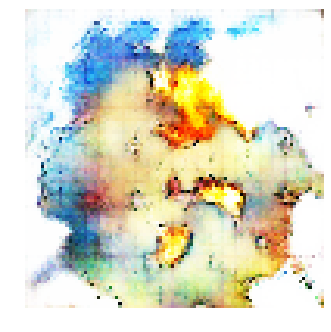


Epoch: 17380, D: -6.442, G: 3.496
Epoch: 17381, D: -5.505, G: 4.302
Epoch: 17382, D: -5.991, G: 3.034
Epoch: 17383, D: -5.576, G: 2.785
Epoch: 17384, D: -5.178, G: 3.825
Epoch: 17385, D: -5.847, G: 2.794
Epoch: 17386, D: -5.548, G: 6.318
Epoch: 17387, D: -6.882, G: 1.938
Epoch: 17388, D: -5.727, G: 4.816
Epoch: 17389, D: -4.971, G: 3.531
Epoch: 17390, D: -6.514, G: 1.614
Epoch: 17391, D: -6.31, G: 5.921
Epoch: 17392, D: -6.542, G: 3.053
Epoch: 17393, D: -5.358, G: 4.993
Epoch: 17394, D: -6.913, G: 6.468
Epoch: 17395, D: -4.698, G: 4.339
Epoch: 17396, D: -6.773, G: 4.264
Epoch: 17397, D: -5.462, G: 3.599
Epoch: 17398, D: -6.349, G: 4.538
Epoch: 17399, D: -6.271, G: 4.664


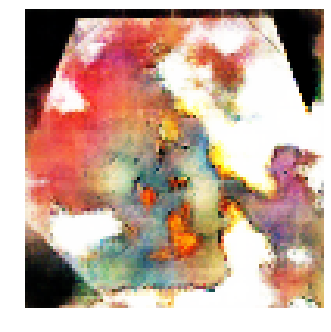


Epoch: 17400, D: -6.248, G: 5.616
Epoch: 17401, D: -4.597, G: 3.848
Epoch: 17402, D: -7.134, G: 3.609
Epoch: 17403, D: -6.32, G: 1.938
Epoch: 17404, D: -5.407, G: 2.293
Epoch: 17405, D: -5.777, G: 4.504
Epoch: 17406, D: -6.224, G: 3.193
Epoch: 17407, D: -6.541, G: 6.201
Epoch: 17408, D: -5.455, G: 2.473
Epoch: 17409, D: -5.822, G: 3.014
Epoch: 17410, D: -5.144, G: 2.886
Epoch: 17411, D: -6.517, G: 3.265
Epoch: 17412, D: -5.858, G: 6.059
Epoch: 17413, D: -5.866, G: 3.146
Epoch: 17414, D: -6.462, G: 3.242
Epoch: 17415, D: -6.531, G: 4.991
Epoch: 17416, D: -5.778, G: 2.88
Epoch: 17417, D: -5.003, G: 3.717
Epoch: 17418, D: -6.2, G: 4.16
Epoch: 17419, D: -6.912, G: 1.49


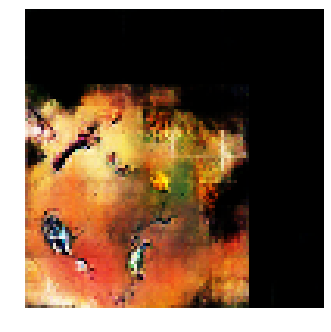


Epoch: 17420, D: -5.455, G: 2.579
Epoch: 17421, D: -6.771, G: 4.028
Epoch: 17422, D: -6.187, G: 4.959
Epoch: 17423, D: -6.214, G: 1.809
Epoch: 17424, D: -5.661, G: 3.546
Epoch: 17425, D: -6.283, G: 1.723
Epoch: 17426, D: -6.882, G: 2.236
Epoch: 17427, D: -7.042, G: 3.328
Epoch: 17428, D: -6.369, G: 2.929
Epoch: 17429, D: -6.998, G: 3.882
Epoch: 17430, D: -4.848, G: 2.702
Epoch: 17431, D: -5.747, G: 1.169
Epoch: 17432, D: -4.8, G: 3.454
Epoch: 17433, D: -5.159, G: 1.35
Epoch: 17434, D: -5.011, G: 4.145
Epoch: 17435, D: -5.462, G: 3.082
Epoch: 17436, D: -6.144, G: 2.028
Epoch: 17437, D: -7.002, G: 2.852
Epoch: 17438, D: -6.111, G: 4.882
Epoch: 17439, D: -4.684, G: 4.08


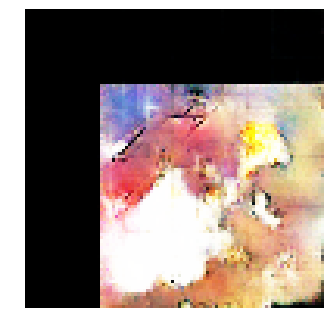


Epoch: 17440, D: -6.534, G: 4.641
Epoch: 17441, D: -5.532, G: 3.945
Epoch: 17442, D: -6.909, G: 5.213
Epoch: 17443, D: -5.611, G: 4.328
Epoch: 17444, D: -5.909, G: 2.819
Epoch: 17445, D: -6.482, G: 1.141
Epoch: 17446, D: -6.238, G: 3.911
Epoch: 17447, D: -5.285, G: 4.522
Epoch: 17448, D: -6.2, G: 2.656
Epoch: 17449, D: -6.03, G: 3.27
Epoch: 17450, D: -6.794, G: 5.217
Epoch: 17451, D: -3.643, G: 2.412
Epoch: 17452, D: -5.474, G: 4.573
Epoch: 17453, D: -6.827, G: 3.917
Epoch: 17454, D: -6.27, G: 3.745
Epoch: 17455, D: -5.516, G: 4.023
Epoch: 17456, D: -6.908, G: 2.045
Epoch: 17457, D: -5.96, G: 0.5392
Epoch: 17458, D: -6.242, G: 1.997
Epoch: 17459, D: -5.619, G: 4.674


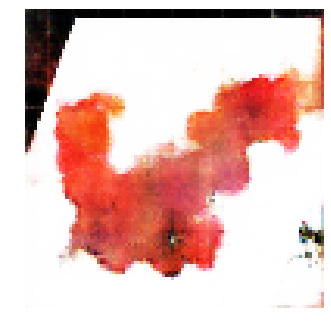


Epoch: 17460, D: -6.767, G: 3.198
Epoch: 17461, D: -5.149, G: 1.311
Epoch: 17462, D: -5.657, G: 1.199
Epoch: 17463, D: -5.882, G: 3.11
Epoch: 17464, D: -5.159, G: 4.693
Epoch: 17465, D: -5.037, G: 3.358
Epoch: 17466, D: -5.032, G: 3.506
Epoch: 17467, D: -5.101, G: 1.885
Epoch: 17468, D: -6.478, G: 4.538
Epoch: 17469, D: -6.754, G: 1.306
Epoch: 17470, D: -7.153, G: 3.999
Epoch: 17471, D: -5.874, G: 2.025
Epoch: 17472, D: -6.897, G: 4.878
Epoch: 17473, D: -5.45, G: 4.78
Epoch: 17474, D: -6.294, G: 6.962
Epoch: 17475, D: -5.584, G: 2.74
Epoch: 17476, D: -6.131, G: 4.503
Epoch: 17477, D: -6.315, G: 3.54
Epoch: 17478, D: -6.289, G: 5.085
Epoch: 17479, D: -6.161, G: 1.181


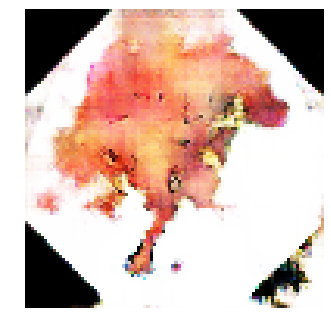


Epoch: 17480, D: -7.228, G: 2.694
Epoch: 17481, D: -5.123, G: 2.035
Epoch: 17482, D: -5.346, G: 5.639
Epoch: 17483, D: -5.146, G: 5.385
Epoch: 17484, D: -5.471, G: 4.897
Epoch: 17485, D: -6.444, G: 3.116
Epoch: 17486, D: -6.698, G: 1.213
Epoch: 17487, D: -5.601, G: 3.355
Epoch: 17488, D: -6.576, G: 2.346
Epoch: 17489, D: -5.002, G: 4.4
Epoch: 17490, D: -6.997, G: 4.542
Epoch: 17491, D: -5.129, G: 2.655
Epoch: 17492, D: -6.022, G: 3.009
Epoch: 17493, D: -6.077, G: 3.88
Epoch: 17494, D: -5.223, G: 5.054
Epoch: 17495, D: -5.559, G: 3.742
Epoch: 17496, D: -5.688, G: 6.328
Epoch: 17497, D: -5.774, G: 6.239
Epoch: 17498, D: -5.59, G: 2.944
Epoch: 17499, D: -5.381, G: 4.779


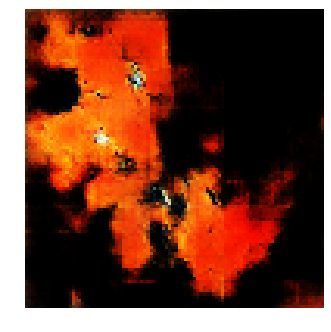


Epoch: 17500, D: -6.81, G: 3.071
Epoch: 17501, D: -5.794, G: 3.51
Epoch: 17502, D: -5.845, G: 3.425
Epoch: 17503, D: -7.512, G: 3.282
Epoch: 17504, D: -7.362, G: 3.279
Epoch: 17505, D: -6.107, G: 2.32
Epoch: 17506, D: -5.979, G: 3.191
Epoch: 17507, D: -6.153, G: 3.18
Epoch: 17508, D: -6.759, G: 3.136
Epoch: 17509, D: -5.781, G: 3.997
Epoch: 17510, D: -7.15, G: 2.813
Epoch: 17511, D: -6.719, G: 2.269
Epoch: 17512, D: -6.166, G: 4.299
Epoch: 17513, D: -5.61, G: 1.941
Epoch: 17514, D: -6.043, G: 1.909
Epoch: 17515, D: -6.193, G: 4.384
Epoch: 17516, D: -6.622, G: 4.318
Epoch: 17517, D: -5.523, G: 5.022
Epoch: 17518, D: -4.849, G: 4.377
Epoch: 17519, D: -5.683, G: 4.375


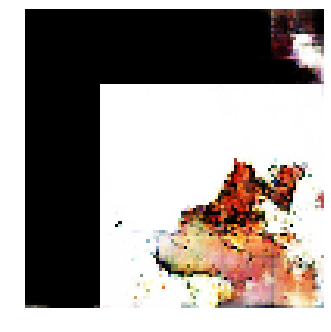


Epoch: 17520, D: -6.895, G: 4.482
Epoch: 17521, D: -5.376, G: 2.775
Epoch: 17522, D: -5.245, G: 4.279
Epoch: 17523, D: -5.077, G: 4.08
Epoch: 17524, D: -5.152, G: 3.14
Epoch: 17525, D: -6.454, G: 4.92
Epoch: 17526, D: -5.553, G: 5.389
Epoch: 17527, D: -6.064, G: 4.153
Epoch: 17528, D: -6.717, G: 1.622
Epoch: 17529, D: -5.999, G: 1.791
Epoch: 17530, D: -5.924, G: 3.857
Epoch: 17531, D: -6.763, G: 3.757
Epoch: 17532, D: -6.842, G: 4.025
Epoch: 17533, D: -5.072, G: 4.24
Epoch: 17534, D: -7.063, G: 2.964
Epoch: 17535, D: -5.364, G: 3.524
Epoch: 17536, D: -5.609, G: 5.051
Epoch: 17537, D: -5.354, G: 3.422
Epoch: 17538, D: -5.904, G: 4.312
Epoch: 17539, D: -6.989, G: 2.867


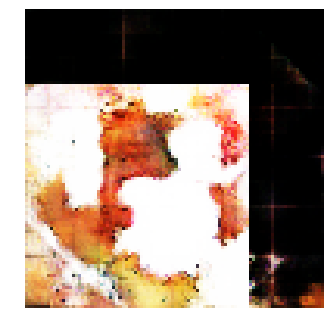


Epoch: 17540, D: -5.852, G: 3.985
Epoch: 17541, D: -6.03, G: 3.865
Epoch: 17542, D: -5.814, G: 4.81
Epoch: 17543, D: -6.464, G: 4.012
Epoch: 17544, D: -4.875, G: 2.542
Epoch: 17545, D: -5.117, G: 5.251
Epoch: 17546, D: -6.43, G: 5.686
Epoch: 17547, D: -6.481, G: 2.015
Epoch: 17548, D: -6.604, G: 4.206
Epoch: 17549, D: -4.592, G: 4.163
Epoch: 17550, D: -5.952, G: 6.531
Epoch: 17551, D: -5.4, G: 3.941
Epoch: 17552, D: -5.358, G: 3.473
Epoch: 17553, D: -4.924, G: 4.911
Epoch: 17554, D: -5.597, G: 4.262
Epoch: 17555, D: -5.728, G: 2.392
Epoch: 17556, D: -6.677, G: 4.729
Epoch: 17557, D: -6.248, G: 2.368
Epoch: 17558, D: -6.064, G: 3.237
Epoch: 17559, D: -5.854, G: 1.253


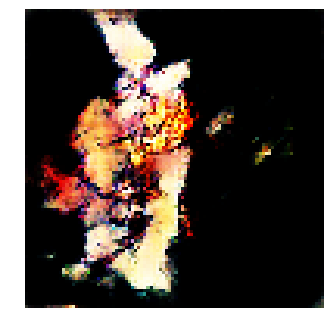


Epoch: 17560, D: -5.664, G: 2.94
Epoch: 17561, D: -4.617, G: 2.707
Epoch: 17562, D: -6.531, G: 4.177
Epoch: 17563, D: -5.9, G: 2.832
Epoch: 17564, D: -6.332, G: 4.416
Epoch: 17565, D: -5.079, G: 4.026
Epoch: 17566, D: -6.64, G: 2.211
Epoch: 17567, D: -5.582, G: 3.87
Epoch: 17568, D: -5.975, G: 3.975
Epoch: 17569, D: -5.637, G: 2.1
Epoch: 17570, D: -6.293, G: 1.271
Epoch: 17571, D: -6.195, G: 2.256
Epoch: 17572, D: -5.09, G: 1.754
Epoch: 17573, D: -6.077, G: 3.658
Epoch: 17574, D: -6.416, G: 4.749
Epoch: 17575, D: -5.178, G: 2.978
Epoch: 17576, D: -6.2, G: 2.472
Epoch: 17577, D: -5.372, G: 2.66
Epoch: 17578, D: -5.275, G: 1.391
Epoch: 17579, D: -4.766, G: 2.536


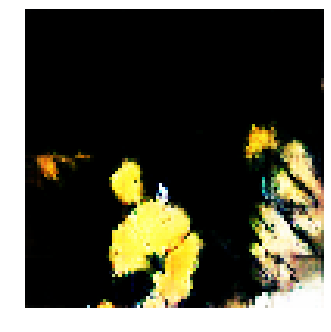


Epoch: 17580, D: -6.633, G: 1.436
Epoch: 17581, D: -6.145, G: 3.303
Epoch: 17582, D: -5.506, G: 4.578
Epoch: 17583, D: -6.55, G: 4.224
Epoch: 17584, D: -6.67, G: 2.988
Epoch: 17585, D: -5.868, G: 4.525
Epoch: 17586, D: -6.202, G: 2.15
Epoch: 17587, D: -5.718, G: 1.945
Epoch: 17588, D: -6.876, G: 1.977
Epoch: 17589, D: -4.914, G: 2.309
Epoch: 17590, D: -6.64, G: 1.213
Epoch: 17591, D: -5.113, G: 4.278
Epoch: 17592, D: -5.62, G: 1.902
Epoch: 17593, D: -6.841, G: 5.299
Epoch: 17594, D: -5.869, G: 5.034
Epoch: 17595, D: -6.05, G: 3.896
Epoch: 17596, D: -7.076, G: 3.208
Epoch: 17597, D: -5.82, G: 5.737
Epoch: 17598, D: -5.546, G: 5.261
Epoch: 17599, D: -6.552, G: 4.271


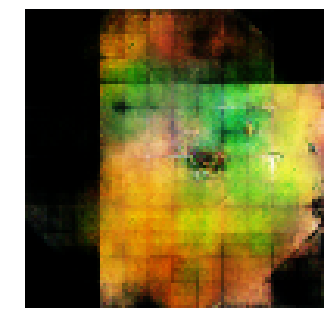


Epoch: 17600, D: -6.12, G: 3.739
Epoch: 17601, D: -5.293, G: 5.141
Epoch: 17602, D: -6.046, G: 3.036
Epoch: 17603, D: -6.858, G: 2.371
Epoch: 17604, D: -5.965, G: 3.973
Epoch: 17605, D: -6.082, G: 6.88
Epoch: 17606, D: -8.346, G: 6.392
Epoch: 17607, D: -4.961, G: 4.578
Epoch: 17608, D: -6.313, G: 4.985
Epoch: 17609, D: -4.59, G: 5.715
Epoch: 17610, D: -5.997, G: 4.168
Epoch: 17611, D: -7.398, G: 6.568
Epoch: 17612, D: -5.705, G: 3.942
Epoch: 17613, D: -5.305, G: 4.291
Epoch: 17614, D: -6.425, G: 3.724
Epoch: 17615, D: -5.386, G: 5.743
Epoch: 17616, D: -4.655, G: 4.442
Epoch: 17617, D: -4.643, G: 4.444
Epoch: 17618, D: -6.509, G: 4.392
Epoch: 17619, D: -6.069, G: 4.743


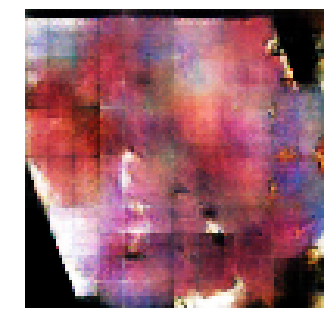


Epoch: 17620, D: -5.759, G: 3.568
Epoch: 17621, D: -5.603, G: 3.173
Epoch: 17622, D: -6.333, G: 3.385
Epoch: 17623, D: -3.825, G: 5.629
Epoch: 17624, D: -5.167, G: 4.913
Epoch: 17625, D: -6.264, G: 4.727
Epoch: 17626, D: -6.179, G: 2.093
Epoch: 17627, D: -5.371, G: 1.084
Epoch: 17628, D: -5.963, G: 3.919
Epoch: 17629, D: -6.964, G: 3.373
Epoch: 17630, D: -6.713, G: 1.782
Epoch: 17631, D: -6.859, G: 3.579
Epoch: 17632, D: -6.575, G: 0.6746
Epoch: 17633, D: -5.594, G: 1.973
Epoch: 17634, D: -5.614, G: 3.732
Epoch: 17635, D: -5.738, G: 2.432
Epoch: 17636, D: -6.831, G: 2.827
Epoch: 17637, D: -6.533, G: 2.739
Epoch: 17638, D: -5.189, G: 3.667
Epoch: 17639, D: -6.586, G: 4.584


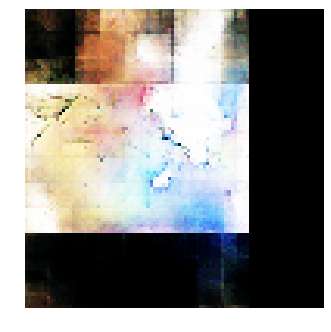


Epoch: 17640, D: -5.949, G: 4.1
Epoch: 17641, D: -6.535, G: 3.923
Epoch: 17642, D: -6.109, G: 1.667
Epoch: 17643, D: -6.479, G: 3.664
Epoch: 17644, D: -5.372, G: 3.735
Epoch: 17645, D: -7.736, G: 1.916
Epoch: 17646, D: -5.823, G: 3.19
Epoch: 17647, D: -5.657, G: 3.054
Epoch: 17648, D: -5.074, G: 3.752
Epoch: 17649, D: -7.155, G: 3.524
Epoch: 17650, D: -6.793, G: 3.924
Epoch: 17651, D: -6.207, G: 2.813
Epoch: 17652, D: -6.266, G: 1.707
Epoch: 17653, D: -5.257, G: 3.859
Epoch: 17654, D: -6.176, G: 3.483
Epoch: 17655, D: -5.352, G: 3.719
Epoch: 17656, D: -5.672, G: 5.191
Epoch: 17657, D: -7.176, G: 3.106
Epoch: 17658, D: -4.886, G: 3.758
Epoch: 17659, D: -7.586, G: 5.624


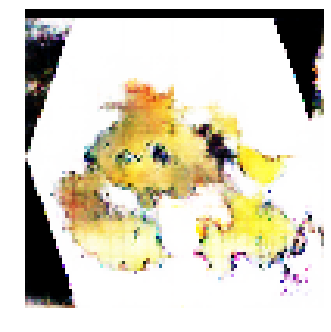


Epoch: 17660, D: -5.959, G: 3.285
Epoch: 17661, D: -5.774, G: 4.681
Epoch: 17662, D: -4.829, G: 3.897
Epoch: 17663, D: -5.799, G: 4.11
Epoch: 17664, D: -5.138, G: 3.859
Epoch: 17665, D: -8.203, G: 3.583
Epoch: 17666, D: -6.2, G: 2.96
Epoch: 17667, D: -5.424, G: 2.825
Epoch: 17668, D: -5.659, G: 1.834
Epoch: 17669, D: -4.495, G: 3.031
Epoch: 17670, D: -5.528, G: 3.732
Epoch: 17671, D: -6.962, G: 1.853
Epoch: 17672, D: -5.5, G: 4.553
Epoch: 17673, D: -6.919, G: 4.337
Epoch: 17674, D: -5.825, G: 3.055
Epoch: 17675, D: -4.776, G: 4.112
Epoch: 17676, D: -7.884, G: 4.394
Epoch: 17677, D: -6.291, G: 1.275
Epoch: 17678, D: -5.445, G: 4.29
Epoch: 17679, D: -5.416, G: 3.153


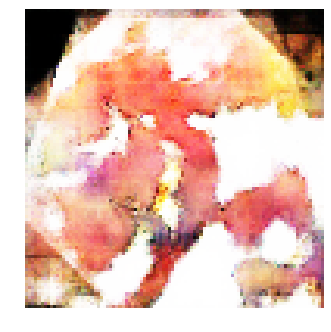


Epoch: 17680, D: -5.462, G: 2.881
Epoch: 17681, D: -5.497, G: 2.989
Epoch: 17682, D: -5.04, G: 3.698
Epoch: 17683, D: -6.534, G: 5.162
Epoch: 17684, D: -7.034, G: 4.194
Epoch: 17685, D: -5.434, G: 2.158
Epoch: 17686, D: -5.489, G: 3.21
Epoch: 17687, D: -6.115, G: 5.941
Epoch: 17688, D: -6.77, G: 4.119
Epoch: 17689, D: -4.708, G: 3.357
Epoch: 17690, D: -6.659, G: 5.626
Epoch: 17691, D: -5.238, G: 3.393
Epoch: 17692, D: -6.802, G: 3.818
Epoch: 17693, D: -7.19, G: 4.872
Epoch: 17694, D: -4.997, G: 4.048
Epoch: 17695, D: -5.127, G: 2.637
Epoch: 17696, D: -4.955, G: 5.892
Epoch: 17697, D: -5.434, G: 4.845
Epoch: 17698, D: -5.022, G: 4.595
Epoch: 17699, D: -5.831, G: 4.343


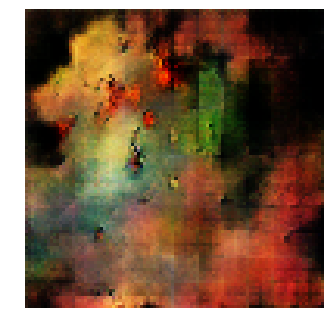


Epoch: 17700, D: -4.96, G: 2.815
Epoch: 17701, D: -7.444, G: 2.038
Epoch: 17702, D: -6.516, G: 2.99
Epoch: 17703, D: -6.718, G: -0.8062
Epoch: 17704, D: -5.655, G: 4.29
Epoch: 17705, D: -6.214, G: 2.965
Epoch: 17706, D: -6.049, G: 3.862
Epoch: 17707, D: -5.709, G: 3.788
Epoch: 17708, D: -6.021, G: 4.421
Epoch: 17709, D: -6.339, G: 3.756
Epoch: 17710, D: -5.718, G: 3.788
Epoch: 17711, D: -5.251, G: 4.607
Epoch: 17712, D: -5.409, G: 4.179
Epoch: 17713, D: -7.344, G: 4.578
Epoch: 17714, D: -5.215, G: 2.067
Epoch: 17715, D: -6.051, G: 2.161
Epoch: 17716, D: -6.087, G: 1.89
Epoch: 17717, D: -6.643, G: 3.473
Epoch: 17718, D: -7.408, G: 3.499
Epoch: 17719, D: -6.529, G: 3.192


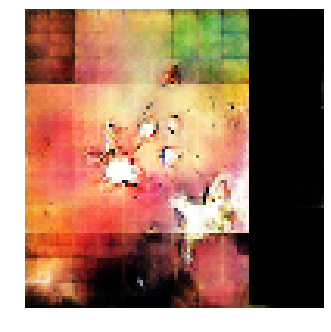


Epoch: 17720, D: -5.656, G: 2.276
Epoch: 17721, D: -6.193, G: 1.123
Epoch: 17722, D: -6.875, G: 2.131
Epoch: 17723, D: -6.016, G: 2.929
Epoch: 17724, D: -6.458, G: 4.214
Epoch: 17725, D: -6.833, G: 5.11
Epoch: 17726, D: -5.165, G: 4.493
Epoch: 17727, D: -5.645, G: 2.967
Epoch: 17728, D: -6.888, G: 5.989
Epoch: 17729, D: -5.661, G: 2.985
Epoch: 17730, D: -5.696, G: 3.725
Epoch: 17731, D: -7.428, G: 1.367
Epoch: 17732, D: -5.648, G: 4.402
Epoch: 17733, D: -4.85, G: 4.832
Epoch: 17734, D: -6.646, G: 4.84
Epoch: 17735, D: -5.383, G: 3.045
Epoch: 17736, D: -5.149, G: 2.69
Epoch: 17737, D: -6.784, G: 2.684
Epoch: 17738, D: -5.96, G: 2.97
Epoch: 17739, D: -5.076, G: 4.077


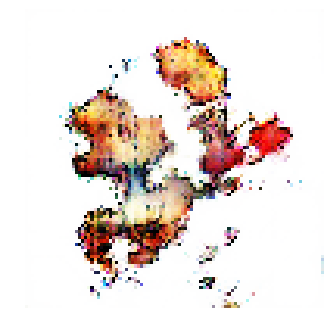


Epoch: 17740, D: -6.525, G: 3.723
Epoch: 17741, D: -4.654, G: 4.606
Epoch: 17742, D: -5.607, G: 3.762
Epoch: 17743, D: -7.149, G: 2.456
Epoch: 17744, D: -5.324, G: 3.163
Epoch: 17745, D: -6.087, G: 1.257
Epoch: 17746, D: -6.184, G: 4.092
Epoch: 17747, D: -6.54, G: 2.192
Epoch: 17748, D: -5.708, G: 3.923
Epoch: 17749, D: -5.408, G: 2.754
Epoch: 17750, D: -5.689, G: 5.905
Epoch: 17751, D: -5.754, G: 4.087
Epoch: 17752, D: -6.478, G: 2.963
Epoch: 17753, D: -7.065, G: 4.276
Epoch: 17754, D: -5.365, G: 4.532
Epoch: 17755, D: -7.003, G: 4.493
Epoch: 17756, D: -6.237, G: 2.728
Epoch: 17757, D: -6.233, G: 4.859
Epoch: 17758, D: -5.399, G: 2.57
Epoch: 17759, D: -5.912, G: 4.038


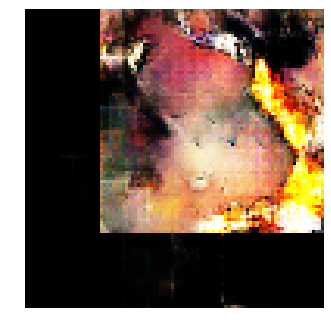


Epoch: 17760, D: -6.061, G: 3.972
Epoch: 17761, D: -5.622, G: 2.544
Epoch: 17762, D: -4.575, G: 5.566
Epoch: 17763, D: -6.049, G: 3.199
Epoch: 17764, D: -6.651, G: 3.904
Epoch: 17765, D: -6.203, G: 4.564
Epoch: 17766, D: -5.613, G: 3.595
Epoch: 17767, D: -5.628, G: 3.553
Epoch: 17768, D: -5.364, G: 3.182
Epoch: 17769, D: -6.84, G: 2.671
Epoch: 17770, D: -5.986, G: 0.5603
Epoch: 17771, D: -6.298, G: 2.442
Epoch: 17772, D: -6.824, G: 2.48
Epoch: 17773, D: -3.968, G: 0.04402
Epoch: 17774, D: -4.444, G: 4.584
Epoch: 17775, D: -6.148, G: 2.709
Epoch: 17776, D: -5.701, G: 3.917
Epoch: 17777, D: -5.265, G: 0.8248
Epoch: 17778, D: -5.892, G: 4.392
Epoch: 17779, D: -5.827, G: 5.612


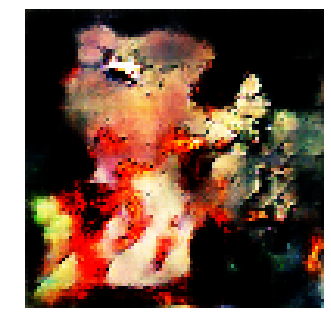


Epoch: 17780, D: -4.895, G: 5.588
Epoch: 17781, D: -4.51, G: 4.279
Epoch: 17782, D: -5.733, G: 3.262
Epoch: 17783, D: -5.24, G: 4.397
Epoch: 17784, D: -4.895, G: 3.649
Epoch: 17785, D: -5.444, G: 4.483
Epoch: 17786, D: -4.916, G: 5.931
Epoch: 17787, D: -5.892, G: 3.106
Epoch: 17788, D: -5.648, G: 2.733
Epoch: 17789, D: -6.143, G: 4.342
Epoch: 17790, D: -6.648, G: 4.439
Epoch: 17791, D: -7.672, G: 4.898
Epoch: 17792, D: -6.975, G: 3.474
Epoch: 17793, D: -6.651, G: 0.6072
Epoch: 17794, D: -4.428, G: 5.202
Epoch: 17795, D: -5.465, G: 1.919
Epoch: 17796, D: -5.51, G: 4.337
Epoch: 17797, D: -7.681, G: 4.441
Epoch: 17798, D: -7.278, G: 4.201
Epoch: 17799, D: -6.348, G: 5.225


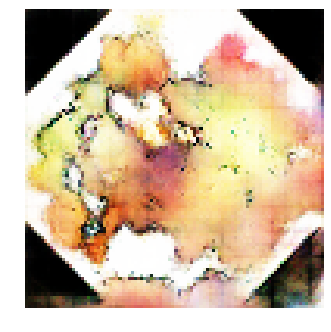


Epoch: 17800, D: -5.418, G: 4.589
Epoch: 17801, D: -6.075, G: 5.229
Epoch: 17802, D: -7.598, G: 3.632
Epoch: 17803, D: -5.891, G: 3.558
Epoch: 17804, D: -6.042, G: 5.945
Epoch: 17805, D: -5.036, G: 4.261
Epoch: 17806, D: -6.499, G: 2.236
Epoch: 17807, D: -6.863, G: 3.846
Epoch: 17808, D: -5.07, G: -0.1609
Epoch: 17809, D: -5.218, G: 3.628
Epoch: 17810, D: -7.68, G: 5.413
Epoch: 17811, D: -5.922, G: 0.8323
Epoch: 17812, D: -6.427, G: 5.016
Epoch: 17813, D: -5.338, G: 4.106
Epoch: 17814, D: -5.208, G: 3.273
Epoch: 17815, D: -7.326, G: 5.44
Epoch: 17816, D: -6.846, G: 1.298
Epoch: 17817, D: -6.37, G: 4.631
Epoch: 17818, D: -4.634, G: 3.948
Epoch: 17819, D: -5.303, G: 2.677


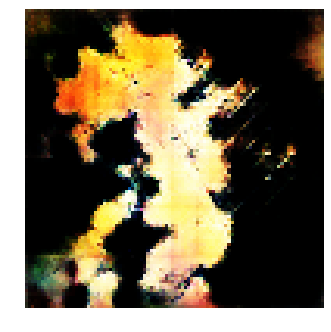


Epoch: 17820, D: -5.883, G: 2.394
Epoch: 17821, D: -7.854, G: 4.167
Epoch: 17822, D: -6.357, G: 2.638
Epoch: 17823, D: -7.408, G: 2.493
Epoch: 17824, D: -6.004, G: 5.551
Epoch: 17825, D: -5.049, G: 3.064
Epoch: 17826, D: -5.22, G: 3.633
Epoch: 17827, D: -5.313, G: 4.224
Epoch: 17828, D: -5.704, G: 4.066
Epoch: 17829, D: -5.836, G: 2.306
Epoch: 17830, D: -5.973, G: 4.174
Epoch: 17831, D: -6.15, G: 5.337
Epoch: 17832, D: -5.307, G: 1.4
Epoch: 17833, D: -5.965, G: 4.203
Epoch: 17834, D: -6.512, G: 2.384
Epoch: 17835, D: -5.91, G: 4.167
Epoch: 17836, D: -5.552, G: 3.531
Epoch: 17837, D: -6.855, G: 4.009
Epoch: 17838, D: -5.08, G: 4.801
Epoch: 17839, D: -5.043, G: 3.825


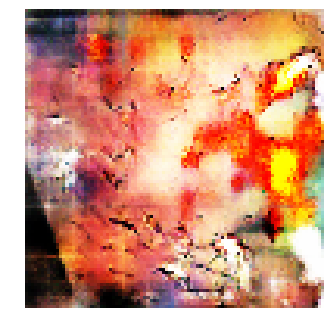


Epoch: 17840, D: -7.033, G: 2.414
Epoch: 17841, D: -6.62, G: 4.685
Epoch: 17842, D: -6.988, G: 6.341
Epoch: 17843, D: -6.151, G: 1.442
Epoch: 17844, D: -4.878, G: 4.732
Epoch: 17845, D: -5.749, G: 3.857
Epoch: 17846, D: -5.753, G: 3.048
Epoch: 17847, D: -5.483, G: 2.996
Epoch: 17848, D: -6.813, G: 3.111
Epoch: 17849, D: -7.199, G: 3.872
Epoch: 17850, D: -5.382, G: 3.335
Epoch: 17851, D: -6.719, G: 3.121
Epoch: 17852, D: -7.1, G: 2.179
Epoch: 17853, D: -5.574, G: 1.913
Epoch: 17854, D: -6.642, G: 5.161
Epoch: 17855, D: -6.872, G: 4.187
Epoch: 17856, D: -6.201, G: 3.514
Epoch: 17857, D: -5.69, G: 2.642
Epoch: 17858, D: -4.749, G: 3.869
Epoch: 17859, D: -7.783, G: 3.217


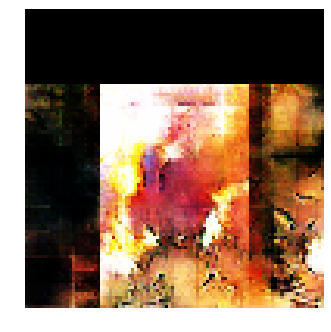


Epoch: 17860, D: -5.362, G: 1.991
Epoch: 17861, D: -6.162, G: 3.909
Epoch: 17862, D: -5.568, G: 3.844
Epoch: 17863, D: -7.079, G: 4.032
Epoch: 17864, D: -6.346, G: 3.324
Epoch: 17865, D: -4.541, G: 2.342
Epoch: 17866, D: -5.877, G: 5.13
Epoch: 17867, D: -6.121, G: 4.196
Epoch: 17868, D: -4.891, G: 3.455
Epoch: 17869, D: -6.85, G: 2.502
Epoch: 17870, D: -6.31, G: 5.255
Epoch: 17871, D: -5.669, G: 2.32
Epoch: 17872, D: -5.855, G: 4.37
Epoch: 17873, D: -6.016, G: 4.583
Epoch: 17874, D: -6.692, G: 2.818
Epoch: 17875, D: -6.595, G: 3.83
Epoch: 17876, D: -6.691, G: 2.13
Epoch: 17877, D: -5.716, G: 3.736
Epoch: 17878, D: -6.754, G: 1.756
Epoch: 17879, D: -5.209, G: 2.372


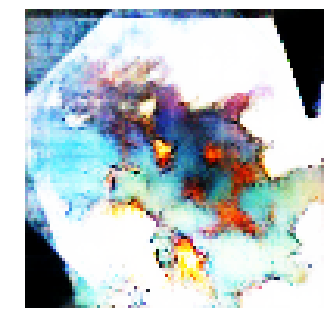


Epoch: 17880, D: -5.992, G: 3.838
Epoch: 17881, D: -7.103, G: 2.515
Epoch: 17882, D: -6.816, G: 3.099
Epoch: 17883, D: -5.494, G: 1.419
Epoch: 17884, D: -6.736, G: 3.724
Epoch: 17885, D: -5.144, G: 5.484
Epoch: 17886, D: -8.614, G: 3.891
Epoch: 17887, D: -6.087, G: 3.109
Epoch: 17888, D: -4.873, G: 4.393
Epoch: 17889, D: -5.942, G: 5.721
Epoch: 17890, D: -5.122, G: 3.42
Epoch: 17891, D: -7.398, G: 4.017
Epoch: 17892, D: -5.363, G: 1.749
Epoch: 17893, D: -6.034, G: 4.805
Epoch: 17894, D: -6.223, G: 2.986
Epoch: 17895, D: -6.384, G: 4.869
Epoch: 17896, D: -6.237, G: 2.729
Epoch: 17897, D: -5.842, G: 3.057
Epoch: 17898, D: -6.23, G: 5.42
Epoch: 17899, D: -5.569, G: 4.363


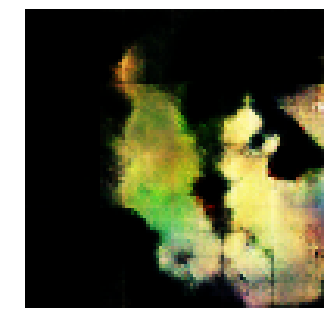


Epoch: 17900, D: -5.496, G: 6.803
Epoch: 17901, D: -5.913, G: 3.659
Epoch: 17902, D: -7.196, G: 1.838
Epoch: 17903, D: -5.713, G: 2.923
Epoch: 17904, D: -5.799, G: 5.306
Epoch: 17905, D: -5.279, G: 4.327
Epoch: 17906, D: -5.889, G: 3.093
Epoch: 17907, D: -6.118, G: 4.801
Epoch: 17908, D: -4.565, G: 3.681
Epoch: 17909, D: -5.379, G: 6.475
Epoch: 17910, D: -6.042, G: 3.232
Epoch: 17911, D: -6.809, G: 4.833
Epoch: 17912, D: -6.157, G: 2.943
Epoch: 17913, D: -6.145, G: 2.713
Epoch: 17914, D: -5.278, G: 2.081
Epoch: 17915, D: -7.778, G: 2.998
Epoch: 17916, D: -6.899, G: 3.884
Epoch: 17917, D: -7.133, G: 4.803
Epoch: 17918, D: -5.724, G: 3.236
Epoch: 17919, D: -5.895, G: 4.89


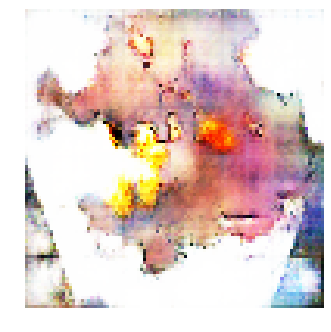


Epoch: 17920, D: -5.953, G: 4.849
Epoch: 17921, D: -5.581, G: 4.9
Epoch: 17922, D: -7.379, G: 0.3449
Epoch: 17923, D: -6.484, G: 3.374
Epoch: 17924, D: -4.507, G: 4.105
Epoch: 17925, D: -4.943, G: 4.187
Epoch: 17926, D: -6.664, G: 2.685
Epoch: 17927, D: -5.668, G: 3.171
Epoch: 17928, D: -6.477, G: 3.291
Epoch: 17929, D: -5.835, G: 4.741
Epoch: 17930, D: -5.992, G: 3.066
Epoch: 17931, D: -6.107, G: 4.619
Epoch: 17932, D: -6.348, G: 3.601
Epoch: 17933, D: -7.143, G: 2.73
Epoch: 17934, D: -5.684, G: 3.402
Epoch: 17935, D: -6.582, G: 6.005
Epoch: 17936, D: -5.567, G: 3.413
Epoch: 17937, D: -6.265, G: 4.121
Epoch: 17938, D: -4.363, G: 4.937
Epoch: 17939, D: -5.605, G: 5.231


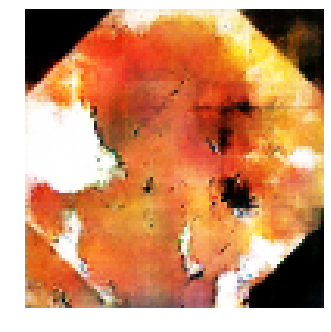


Epoch: 17940, D: -6.553, G: 3.575
Epoch: 17941, D: -6.936, G: 3.154
Epoch: 17942, D: -5.375, G: 2.0
Epoch: 17943, D: -6.304, G: 1.16
Epoch: 17944, D: -6.315, G: 4.1
Epoch: 17945, D: -6.88, G: 2.174
Epoch: 17946, D: -5.624, G: 4.315
Epoch: 17947, D: -5.069, G: 4.308
Epoch: 17948, D: -5.587, G: 1.335
Epoch: 17949, D: -6.395, G: 3.475
Epoch: 17950, D: -5.584, G: 5.03
Epoch: 17951, D: -4.546, G: 3.878
Epoch: 17952, D: -6.172, G: 4.658
Epoch: 17953, D: -4.264, G: 3.877
Epoch: 17954, D: -5.914, G: 4.131
Epoch: 17955, D: -7.509, G: 3.976
Epoch: 17956, D: -5.855, G: 2.478
Epoch: 17957, D: -6.937, G: 5.603
Epoch: 17958, D: -5.246, G: 2.102
Epoch: 17959, D: -5.245, G: 1.969


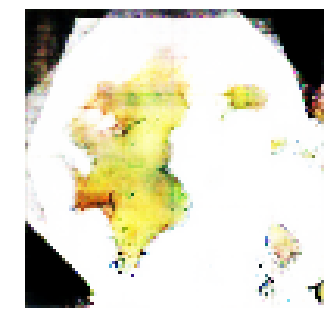


Epoch: 17960, D: -6.104, G: 4.54
Epoch: 17961, D: -6.212, G: 1.899
Epoch: 17962, D: -5.377, G: 3.382
Epoch: 17963, D: -7.096, G: 4.129
Epoch: 17964, D: -5.644, G: 4.961
Epoch: 17965, D: -6.849, G: 5.834
Epoch: 17966, D: -6.596, G: 4.987
Epoch: 17967, D: -6.086, G: 2.909
Epoch: 17968, D: -7.481, G: 3.887
Epoch: 17969, D: -5.858, G: 1.642
Epoch: 17970, D: -6.42, G: 4.696
Epoch: 17971, D: -7.007, G: 2.826
Epoch: 17972, D: -4.943, G: 2.745
Epoch: 17973, D: -6.398, G: 5.858
Epoch: 17974, D: -6.417, G: 5.723
Epoch: 17975, D: -5.186, G: 4.125
Epoch: 17976, D: -6.27, G: 4.283
Epoch: 17977, D: -7.349, G: 6.367
Epoch: 17978, D: -7.046, G: 5.447
Epoch: 17979, D: -6.515, G: 5.257


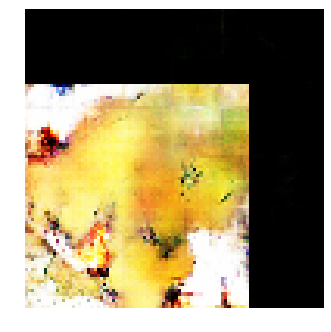


Epoch: 17980, D: -4.54, G: 4.687
Epoch: 17981, D: -5.705, G: 2.584
Epoch: 17982, D: -5.001, G: 3.108
Epoch: 17983, D: -6.652, G: 2.167
Epoch: 17984, D: -5.024, G: 3.331
Epoch: 17985, D: -7.139, G: 5.833
Epoch: 17986, D: -5.081, G: 3.778
Epoch: 17987, D: -6.593, G: 3.431
Epoch: 17988, D: -6.476, G: 3.102
Epoch: 17989, D: -4.976, G: 3.561
Epoch: 17990, D: -5.838, G: 2.75
Epoch: 17991, D: -6.563, G: 4.308
Epoch: 17992, D: -6.842, G: 1.796
Epoch: 17993, D: -6.173, G: 2.626
Epoch: 17994, D: -5.313, G: 1.585
Epoch: 17995, D: -6.859, G: 5.284
Epoch: 17996, D: -6.081, G: 5.55
Epoch: 17997, D: -6.478, G: 4.904
Epoch: 17998, D: -4.902, G: 4.336
Epoch: 17999, D: -7.103, G: 4.009


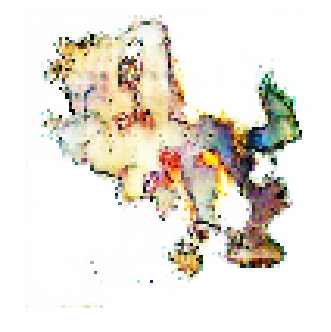


Epoch: 18000, D: -6.107, G: 5.819
Epoch: 18001, D: -5.738, G: 3.621
Epoch: 18002, D: -6.085, G: 5.161
Epoch: 18003, D: -5.2, G: 4.594
Epoch: 18004, D: -6.774, G: 3.024
Epoch: 18005, D: -6.004, G: 0.8937
Epoch: 18006, D: -5.765, G: 3.43
Epoch: 18007, D: -6.281, G: 4.243
Epoch: 18008, D: -7.611, G: 4.915
Epoch: 18009, D: -5.729, G: 3.157
Epoch: 18010, D: -6.053, G: 5.367
Epoch: 18011, D: -6.099, G: 5.445
Epoch: 18012, D: -4.959, G: 3.839
Epoch: 18013, D: -6.136, G: 2.343
Epoch: 18014, D: -7.297, G: 5.982
Epoch: 18015, D: -7.033, G: 4.433
Epoch: 18016, D: -5.595, G: 6.34
Epoch: 18017, D: -5.593, G: 2.366
Epoch: 18018, D: -5.882, G: 3.558
Epoch: 18019, D: -7.227, G: 0.632


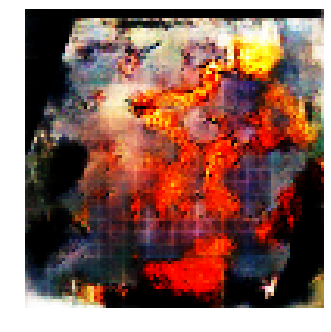


Epoch: 18020, D: -5.323, G: 2.334
Epoch: 18021, D: -5.931, G: 4.047
Epoch: 18022, D: -5.45, G: 2.838
Epoch: 18023, D: -5.178, G: 4.661
Epoch: 18024, D: -6.112, G: 4.344
Epoch: 18025, D: -6.394, G: 3.124
Epoch: 18026, D: -6.536, G: 1.788
Epoch: 18027, D: -5.166, G: 2.952
Epoch: 18028, D: -5.867, G: 4.348
Epoch: 18029, D: -6.721, G: 2.56
Epoch: 18030, D: -6.058, G: 1.562
Epoch: 18031, D: -6.005, G: 0.8734
Epoch: 18032, D: -6.583, G: 2.637
Epoch: 18033, D: -5.724, G: 2.626
Epoch: 18034, D: -5.764, G: 2.548
Epoch: 18035, D: -6.37, G: 4.559
Epoch: 18036, D: -5.624, G: 1.939
Epoch: 18037, D: -5.277, G: 2.901
Epoch: 18038, D: -6.993, G: 3.268
Epoch: 18039, D: -5.769, G: 0.7036


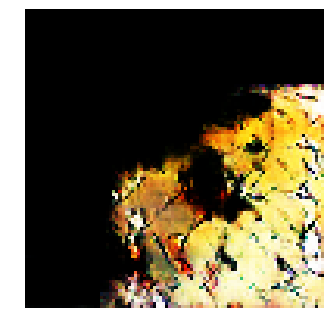


Epoch: 18040, D: -5.533, G: 4.313
Epoch: 18041, D: -7.684, G: 4.581
Epoch: 18042, D: -6.197, G: 3.79
Epoch: 18043, D: -6.397, G: 4.528
Epoch: 18044, D: -5.781, G: 2.748
Epoch: 18045, D: -6.438, G: 3.015
Epoch: 18046, D: -5.012, G: 2.764
Epoch: 18047, D: -6.424, G: 3.427
Epoch: 18048, D: -4.629, G: 5.823
Epoch: 18049, D: -6.304, G: 3.759
Epoch: 18050, D: -5.759, G: 4.023
Epoch: 18051, D: -6.971, G: 4.018
Epoch: 18052, D: -6.545, G: 3.249
Epoch: 18053, D: -4.838, G: 3.22
Epoch: 18054, D: -7.568, G: 4.266
Epoch: 18055, D: -6.184, G: 2.616
Epoch: 18056, D: -5.961, G: 2.699
Epoch: 18057, D: -4.955, G: 5.842
Epoch: 18058, D: -5.685, G: 3.585
Epoch: 18059, D: -5.296, G: 5.027


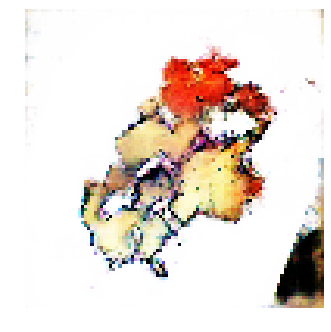


Epoch: 18060, D: -6.914, G: 2.243
Epoch: 18061, D: -5.54, G: 2.6
Epoch: 18062, D: -7.476, G: 5.019
Epoch: 18063, D: -5.898, G: 3.476
Epoch: 18064, D: -6.372, G: 5.416
Epoch: 18065, D: -6.176, G: 3.67
Epoch: 18066, D: -6.889, G: 4.026
Epoch: 18067, D: -5.971, G: 2.351
Epoch: 18068, D: -5.109, G: 1.965
Epoch: 18069, D: -6.529, G: 3.947
Epoch: 18070, D: -5.632, G: 4.5
Epoch: 18071, D: -4.621, G: 5.695
Epoch: 18072, D: -6.077, G: 4.425
Epoch: 18073, D: -6.466, G: 2.364
Epoch: 18074, D: -5.435, G: 3.875
Epoch: 18075, D: -5.07, G: 2.648
Epoch: 18076, D: -5.128, G: 1.211
Epoch: 18077, D: -4.82, G: 2.356
Epoch: 18078, D: -6.593, G: 3.583
Epoch: 18079, D: -5.97, G: 2.106


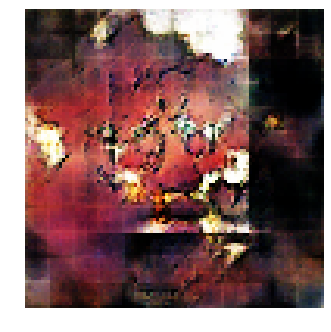


Epoch: 18080, D: -6.913, G: 5.192
Epoch: 18081, D: -5.448, G: 3.057
Epoch: 18082, D: -5.982, G: 3.55
Epoch: 18083, D: -6.461, G: 3.501
Epoch: 18084, D: -4.93, G: 4.442
Epoch: 18085, D: -5.367, G: 4.197
Epoch: 18086, D: -5.864, G: -0.7294
Epoch: 18087, D: -4.593, G: 4.735
Epoch: 18088, D: -5.467, G: 3.243
Epoch: 18089, D: -5.211, G: 4.135
Epoch: 18090, D: -5.775, G: 4.278
Epoch: 18091, D: -6.014, G: 5.077
Epoch: 18092, D: -6.889, G: 5.135
Epoch: 18093, D: -6.313, G: 3.484
Epoch: 18094, D: -6.617, G: 2.026
Epoch: 18095, D: -5.988, G: 5.302
Epoch: 18096, D: -5.837, G: 3.873
Epoch: 18097, D: -6.081, G: 7.59
Epoch: 18098, D: -5.372, G: 2.702
Epoch: 18099, D: -6.075, G: 4.106


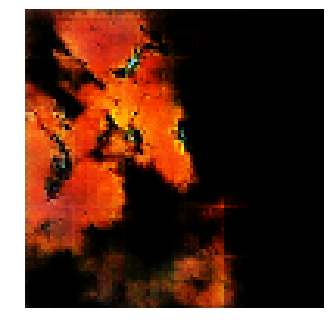


Epoch: 18100, D: -5.702, G: 3.697
Epoch: 18101, D: -5.307, G: 2.675
Epoch: 18102, D: -6.924, G: 3.619
Epoch: 18103, D: -6.78, G: 1.892
Epoch: 18104, D: -5.568, G: 3.19
Epoch: 18105, D: -7.28, G: 1.729
Epoch: 18106, D: -4.651, G: 2.966
Epoch: 18107, D: -4.924, G: 3.822
Epoch: 18108, D: -5.636, G: 3.452
Epoch: 18109, D: -5.878, G: 1.949
Epoch: 18110, D: -6.507, G: 0.8887
Epoch: 18111, D: -7.34, G: 1.428
Epoch: 18112, D: -5.344, G: 4.946
Epoch: 18113, D: -5.43, G: 2.074
Epoch: 18114, D: -5.432, G: 3.807
Epoch: 18115, D: -5.913, G: 5.549
Epoch: 18116, D: -7.251, G: 4.257
Epoch: 18117, D: -6.46, G: 3.652
Epoch: 18118, D: -5.583, G: 2.611
Epoch: 18119, D: -5.495, G: 2.503


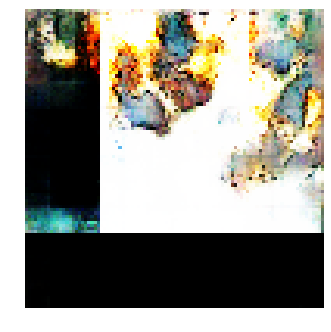


Epoch: 18120, D: -6.1, G: 2.989
Epoch: 18121, D: -7.203, G: 6.136
Epoch: 18122, D: -5.614, G: 4.301
Epoch: 18123, D: -6.345, G: 3.958
Epoch: 18124, D: -5.699, G: 4.768
Epoch: 18125, D: -6.371, G: 4.968
Epoch: 18126, D: -5.625, G: 5.314
Epoch: 18127, D: -5.479, G: 1.34
Epoch: 18128, D: -4.827, G: 4.695
Epoch: 18129, D: -5.897, G: 5.115
Epoch: 18130, D: -5.334, G: 4.968
Epoch: 18131, D: -7.201, G: 2.533
Epoch: 18132, D: -8.039, G: 3.063
Epoch: 18133, D: -6.696, G: 2.283
Epoch: 18134, D: -7.876, G: 3.887
Epoch: 18135, D: -6.341, G: 1.804
Epoch: 18136, D: -7.014, G: 4.125
Epoch: 18137, D: -6.208, G: 1.926
Epoch: 18138, D: -6.088, G: 3.963
Epoch: 18139, D: -5.487, G: 2.72


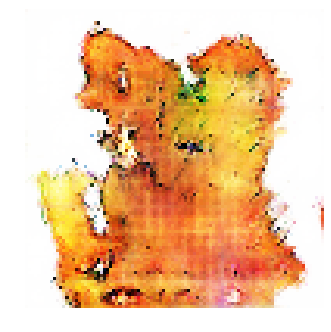


Epoch: 18140, D: -5.165, G: 5.015
Epoch: 18141, D: -6.356, G: 2.66
Epoch: 18142, D: -6.377, G: 6.056
Epoch: 18143, D: -7.61, G: 2.033
Epoch: 18144, D: -6.259, G: 4.1
Epoch: 18145, D: -6.182, G: 4.107
Epoch: 18146, D: -6.471, G: 3.249
Epoch: 18147, D: -5.701, G: 4.125
Epoch: 18148, D: -5.647, G: 5.553
Epoch: 18149, D: -5.825, G: 3.271
Epoch: 18150, D: -6.177, G: 1.511
Epoch: 18151, D: -6.337, G: 2.17
Epoch: 18152, D: -5.692, G: 3.599
Epoch: 18153, D: -6.594, G: 6.342
Epoch: 18154, D: -6.494, G: 3.237
Epoch: 18155, D: -5.486, G: 4.431
Epoch: 18156, D: -5.126, G: 3.798
Epoch: 18157, D: -6.194, G: 2.831
Epoch: 18158, D: -6.411, G: 3.59
Epoch: 18159, D: -4.547, G: 4.211


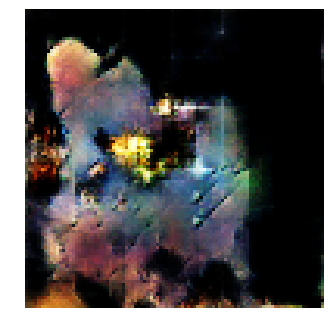


Epoch: 18160, D: -6.047, G: 3.222
Epoch: 18161, D: -6.323, G: 3.117
Epoch: 18162, D: -5.324, G: 5.16
Epoch: 18163, D: -4.804, G: 4.116
Epoch: 18164, D: -6.144, G: 5.648
Epoch: 18165, D: -7.418, G: 4.151
Epoch: 18166, D: -7.009, G: 3.713
Epoch: 18167, D: -6.68, G: 1.159
Epoch: 18168, D: -5.347, G: 4.545
Epoch: 18169, D: -7.368, G: 4.807
Epoch: 18170, D: -6.811, G: 2.825
Epoch: 18171, D: -6.095, G: 2.984
Epoch: 18172, D: -6.4, G: 2.818
Epoch: 18173, D: -6.384, G: 3.342
Epoch: 18174, D: -7.235, G: 4.511
Epoch: 18175, D: -7.377, G: 2.753
Epoch: 18176, D: -4.528, G: 1.167
Epoch: 18177, D: -6.077, G: 1.7
Epoch: 18178, D: -5.383, G: 0.57
Epoch: 18179, D: -5.881, G: 2.214


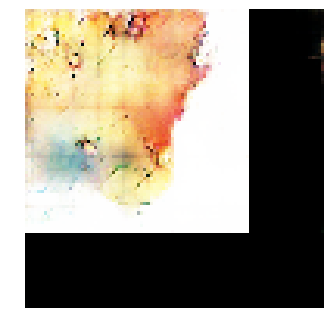


Epoch: 18180, D: -5.834, G: 2.557
Epoch: 18181, D: -6.253, G: 5.711
Epoch: 18182, D: -6.102, G: 2.685
Epoch: 18183, D: -6.213, G: 1.077
Epoch: 18184, D: -5.759, G: 3.568
Epoch: 18185, D: -5.404, G: 3.993
Epoch: 18186, D: -4.967, G: 4.345
Epoch: 18187, D: -7.847, G: 4.756
Epoch: 18188, D: -5.121, G: 3.013
Epoch: 18189, D: -6.128, G: 3.374
Epoch: 18190, D: -5.8, G: 4.494
Epoch: 18191, D: -6.276, G: 4.87
Epoch: 18192, D: -5.691, G: 2.413
Epoch: 18193, D: -6.255, G: 2.964
Epoch: 18194, D: -6.372, G: 2.357
Epoch: 18195, D: -5.7, G: 3.702
Epoch: 18196, D: -5.567, G: 5.792
Epoch: 18197, D: -5.415, G: 4.228
Epoch: 18198, D: -5.008, G: 3.821
Epoch: 18199, D: -6.065, G: 4.882


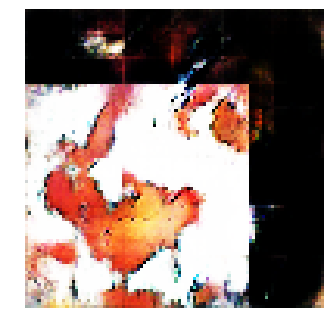


Epoch: 18200, D: -4.582, G: 4.612
Epoch: 18201, D: -7.088, G: 4.515
Epoch: 18202, D: -5.152, G: 4.559
Epoch: 18203, D: -6.121, G: 5.003
Epoch: 18204, D: -3.928, G: 3.59
Epoch: 18205, D: -5.759, G: 4.209
Epoch: 18206, D: -6.682, G: 3.185
Epoch: 18207, D: -6.306, G: 3.267
Epoch: 18208, D: -5.219, G: 5.123
Epoch: 18209, D: -5.945, G: 5.839
Epoch: 18210, D: -7.083, G: 4.799
Epoch: 18211, D: -5.421, G: 2.082
Epoch: 18212, D: -6.873, G: -0.06859
Epoch: 18213, D: -4.654, G: 1.529
Epoch: 18214, D: -5.149, G: 3.433
Epoch: 18215, D: -5.535, G: 3.149
Epoch: 18216, D: -6.264, G: 4.179
Epoch: 18217, D: -5.491, G: 2.639
Epoch: 18218, D: -7.151, G: 3.184
Epoch: 18219, D: -6.958, G: 2.205


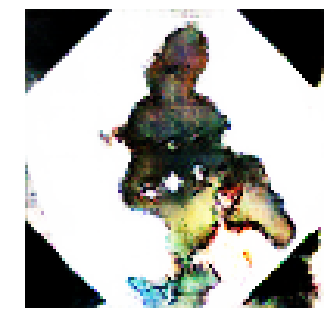


Epoch: 18220, D: -6.258, G: 4.38
Epoch: 18221, D: -6.416, G: 3.728
Epoch: 18222, D: -6.921, G: 4.172
Epoch: 18223, D: -5.878, G: 3.999
Epoch: 18224, D: -6.578, G: 4.141
Epoch: 18225, D: -5.89, G: 4.314
Epoch: 18226, D: -6.623, G: 3.262
Epoch: 18227, D: -6.916, G: 3.588
Epoch: 18228, D: -6.531, G: 3.077
Epoch: 18229, D: -6.638, G: 5.459
Epoch: 18230, D: -6.289, G: 4.574
Epoch: 18231, D: -6.426, G: 3.552
Epoch: 18232, D: -7.211, G: 2.983
Epoch: 18233, D: -6.362, G: 2.591
Epoch: 18234, D: -5.789, G: 5.12
Epoch: 18235, D: -6.619, G: 4.938
Epoch: 18236, D: -6.45, G: 2.374
Epoch: 18237, D: -7.175, G: 4.093
Epoch: 18238, D: -5.559, G: 3.587
Epoch: 18239, D: -5.725, G: 3.386


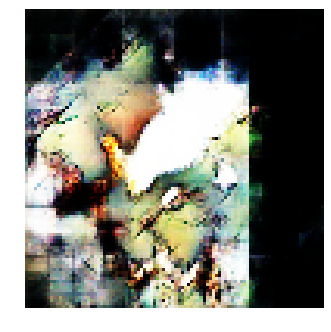


Epoch: 18240, D: -5.915, G: 4.566
Epoch: 18241, D: -6.592, G: 5.593
Epoch: 18242, D: -5.612, G: 3.381
Epoch: 18243, D: -5.167, G: 4.247
Epoch: 18244, D: -6.326, G: 3.293
Epoch: 18245, D: -6.045, G: 1.625
Epoch: 18246, D: -6.544, G: 1.573
Epoch: 18247, D: -5.925, G: 1.839
Epoch: 18248, D: -7.236, G: 4.812
Epoch: 18249, D: -5.936, G: 3.888
Epoch: 18250, D: -5.727, G: 3.877
Epoch: 18251, D: -6.284, G: 2.498
Epoch: 18252, D: -6.484, G: 5.656
Epoch: 18253, D: -4.519, G: 5.896
Epoch: 18254, D: -5.769, G: 3.279
Epoch: 18255, D: -6.107, G: 2.164
Epoch: 18256, D: -4.372, G: 4.96
Epoch: 18257, D: -5.158, G: 2.216
Epoch: 18258, D: -5.764, G: 3.571
Epoch: 18259, D: -6.85, G: 5.065


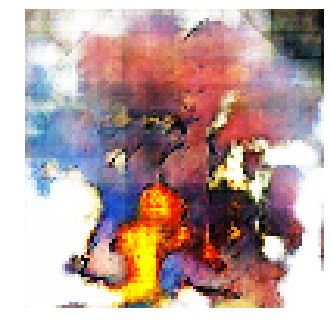


Epoch: 18260, D: -6.084, G: 2.273
Epoch: 18261, D: -6.257, G: 1.954
Epoch: 18262, D: -6.937, G: 1.461
Epoch: 18263, D: -5.319, G: 1.256
Epoch: 18264, D: -6.114, G: 3.579
Epoch: 18265, D: -6.601, G: 2.747
Epoch: 18266, D: -5.56, G: 2.162
Epoch: 18267, D: -6.26, G: 3.005
Epoch: 18268, D: -6.473, G: 2.554
Epoch: 18269, D: -6.071, G: 3.792
Epoch: 18270, D: -5.392, G: 3.905
Epoch: 18271, D: -5.334, G: 4.98
Epoch: 18272, D: -5.834, G: 5.193
Epoch: 18273, D: -5.559, G: 4.101
Epoch: 18274, D: -5.297, G: 5.797
Epoch: 18275, D: -7.208, G: 5.344
Epoch: 18276, D: -6.232, G: 1.759
Epoch: 18277, D: -5.68, G: 4.596
Epoch: 18278, D: -7.532, G: 4.792
Epoch: 18279, D: -5.735, G: 3.608


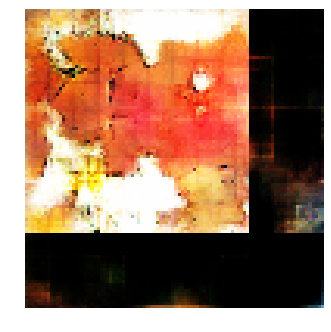


Epoch: 18280, D: -5.3, G: 4.435
Epoch: 18281, D: -6.776, G: 4.161
Epoch: 18282, D: -5.345, G: 2.546
Epoch: 18283, D: -5.161, G: 3.422
Epoch: 18284, D: -5.506, G: 1.718
Epoch: 18285, D: -5.655, G: 3.715
Epoch: 18286, D: -5.554, G: 2.943
Epoch: 18287, D: -5.84, G: 3.314
Epoch: 18288, D: -5.615, G: 5.275
Epoch: 18289, D: -4.948, G: 5.18
Epoch: 18290, D: -5.214, G: 3.512
Epoch: 18291, D: -6.532, G: 3.466
Epoch: 18292, D: -6.257, G: 2.121
Epoch: 18293, D: -5.947, G: -0.3644
Epoch: 18294, D: -6.962, G: 3.216
Epoch: 18295, D: -6.56, G: 3.711
Epoch: 18296, D: -4.76, G: 4.351
Epoch: 18297, D: -5.264, G: 6.716
Epoch: 18298, D: -5.566, G: 4.563
Epoch: 18299, D: -6.449, G: 3.85


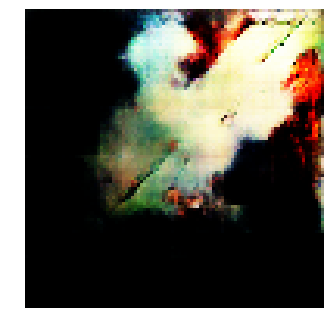


Epoch: 18300, D: -5.886, G: 2.242
Epoch: 18301, D: -7.34, G: 3.727
Epoch: 18302, D: -6.394, G: 3.307
Epoch: 18303, D: -6.205, G: 4.728
Epoch: 18304, D: -6.42, G: 4.107
Epoch: 18305, D: -5.794, G: 3.271
Epoch: 18306, D: -6.955, G: 3.398
Epoch: 18307, D: -6.579, G: 1.823
Epoch: 18308, D: -5.486, G: 2.202
Epoch: 18309, D: -5.596, G: 2.29
Epoch: 18310, D: -6.275, G: 2.955
Epoch: 18311, D: -6.12, G: 0.9097
Epoch: 18312, D: -6.264, G: 3.193
Epoch: 18313, D: -6.185, G: 4.921
Epoch: 18314, D: -5.609, G: 7.09
Epoch: 18315, D: -7.299, G: 5.205
Epoch: 18316, D: -6.124, G: 3.885
Epoch: 18317, D: -6.602, G: 3.486
Epoch: 18318, D: -6.834, G: 2.744
Epoch: 18319, D: -6.398, G: 1.318


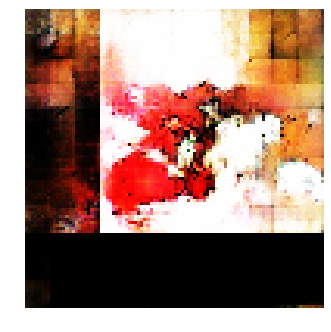


Epoch: 18320, D: -6.627, G: 4.706
Epoch: 18321, D: -5.881, G: 3.559
Epoch: 18322, D: -7.207, G: 3.77
Epoch: 18323, D: -5.124, G: 2.652
Epoch: 18324, D: -5.317, G: 2.437
Epoch: 18325, D: -7.059, G: 3.735
Epoch: 18326, D: -3.934, G: 3.22
Epoch: 18327, D: -5.231, G: 3.034
Epoch: 18328, D: -5.723, G: 5.168
Epoch: 18329, D: -6.667, G: 3.048
Epoch: 18330, D: -5.922, G: 3.656
Epoch: 18331, D: -6.5, G: 4.989
Epoch: 18332, D: -5.731, G: 3.334
Epoch: 18333, D: -5.731, G: 4.807
Epoch: 18334, D: -6.619, G: 4.232
Epoch: 18335, D: -5.211, G: 3.158
Epoch: 18336, D: -5.9, G: 2.896
Epoch: 18337, D: -7.583, G: 4.93
Epoch: 18338, D: -5.413, G: 2.877
Epoch: 18339, D: -7.619, G: 3.444


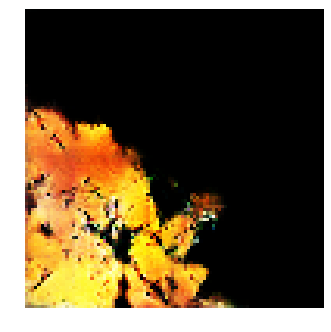


Epoch: 18340, D: -6.313, G: -0.4826
Epoch: 18341, D: -5.641, G: 2.85
Epoch: 18342, D: -5.743, G: 5.145
Epoch: 18343, D: -5.677, G: 2.119
Epoch: 18344, D: -5.638, G: 4.409
Epoch: 18345, D: -5.196, G: 2.319
Epoch: 18346, D: -6.442, G: 1.842
Epoch: 18347, D: -5.908, G: 6.407
Epoch: 18348, D: -6.558, G: 0.5692
Epoch: 18349, D: -5.764, G: 2.817
Epoch: 18350, D: -5.748, G: 3.966
Epoch: 18351, D: -5.369, G: 3.625
Epoch: 18352, D: -5.681, G: 3.248
Epoch: 18353, D: -5.623, G: 2.737
Epoch: 18354, D: -6.926, G: 4.892
Epoch: 18355, D: -7.449, G: 2.156
Epoch: 18356, D: -5.887, G: 3.748
Epoch: 18357, D: -6.132, G: 4.194
Epoch: 18358, D: -6.262, G: 3.724
Epoch: 18359, D: -5.79, G: 3.422


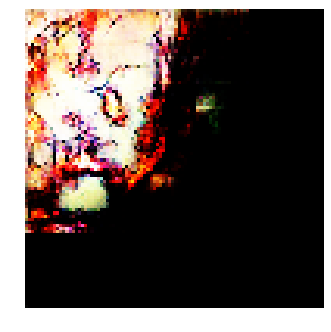


Epoch: 18360, D: -5.246, G: 4.207
Epoch: 18361, D: -5.669, G: 2.307
Epoch: 18362, D: -6.72, G: 3.358
Epoch: 18363, D: -5.357, G: 2.306
Epoch: 18364, D: -7.787, G: 2.244
Epoch: 18365, D: -6.554, G: 4.43
Epoch: 18366, D: -5.981, G: 3.668
Epoch: 18367, D: -6.636, G: 4.323
Epoch: 18368, D: -5.0, G: 3.366
Epoch: 18369, D: -5.904, G: 3.303
Epoch: 18370, D: -5.649, G: 4.508
Epoch: 18371, D: -5.755, G: 2.503
Epoch: 18372, D: -5.579, G: 2.174
Epoch: 18373, D: -5.406, G: 1.866
Epoch: 18374, D: -5.767, G: 4.479
Epoch: 18375, D: -6.811, G: 2.794
Epoch: 18376, D: -5.542, G: 2.669
Epoch: 18377, D: -4.881, G: 1.189
Epoch: 18378, D: -7.268, G: 2.325
Epoch: 18379, D: -6.83, G: 4.564


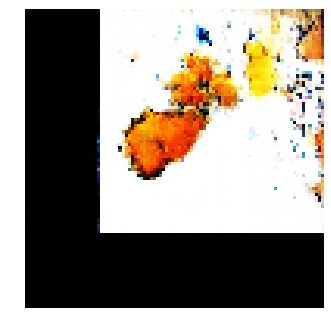


Epoch: 18380, D: -6.682, G: 3.488
Epoch: 18381, D: -7.046, G: 3.456
Epoch: 18382, D: -5.612, G: 4.604
Epoch: 18383, D: -5.629, G: 3.934
Epoch: 18384, D: -6.824, G: 4.577
Epoch: 18385, D: -6.874, G: 3.842
Epoch: 18386, D: -7.216, G: 4.777
Epoch: 18387, D: -5.063, G: 5.189
Epoch: 18388, D: -4.915, G: 4.836
Epoch: 18389, D: -5.364, G: 4.872
Epoch: 18390, D: -6.592, G: 4.159
Epoch: 18391, D: -5.586, G: 2.888
Epoch: 18392, D: -6.002, G: 3.765
Epoch: 18393, D: -6.103, G: 4.849
Epoch: 18394, D: -6.75, G: 3.724
Epoch: 18395, D: -5.208, G: 3.503
Epoch: 18396, D: -6.33, G: 4.034
Epoch: 18397, D: -5.123, G: 4.287
Epoch: 18398, D: -6.127, G: 4.288
Epoch: 18399, D: -7.038, G: 3.855


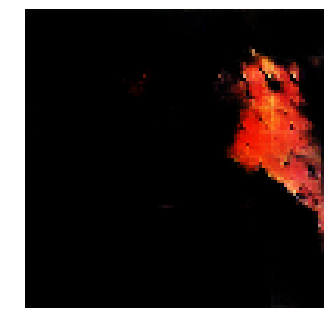


Epoch: 18400, D: -5.001, G: 3.516
Epoch: 18401, D: -6.749, G: 2.642
Epoch: 18402, D: -7.691, G: 3.723
Epoch: 18403, D: -6.166, G: 2.351
Epoch: 18404, D: -6.148, G: 1.639
Epoch: 18405, D: -5.635, G: 1.671
Epoch: 18406, D: -4.448, G: 4.345
Epoch: 18407, D: -6.876, G: 3.557
Epoch: 18408, D: -6.127, G: 2.305
Epoch: 18409, D: -7.645, G: 2.519
Epoch: 18410, D: -6.696, G: 6.133
Epoch: 18411, D: -5.177, G: 5.083
Epoch: 18412, D: -6.308, G: 5.316
Epoch: 18413, D: -6.682, G: 5.804
Epoch: 18414, D: -8.145, G: 2.671
Epoch: 18415, D: -5.607, G: 5.19
Epoch: 18416, D: -5.835, G: 4.876
Epoch: 18417, D: -7.166, G: 3.947
Epoch: 18418, D: -5.509, G: 1.597
Epoch: 18419, D: -5.661, G: 4.268


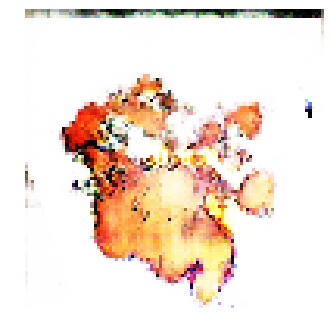


Epoch: 18420, D: -5.412, G: 2.274
Epoch: 18421, D: -6.39, G: 4.07
Epoch: 18422, D: -5.415, G: 4.336
Epoch: 18423, D: -6.212, G: 1.329
Epoch: 18424, D: -7.223, G: 2.668
Epoch: 18425, D: -7.004, G: 4.226
Epoch: 18426, D: -5.989, G: 4.803
Epoch: 18427, D: -5.469, G: 5.776
Epoch: 18428, D: -6.775, G: 2.159
Epoch: 18429, D: -6.551, G: 5.474
Epoch: 18430, D: -6.081, G: 4.642
Epoch: 18431, D: -5.425, G: 3.976
Epoch: 18432, D: -5.548, G: 5.478
Epoch: 18433, D: -5.717, G: 2.85
Epoch: 18434, D: -5.783, G: 4.799
Epoch: 18435, D: -6.377, G: 3.282
Epoch: 18436, D: -6.05, G: 4.547
Epoch: 18437, D: -5.763, G: 5.716
Epoch: 18438, D: -5.421, G: 1.958
Epoch: 18439, D: -6.654, G: 5.897


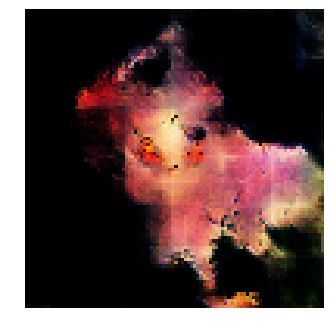


Epoch: 18440, D: -5.072, G: 3.503
Epoch: 18441, D: -5.101, G: 3.781
Epoch: 18442, D: -5.323, G: 3.241
Epoch: 18443, D: -5.756, G: 4.747
Epoch: 18444, D: -5.995, G: 3.432
Epoch: 18445, D: -5.085, G: 3.555
Epoch: 18446, D: -5.025, G: 4.006
Epoch: 18447, D: -5.949, G: 7.275
Epoch: 18448, D: -5.821, G: 2.146
Epoch: 18449, D: -5.577, G: 3.816
Epoch: 18450, D: -7.028, G: 2.547
Epoch: 18451, D: -6.174, G: 2.088
Epoch: 18452, D: -5.402, G: 3.98
Epoch: 18453, D: -7.224, G: 5.431
Epoch: 18454, D: -5.243, G: 2.63
Epoch: 18455, D: -7.536, G: 4.421
Epoch: 18456, D: -6.497, G: 0.4878
Epoch: 18457, D: -6.618, G: 4.209
Epoch: 18458, D: -5.622, G: 3.314
Epoch: 18459, D: -7.131, G: 2.336


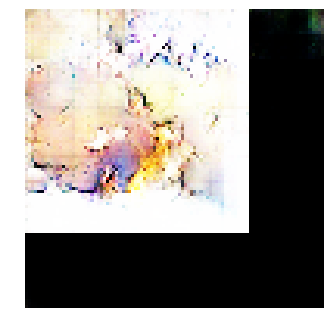


Epoch: 18460, D: -6.216, G: 1.395
Epoch: 18461, D: -4.798, G: 3.228
Epoch: 18462, D: -4.689, G: 2.951
Epoch: 18463, D: -5.378, G: 2.584
Epoch: 18464, D: -5.669, G: 1.964
Epoch: 18465, D: -5.517, G: 3.326
Epoch: 18466, D: -5.785, G: 2.47
Epoch: 18467, D: -5.839, G: 2.757
Epoch: 18468, D: -7.115, G: 2.39
Epoch: 18469, D: -7.04, G: 4.102
Epoch: 18470, D: -6.06, G: 1.894
Epoch: 18471, D: -5.921, G: 4.996
Epoch: 18472, D: -6.122, G: 1.899
Epoch: 18473, D: -6.18, G: 3.5
Epoch: 18474, D: -6.658, G: 2.854
Epoch: 18475, D: -6.283, G: 2.153
Epoch: 18476, D: -6.741, G: 2.283
Epoch: 18477, D: -5.727, G: 4.913
Epoch: 18478, D: -4.732, G: 4.261
Epoch: 18479, D: -6.489, G: 3.71


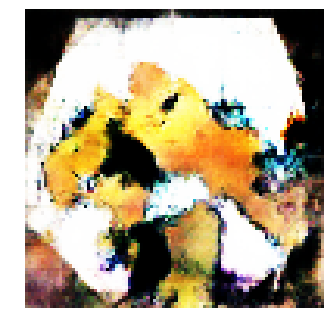


Epoch: 18480, D: -5.914, G: 3.188
Epoch: 18481, D: -5.28, G: 1.908
Epoch: 18482, D: -6.318, G: 3.568
Epoch: 18483, D: -6.178, G: 3.973
Epoch: 18484, D: -7.233, G: 4.965
Epoch: 18485, D: -7.011, G: 2.678
Epoch: 18486, D: -6.073, G: 4.001
Epoch: 18487, D: -5.471, G: 4.942
Epoch: 18488, D: -5.967, G: 4.462
Epoch: 18489, D: -6.772, G: 2.848
Epoch: 18490, D: -5.822, G: 3.503
Epoch: 18491, D: -6.137, G: 3.367
Epoch: 18492, D: -6.196, G: 5.937
Epoch: 18493, D: -6.727, G: 4.895
Epoch: 18494, D: -4.863, G: 3.104
Epoch: 18495, D: -5.308, G: 3.705
Epoch: 18496, D: -6.334, G: 4.86
Epoch: 18497, D: -4.029, G: 1.323
Epoch: 18498, D: -5.815, G: 4.069
Epoch: 18499, D: -6.741, G: 3.203


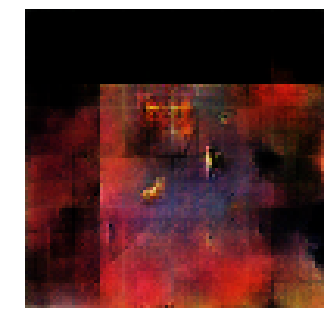


Epoch: 18500, D: -5.487, G: 1.709
Epoch: 18501, D: -5.949, G: 1.051
Epoch: 18502, D: -7.03, G: 6.548
Epoch: 18503, D: -6.839, G: 4.181
Epoch: 18504, D: -4.407, G: 3.935
Epoch: 18505, D: -7.71, G: 4.948
Epoch: 18506, D: -6.16, G: 2.899
Epoch: 18507, D: -5.988, G: 3.943
Epoch: 18508, D: -6.186, G: 4.866
Epoch: 18509, D: -5.472, G: 4.238
Epoch: 18510, D: -6.24, G: 3.031
Epoch: 18511, D: -6.075, G: 7.18
Epoch: 18512, D: -5.587, G: 2.34
Epoch: 18513, D: -7.102, G: 3.517
Epoch: 18514, D: -5.365, G: 2.501
Epoch: 18515, D: -6.451, G: 5.872
Epoch: 18516, D: -6.608, G: 7.163
Epoch: 18517, D: -6.444, G: 3.566
Epoch: 18518, D: -6.337, G: 3.052
Epoch: 18519, D: -5.157, G: 2.202


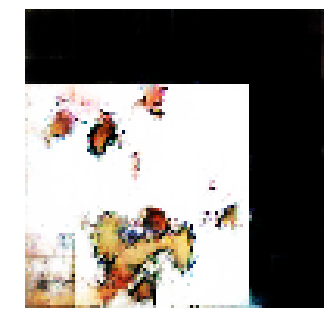


Epoch: 18520, D: -5.865, G: 4.023
Epoch: 18521, D: -6.233, G: 4.232
Epoch: 18522, D: -5.749, G: 3.416
Epoch: 18523, D: -7.157, G: 5.141
Epoch: 18524, D: -6.863, G: 3.812
Epoch: 18525, D: -5.392, G: 5.179
Epoch: 18526, D: -6.252, G: 4.58
Epoch: 18527, D: -5.479, G: 4.278
Epoch: 18528, D: -5.646, G: 3.985
Epoch: 18529, D: -5.934, G: 4.081
Epoch: 18530, D: -6.776, G: 2.75
Epoch: 18531, D: -4.361, G: 1.234
Epoch: 18532, D: -6.183, G: 3.674
Epoch: 18533, D: -6.997, G: 2.339
Epoch: 18534, D: -7.076, G: 3.099
Epoch: 18535, D: -6.713, G: 4.738
Epoch: 18536, D: -6.632, G: 2.542
Epoch: 18537, D: -5.579, G: 5.211
Epoch: 18538, D: -6.821, G: 3.939
Epoch: 18539, D: -5.006, G: 2.14


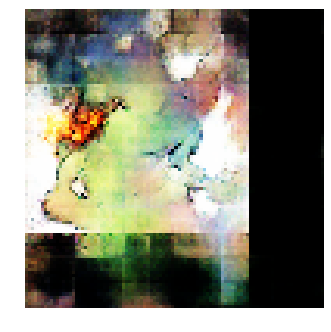


Epoch: 18540, D: -5.63, G: 2.192
Epoch: 18541, D: -5.232, G: 1.427
Epoch: 18542, D: -5.396, G: 2.537
Epoch: 18543, D: -5.754, G: 1.865
Epoch: 18544, D: -6.834, G: 3.309
Epoch: 18545, D: -6.503, G: 3.181
Epoch: 18546, D: -4.407, G: 5.594
Epoch: 18547, D: -5.973, G: 5.843
Epoch: 18548, D: -5.762, G: 3.49
Epoch: 18549, D: -5.41, G: 4.181
Epoch: 18550, D: -6.981, G: 4.999
Epoch: 18551, D: -4.647, G: 2.16
Epoch: 18552, D: -5.862, G: 5.189
Epoch: 18553, D: -6.684, G: 2.832
Epoch: 18554, D: -5.528, G: 2.596
Epoch: 18555, D: -6.174, G: 4.504
Epoch: 18556, D: -5.678, G: 5.003
Epoch: 18557, D: -5.846, G: 6.679
Epoch: 18558, D: -6.186, G: 3.204
Epoch: 18559, D: -6.942, G: 3.572


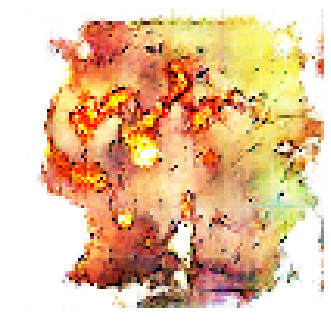


Epoch: 18560, D: -6.213, G: 3.339
Epoch: 18561, D: -6.106, G: 1.412
Epoch: 18562, D: -5.082, G: 3.801
Epoch: 18563, D: -7.041, G: 4.476
Epoch: 18564, D: -6.333, G: 2.626
Epoch: 18565, D: -5.35, G: 5.58
Epoch: 18566, D: -5.815, G: 2.72
Epoch: 18567, D: -6.855, G: 2.179
Epoch: 18568, D: -6.868, G: 2.434
Epoch: 18569, D: -6.041, G: 5.219
Epoch: 18570, D: -6.559, G: 2.234
Epoch: 18571, D: -6.412, G: 3.809
Epoch: 18572, D: -6.22, G: 4.461
Epoch: 18573, D: -6.441, G: 3.921
Epoch: 18574, D: -5.114, G: 5.551
Epoch: 18575, D: -5.562, G: 4.26
Epoch: 18576, D: -6.109, G: 4.305
Epoch: 18577, D: -5.769, G: 4.751
Epoch: 18578, D: -5.667, G: 3.343
Epoch: 18579, D: -4.995, G: 4.417


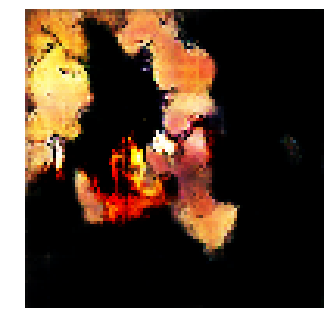


Epoch: 18580, D: -5.85, G: 4.953
Epoch: 18581, D: -7.487, G: 4.898
Epoch: 18582, D: -6.404, G: 2.492
Epoch: 18583, D: -7.117, G: 5.231
Epoch: 18584, D: -6.706, G: 2.126
Epoch: 18585, D: -5.54, G: 3.965
Epoch: 18586, D: -7.049, G: 2.784
Epoch: 18587, D: -6.957, G: 2.565
Epoch: 18588, D: -6.077, G: 4.628
Epoch: 18589, D: -5.899, G: 5.681
Epoch: 18590, D: -4.849, G: 4.92
Epoch: 18591, D: -6.086, G: 4.275
Epoch: 18592, D: -6.847, G: 7.638
Epoch: 18593, D: -5.502, G: 3.867
Epoch: 18594, D: -6.122, G: 4.962
Epoch: 18595, D: -6.559, G: 4.834
Epoch: 18596, D: -6.591, G: 5.851
Epoch: 18597, D: -4.599, G: 4.31
Epoch: 18598, D: -5.036, G: 5.813
Epoch: 18599, D: -6.343, G: 3.617


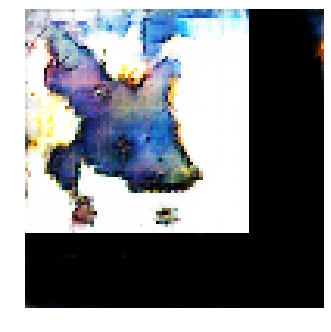


Epoch: 18600, D: -6.016, G: 5.632
Epoch: 18601, D: -5.951, G: 5.139
Epoch: 18602, D: -5.767, G: 5.617
Epoch: 18603, D: -4.521, G: 3.808
Epoch: 18604, D: -4.781, G: 3.885
Epoch: 18605, D: -5.491, G: 2.952
Epoch: 18606, D: -5.637, G: 5.063
Epoch: 18607, D: -4.851, G: 2.283
Epoch: 18608, D: -5.774, G: 2.91
Epoch: 18609, D: -6.442, G: 3.881
Epoch: 18610, D: -6.273, G: 3.88
Epoch: 18611, D: -4.805, G: 2.816
Epoch: 18612, D: -5.675, G: 2.39
Epoch: 18613, D: -5.515, G: 4.848
Epoch: 18614, D: -4.713, G: 6.437
Epoch: 18615, D: -6.386, G: 1.408
Epoch: 18616, D: -5.716, G: 3.253
Epoch: 18617, D: -6.048, G: 3.147
Epoch: 18618, D: -5.381, G: 5.363
Epoch: 18619, D: -6.46, G: 5.079


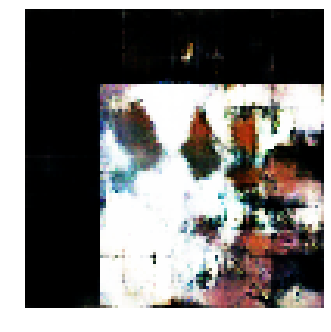


Epoch: 18620, D: -5.585, G: 2.292
Epoch: 18621, D: -7.064, G: 2.705
Epoch: 18622, D: -5.268, G: 5.482
Epoch: 18623, D: -7.209, G: 4.637
Epoch: 18624, D: -7.488, G: 4.916
Epoch: 18625, D: -6.147, G: 3.026
Epoch: 18626, D: -6.602, G: 4.674
Epoch: 18627, D: -4.788, G: 3.293
Epoch: 18628, D: -6.42, G: 4.478
Epoch: 18629, D: -6.207, G: 4.189
Epoch: 18630, D: -6.56, G: 3.937
Epoch: 18631, D: -6.11, G: 2.543
Epoch: 18632, D: -5.601, G: 4.312
Epoch: 18633, D: -6.819, G: 6.885
Epoch: 18634, D: -6.411, G: 4.469
Epoch: 18635, D: -5.861, G: 2.385
Epoch: 18636, D: -5.612, G: 3.379
Epoch: 18637, D: -5.27, G: 3.331
Epoch: 18638, D: -4.82, G: 2.79
Epoch: 18639, D: -7.121, G: 5.031


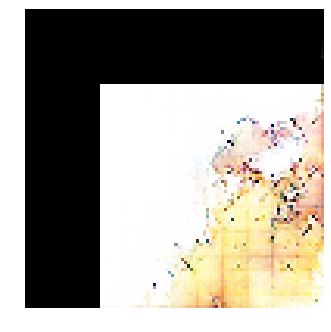


Epoch: 18640, D: -7.303, G: 2.713
Epoch: 18641, D: -5.051, G: 3.622
Epoch: 18642, D: -5.56, G: 4.636
Epoch: 18643, D: -6.734, G: 4.303
Epoch: 18644, D: -5.337, G: 3.246
Epoch: 18645, D: -6.851, G: 2.13
Epoch: 18646, D: -5.283, G: 4.182
Epoch: 18647, D: -6.478, G: 5.14
Epoch: 18648, D: -6.999, G: 2.751
Epoch: 18649, D: -5.72, G: 3.991
Epoch: 18650, D: -5.984, G: 2.64
Epoch: 18651, D: -6.558, G: 5.092
Epoch: 18652, D: -5.367, G: 4.213
Epoch: 18653, D: -5.63, G: 3.541
Epoch: 18654, D: -6.873, G: 4.783
Epoch: 18655, D: -5.399, G: 1.66
Epoch: 18656, D: -6.403, G: 3.226
Epoch: 18657, D: -6.002, G: 3.426
Epoch: 18658, D: -7.512, G: 2.775
Epoch: 18659, D: -4.713, G: 3.617


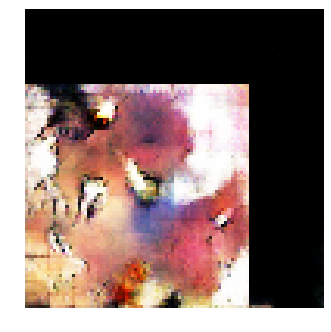


Epoch: 18660, D: -6.291, G: 5.168
Epoch: 18661, D: -6.13, G: 3.704
Epoch: 18662, D: -5.713, G: 2.422
Epoch: 18663, D: -5.784, G: 5.238
Epoch: 18664, D: -5.281, G: 4.119
Epoch: 18665, D: -6.101, G: 2.85
Epoch: 18666, D: -5.909, G: 5.199
Epoch: 18667, D: -6.127, G: 2.631
Epoch: 18668, D: -7.375, G: 1.678
Epoch: 18669, D: -5.394, G: 5.112
Epoch: 18670, D: -6.01, G: 5.545
Epoch: 18671, D: -5.26, G: 3.714
Epoch: 18672, D: -6.472, G: 4.899
Epoch: 18673, D: -5.26, G: 4.744
Epoch: 18674, D: -6.124, G: 3.508
Epoch: 18675, D: -5.985, G: 3.386
Epoch: 18676, D: -6.818, G: 1.576
Epoch: 18677, D: -4.625, G: 3.238
Epoch: 18678, D: -5.636, G: 5.766
Epoch: 18679, D: -4.532, G: 4.602


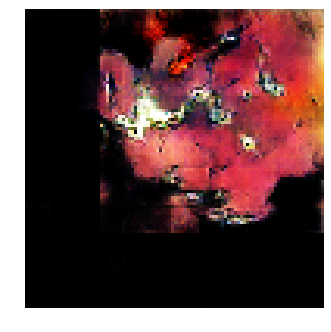


Epoch: 18680, D: -5.063, G: 3.986
Epoch: 18681, D: -6.01, G: 5.201
Epoch: 18682, D: -6.049, G: 3.478
Epoch: 18683, D: -6.266, G: 4.37
Epoch: 18684, D: -4.749, G: 3.551
Epoch: 18685, D: -6.127, G: 2.627
Epoch: 18686, D: -6.689, G: 4.485
Epoch: 18687, D: -6.899, G: 2.511
Epoch: 18688, D: -5.137, G: 1.987
Epoch: 18689, D: -5.917, G: 4.587
Epoch: 18690, D: -6.752, G: 2.551
Epoch: 18691, D: -5.268, G: 3.791
Epoch: 18692, D: -5.823, G: 5.0
Epoch: 18693, D: -7.405, G: 1.05
Epoch: 18694, D: -6.745, G: 2.247
Epoch: 18695, D: -6.223, G: 2.821
Epoch: 18696, D: -5.092, G: 3.08
Epoch: 18697, D: -6.07, G: 3.994
Epoch: 18698, D: -6.071, G: 1.538
Epoch: 18699, D: -5.876, G: 5.616


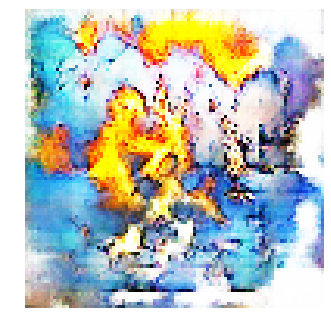


Epoch: 18700, D: -5.567, G: 0.9386
Epoch: 18701, D: -5.378, G: 5.105
Epoch: 18702, D: -6.033, G: 2.701
Epoch: 18703, D: -6.574, G: 2.12
Epoch: 18704, D: -6.032, G: 1.267
Epoch: 18705, D: -7.446, G: 3.594
Epoch: 18706, D: -5.324, G: 4.126
Epoch: 18707, D: -6.014, G: 2.782
Epoch: 18708, D: -5.695, G: 5.267
Epoch: 18709, D: -5.766, G: 3.825
Epoch: 18710, D: -6.685, G: 4.503
Epoch: 18711, D: -6.122, G: 4.19
Epoch: 18712, D: -5.619, G: 2.595
Epoch: 18713, D: -5.557, G: 3.102
Epoch: 18714, D: -5.541, G: 4.039
Epoch: 18715, D: -7.694, G: 2.25
Epoch: 18716, D: -7.379, G: 1.47
Epoch: 18717, D: -5.82, G: 2.643
Epoch: 18718, D: -6.143, G: 4.04
Epoch: 18719, D: -5.903, G: 3.19


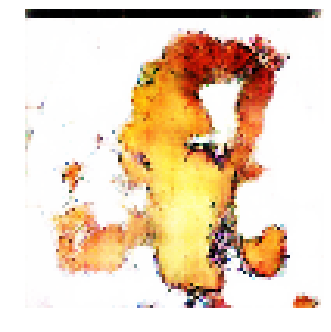


Epoch: 18720, D: -6.092, G: 5.278
Epoch: 18721, D: -4.431, G: 3.237
Epoch: 18722, D: -7.5, G: 2.876
Epoch: 18723, D: -6.774, G: 2.32
Epoch: 18724, D: -4.886, G: 2.955
Epoch: 18725, D: -7.545, G: 3.231
Epoch: 18726, D: -5.376, G: 2.769
Epoch: 18727, D: -6.947, G: 2.777
Epoch: 18728, D: -5.831, G: 4.232
Epoch: 18729, D: -5.249, G: 5.367
Epoch: 18730, D: -5.638, G: 3.675
Epoch: 18731, D: -6.062, G: 2.15
Epoch: 18732, D: -5.055, G: 4.271
Epoch: 18733, D: -6.499, G: 3.119
Epoch: 18734, D: -4.914, G: 2.06
Epoch: 18735, D: -6.227, G: 4.011
Epoch: 18736, D: -5.752, G: 4.791
Epoch: 18737, D: -6.429, G: 3.433
Epoch: 18738, D: -6.361, G: 2.348
Epoch: 18739, D: -5.764, G: 2.161


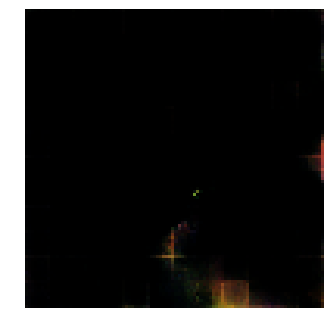


Epoch: 18740, D: -6.376, G: 3.21
Epoch: 18741, D: -5.256, G: 4.458
Epoch: 18742, D: -4.099, G: 2.618
Epoch: 18743, D: -6.619, G: 3.351
Epoch: 18744, D: -6.227, G: 3.041
Epoch: 18745, D: -6.344, G: 1.937
Epoch: 18746, D: -5.863, G: 4.037
Epoch: 18747, D: -5.41, G: 3.849
Epoch: 18748, D: -6.01, G: 3.535
Epoch: 18749, D: -6.304, G: 4.534
Epoch: 18750, D: -7.115, G: 1.528
Epoch: 18751, D: -7.622, G: 3.078
Epoch: 18752, D: -5.807, G: 2.323
Epoch: 18753, D: -6.186, G: 5.78
Epoch: 18754, D: -7.452, G: 4.439
Epoch: 18755, D: -7.772, G: 2.392
Epoch: 18756, D: -4.778, G: 4.146
Epoch: 18757, D: -5.875, G: 4.728
Epoch: 18758, D: -5.819, G: 4.92
Epoch: 18759, D: -5.588, G: 2.561


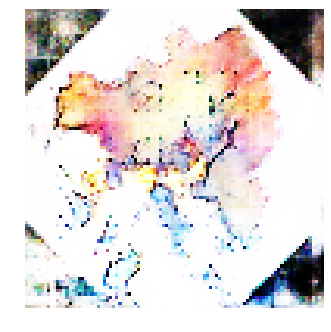


Epoch: 18760, D: -7.163, G: 3.666
Epoch: 18761, D: -4.709, G: 6.216
Epoch: 18762, D: -4.676, G: 5.104
Epoch: 18763, D: -5.191, G: 5.344
Epoch: 18764, D: -6.064, G: 4.592
Epoch: 18765, D: -6.092, G: 3.47
Epoch: 18766, D: -6.435, G: 3.722
Epoch: 18767, D: -5.353, G: 2.761
Epoch: 18768, D: -6.829, G: 2.231
Epoch: 18769, D: -6.058, G: 5.101
Epoch: 18770, D: -6.51, G: 5.624
Epoch: 18771, D: -4.873, G: 2.925
Epoch: 18772, D: -6.627, G: 4.085
Epoch: 18773, D: -5.707, G: 4.937
Epoch: 18774, D: -5.896, G: 4.404
Epoch: 18775, D: -5.703, G: 4.191
Epoch: 18776, D: -5.919, G: 6.485
Epoch: 18777, D: -5.435, G: 3.222
Epoch: 18778, D: -5.175, G: 4.925
Epoch: 18779, D: -5.949, G: 3.125


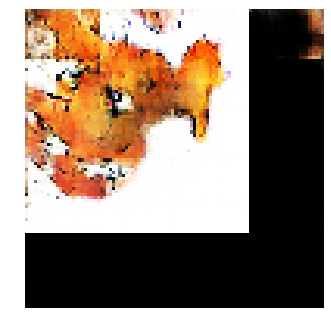


Epoch: 18780, D: -7.127, G: 3.461
Epoch: 18781, D: -5.945, G: 3.938
Epoch: 18782, D: -5.536, G: 2.161
Epoch: 18783, D: -6.122, G: 2.074
Epoch: 18784, D: -6.885, G: 4.417
Epoch: 18785, D: -5.025, G: 3.55
Epoch: 18786, D: -6.759, G: 7.164
Epoch: 18787, D: -6.066, G: 7.306
Epoch: 18788, D: -6.016, G: 4.805
Epoch: 18789, D: -5.147, G: 4.211
Epoch: 18790, D: -5.9, G: 4.48
Epoch: 18791, D: -5.625, G: 3.195
Epoch: 18792, D: -5.682, G: 3.054
Epoch: 18793, D: -7.023, G: 4.67
Epoch: 18794, D: -5.425, G: 2.957
Epoch: 18795, D: -6.093, G: 1.177
Epoch: 18796, D: -6.002, G: 3.358
Epoch: 18797, D: -6.381, G: 5.818
Epoch: 18798, D: -5.662, G: 3.609
Epoch: 18799, D: -5.32, G: 4.409


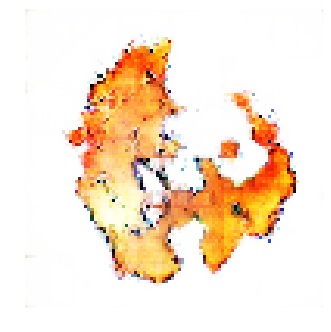


Epoch: 18800, D: -6.203, G: 4.062
Epoch: 18801, D: -6.314, G: 3.957
Epoch: 18802, D: -6.312, G: 4.238
Epoch: 18803, D: -6.579, G: 0.6105
Epoch: 18804, D: -5.448, G: 2.987
Epoch: 18805, D: -6.379, G: 4.847
Epoch: 18806, D: -6.535, G: 4.712
Epoch: 18807, D: -5.294, G: 3.243
Epoch: 18808, D: -5.377, G: 2.961
Epoch: 18809, D: -5.182, G: 4.312
Epoch: 18810, D: -6.896, G: 4.637
Epoch: 18811, D: -5.429, G: 3.208
Epoch: 18812, D: -5.155, G: 3.836
Epoch: 18813, D: -5.214, G: 3.704
Epoch: 18814, D: -6.255, G: 3.179
Epoch: 18815, D: -5.312, G: 4.01
Epoch: 18816, D: -6.343, G: 3.45
Epoch: 18817, D: -6.082, G: 2.705
Epoch: 18818, D: -5.653, G: 3.711
Epoch: 18819, D: -6.36, G: 3.52


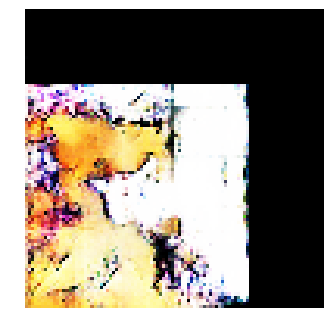


Epoch: 18820, D: -5.917, G: 3.701
Epoch: 18821, D: -7.622, G: 3.116
Epoch: 18822, D: -6.091, G: 5.528
Epoch: 18823, D: -6.066, G: 2.83
Epoch: 18824, D: -7.642, G: 3.367
Epoch: 18825, D: -6.282, G: 4.569
Epoch: 18826, D: -5.049, G: 6.447
Epoch: 18827, D: -6.491, G: 3.662
Epoch: 18828, D: -5.971, G: 3.504
Epoch: 18829, D: -7.62, G: 5.675
Epoch: 18830, D: -7.186, G: 4.619
Epoch: 18831, D: -4.962, G: 1.14
Epoch: 18832, D: -5.896, G: 5.104
Epoch: 18833, D: -7.025, G: 1.123
Epoch: 18834, D: -6.098, G: 4.208
Epoch: 18835, D: -5.801, G: 5.642
Epoch: 18836, D: -6.737, G: 6.002
Epoch: 18837, D: -6.715, G: 2.283
Epoch: 18838, D: -6.126, G: 4.175
Epoch: 18839, D: -5.398, G: 4.536


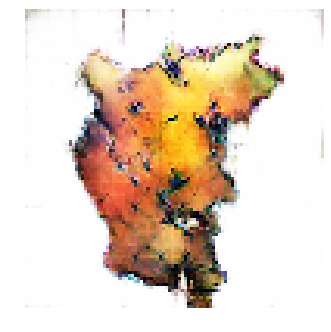


Epoch: 18840, D: -5.049, G: 4.949
Epoch: 18841, D: -5.887, G: 4.465
Epoch: 18842, D: -7.197, G: 5.1
Epoch: 18843, D: -6.451, G: 4.636
Epoch: 18844, D: -6.546, G: 4.513
Epoch: 18845, D: -6.721, G: 3.719
Epoch: 18846, D: -5.59, G: 1.452
Epoch: 18847, D: -6.197, G: 3.958
Epoch: 18848, D: -6.265, G: 2.694
Epoch: 18849, D: -6.446, G: 3.521
Epoch: 18850, D: -5.723, G: 1.843
Epoch: 18851, D: -6.732, G: 4.672
Epoch: 18852, D: -7.077, G: 5.624
Epoch: 18853, D: -6.299, G: 4.407
Epoch: 18854, D: -6.92, G: 4.224
Epoch: 18855, D: -6.617, G: 3.896
Epoch: 18856, D: -7.058, G: 5.505
Epoch: 18857, D: -6.187, G: 3.716
Epoch: 18858, D: -6.091, G: 1.474
Epoch: 18859, D: -6.634, G: 3.878


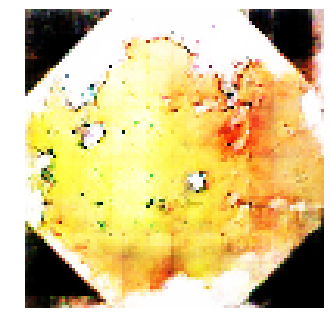


Epoch: 18860, D: -5.911, G: 3.081
Epoch: 18861, D: -5.489, G: 5.828
Epoch: 18862, D: -6.484, G: 2.755
Epoch: 18863, D: -6.806, G: 2.744
Epoch: 18864, D: -6.445, G: 2.441
Epoch: 18865, D: -5.65, G: -0.4258
Epoch: 18866, D: -6.868, G: 6.924
Epoch: 18867, D: -5.236, G: 2.636
Epoch: 18868, D: -5.051, G: 4.223
Epoch: 18869, D: -6.706, G: 4.091
Epoch: 18870, D: -6.194, G: 7.161
Epoch: 18871, D: -5.498, G: 4.179
Epoch: 18872, D: -5.959, G: 3.494
Epoch: 18873, D: -6.223, G: 3.004
Epoch: 18874, D: -6.76, G: 3.182
Epoch: 18875, D: -8.158, G: 4.024
Epoch: 18876, D: -5.5, G: 4.358
Epoch: 18877, D: -6.908, G: 4.575
Epoch: 18878, D: -7.054, G: 5.626
Epoch: 18879, D: -6.56, G: 6.227


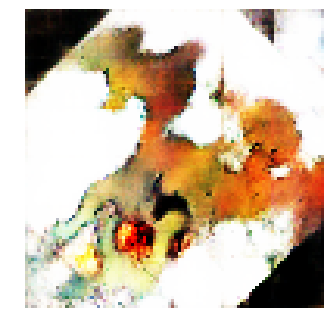


Epoch: 18880, D: -6.497, G: 4.788
Epoch: 18881, D: -6.022, G: 4.105
Epoch: 18882, D: -7.169, G: 5.391
Epoch: 18883, D: -5.829, G: 1.86
Epoch: 18884, D: -6.249, G: 3.986
Epoch: 18885, D: -6.537, G: 5.61
Epoch: 18886, D: -6.048, G: 3.623
Epoch: 18887, D: -5.877, G: 5.155
Epoch: 18888, D: -6.569, G: 1.145
Epoch: 18889, D: -6.149, G: 3.086
Epoch: 18890, D: -6.343, G: 2.458
Epoch: 18891, D: -5.679, G: 4.24
Epoch: 18892, D: -5.88, G: 2.096
Epoch: 18893, D: -4.814, G: 4.058
Epoch: 18894, D: -6.398, G: 1.56
Epoch: 18895, D: -6.945, G: 3.078
Epoch: 18896, D: -5.386, G: 6.075
Epoch: 18897, D: -5.902, G: 4.94
Epoch: 18898, D: -6.559, G: 3.914
Epoch: 18899, D: -6.32, G: 2.901


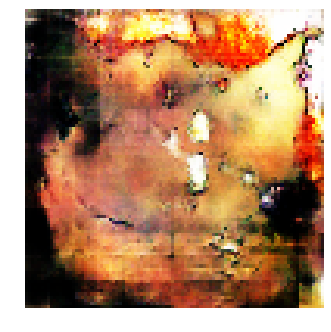


Epoch: 18900, D: -5.634, G: 4.974
Epoch: 18901, D: -6.204, G: 3.765
Epoch: 18902, D: -7.256, G: 3.329
Epoch: 18903, D: -5.595, G: 4.982
Epoch: 18904, D: -7.455, G: 5.129
Epoch: 18905, D: -4.704, G: 4.099
Epoch: 18906, D: -6.723, G: 1.988
Epoch: 18907, D: -5.426, G: 3.222
Epoch: 18908, D: -7.027, G: 3.513
Epoch: 18909, D: -7.191, G: 2.694
Epoch: 18910, D: -5.508, G: 4.982
Epoch: 18911, D: -6.121, G: 3.528
Epoch: 18912, D: -6.499, G: 4.272
Epoch: 18913, D: -6.853, G: 1.459
Epoch: 18914, D: -5.606, G: 4.812
Epoch: 18915, D: -5.126, G: 5.979
Epoch: 18916, D: -6.034, G: 4.295
Epoch: 18917, D: -5.393, G: 4.478
Epoch: 18918, D: -4.684, G: 4.541
Epoch: 18919, D: -6.112, G: 5.237


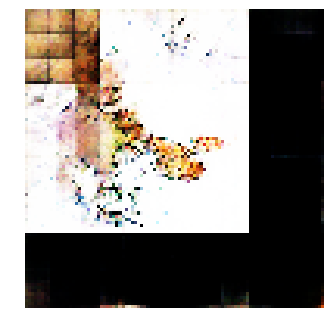


Epoch: 18920, D: -5.723, G: 3.288
Epoch: 18921, D: -6.488, G: 3.592
Epoch: 18922, D: -6.332, G: 5.207
Epoch: 18923, D: -5.135, G: 4.292
Epoch: 18924, D: -6.325, G: 2.938
Epoch: 18925, D: -5.921, G: 0.5493
Epoch: 18926, D: -5.183, G: 3.529
Epoch: 18927, D: -5.494, G: 3.778
Epoch: 18928, D: -6.526, G: 4.154
Epoch: 18929, D: -6.373, G: 3.853
Epoch: 18930, D: -5.823, G: 3.132
Epoch: 18931, D: -6.599, G: 3.124
Epoch: 18932, D: -5.677, G: 2.445
Epoch: 18933, D: -6.012, G: 3.482
Epoch: 18934, D: -5.66, G: 2.434
Epoch: 18935, D: -6.342, G: 3.973
Epoch: 18936, D: -5.667, G: 3.136
Epoch: 18937, D: -5.836, G: 4.701
Epoch: 18938, D: -6.968, G: 4.162
Epoch: 18939, D: -5.059, G: 2.979


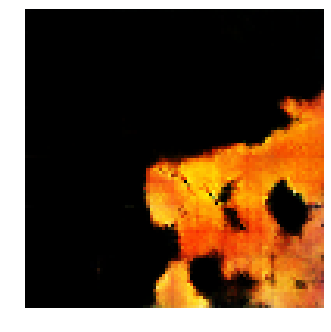


Epoch: 18940, D: -6.247, G: 4.247
Epoch: 18941, D: -6.206, G: 2.143
Epoch: 18942, D: -5.992, G: 2.572
Epoch: 18943, D: -6.62, G: 5.046
Epoch: 18944, D: -6.863, G: 4.72
Epoch: 18945, D: -5.306, G: 5.276
Epoch: 18946, D: -4.895, G: 2.238
Epoch: 18947, D: -6.426, G: 4.968
Epoch: 18948, D: -6.505, G: 3.272
Epoch: 18949, D: -6.633, G: 4.716
Epoch: 18950, D: -4.581, G: 3.709
Epoch: 18951, D: -6.71, G: 5.707
Epoch: 18952, D: -4.86, G: 2.151
Epoch: 18953, D: -5.888, G: 3.923
Epoch: 18954, D: -5.618, G: 5.549
Epoch: 18955, D: -7.105, G: 3.426
Epoch: 18956, D: -6.863, G: 2.906
Epoch: 18957, D: -6.006, G: 3.653
Epoch: 18958, D: -5.974, G: 5.557
Epoch: 18959, D: -5.623, G: 6.284


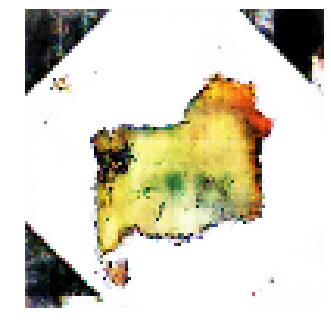


Epoch: 18960, D: -4.707, G: 3.577
Epoch: 18961, D: -6.037, G: 3.227
Epoch: 18962, D: -5.635, G: 2.337
Epoch: 18963, D: -5.748, G: 4.642
Epoch: 18964, D: -7.014, G: 3.824
Epoch: 18965, D: -5.828, G: 2.085
Epoch: 18966, D: -5.54, G: 4.155
Epoch: 18967, D: -6.358, G: 4.897
Epoch: 18968, D: -5.303, G: 3.667
Epoch: 18969, D: -6.679, G: 1.68
Epoch: 18970, D: -5.474, G: 2.389
Epoch: 18971, D: -5.394, G: 3.602
Epoch: 18972, D: -4.886, G: 2.679
Epoch: 18973, D: -6.719, G: 5.39
Epoch: 18974, D: -5.567, G: 4.218
Epoch: 18975, D: -4.941, G: 5.376
Epoch: 18976, D: -6.189, G: 5.214
Epoch: 18977, D: -6.018, G: 1.674
Epoch: 18978, D: -5.304, G: 2.979
Epoch: 18979, D: -5.238, G: 3.068


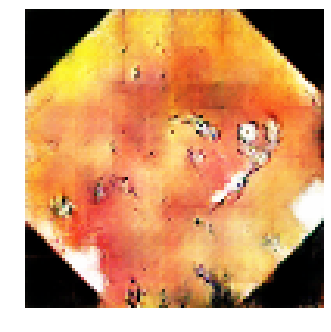


Epoch: 18980, D: -6.599, G: 6.748
Epoch: 18981, D: -4.924, G: 2.425
Epoch: 18982, D: -4.516, G: 2.8
Epoch: 18983, D: -5.625, G: 3.541
Epoch: 18984, D: -5.793, G: 6.429
Epoch: 18985, D: -6.025, G: 4.867
Epoch: 18986, D: -5.99, G: 2.098
Epoch: 18987, D: -6.834, G: 4.231
Epoch: 18988, D: -5.115, G: 6.503
Epoch: 18989, D: -5.568, G: 4.217
Epoch: 18990, D: -7.341, G: 3.192
Epoch: 18991, D: -6.549, G: 2.342
Epoch: 18992, D: -7.144, G: 4.601
Epoch: 18993, D: -5.55, G: 3.599
Epoch: 18994, D: -6.316, G: 2.823
Epoch: 18995, D: -5.774, G: 4.123
Epoch: 18996, D: -6.803, G: 2.354
Epoch: 18997, D: -5.331, G: 2.919
Epoch: 18998, D: -6.427, G: 4.346
Epoch: 18999, D: -4.576, G: 6.275


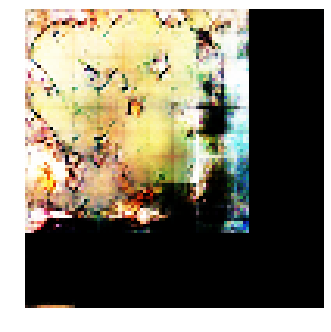


Epoch: 19000, D: -5.498, G: 2.804
Epoch: 19001, D: -5.704, G: 3.393
Epoch: 19002, D: -5.097, G: 2.72
Epoch: 19003, D: -6.57, G: 2.902
Epoch: 19004, D: -4.9, G: 4.046
Epoch: 19005, D: -6.084, G: 3.575
Epoch: 19006, D: -5.974, G: 4.241
Epoch: 19007, D: -6.054, G: 4.553
Epoch: 19008, D: -5.213, G: 3.557
Epoch: 19009, D: -6.45, G: 2.827
Epoch: 19010, D: -5.775, G: 3.404
Epoch: 19011, D: -7.036, G: 1.741
Epoch: 19012, D: -6.931, G: 5.724
Epoch: 19013, D: -4.805, G: 2.231
Epoch: 19014, D: -5.5, G: 2.975
Epoch: 19015, D: -6.151, G: 3.503
Epoch: 19016, D: -6.18, G: 6.687
Epoch: 19017, D: -4.823, G: 3.209
Epoch: 19018, D: -6.245, G: 4.554
Epoch: 19019, D: -5.96, G: 3.838


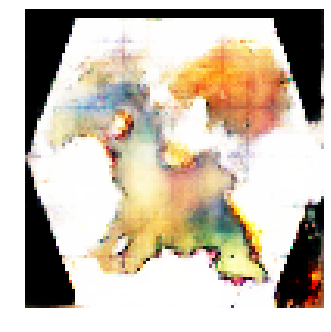


Epoch: 19020, D: -7.118, G: 3.117
Epoch: 19021, D: -6.547, G: 3.892
Epoch: 19022, D: -6.571, G: 3.791
Epoch: 19023, D: -6.553, G: 3.979
Epoch: 19024, D: -6.939, G: 2.824
Epoch: 19025, D: -6.892, G: 1.452
Epoch: 19026, D: -5.609, G: 3.22
Epoch: 19027, D: -6.23, G: 4.068
Epoch: 19028, D: -6.582, G: 2.553
Epoch: 19029, D: -6.056, G: 3.037
Epoch: 19030, D: -6.045, G: 4.298
Epoch: 19031, D: -5.754, G: 5.793
Epoch: 19032, D: -5.3, G: 6.16
Epoch: 19033, D: -5.765, G: 2.819
Epoch: 19034, D: -6.807, G: 3.536
Epoch: 19035, D: -5.507, G: 3.406
Epoch: 19036, D: -4.517, G: 2.594
Epoch: 19037, D: -6.414, G: 3.582
Epoch: 19038, D: -6.575, G: 3.755
Epoch: 19039, D: -4.972, G: 1.817


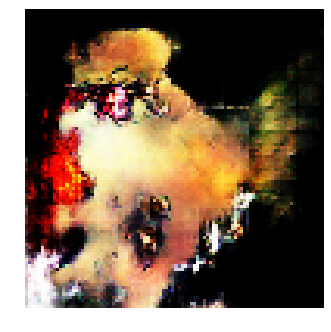


Epoch: 19040, D: -7.176, G: 7.105
Epoch: 19041, D: -6.541, G: 5.04
Epoch: 19042, D: -4.905, G: 5.212
Epoch: 19043, D: -5.469, G: 2.565
Epoch: 19044, D: -4.836, G: 1.105
Epoch: 19045, D: -5.8, G: 3.964
Epoch: 19046, D: -6.688, G: 4.217
Epoch: 19047, D: -5.888, G: 1.803
Epoch: 19048, D: -5.347, G: 4.964
Epoch: 19049, D: -6.642, G: 4.512
Epoch: 19050, D: -5.303, G: 4.306
Epoch: 19051, D: -5.165, G: 3.786
Epoch: 19052, D: -5.781, G: 2.351
Epoch: 19053, D: -5.56, G: 4.934
Epoch: 19054, D: -6.501, G: 3.22
Epoch: 19055, D: -7.22, G: 2.32
Epoch: 19056, D: -7.495, G: 2.43
Epoch: 19057, D: -6.187, G: 7.238
Epoch: 19058, D: -5.069, G: 6.305
Epoch: 19059, D: -6.256, G: 3.161


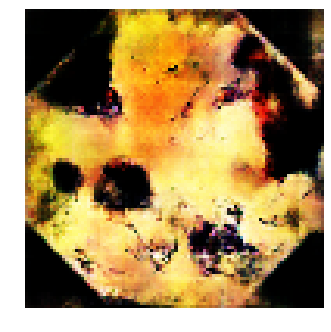


Epoch: 19060, D: -5.449, G: 5.196
Epoch: 19061, D: -6.433, G: 5.32
Epoch: 19062, D: -5.997, G: 4.756
Epoch: 19063, D: -5.934, G: 3.73
Epoch: 19064, D: -5.756, G: 2.369
Epoch: 19065, D: -5.972, G: 3.322
Epoch: 19066, D: -7.053, G: 4.096
Epoch: 19067, D: -5.354, G: 3.584
Epoch: 19068, D: -6.013, G: 3.548
Epoch: 19069, D: -6.233, G: 0.9087
Epoch: 19070, D: -5.817, G: 2.425
Epoch: 19071, D: -5.94, G: 3.134
Epoch: 19072, D: -6.002, G: 4.049
Epoch: 19073, D: -4.536, G: 5.307
Epoch: 19074, D: -6.431, G: 4.57
Epoch: 19075, D: -5.912, G: 2.464
Epoch: 19076, D: -6.708, G: 2.392
Epoch: 19077, D: -5.192, G: 4.939
Epoch: 19078, D: -6.38, G: 2.564
Epoch: 19079, D: -5.986, G: 2.479


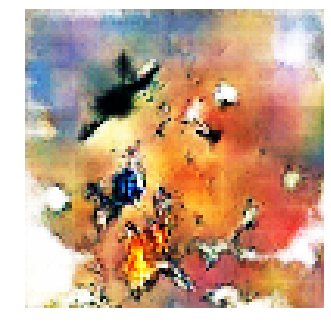


Epoch: 19080, D: -4.962, G: 2.507
Epoch: 19081, D: -6.051, G: 4.792
Epoch: 19082, D: -6.442, G: 4.005
Epoch: 19083, D: -5.818, G: 4.884
Epoch: 19084, D: -6.133, G: 4.203
Epoch: 19085, D: -6.388, G: 3.89
Epoch: 19086, D: -6.363, G: 4.202
Epoch: 19087, D: -5.337, G: 5.486
Epoch: 19088, D: -6.251, G: 3.253
Epoch: 19089, D: -6.128, G: 2.678
Epoch: 19090, D: -6.462, G: 4.409
Epoch: 19091, D: -5.809, G: 1.403
Epoch: 19092, D: -6.664, G: 5.715
Epoch: 19093, D: -6.892, G: 3.434
Epoch: 19094, D: -6.884, G: 5.311
Epoch: 19095, D: -5.308, G: 6.739
Epoch: 19096, D: -6.196, G: 3.823
Epoch: 19097, D: -7.077, G: 3.299
Epoch: 19098, D: -5.148, G: 5.337
Epoch: 19099, D: -6.261, G: 3.475


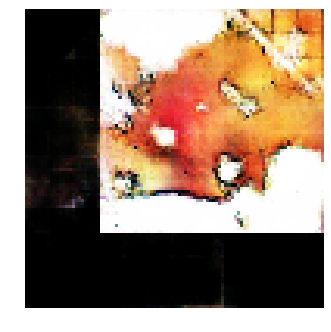


Epoch: 19100, D: -6.416, G: 1.908
Epoch: 19101, D: -5.703, G: 3.348
Epoch: 19102, D: -5.411, G: 2.102
Epoch: 19103, D: -6.307, G: 2.494
Epoch: 19104, D: -6.738, G: 6.191
Epoch: 19105, D: -4.637, G: 2.169
Epoch: 19106, D: -6.626, G: 1.506
Epoch: 19107, D: -5.606, G: 4.088
Epoch: 19108, D: -6.65, G: 3.687
Epoch: 19109, D: -5.269, G: 3.662
Epoch: 19110, D: -4.974, G: 4.49
Epoch: 19111, D: -5.841, G: 3.649
Epoch: 19112, D: -5.643, G: 2.987
Epoch: 19113, D: -6.637, G: 4.25
Epoch: 19114, D: -5.937, G: 3.763
Epoch: 19115, D: -4.992, G: 3.618
Epoch: 19116, D: -5.859, G: 4.664
Epoch: 19117, D: -6.05, G: 3.109
Epoch: 19118, D: -5.752, G: 2.975
Epoch: 19119, D: -5.536, G: 5.869


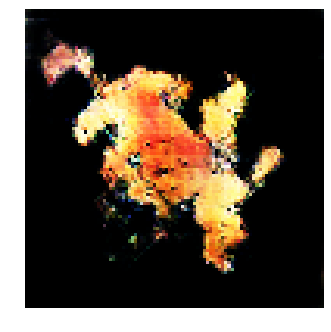


Epoch: 19120, D: -5.08, G: 5.255
Epoch: 19121, D: -7.176, G: 3.554
Epoch: 19122, D: -7.114, G: 3.03
Epoch: 19123, D: -5.484, G: 6.173
Epoch: 19124, D: -6.218, G: 4.82
Epoch: 19125, D: -6.39, G: 4.856
Epoch: 19126, D: -6.644, G: 3.975
Epoch: 19127, D: -6.993, G: 2.837
Epoch: 19128, D: -7.235, G: 4.058
Epoch: 19129, D: -5.053, G: 4.478
Epoch: 19130, D: -6.902, G: 5.848
Epoch: 19131, D: -6.465, G: 3.848
Epoch: 19132, D: -6.244, G: 3.896
Epoch: 19133, D: -7.001, G: 4.999
Epoch: 19134, D: -5.831, G: 4.761
Epoch: 19135, D: -5.673, G: 5.882
Epoch: 19136, D: -5.941, G: 5.184
Epoch: 19137, D: -6.455, G: 4.232
Epoch: 19138, D: -6.301, G: 4.381
Epoch: 19139, D: -5.923, G: 5.023


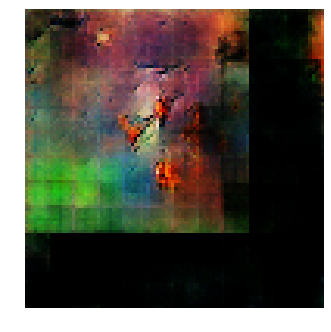


Epoch: 19140, D: -7.102, G: 6.069
Epoch: 19141, D: -5.721, G: 4.443
Epoch: 19142, D: -7.01, G: 3.886
Epoch: 19143, D: -5.993, G: 4.665
Epoch: 19144, D: -6.614, G: 6.449
Epoch: 19145, D: -6.194, G: 4.616
Epoch: 19146, D: -6.877, G: 5.57
Epoch: 19147, D: -5.35, G: 4.195
Epoch: 19148, D: -5.999, G: 5.472
Epoch: 19149, D: -6.032, G: 4.784
Epoch: 19150, D: -5.181, G: 3.888
Epoch: 19151, D: -5.52, G: 4.422
Epoch: 19152, D: -6.921, G: 3.436
Epoch: 19153, D: -5.406, G: 3.162
Epoch: 19154, D: -7.079, G: 5.15
Epoch: 19155, D: -5.523, G: 2.438
Epoch: 19156, D: -5.295, G: 4.776
Epoch: 19157, D: -6.122, G: 4.956
Epoch: 19158, D: -6.812, G: 2.986
Epoch: 19159, D: -6.876, G: 6.132


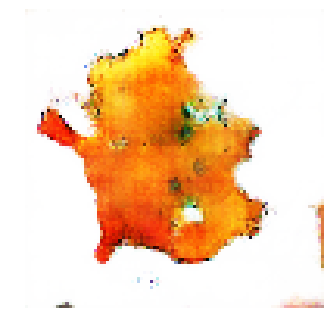


Epoch: 19160, D: -6.509, G: 1.716
Epoch: 19161, D: -6.337, G: 2.156
Epoch: 19162, D: -6.123, G: 4.977
Epoch: 19163, D: -6.556, G: 2.193
Epoch: 19164, D: -5.41, G: 3.433
Epoch: 19165, D: -6.066, G: 2.431
Epoch: 19166, D: -6.068, G: 2.958
Epoch: 19167, D: -6.218, G: 2.585
Epoch: 19168, D: -5.468, G: 3.143
Epoch: 19169, D: -5.616, G: 5.362
Epoch: 19170, D: -7.042, G: 2.316
Epoch: 19171, D: -5.571, G: 2.668
Epoch: 19172, D: -5.207, G: 3.127
Epoch: 19173, D: -5.672, G: 3.151
Epoch: 19174, D: -6.081, G: 4.37
Epoch: 19175, D: -5.828, G: 5.184
Epoch: 19176, D: -5.473, G: 3.181
Epoch: 19177, D: -5.824, G: 5.255
Epoch: 19178, D: -4.619, G: 2.544
Epoch: 19179, D: -6.053, G: 4.318


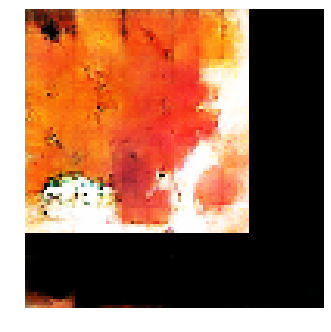


Epoch: 19180, D: -4.875, G: 2.51
Epoch: 19181, D: -5.327, G: 2.77
Epoch: 19182, D: -6.224, G: 2.043
Epoch: 19183, D: -6.73, G: 3.736
Epoch: 19184, D: -5.159, G: 2.529
Epoch: 19185, D: -6.044, G: 4.591
Epoch: 19186, D: -6.671, G: 3.118
Epoch: 19187, D: -5.529, G: 6.825
Epoch: 19188, D: -5.936, G: 3.551
Epoch: 19189, D: -6.283, G: 4.344
Epoch: 19190, D: -5.174, G: 4.617
Epoch: 19191, D: -6.97, G: 3.468
Epoch: 19192, D: -5.32, G: 3.05
Epoch: 19193, D: -4.73, G: 2.815
Epoch: 19194, D: -5.7, G: 3.272
Epoch: 19195, D: -6.173, G: 2.881
Epoch: 19196, D: -8.13, G: 2.283
Epoch: 19197, D: -5.116, G: 4.298
Epoch: 19198, D: -7.42, G: 4.014
Epoch: 19199, D: -6.433, G: 3.074


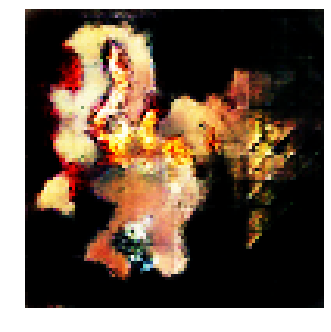


Epoch: 19200, D: -7.131, G: 3.473
Epoch: 19201, D: -5.735, G: 3.398
Epoch: 19202, D: -5.839, G: 2.396
Epoch: 19203, D: -5.501, G: 3.5
Epoch: 19204, D: -5.848, G: 4.144
Epoch: 19205, D: -4.849, G: 3.307
Epoch: 19206, D: -6.734, G: 3.516
Epoch: 19207, D: -6.172, G: 3.306
Epoch: 19208, D: -6.16, G: 4.677
Epoch: 19209, D: -6.009, G: 3.987
Epoch: 19210, D: -5.656, G: 4.138
Epoch: 19211, D: -6.639, G: 1.666
Epoch: 19212, D: -6.368, G: 4.218
Epoch: 19213, D: -6.12, G: 3.652
Epoch: 19214, D: -6.508, G: 5.92
Epoch: 19215, D: -6.443, G: 3.216
Epoch: 19216, D: -5.033, G: 3.685
Epoch: 19217, D: -4.961, G: 2.646
Epoch: 19218, D: -5.657, G: 5.277
Epoch: 19219, D: -6.304, G: 5.683


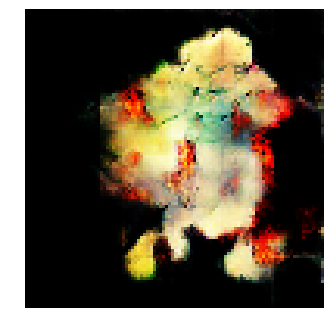


Epoch: 19220, D: -5.19, G: 4.526
Epoch: 19221, D: -6.38, G: 5.177
Epoch: 19222, D: -5.528, G: 2.543
Epoch: 19223, D: -7.3, G: 5.572
Epoch: 19224, D: -4.615, G: 5.374
Epoch: 19225, D: -4.93, G: 3.926
Epoch: 19226, D: -4.941, G: 4.176
Epoch: 19227, D: -5.671, G: 1.179
Epoch: 19228, D: -6.191, G: 3.213
Epoch: 19229, D: -7.388, G: 3.573
Epoch: 19230, D: -5.306, G: 1.711
Epoch: 19231, D: -5.282, G: 3.701
Epoch: 19232, D: -6.345, G: 3.93
Epoch: 19233, D: -4.93, G: 4.155
Epoch: 19234, D: -5.543, G: 1.208
Epoch: 19235, D: -5.48, G: 2.663
Epoch: 19236, D: -6.497, G: 4.222
Epoch: 19237, D: -5.766, G: 3.19
Epoch: 19238, D: -5.07, G: 3.612
Epoch: 19239, D: -6.225, G: 3.202


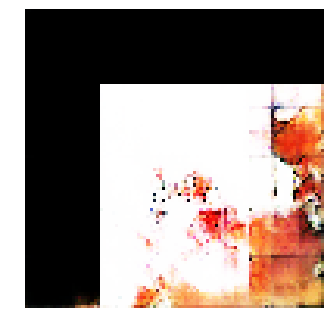


Epoch: 19240, D: -7.057, G: 2.824
Epoch: 19241, D: -6.84, G: 1.798
Epoch: 19242, D: -6.83, G: 5.117
Epoch: 19243, D: -5.808, G: 2.496
Epoch: 19244, D: -5.9, G: 5.061
Epoch: 19245, D: -6.981, G: 2.264
Epoch: 19246, D: -5.907, G: 5.182
Epoch: 19247, D: -6.736, G: 3.529
Epoch: 19248, D: -6.33, G: 4.647
Epoch: 19249, D: -6.456, G: 3.63
Epoch: 19250, D: -7.443, G: 4.079
Epoch: 19251, D: -5.523, G: 5.956
Epoch: 19252, D: -4.587, G: 2.05
Epoch: 19253, D: -6.414, G: 4.851
Epoch: 19254, D: -5.631, G: 3.337
Epoch: 19255, D: -5.953, G: 3.669
Epoch: 19256, D: -6.874, G: 1.417
Epoch: 19257, D: -5.905, G: 6.025
Epoch: 19258, D: -6.064, G: 3.499
Epoch: 19259, D: -5.53, G: 2.292


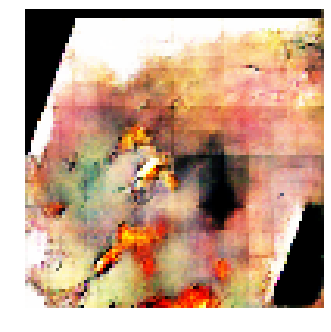


Epoch: 19260, D: -5.978, G: 2.934
Epoch: 19261, D: -6.955, G: 5.036
Epoch: 19262, D: -5.006, G: 2.965
Epoch: 19263, D: -6.272, G: 3.245
Epoch: 19264, D: -5.871, G: 3.221
Epoch: 19265, D: -5.931, G: 1.43
Epoch: 19266, D: -6.336, G: 4.055
Epoch: 19267, D: -6.741, G: 4.777
Epoch: 19268, D: -6.278, G: 3.532
Epoch: 19269, D: -5.439, G: 0.5849
Epoch: 19270, D: -7.037, G: 3.662
Epoch: 19271, D: -6.365, G: 3.137
Epoch: 19272, D: -4.878, G: 4.503
Epoch: 19273, D: -6.211, G: 1.623
Epoch: 19274, D: -6.4, G: 2.508
Epoch: 19275, D: -5.446, G: 4.016
Epoch: 19276, D: -5.757, G: 5.39
Epoch: 19277, D: -6.014, G: 4.187
Epoch: 19278, D: -5.834, G: 3.934
Epoch: 19279, D: -7.373, G: 2.947


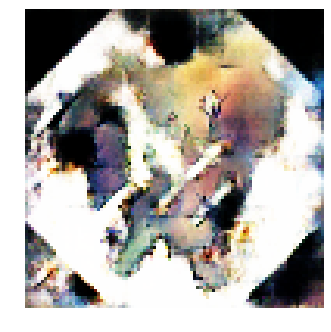


Epoch: 19280, D: -5.18, G: 3.045
Epoch: 19281, D: -5.56, G: 3.251
Epoch: 19282, D: -6.303, G: 3.423
Epoch: 19283, D: -5.179, G: 2.403
Epoch: 19284, D: -5.853, G: 4.177
Epoch: 19285, D: -4.605, G: 3.588
Epoch: 19286, D: -6.432, G: 5.111
Epoch: 19287, D: -4.255, G: 3.193
Epoch: 19288, D: -5.651, G: 3.612
Epoch: 19289, D: -7.305, G: 4.267
Epoch: 19290, D: -5.86, G: 1.953
Epoch: 19291, D: -7.033, G: 3.591
Epoch: 19292, D: -5.416, G: 3.089
Epoch: 19293, D: -5.305, G: 3.839
Epoch: 19294, D: -6.672, G: 2.936
Epoch: 19295, D: -5.906, G: 2.162
Epoch: 19296, D: -6.131, G: 5.185
Epoch: 19297, D: -5.883, G: 3.652
Epoch: 19298, D: -5.668, G: 3.141
Epoch: 19299, D: -6.139, G: 5.167


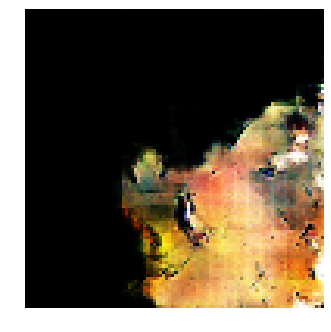


Epoch: 19300, D: -6.265, G: 4.558
Epoch: 19301, D: -5.427, G: 2.424
Epoch: 19302, D: -6.243, G: 2.831
Epoch: 19303, D: -6.34, G: 4.789
Epoch: 19304, D: -5.396, G: 4.842
Epoch: 19305, D: -6.955, G: 3.64
Epoch: 19306, D: -6.223, G: 2.925
Epoch: 19307, D: -6.671, G: 4.674
Epoch: 19308, D: -6.821, G: 3.428
Epoch: 19309, D: -6.246, G: 4.239
Epoch: 19310, D: -4.737, G: 3.74
Epoch: 19311, D: -6.384, G: 2.797
Epoch: 19312, D: -6.506, G: 4.319
Epoch: 19313, D: -6.353, G: 5.313
Epoch: 19314, D: -4.829, G: 4.396
Epoch: 19315, D: -6.715, G: 1.989
Epoch: 19316, D: -5.778, G: 4.854
Epoch: 19317, D: -5.826, G: 2.535
Epoch: 19318, D: -5.954, G: 2.554
Epoch: 19319, D: -6.806, G: 3.503


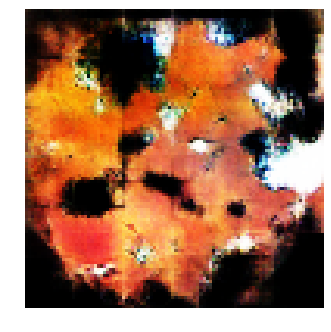


Epoch: 19320, D: -6.034, G: 0.5428
Epoch: 19321, D: -4.846, G: 3.849
Epoch: 19322, D: -6.981, G: 2.898
Epoch: 19323, D: -6.999, G: 3.152
Epoch: 19324, D: -5.708, G: 5.617
Epoch: 19325, D: -6.771, G: 2.66
Epoch: 19326, D: -4.658, G: 5.845
Epoch: 19327, D: -5.72, G: 5.023
Epoch: 19328, D: -7.522, G: 1.74
Epoch: 19329, D: -5.47, G: 2.862
Epoch: 19330, D: -6.722, G: 4.72
Epoch: 19331, D: -5.526, G: 2.318
Epoch: 19332, D: -5.977, G: 7.06
Epoch: 19333, D: -7.204, G: 1.889
Epoch: 19334, D: -6.755, G: 3.76
Epoch: 19335, D: -5.077, G: 2.999
Epoch: 19336, D: -6.212, G: 3.391
Epoch: 19337, D: -7.234, G: 3.795
Epoch: 19338, D: -6.412, G: 4.109
Epoch: 19339, D: -6.301, G: 2.64


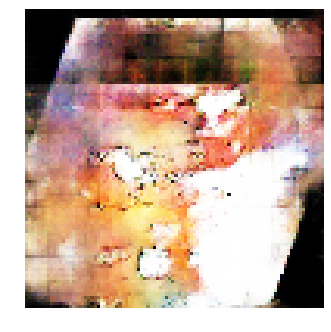


Epoch: 19340, D: -6.406, G: 4.058
Epoch: 19341, D: -6.496, G: 5.396
Epoch: 19342, D: -6.094, G: 3.766
Epoch: 19343, D: -5.449, G: 2.157
Epoch: 19344, D: -5.437, G: 2.719
Epoch: 19345, D: -6.933, G: 1.581
Epoch: 19346, D: -5.221, G: 2.475
Epoch: 19347, D: -5.854, G: 5.229
Epoch: 19348, D: -5.314, G: 2.814
Epoch: 19349, D: -6.042, G: 2.935
Epoch: 19350, D: -5.894, G: 3.846
Epoch: 19351, D: -6.646, G: 5.953
Epoch: 19352, D: -6.258, G: 4.201
Epoch: 19353, D: -6.965, G: 4.347
Epoch: 19354, D: -5.645, G: 7.023
Epoch: 19355, D: -7.545, G: 6.707
Epoch: 19356, D: -5.793, G: 4.479
Epoch: 19357, D: -6.224, G: 3.488
Epoch: 19358, D: -5.508, G: 2.742
Epoch: 19359, D: -6.439, G: 3.404


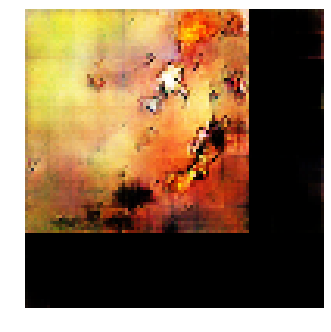


Epoch: 19360, D: -6.404, G: 1.286
Epoch: 19361, D: -6.016, G: 2.129
Epoch: 19362, D: -6.355, G: 2.309
Epoch: 19363, D: -4.751, G: 5.424
Epoch: 19364, D: -5.373, G: 3.674
Epoch: 19365, D: -5.9, G: 3.812
Epoch: 19366, D: -6.34, G: 3.921
Epoch: 19367, D: -5.331, G: 3.14
Epoch: 19368, D: -6.546, G: 4.926
Epoch: 19369, D: -6.504, G: 2.389
Epoch: 19370, D: -5.146, G: 5.291
Epoch: 19371, D: -6.202, G: 2.732
Epoch: 19372, D: -6.061, G: 3.901
Epoch: 19373, D: -5.462, G: 3.542
Epoch: 19374, D: -4.923, G: 3.027
Epoch: 19375, D: -6.202, G: 4.689
Epoch: 19376, D: -5.798, G: 3.861
Epoch: 19377, D: -5.698, G: 4.064
Epoch: 19378, D: -6.012, G: 4.575
Epoch: 19379, D: -6.563, G: 4.142


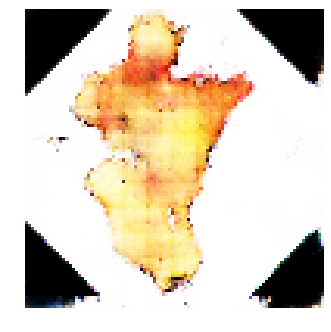


Epoch: 19380, D: -5.688, G: 2.268
Epoch: 19381, D: -7.463, G: 5.24
Epoch: 19382, D: -5.414, G: 2.941
Epoch: 19383, D: -6.446, G: 6.108
Epoch: 19384, D: -5.974, G: 4.63
Epoch: 19385, D: -5.592, G: 3.291
Epoch: 19386, D: -6.802, G: 2.051
Epoch: 19387, D: -6.564, G: 4.196
Epoch: 19388, D: -4.757, G: 3.131
Epoch: 19389, D: -5.615, G: 2.439
Epoch: 19390, D: -4.464, G: 4.405
Epoch: 19391, D: -6.917, G: 5.029
Epoch: 19392, D: -6.966, G: 2.244
Epoch: 19393, D: -5.416, G: 6.265
Epoch: 19394, D: -6.906, G: 3.743
Epoch: 19395, D: -6.216, G: 2.77
Epoch: 19396, D: -7.108, G: 2.906
Epoch: 19397, D: -6.123, G: 3.189
Epoch: 19398, D: -6.646, G: 3.57
Epoch: 19399, D: -5.445, G: 6.853


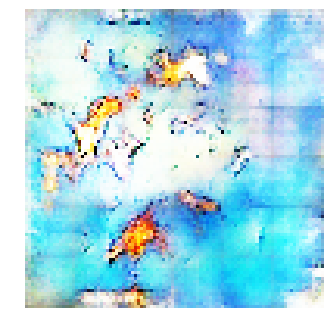


Epoch: 19400, D: -6.599, G: 1.844
Epoch: 19401, D: -5.613, G: 1.312
Epoch: 19402, D: -7.433, G: 4.642
Epoch: 19403, D: -6.455, G: 2.791
Epoch: 19404, D: -5.788, G: 6.34
Epoch: 19405, D: -6.553, G: 6.823
Epoch: 19406, D: -4.919, G: 2.403
Epoch: 19407, D: -6.203, G: 3.47
Epoch: 19408, D: -6.366, G: 4.158
Epoch: 19409, D: -6.162, G: 2.549
Epoch: 19410, D: -5.583, G: 3.662
Epoch: 19411, D: -7.329, G: 1.904
Epoch: 19412, D: -7.736, G: 4.351
Epoch: 19413, D: -5.258, G: 4.632
Epoch: 19414, D: -6.699, G: 2.787
Epoch: 19415, D: -6.604, G: 2.965
Epoch: 19416, D: -5.515, G: 5.08
Epoch: 19417, D: -5.94, G: 3.083
Epoch: 19418, D: -6.075, G: 3.349
Epoch: 19419, D: -4.678, G: 3.783


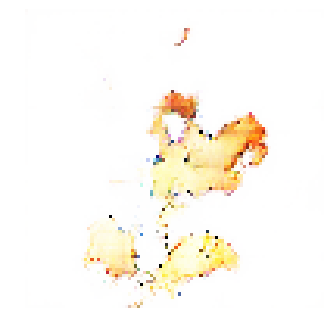


Epoch: 19420, D: -6.42, G: 3.079
Epoch: 19421, D: -5.685, G: 4.013
Epoch: 19422, D: -5.619, G: 6.086
Epoch: 19423, D: -6.654, G: 2.473
Epoch: 19424, D: -6.271, G: 3.455
Epoch: 19425, D: -6.616, G: 4.634
Epoch: 19426, D: -6.027, G: 4.932
Epoch: 19427, D: -6.941, G: 3.992
Epoch: 19428, D: -6.41, G: 6.194
Epoch: 19429, D: -6.388, G: 4.201
Epoch: 19430, D: -5.243, G: 3.785
Epoch: 19431, D: -6.54, G: 4.474
Epoch: 19432, D: -5.396, G: 4.879
Epoch: 19433, D: -7.223, G: 3.925
Epoch: 19434, D: -7.389, G: 5.26
Epoch: 19435, D: -7.003, G: 2.781
Epoch: 19436, D: -6.681, G: 3.588
Epoch: 19437, D: -6.917, G: 4.332
Epoch: 19438, D: -5.037, G: 2.711
Epoch: 19439, D: -6.871, G: 4.973


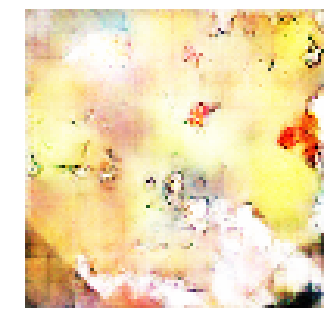


Epoch: 19440, D: -6.427, G: 4.173
Epoch: 19441, D: -7.252, G: 4.074
Epoch: 19442, D: -5.889, G: 2.922
Epoch: 19443, D: -6.173, G: 2.692
Epoch: 19444, D: -5.955, G: 3.258
Epoch: 19445, D: -6.127, G: 1.786
Epoch: 19446, D: -6.144, G: 4.818
Epoch: 19447, D: -5.141, G: 2.892
Epoch: 19448, D: -5.981, G: 3.755
Epoch: 19449, D: -5.547, G: 4.25
Epoch: 19450, D: -5.031, G: 4.369
Epoch: 19451, D: -6.283, G: 5.015
Epoch: 19452, D: -5.425, G: 3.966
Epoch: 19453, D: -5.718, G: 5.941
Epoch: 19454, D: -6.555, G: 3.41
Epoch: 19455, D: -5.656, G: 4.311
Epoch: 19456, D: -6.057, G: 3.195
Epoch: 19457, D: -6.326, G: 3.725
Epoch: 19458, D: -8.033, G: 2.969
Epoch: 19459, D: -5.917, G: 4.75


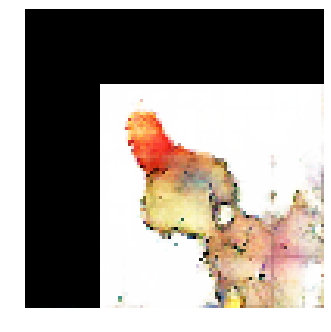


Epoch: 19460, D: -5.959, G: 2.836
Epoch: 19461, D: -4.908, G: 2.075
Epoch: 19462, D: -5.702, G: 1.391
Epoch: 19463, D: -6.723, G: 5.58
Epoch: 19464, D: -6.634, G: 5.225
Epoch: 19465, D: -6.458, G: 4.045
Epoch: 19466, D: -5.97, G: 4.312
Epoch: 19467, D: -5.675, G: 3.206
Epoch: 19468, D: -7.527, G: 3.81
Epoch: 19469, D: -7.664, G: 3.672
Epoch: 19470, D: -6.622, G: 6.816
Epoch: 19471, D: -5.806, G: 2.319
Epoch: 19472, D: -6.096, G: 3.298
Epoch: 19473, D: -5.87, G: 3.428
Epoch: 19474, D: -6.289, G: 4.044
Epoch: 19475, D: -5.385, G: 3.584
Epoch: 19476, D: -6.814, G: 3.194
Epoch: 19477, D: -5.781, G: 3.454
Epoch: 19478, D: -7.031, G: 3.011
Epoch: 19479, D: -5.932, G: 3.361


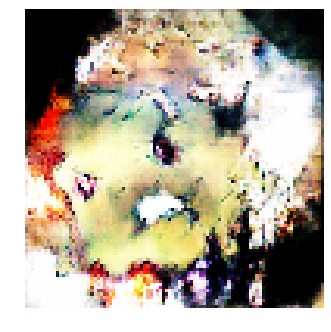


Epoch: 19480, D: -5.991, G: 3.683
Epoch: 19481, D: -6.797, G: 4.926
Epoch: 19482, D: -6.292, G: 1.489
Epoch: 19483, D: -5.239, G: 5.625
Epoch: 19484, D: -4.278, G: 3.358
Epoch: 19485, D: -5.688, G: 3.662
Epoch: 19486, D: -6.822, G: 4.548
Epoch: 19487, D: -4.992, G: 2.591
Epoch: 19488, D: -5.378, G: 5.2
Epoch: 19489, D: -6.34, G: 3.515
Epoch: 19490, D: -4.948, G: 2.947
Epoch: 19491, D: -6.236, G: 4.41
Epoch: 19492, D: -5.039, G: 5.874
Epoch: 19493, D: -5.167, G: 4.574
Epoch: 19494, D: -5.328, G: 4.882
Epoch: 19495, D: -5.826, G: 3.312
Epoch: 19496, D: -7.108, G: 4.738
Epoch: 19497, D: -5.159, G: 3.937
Epoch: 19498, D: -5.67, G: 3.459
Epoch: 19499, D: -7.639, G: 5.079


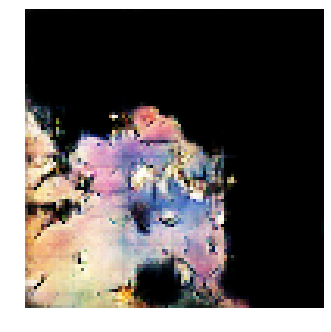


Epoch: 19500, D: -6.12, G: 3.453
Epoch: 19501, D: -6.041, G: 3.243
Epoch: 19502, D: -6.562, G: 3.237
Epoch: 19503, D: -5.526, G: 3.275
Epoch: 19504, D: -6.273, G: 7.301
Epoch: 19505, D: -5.049, G: 0.7209
Epoch: 19506, D: -7.056, G: 2.853
Epoch: 19507, D: -7.089, G: 3.54
Epoch: 19508, D: -6.959, G: 2.758
Epoch: 19509, D: -5.623, G: 4.708
Epoch: 19510, D: -5.071, G: 5.876
Epoch: 19511, D: -5.015, G: 4.235
Epoch: 19512, D: -6.01, G: 3.913
Epoch: 19513, D: -8.156, G: 3.294
Epoch: 19514, D: -5.77, G: 1.435
Epoch: 19515, D: -4.94, G: 3.47
Epoch: 19516, D: -5.612, G: 6.934
Epoch: 19517, D: -5.322, G: 3.314
Epoch: 19518, D: -7.414, G: 3.233
Epoch: 19519, D: -5.735, G: 3.445


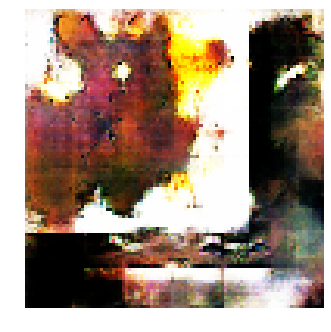


Epoch: 19520, D: -6.862, G: 1.86
Epoch: 19521, D: -5.362, G: 3.61
Epoch: 19522, D: -5.267, G: 2.494
Epoch: 19523, D: -7.068, G: 3.449
Epoch: 19524, D: -6.16, G: 1.071
Epoch: 19525, D: -5.917, G: 5.523
Epoch: 19526, D: -5.778, G: 1.635
Epoch: 19527, D: -5.975, G: 3.241
Epoch: 19528, D: -5.785, G: 3.464
Epoch: 19529, D: -6.368, G: 4.76
Epoch: 19530, D: -5.291, G: 2.873
Epoch: 19531, D: -5.298, G: 7.049
Epoch: 19532, D: -7.133, G: 6.149
Epoch: 19533, D: -4.798, G: 6.263
Epoch: 19534, D: -4.312, G: 6.053
Epoch: 19535, D: -7.313, G: 6.289
Epoch: 19536, D: -4.162, G: 4.735
Epoch: 19537, D: -4.85, G: 5.662
Epoch: 19538, D: -5.848, G: 4.267
Epoch: 19539, D: -5.686, G: 5.532


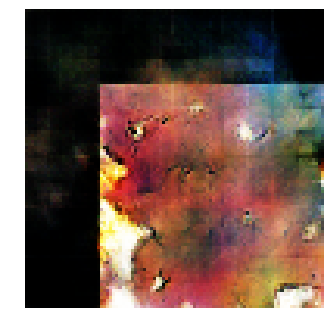


Epoch: 19540, D: -5.498, G: 5.644
Epoch: 19541, D: -5.268, G: 3.747
Epoch: 19542, D: -6.916, G: 3.358
Epoch: 19543, D: -6.364, G: 3.306
Epoch: 19544, D: -8.687, G: 3.113
Epoch: 19545, D: -6.02, G: 0.6002
Epoch: 19546, D: -7.218, G: 5.146
Epoch: 19547, D: -6.056, G: 3.019
Epoch: 19548, D: -5.356, G: 4.709
Epoch: 19549, D: -5.16, G: 3.633
Epoch: 19550, D: -6.165, G: 4.332
Epoch: 19551, D: -6.056, G: 2.187
Epoch: 19552, D: -5.349, G: 2.098
Epoch: 19553, D: -5.165, G: 4.229
Epoch: 19554, D: -7.139, G: 5.303
Epoch: 19555, D: -5.18, G: 3.891
Epoch: 19556, D: -5.624, G: 3.569
Epoch: 19557, D: -5.955, G: 4.53
Epoch: 19558, D: -7.722, G: 4.332
Epoch: 19559, D: -5.419, G: 6.125


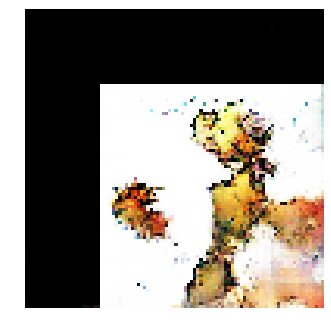


Epoch: 19560, D: -4.503, G: 5.604
Epoch: 19561, D: -6.991, G: 4.645
Epoch: 19562, D: -5.038, G: 2.266
Epoch: 19563, D: -7.234, G: 3.721
Epoch: 19564, D: -5.332, G: 2.256
Epoch: 19565, D: -7.723, G: 1.766
Epoch: 19566, D: -6.706, G: 5.612
Epoch: 19567, D: -7.242, G: 4.434
Epoch: 19568, D: -5.728, G: 3.52
Epoch: 19569, D: -6.853, G: 6.402
Epoch: 19570, D: -5.036, G: 3.154
Epoch: 19571, D: -5.182, G: 4.574
Epoch: 19572, D: -7.717, G: 4.183
Epoch: 19573, D: -5.681, G: 2.321
Epoch: 19574, D: -7.101, G: 2.899
Epoch: 19575, D: -6.157, G: 4.173
Epoch: 19576, D: -5.891, G: 4.866
Epoch: 19577, D: -6.315, G: 3.609
Epoch: 19578, D: -5.56, G: 5.277
Epoch: 19579, D: -6.912, G: 3.95


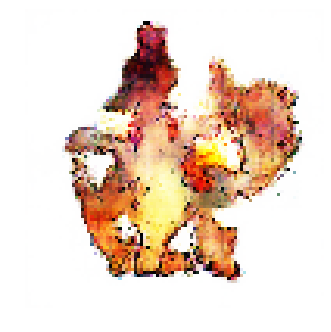


Epoch: 19580, D: -4.589, G: 2.092
Epoch: 19581, D: -5.659, G: 5.3
Epoch: 19582, D: -5.091, G: 3.957
Epoch: 19583, D: -7.009, G: 3.766
Epoch: 19584, D: -6.775, G: 4.504
Epoch: 19585, D: -7.995, G: 4.696
Epoch: 19586, D: -6.302, G: 2.348
Epoch: 19587, D: -5.185, G: 6.53
Epoch: 19588, D: -5.885, G: 2.551
Epoch: 19589, D: -5.872, G: 3.745
Epoch: 19590, D: -5.593, G: 4.541
Epoch: 19591, D: -5.8, G: 4.872
Epoch: 19592, D: -7.661, G: 2.562
Epoch: 19593, D: -6.293, G: 4.418
Epoch: 19594, D: -6.394, G: 1.699
Epoch: 19595, D: -6.591, G: 3.602
Epoch: 19596, D: -5.439, G: 1.961
Epoch: 19597, D: -6.432, G: 4.526
Epoch: 19598, D: -5.88, G: 4.286
Epoch: 19599, D: -6.15, G: 6.753


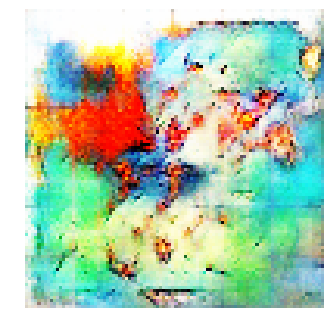


Epoch: 19600, D: -5.114, G: 3.36
Epoch: 19601, D: -6.206, G: 2.333
Epoch: 19602, D: -6.373, G: 2.639
Epoch: 19603, D: -5.324, G: 5.658
Epoch: 19604, D: -5.454, G: 2.965
Epoch: 19605, D: -7.473, G: 2.852
Epoch: 19606, D: -5.349, G: 1.5
Epoch: 19607, D: -5.178, G: 2.265
Epoch: 19608, D: -5.534, G: 6.987
Epoch: 19609, D: -5.099, G: 6.082
Epoch: 19610, D: -5.277, G: 3.753
Epoch: 19611, D: -5.298, G: 5.547
Epoch: 19612, D: -4.92, G: 2.774
Epoch: 19613, D: -5.512, G: 2.678
Epoch: 19614, D: -5.19, G: 4.875
Epoch: 19615, D: -4.828, G: 3.586
Epoch: 19616, D: -6.296, G: 3.779
Epoch: 19617, D: -5.162, G: 2.751
Epoch: 19618, D: -6.02, G: 2.735
Epoch: 19619, D: -6.131, G: 2.384


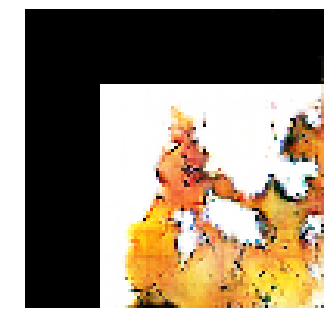


Epoch: 19620, D: -5.154, G: 3.454
Epoch: 19621, D: -5.27, G: 3.692
Epoch: 19622, D: -6.992, G: 5.205
Epoch: 19623, D: -5.438, G: 4.792
Epoch: 19624, D: -5.767, G: 3.291
Epoch: 19625, D: -6.583, G: 4.635
Epoch: 19626, D: -6.941, G: 1.664
Epoch: 19627, D: -5.147, G: 2.471
Epoch: 19628, D: -5.091, G: 4.95
Epoch: 19629, D: -4.896, G: 5.281
Epoch: 19630, D: -4.962, G: 3.885
Epoch: 19631, D: -6.479, G: 3.955
Epoch: 19632, D: -6.556, G: 2.834
Epoch: 19633, D: -5.899, G: 4.799
Epoch: 19634, D: -5.45, G: 5.415
Epoch: 19635, D: -5.814, G: 5.397
Epoch: 19636, D: -4.87, G: 3.535
Epoch: 19637, D: -6.753, G: 5.838
Epoch: 19638, D: -5.995, G: 3.242
Epoch: 19639, D: -5.205, G: 4.881


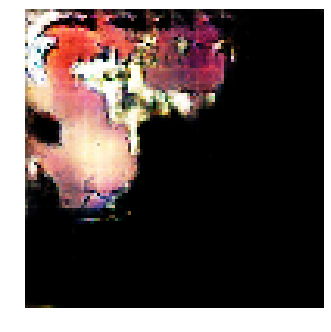


Epoch: 19640, D: -5.571, G: 3.404
Epoch: 19641, D: -5.734, G: 4.438
Epoch: 19642, D: -6.27, G: 3.096
Epoch: 19643, D: -6.036, G: 5.476
Epoch: 19644, D: -6.205, G: 5.011
Epoch: 19645, D: -6.037, G: 1.542
Epoch: 19646, D: -4.82, G: 2.991
Epoch: 19647, D: -6.587, G: 3.891
Epoch: 19648, D: -5.122, G: 1.611
Epoch: 19649, D: -4.257, G: 1.082
Epoch: 19650, D: -6.273, G: 5.365
Epoch: 19651, D: -5.134, G: 3.198
Epoch: 19652, D: -7.329, G: 5.066
Epoch: 19653, D: -5.101, G: 2.507
Epoch: 19654, D: -6.314, G: 3.931
Epoch: 19655, D: -6.253, G: 4.031
Epoch: 19656, D: -5.4, G: 2.573
Epoch: 19657, D: -6.613, G: 4.111
Epoch: 19658, D: -5.068, G: 2.83
Epoch: 19659, D: -4.748, G: 2.363


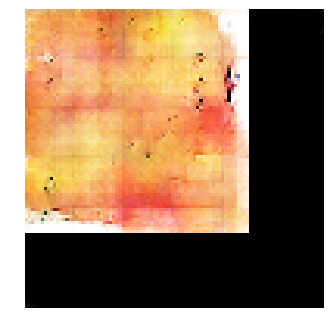


Epoch: 19660, D: -5.425, G: 3.145
Epoch: 19661, D: -6.507, G: 3.809
Epoch: 19662, D: -6.115, G: 2.671
Epoch: 19663, D: -7.112, G: 2.966
Epoch: 19664, D: -6.387, G: 2.759
Epoch: 19665, D: -7.538, G: 3.882
Epoch: 19666, D: -6.01, G: 1.847
Epoch: 19667, D: -6.476, G: 4.316
Epoch: 19668, D: -5.564, G: 4.582
Epoch: 19669, D: -5.105, G: 2.694
Epoch: 19670, D: -5.419, G: 3.132
Epoch: 19671, D: -6.378, G: 4.255
Epoch: 19672, D: -6.538, G: 4.019
Epoch: 19673, D: -5.832, G: 1.912
Epoch: 19674, D: -7.41, G: 2.998
Epoch: 19675, D: -5.315, G: 3.476
Epoch: 19676, D: -5.883, G: 5.608
Epoch: 19677, D: -7.123, G: 1.932
Epoch: 19678, D: -5.516, G: 2.987
Epoch: 19679, D: -6.735, G: 6.033


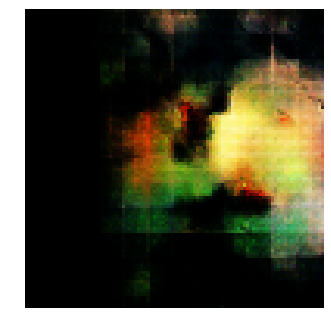


Epoch: 19680, D: -5.86, G: 2.529
Epoch: 19681, D: -5.167, G: 3.18
Epoch: 19682, D: -5.067, G: 3.322
Epoch: 19683, D: -5.389, G: 3.144
Epoch: 19684, D: -6.127, G: 3.759
Epoch: 19685, D: -6.196, G: 3.059
Epoch: 19686, D: -6.071, G: 3.19
Epoch: 19687, D: -6.512, G: 5.764
Epoch: 19688, D: -7.222, G: 4.034
Epoch: 19689, D: -5.293, G: 5.574
Epoch: 19690, D: -7.552, G: 2.932
Epoch: 19691, D: -6.722, G: 3.22
Epoch: 19692, D: -5.733, G: 3.647
Epoch: 19693, D: -5.756, G: 4.268
Epoch: 19694, D: -6.013, G: 3.712
Epoch: 19695, D: -5.065, G: 3.096
Epoch: 19696, D: -6.064, G: 5.78
Epoch: 19697, D: -5.374, G: 4.231
Epoch: 19698, D: -6.029, G: 3.853
Epoch: 19699, D: -6.525, G: 5.216


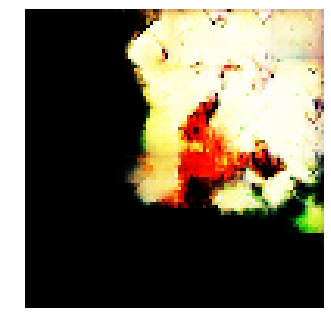


Epoch: 19700, D: -6.573, G: 3.982
Epoch: 19701, D: -6.105, G: 4.085
Epoch: 19702, D: -5.595, G: 3.312
Epoch: 19703, D: -6.247, G: 2.758
Epoch: 19704, D: -6.924, G: 2.734
Epoch: 19705, D: -4.638, G: 3.672
Epoch: 19706, D: -6.955, G: 3.756
Epoch: 19707, D: -6.083, G: 3.679
Epoch: 19708, D: -6.446, G: 3.952
Epoch: 19709, D: -5.808, G: 3.244
Epoch: 19710, D: -6.056, G: 5.733
Epoch: 19711, D: -7.794, G: 3.197
Epoch: 19712, D: -7.447, G: 4.554
Epoch: 19713, D: -6.916, G: 3.826
Epoch: 19714, D: -5.575, G: 4.034
Epoch: 19715, D: -5.603, G: 2.78
Epoch: 19716, D: -5.844, G: 2.097
Epoch: 19717, D: -6.073, G: 2.905
Epoch: 19718, D: -6.465, G: 5.219
Epoch: 19719, D: -5.943, G: 4.237


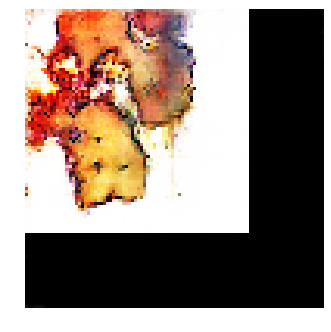


Epoch: 19720, D: -5.254, G: 4.698
Epoch: 19721, D: -6.054, G: 2.933
Epoch: 19722, D: -5.475, G: 6.133
Epoch: 19723, D: -5.626, G: 5.442
Epoch: 19724, D: -5.349, G: 5.403
Epoch: 19725, D: -6.357, G: 3.789
Epoch: 19726, D: -5.965, G: 2.286
Epoch: 19727, D: -6.414, G: 5.138
Epoch: 19728, D: -5.147, G: 5.109
Epoch: 19729, D: -5.259, G: 2.062
Epoch: 19730, D: -6.146, G: 4.842
Epoch: 19731, D: -4.794, G: 3.195
Epoch: 19732, D: -6.524, G: 5.012
Epoch: 19733, D: -6.529, G: 2.356
Epoch: 19734, D: -6.461, G: 3.121
Epoch: 19735, D: -6.42, G: 3.376
Epoch: 19736, D: -3.787, G: 4.427
Epoch: 19737, D: -5.904, G: 3.241
Epoch: 19738, D: -6.786, G: 2.564
Epoch: 19739, D: -4.829, G: 4.809


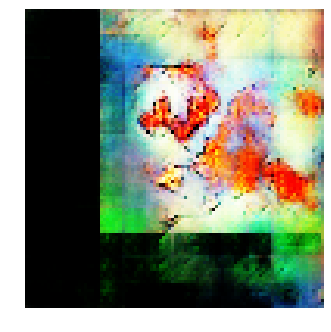


Epoch: 19740, D: -6.283, G: 3.525
Epoch: 19741, D: -5.912, G: 4.095
Epoch: 19742, D: -6.733, G: 3.367
Epoch: 19743, D: -6.095, G: 3.401
Epoch: 19744, D: -7.659, G: 4.787
Epoch: 19745, D: -6.411, G: 5.787
Epoch: 19746, D: -5.98, G: 3.295
Epoch: 19747, D: -6.118, G: 4.169
Epoch: 19748, D: -5.19, G: 3.756
Epoch: 19749, D: -7.775, G: 5.277
Epoch: 19750, D: -5.614, G: 3.854
Epoch: 19751, D: -7.612, G: 4.938
Epoch: 19752, D: -6.179, G: 4.923
Epoch: 19753, D: -4.665, G: 6.203
Epoch: 19754, D: -6.145, G: 3.169
Epoch: 19755, D: -5.983, G: 4.25
Epoch: 19756, D: -6.611, G: 4.422
Epoch: 19757, D: -5.634, G: 3.048
Epoch: 19758, D: -7.59, G: 3.012
Epoch: 19759, D: -5.499, G: 3.705


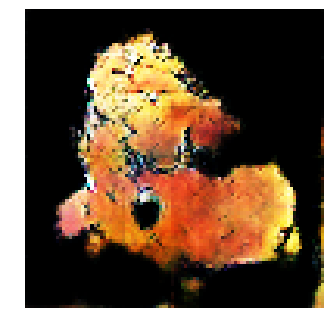


Epoch: 19760, D: -6.712, G: 5.004
Epoch: 19761, D: -5.261, G: 3.274
Epoch: 19762, D: -6.02, G: 3.826
Epoch: 19763, D: -6.647, G: 3.463
Epoch: 19764, D: -5.272, G: 4.95
Epoch: 19765, D: -4.275, G: 2.869
Epoch: 19766, D: -5.411, G: 3.758
Epoch: 19767, D: -6.147, G: 3.308
Epoch: 19768, D: -5.332, G: 2.851
Epoch: 19769, D: -5.731, G: 2.75
Epoch: 19770, D: -5.791, G: 3.244
Epoch: 19771, D: -6.268, G: 3.231
Epoch: 19772, D: -5.404, G: 5.552
Epoch: 19773, D: -6.022, G: 3.221
Epoch: 19774, D: -5.939, G: 4.213
Epoch: 19775, D: -4.154, G: 3.106
Epoch: 19776, D: -5.651, G: 3.787
Epoch: 19777, D: -6.92, G: 4.817
Epoch: 19778, D: -5.648, G: 3.049
Epoch: 19779, D: -5.935, G: 2.952


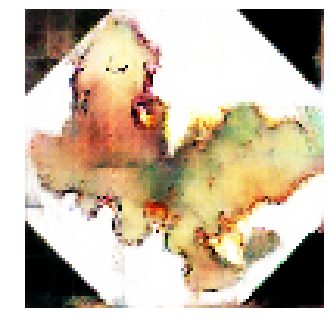


Epoch: 19780, D: -5.805, G: 2.941
Epoch: 19781, D: -6.271, G: 4.255
Epoch: 19782, D: -7.009, G: 3.034
Epoch: 19783, D: -4.736, G: 5.355
Epoch: 19784, D: -8.039, G: 5.719
Epoch: 19785, D: -3.982, G: 5.026
Epoch: 19786, D: -5.366, G: 4.266
Epoch: 19787, D: -5.227, G: 4.174
Epoch: 19788, D: -5.19, G: 4.528
Epoch: 19789, D: -5.694, G: 3.596
Epoch: 19790, D: -6.445, G: 4.962
Epoch: 19791, D: -4.944, G: 4.344
Epoch: 19792, D: -6.762, G: 4.951
Epoch: 19793, D: -5.275, G: 1.678
Epoch: 19794, D: -5.326, G: 3.265
Epoch: 19795, D: -6.573, G: 4.005
Epoch: 19796, D: -6.446, G: 2.569
Epoch: 19797, D: -4.839, G: 3.73
Epoch: 19798, D: -5.531, G: 4.071
Epoch: 19799, D: -6.588, G: 3.644


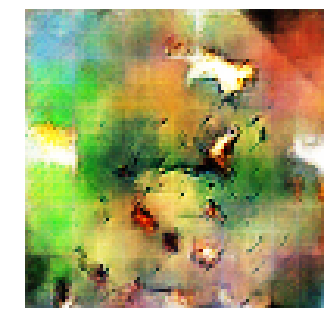


Epoch: 19800, D: -6.318, G: 2.181
Epoch: 19801, D: -5.915, G: 2.572
Epoch: 19802, D: -5.799, G: 4.42
Epoch: 19803, D: -6.243, G: 2.675
Epoch: 19804, D: -6.382, G: 4.736
Epoch: 19805, D: -5.947, G: 3.788
Epoch: 19806, D: -5.211, G: 6.117
Epoch: 19807, D: -7.045, G: 2.251
Epoch: 19808, D: -7.004, G: 2.201
Epoch: 19809, D: -6.961, G: 3.981
Epoch: 19810, D: -5.276, G: 6.103
Epoch: 19811, D: -6.459, G: 4.223
Epoch: 19812, D: -6.915, G: 4.125
Epoch: 19813, D: -5.732, G: 5.459
Epoch: 19814, D: -6.196, G: 5.122
Epoch: 19815, D: -5.315, G: 4.411
Epoch: 19816, D: -6.411, G: 5.094
Epoch: 19817, D: -5.625, G: 3.843
Epoch: 19818, D: -7.097, G: 4.394
Epoch: 19819, D: -5.834, G: 3.939


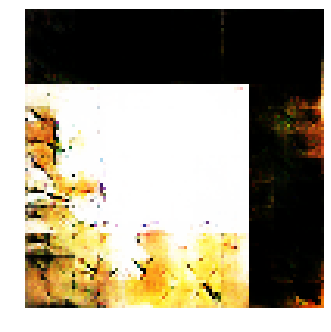


Epoch: 19820, D: -6.56, G: 3.457
Epoch: 19821, D: -4.509, G: 2.822
Epoch: 19822, D: -5.963, G: 4.44
Epoch: 19823, D: -6.838, G: 3.166
Epoch: 19824, D: -5.763, G: 3.034
Epoch: 19825, D: -6.273, G: 1.71
Epoch: 19826, D: -6.32, G: 3.307
Epoch: 19827, D: -6.31, G: 2.757
Epoch: 19828, D: -5.539, G: 1.933
Epoch: 19829, D: -6.871, G: 2.663
Epoch: 19830, D: -4.561, G: 2.523
Epoch: 19831, D: -4.812, G: 2.543
Epoch: 19832, D: -4.833, G: 3.102
Epoch: 19833, D: -5.372, G: 5.683
Epoch: 19834, D: -5.724, G: 3.874
Epoch: 19835, D: -7.308, G: 2.476
Epoch: 19836, D: -5.695, G: 0.5892
Epoch: 19837, D: -5.813, G: 3.832
Epoch: 19838, D: -6.091, G: 3.162
Epoch: 19839, D: -6.547, G: 1.91


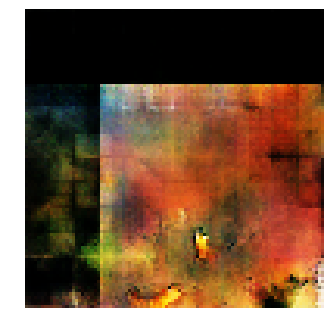


Epoch: 19840, D: -7.51, G: 2.459
Epoch: 19841, D: -5.42, G: 2.679
Epoch: 19842, D: -5.451, G: 4.112
Epoch: 19843, D: -6.885, G: 3.105
Epoch: 19844, D: -5.795, G: 3.419
Epoch: 19845, D: -5.476, G: 3.812
Epoch: 19846, D: -5.493, G: 4.931
Epoch: 19847, D: -5.283, G: 3.343
Epoch: 19848, D: -6.396, G: 3.314
Epoch: 19849, D: -4.971, G: 4.091
Epoch: 19850, D: -5.536, G: 6.293
Epoch: 19851, D: -5.521, G: 3.35
Epoch: 19852, D: -6.044, G: 4.669
Epoch: 19853, D: -6.188, G: 4.218
Epoch: 19854, D: -6.417, G: 3.391
Epoch: 19855, D: -5.814, G: 3.855
Epoch: 19856, D: -8.569, G: 4.569
Epoch: 19857, D: -6.467, G: 5.103
Epoch: 19858, D: -6.0, G: 1.197
Epoch: 19859, D: -5.946, G: 2.597


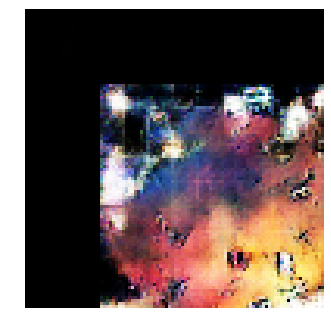


Epoch: 19860, D: -5.084, G: 3.299
Epoch: 19861, D: -5.508, G: 4.763
Epoch: 19862, D: -6.126, G: 1.568
Epoch: 19863, D: -7.549, G: 2.71
Epoch: 19864, D: -4.948, G: 5.289
Epoch: 19865, D: -5.365, G: 4.311
Epoch: 19866, D: -5.274, G: 3.796
Epoch: 19867, D: -5.966, G: 3.19
Epoch: 19868, D: -6.144, G: 2.348
Epoch: 19869, D: -5.904, G: 3.826
Epoch: 19870, D: -6.14, G: 2.634
Epoch: 19871, D: -6.827, G: 4.399
Epoch: 19872, D: -7.309, G: 4.767
Epoch: 19873, D: -5.38, G: 3.422
Epoch: 19874, D: -5.745, G: 3.317
Epoch: 19875, D: -6.904, G: 3.868
Epoch: 19876, D: -7.087, G: 3.436
Epoch: 19877, D: -5.011, G: 1.74
Epoch: 19878, D: -5.332, G: 3.219
Epoch: 19879, D: -4.802, G: 4.731


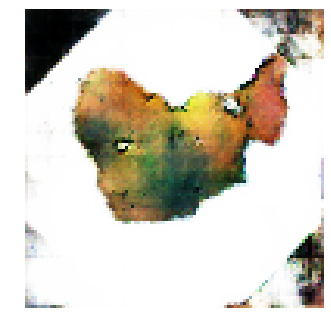


Epoch: 19880, D: -5.06, G: 4.544
Epoch: 19881, D: -5.085, G: 2.948
Epoch: 19882, D: -4.791, G: 4.02
Epoch: 19883, D: -6.956, G: 4.2
Epoch: 19884, D: -3.535, G: 2.537
Epoch: 19885, D: -6.139, G: 3.144
Epoch: 19886, D: -5.404, G: 4.375
Epoch: 19887, D: -6.133, G: 4.505
Epoch: 19888, D: -6.428, G: 7.184
Epoch: 19889, D: -6.905, G: 6.523
Epoch: 19890, D: -6.127, G: 0.1267
Epoch: 19891, D: -7.152, G: 2.609
Epoch: 19892, D: -6.122, G: 2.72
Epoch: 19893, D: -6.256, G: 1.89
Epoch: 19894, D: -6.157, G: 3.325
Epoch: 19895, D: -4.681, G: 2.609
Epoch: 19896, D: -5.695, G: 2.67
Epoch: 19897, D: -5.995, G: 4.733
Epoch: 19898, D: -4.892, G: 3.372
Epoch: 19899, D: -4.852, G: 1.475


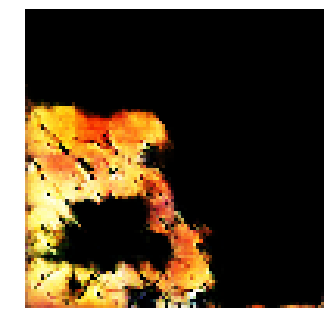


Epoch: 19900, D: -5.271, G: 4.705
Epoch: 19901, D: -5.8, G: 4.34
Epoch: 19902, D: -6.455, G: 5.229
Epoch: 19903, D: -4.961, G: 3.692
Epoch: 19904, D: -4.849, G: 5.497
Epoch: 19905, D: -6.04, G: 3.346
Epoch: 19906, D: -5.715, G: 4.295
Epoch: 19907, D: -5.896, G: 5.558
Epoch: 19908, D: -5.353, G: 4.173
Epoch: 19909, D: -6.102, G: 2.602
Epoch: 19910, D: -6.255, G: 4.906
Epoch: 19911, D: -5.628, G: 2.625
Epoch: 19912, D: -6.09, G: 3.947
Epoch: 19913, D: -5.644, G: 2.532
Epoch: 19914, D: -5.364, G: 4.608
Epoch: 19915, D: -5.643, G: 1.423
Epoch: 19916, D: -6.586, G: 2.266
Epoch: 19917, D: -6.687, G: 3.406
Epoch: 19918, D: -5.331, G: 2.666
Epoch: 19919, D: -6.125, G: 5.404


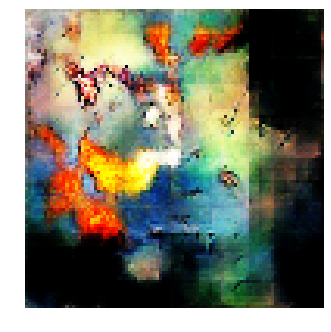


Epoch: 19920, D: -5.178, G: 4.093
Epoch: 19921, D: -7.839, G: 3.708
Epoch: 19922, D: -5.742, G: 4.985
Epoch: 19923, D: -5.281, G: 4.507
Epoch: 19924, D: -5.875, G: 1.471
Epoch: 19925, D: -6.797, G: 2.413
Epoch: 19926, D: -7.674, G: 4.05
Epoch: 19927, D: -6.919, G: 3.118
Epoch: 19928, D: -6.649, G: 4.85
Epoch: 19929, D: -5.378, G: 3.067
Epoch: 19930, D: -6.642, G: 5.115
Epoch: 19931, D: -4.661, G: 3.003
Epoch: 19932, D: -6.4, G: 2.559
Epoch: 19933, D: -6.991, G: 3.773
Epoch: 19934, D: -5.434, G: 4.102
Epoch: 19935, D: -6.156, G: 5.064
Epoch: 19936, D: -5.391, G: 1.812
Epoch: 19937, D: -6.559, G: 3.807
Epoch: 19938, D: -5.265, G: 2.173
Epoch: 19939, D: -6.86, G: 3.448


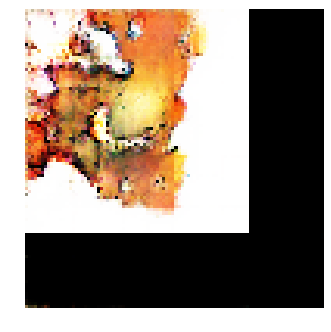


Epoch: 19940, D: -4.517, G: 3.26
Epoch: 19941, D: -5.508, G: 4.866
Epoch: 19942, D: -5.846, G: 4.342
Epoch: 19943, D: -6.219, G: 5.704
Epoch: 19944, D: -7.148, G: 4.021
Epoch: 19945, D: -5.111, G: 2.905
Epoch: 19946, D: -5.174, G: 3.124
Epoch: 19947, D: -5.675, G: 6.259
Epoch: 19948, D: -6.106, G: 4.898
Epoch: 19949, D: -6.106, G: 5.216
Epoch: 19950, D: -7.087, G: 3.547
Epoch: 19951, D: -5.553, G: 3.385
Epoch: 19952, D: -6.532, G: 4.939
Epoch: 19953, D: -5.858, G: 1.3
Epoch: 19954, D: -5.608, G: 4.256
Epoch: 19955, D: -5.635, G: 2.288
Epoch: 19956, D: -4.742, G: 3.384
Epoch: 19957, D: -6.57, G: 3.568
Epoch: 19958, D: -6.786, G: 4.185
Epoch: 19959, D: -6.577, G: 3.717


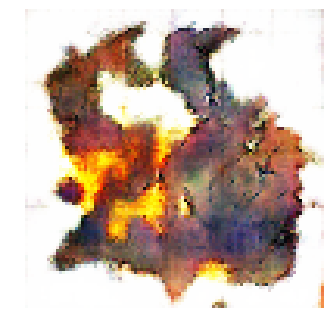


Epoch: 19960, D: -6.92, G: 4.515
Epoch: 19961, D: -6.337, G: 3.27
Epoch: 19962, D: -4.886, G: 5.833
Epoch: 19963, D: -6.748, G: 4.562
Epoch: 19964, D: -3.335, G: 3.141
Epoch: 19965, D: -5.788, G: 4.493
Epoch: 19966, D: -7.548, G: 3.42
Epoch: 19967, D: -4.715, G: 3.315
Epoch: 19968, D: -5.175, G: 3.346
Epoch: 19969, D: -6.427, G: 4.426
Epoch: 19970, D: -5.743, G: 3.646
Epoch: 19971, D: -6.525, G: 3.623
Epoch: 19972, D: -4.49, G: 1.612
Epoch: 19973, D: -6.574, G: 7.087
Epoch: 19974, D: -5.86, G: 4.353
Epoch: 19975, D: -6.075, G: 5.354
Epoch: 19976, D: -6.638, G: 4.427
Epoch: 19977, D: -5.466, G: 3.327
Epoch: 19978, D: -6.526, G: 4.131
Epoch: 19979, D: -4.176, G: 1.156


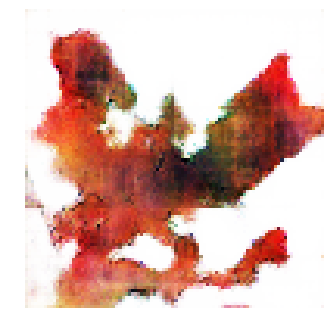


Epoch: 19980, D: -7.849, G: 4.121
Epoch: 19981, D: -5.458, G: 2.773
Epoch: 19982, D: -6.027, G: 6.161
Epoch: 19983, D: -5.799, G: 5.721
Epoch: 19984, D: -5.73, G: 3.702
Epoch: 19985, D: -5.472, G: 5.752
Epoch: 19986, D: -5.03, G: 3.948
Epoch: 19987, D: -6.542, G: 4.502
Epoch: 19988, D: -6.065, G: 3.924
Epoch: 19989, D: -4.989, G: 3.959
Epoch: 19990, D: -4.937, G: 5.337
Epoch: 19991, D: -6.565, G: 1.274
Epoch: 19992, D: -4.777, G: 2.298
Epoch: 19993, D: -5.29, G: 3.265
Epoch: 19994, D: -6.95, G: 4.534
Epoch: 19995, D: -6.746, G: 3.205
Epoch: 19996, D: -5.104, G: 4.81
Epoch: 19997, D: -6.021, G: 3.059
Epoch: 19998, D: -4.935, G: 4.37
Epoch: 19999, D: -7.311, G: 3.517


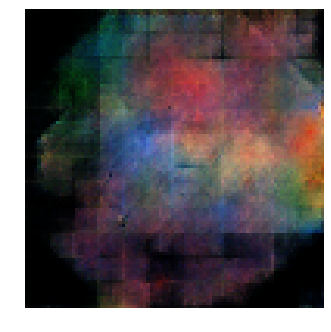


Epoch: 20000, D: -5.679, G: 2.02
Epoch: 20001, D: -6.038, G: 3.575
Epoch: 20002, D: -6.337, G: 0.5678
Epoch: 20003, D: -6.304, G: 3.786
Epoch: 20004, D: -4.944, G: 1.586
Epoch: 20005, D: -5.545, G: 4.134
Epoch: 20006, D: -6.377, G: 4.392
Epoch: 20007, D: -6.504, G: 2.315
Epoch: 20008, D: -5.867, G: 3.491
Epoch: 20009, D: -5.24, G: 3.881
Epoch: 20010, D: -7.353, G: 2.204
Epoch: 20011, D: -5.264, G: 4.812
Epoch: 20012, D: -6.365, G: 3.987
Epoch: 20013, D: -5.833, G: 4.617
Epoch: 20014, D: -5.901, G: 1.584
Epoch: 20015, D: -5.46, G: 3.324
Epoch: 20016, D: -6.01, G: 3.699
Epoch: 20017, D: -7.15, G: 3.819
Epoch: 20018, D: -5.996, G: 5.591
Epoch: 20019, D: -5.24, G: 3.828


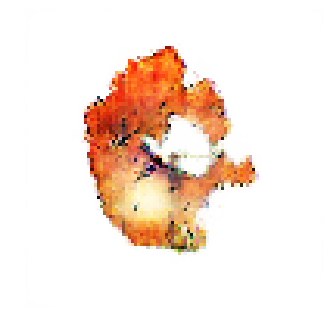


Epoch: 20020, D: -5.319, G: 2.015
Epoch: 20021, D: -5.008, G: 2.147
Epoch: 20022, D: -6.359, G: 2.216
Epoch: 20023, D: -6.913, G: 3.55
Epoch: 20024, D: -6.359, G: 3.124
Epoch: 20025, D: -5.312, G: 3.256
Epoch: 20026, D: -4.352, G: 4.105
Epoch: 20027, D: -5.831, G: 5.21
Epoch: 20028, D: -6.015, G: 3.568
Epoch: 20029, D: -7.911, G: 5.186
Epoch: 20030, D: -4.411, G: 1.428
Epoch: 20031, D: -5.267, G: 3.958
Epoch: 20032, D: -4.581, G: 4.519
Epoch: 20033, D: -6.813, G: 3.774
Epoch: 20034, D: -6.041, G: 4.464
Epoch: 20035, D: -5.431, G: 3.52
Epoch: 20036, D: -6.291, G: 6.09
Epoch: 20037, D: -6.094, G: 4.398
Epoch: 20038, D: -5.516, G: 5.729
Epoch: 20039, D: -5.586, G: 3.351


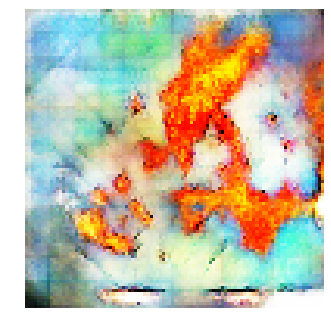


Epoch: 20040, D: -5.66, G: 2.673
Epoch: 20041, D: -4.903, G: 0.9515
Epoch: 20042, D: -7.267, G: 2.172
Epoch: 20043, D: -5.667, G: 3.03
Epoch: 20044, D: -5.183, G: 4.205
Epoch: 20045, D: -5.491, G: 4.397
Epoch: 20046, D: -5.499, G: 4.205
Epoch: 20047, D: -7.588, G: 5.623
Epoch: 20048, D: -4.951, G: 5.411
Epoch: 20049, D: -5.183, G: 5.144
Epoch: 20050, D: -5.384, G: 0.7294
Epoch: 20051, D: -6.745, G: 3.288
Epoch: 20052, D: -5.826, G: 2.627
Epoch: 20053, D: -6.549, G: 4.055
Epoch: 20054, D: -5.823, G: 2.993
Epoch: 20055, D: -5.275, G: 5.274
Epoch: 20056, D: -5.289, G: 3.199
Epoch: 20057, D: -6.399, G: 2.132
Epoch: 20058, D: -5.462, G: 3.941
Epoch: 20059, D: -6.307, G: 4.021


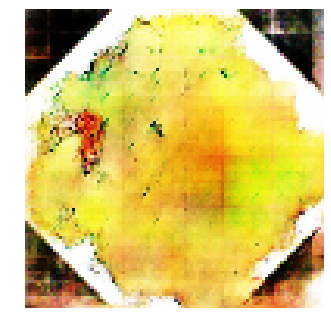


Epoch: 20060, D: -4.601, G: 4.542
Epoch: 20061, D: -6.148, G: 4.099
Epoch: 20062, D: -7.151, G: 4.463
Epoch: 20063, D: -5.271, G: 3.155
Epoch: 20064, D: -5.338, G: 4.723
Epoch: 20065, D: -7.38, G: 3.029
Epoch: 20066, D: -6.519, G: 1.695
Epoch: 20067, D: -5.522, G: -0.1039
Epoch: 20068, D: -5.45, G: 3.499
Epoch: 20069, D: -4.808, G: 3.032
Epoch: 20070, D: -5.794, G: 2.231
Epoch: 20071, D: -5.259, G: 3.671
Epoch: 20072, D: -5.687, G: 4.405
Epoch: 20073, D: -6.124, G: 5.79
Epoch: 20074, D: -6.993, G: 5.564
Epoch: 20075, D: -5.962, G: 3.08
Epoch: 20076, D: -5.783, G: 3.672
Epoch: 20077, D: -5.652, G: 6.566
Epoch: 20078, D: -6.38, G: 3.734
Epoch: 20079, D: -5.159, G: 4.454


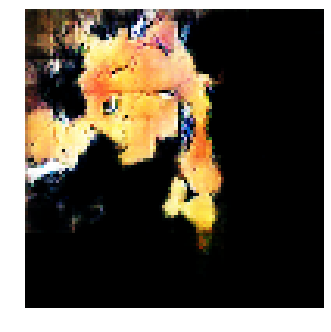


Epoch: 20080, D: -6.716, G: 4.85
Epoch: 20081, D: -4.273, G: 3.889
Epoch: 20082, D: -4.811, G: 5.689
Epoch: 20083, D: -6.207, G: 4.24
Epoch: 20084, D: -4.654, G: 3.86
Epoch: 20085, D: -5.725, G: 4.696
Epoch: 20086, D: -4.603, G: 4.122
Epoch: 20087, D: -7.066, G: 3.832
Epoch: 20088, D: -6.307, G: 3.809
Epoch: 20089, D: -5.158, G: 3.211
Epoch: 20090, D: -6.755, G: 3.545
Epoch: 20091, D: -7.316, G: 3.838
Epoch: 20092, D: -6.534, G: 5.081
Epoch: 20093, D: -4.851, G: 4.099
Epoch: 20094, D: -5.501, G: 5.176
Epoch: 20095, D: -5.283, G: 4.583
Epoch: 20096, D: -4.584, G: 3.246
Epoch: 20097, D: -6.02, G: 3.262
Epoch: 20098, D: -6.684, G: 3.801
Epoch: 20099, D: -6.035, G: 4.79


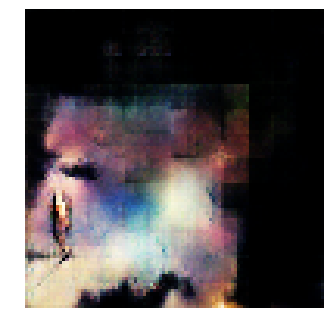


Epoch: 20100, D: -6.89, G: 3.131
Epoch: 20101, D: -5.546, G: 4.167
Epoch: 20102, D: -4.748, G: 3.102
Epoch: 20103, D: -7.05, G: 3.017
Epoch: 20104, D: -6.052, G: 2.371
Epoch: 20105, D: -4.918, G: 4.811
Epoch: 20106, D: -5.157, G: 4.617
Epoch: 20107, D: -5.58, G: 5.132
Epoch: 20108, D: -5.512, G: 4.131
Epoch: 20109, D: -6.847, G: 5.328
Epoch: 20110, D: -6.02, G: 2.938
Epoch: 20111, D: -5.294, G: 3.077
Epoch: 20112, D: -4.887, G: 2.943
Epoch: 20113, D: -5.982, G: 1.027
Epoch: 20114, D: -6.217, G: 2.765
Epoch: 20115, D: -6.182, G: 5.137
Epoch: 20116, D: -6.536, G: 4.236
Epoch: 20117, D: -7.45, G: 4.578
Epoch: 20118, D: -5.25, G: 1.469
Epoch: 20119, D: -6.907, G: 3.526


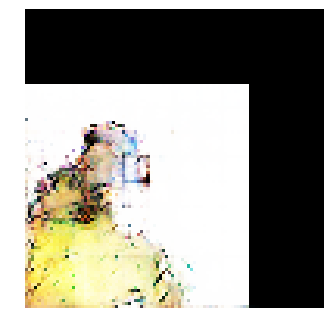


Epoch: 20120, D: -5.95, G: 1.972
Epoch: 20121, D: -6.374, G: 3.109
Epoch: 20122, D: -5.603, G: 5.025
Epoch: 20123, D: -5.234, G: 3.591
Epoch: 20124, D: -5.227, G: 6.004
Epoch: 20125, D: -5.92, G: 5.563
Epoch: 20126, D: -5.459, G: 4.951
Epoch: 20127, D: -6.734, G: 3.102
Epoch: 20128, D: -5.442, G: 3.469
Epoch: 20129, D: -6.231, G: 4.075
Epoch: 20130, D: -6.085, G: 3.54
Epoch: 20131, D: -6.957, G: 2.349
Epoch: 20132, D: -6.956, G: 4.022
Epoch: 20133, D: -4.876, G: 3.632
Epoch: 20134, D: -5.974, G: 3.622
Epoch: 20135, D: -6.197, G: 4.252
Epoch: 20136, D: -4.76, G: 2.323
Epoch: 20137, D: -4.721, G: 2.542
Epoch: 20138, D: -5.702, G: 4.031
Epoch: 20139, D: -6.209, G: 2.86


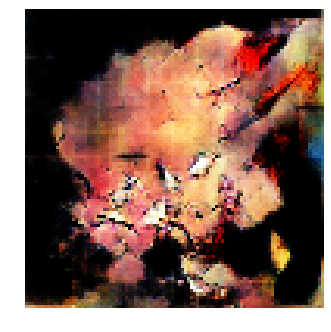


Epoch: 20140, D: -4.902, G: 2.612
Epoch: 20141, D: -6.265, G: 4.89
Epoch: 20142, D: -6.657, G: 3.684
Epoch: 20143, D: -5.302, G: 2.61
Epoch: 20144, D: -6.317, G: 4.328
Epoch: 20145, D: -6.092, G: 4.502
Epoch: 20146, D: -6.848, G: 4.151
Epoch: 20147, D: -7.335, G: 3.635
Epoch: 20148, D: -5.179, G: 2.966
Epoch: 20149, D: -6.318, G: 5.829
Epoch: 20150, D: -5.62, G: 3.402
Epoch: 20151, D: -5.75, G: 3.502
Epoch: 20152, D: -5.986, G: 5.074
Epoch: 20153, D: -5.311, G: 3.802
Epoch: 20154, D: -6.489, G: 5.719
Epoch: 20155, D: -6.671, G: 2.167
Epoch: 20156, D: -6.643, G: 4.426
Epoch: 20157, D: -5.692, G: 4.547
Epoch: 20158, D: -5.191, G: 3.386
Epoch: 20159, D: -6.6, G: 4.292


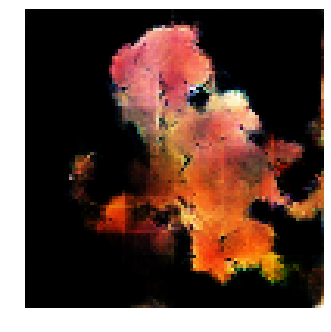


Epoch: 20160, D: -4.983, G: 2.704
Epoch: 20161, D: -5.382, G: 3.109
Epoch: 20162, D: -6.308, G: 5.577
Epoch: 20163, D: -4.594, G: 1.711
Epoch: 20164, D: -5.579, G: 4.54
Epoch: 20165, D: -5.891, G: 5.148
Epoch: 20166, D: -6.116, G: 3.185
Epoch: 20167, D: -6.359, G: 4.082
Epoch: 20168, D: -4.751, G: 3.781
Epoch: 20169, D: -6.553, G: 7.948
Epoch: 20170, D: -5.537, G: 4.847
Epoch: 20171, D: -6.153, G: 3.166
Epoch: 20172, D: -5.813, G: 4.05
Epoch: 20173, D: -5.545, G: 3.978
Epoch: 20174, D: -5.489, G: 3.453
Epoch: 20175, D: -6.992, G: 4.282
Epoch: 20176, D: -5.89, G: 2.014
Epoch: 20177, D: -6.51, G: 5.589
Epoch: 20178, D: -6.955, G: 4.423
Epoch: 20179, D: -5.572, G: 2.675


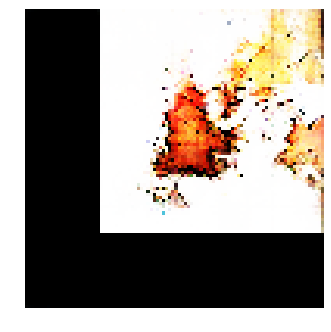


Epoch: 20180, D: -5.592, G: 4.371
Epoch: 20181, D: -5.755, G: 1.699
Epoch: 20182, D: -7.819, G: 6.034
Epoch: 20183, D: -6.347, G: 3.579
Epoch: 20184, D: -5.947, G: 4.134
Epoch: 20185, D: -4.497, G: 5.235
Epoch: 20186, D: -5.628, G: 3.834
Epoch: 20187, D: -6.661, G: 4.065
Epoch: 20188, D: -6.079, G: 3.563
Epoch: 20189, D: -5.985, G: 2.513
Epoch: 20190, D: -5.72, G: 4.062
Epoch: 20191, D: -5.619, G: 5.465
Epoch: 20192, D: -7.306, G: 4.167
Epoch: 20193, D: -5.213, G: 2.798
Epoch: 20194, D: -6.212, G: 4.706
Epoch: 20195, D: -6.018, G: 3.412
Epoch: 20196, D: -6.095, G: 3.185
Epoch: 20197, D: -5.945, G: 2.417
Epoch: 20198, D: -6.579, G: 3.911
Epoch: 20199, D: -6.116, G: 3.756


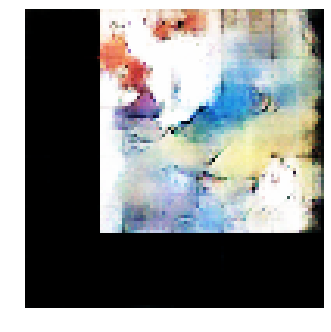


Epoch: 20200, D: -5.645, G: 3.421
Epoch: 20201, D: -6.38, G: 3.145
Epoch: 20202, D: -5.118, G: 3.479
Epoch: 20203, D: -6.288, G: 1.756
Epoch: 20204, D: -6.086, G: 5.773
Epoch: 20205, D: -5.321, G: 4.183
Epoch: 20206, D: -5.49, G: 3.041
Epoch: 20207, D: -6.144, G: 6.093
Epoch: 20208, D: -5.093, G: 4.405
Epoch: 20209, D: -5.925, G: 3.718
Epoch: 20210, D: -6.519, G: 2.207
Epoch: 20211, D: -7.448, G: 2.443
Epoch: 20212, D: -6.942, G: 3.218
Epoch: 20213, D: -6.051, G: 4.271
Epoch: 20214, D: -6.342, G: 2.451
Epoch: 20215, D: -5.911, G: 4.449
Epoch: 20216, D: -6.172, G: 2.645
Epoch: 20217, D: -6.723, G: 5.994
Epoch: 20218, D: -5.394, G: 4.057
Epoch: 20219, D: -6.049, G: 2.923


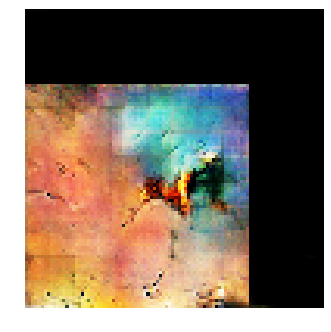


Epoch: 20220, D: -5.9, G: 3.167
Epoch: 20221, D: -5.305, G: 4.071
Epoch: 20222, D: -6.478, G: 6.66
Epoch: 20223, D: -6.157, G: 2.293
Epoch: 20224, D: -5.85, G: 4.12
Epoch: 20225, D: -6.687, G: 5.455
Epoch: 20226, D: -6.402, G: 3.929
Epoch: 20227, D: -4.621, G: 4.06
Epoch: 20228, D: -5.506, G: 4.138
Epoch: 20229, D: -6.034, G: 2.73
Epoch: 20230, D: -6.593, G: 4.608
Epoch: 20231, D: -7.167, G: 5.086
Epoch: 20232, D: -6.808, G: 4.829
Epoch: 20233, D: -4.923, G: 2.679
Epoch: 20234, D: -5.039, G: 4.105
Epoch: 20235, D: -6.68, G: 3.104
Epoch: 20236, D: -5.652, G: 2.041
Epoch: 20237, D: -6.511, G: 3.074
Epoch: 20238, D: -5.202, G: 3.08
Epoch: 20239, D: -6.675, G: 4.628


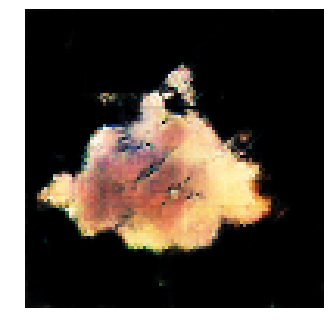


Epoch: 20240, D: -5.51, G: 4.376
Epoch: 20241, D: -6.439, G: 4.35
Epoch: 20242, D: -5.964, G: 2.229
Epoch: 20243, D: -6.534, G: 3.539
Epoch: 20244, D: -7.165, G: 2.833
Epoch: 20245, D: -6.384, G: 3.17
Epoch: 20246, D: -6.862, G: 5.509
Epoch: 20247, D: -5.377, G: 2.176
Epoch: 20248, D: -7.162, G: 3.937
Epoch: 20249, D: -8.099, G: 1.673
Epoch: 20250, D: -5.857, G: 3.621
Epoch: 20251, D: -5.609, G: 2.646
Epoch: 20252, D: -6.684, G: 2.39
Epoch: 20253, D: -6.314, G: 3.984
Epoch: 20254, D: -5.004, G: 3.749
Epoch: 20255, D: -6.091, G: 4.271
Epoch: 20256, D: -6.905, G: 4.877
Epoch: 20257, D: -5.944, G: 2.79
Epoch: 20258, D: -6.076, G: 2.866
Epoch: 20259, D: -4.527, G: 3.214


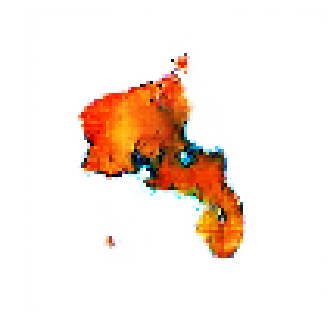


Epoch: 20260, D: -6.634, G: 5.146
Epoch: 20261, D: -5.574, G: 1.872
Epoch: 20262, D: -6.551, G: 4.29
Epoch: 20263, D: -4.444, G: 3.45
Epoch: 20264, D: -6.692, G: 1.643
Epoch: 20265, D: -5.94, G: 2.748
Epoch: 20266, D: -4.85, G: 0.9232
Epoch: 20267, D: -6.367, G: 3.99
Epoch: 20268, D: -5.04, G: 3.233
Epoch: 20269, D: -8.014, G: 3.606
Epoch: 20270, D: -6.528, G: 1.658
Epoch: 20271, D: -6.035, G: 1.114
Epoch: 20272, D: -5.194, G: 3.777
Epoch: 20273, D: -5.385, G: 3.743
Epoch: 20274, D: -5.548, G: 4.368
Epoch: 20275, D: -5.231, G: 4.7
Epoch: 20276, D: -5.333, G: 4.248
Epoch: 20277, D: -5.066, G: 2.578
Epoch: 20278, D: -6.36, G: 2.196
Epoch: 20279, D: -5.236, G: 1.704


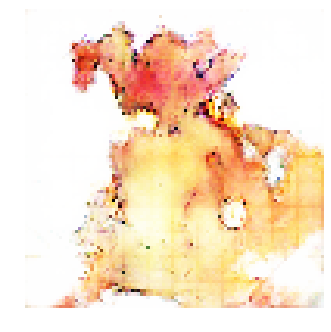


Epoch: 20280, D: -5.996, G: 3.376
Epoch: 20281, D: -6.266, G: 2.546
Epoch: 20282, D: -6.457, G: 4.47
Epoch: 20283, D: -5.26, G: 2.035
Epoch: 20284, D: -7.603, G: 2.651
Epoch: 20285, D: -5.864, G: 3.893
Epoch: 20286, D: -5.421, G: 2.508
Epoch: 20287, D: -4.763, G: 2.676
Epoch: 20288, D: -5.721, G: 3.752
Epoch: 20289, D: -6.17, G: 2.843
Epoch: 20290, D: -7.013, G: 2.429
Epoch: 20291, D: -5.631, G: 3.296
Epoch: 20292, D: -6.023, G: 4.846
Epoch: 20293, D: -5.17, G: 2.892
Epoch: 20294, D: -6.288, G: 2.369
Epoch: 20295, D: -6.654, G: 3.389
Epoch: 20296, D: -5.774, G: 3.276
Epoch: 20297, D: -6.666, G: 6.524
Epoch: 20298, D: -6.488, G: 5.383
Epoch: 20299, D: -5.518, G: 3.799


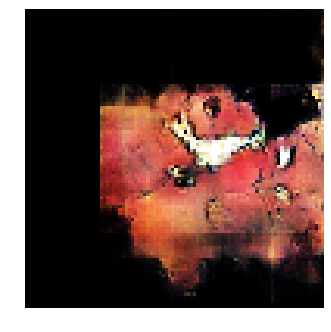


Epoch: 20300, D: -6.771, G: 4.163
Epoch: 20301, D: -6.241, G: 3.793
Epoch: 20302, D: -5.54, G: 2.563
Epoch: 20303, D: -5.989, G: 3.469
Epoch: 20304, D: -7.225, G: 1.321
Epoch: 20305, D: -7.651, G: 4.078
Epoch: 20306, D: -6.267, G: 2.824
Epoch: 20307, D: -6.26, G: 3.389
Epoch: 20308, D: -5.749, G: 3.156
Epoch: 20309, D: -4.548, G: 3.312
Epoch: 20310, D: -7.18, G: 3.805
Epoch: 20311, D: -5.948, G: 2.036
Epoch: 20312, D: -5.746, G: 2.341
Epoch: 20313, D: -6.371, G: 2.326
Epoch: 20314, D: -5.298, G: 2.968
Epoch: 20315, D: -7.01, G: 3.277
Epoch: 20316, D: -7.133, G: 4.421
Epoch: 20317, D: -5.905, G: 3.846
Epoch: 20318, D: -6.105, G: 1.399
Epoch: 20319, D: -5.608, G: 3.377


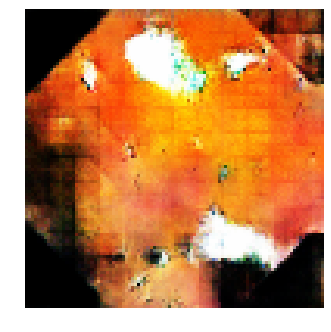


Epoch: 20320, D: -6.076, G: 2.969
Epoch: 20321, D: -6.137, G: 1.661
Epoch: 20322, D: -6.677, G: 5.014
Epoch: 20323, D: -5.958, G: 6.371
Epoch: 20324, D: -5.606, G: 2.706
Epoch: 20325, D: -5.768, G: 5.282
Epoch: 20326, D: -4.952, G: 3.465
Epoch: 20327, D: -6.257, G: 3.701
Epoch: 20328, D: -6.027, G: 1.527
Epoch: 20329, D: -5.336, G: 3.751
Epoch: 20330, D: -5.571, G: 4.475
Epoch: 20331, D: -6.277, G: 3.84
Epoch: 20332, D: -6.271, G: 2.619
Epoch: 20333, D: -5.997, G: 3.64
Epoch: 20334, D: -6.242, G: 4.184
Epoch: 20335, D: -6.574, G: 5.152
Epoch: 20336, D: -4.693, G: 4.583
Epoch: 20337, D: -5.452, G: 2.868
Epoch: 20338, D: -5.366, G: 2.567
Epoch: 20339, D: -7.888, G: 2.913


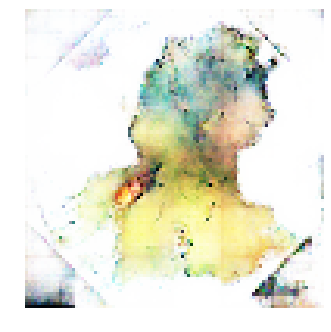


Epoch: 20340, D: -5.686, G: 5.476
Epoch: 20341, D: -5.686, G: 4.54
Epoch: 20342, D: -6.206, G: 3.958
Epoch: 20343, D: -6.075, G: 3.334
Epoch: 20344, D: -6.679, G: 1.761
Epoch: 20345, D: -6.303, G: 3.964
Epoch: 20346, D: -6.14, G: 3.941
Epoch: 20347, D: -6.473, G: 2.371
Epoch: 20348, D: -5.058, G: 4.394
Epoch: 20349, D: -6.332, G: 5.133
Epoch: 20350, D: -6.123, G: 3.669
Epoch: 20351, D: -5.417, G: 3.985
Epoch: 20352, D: -5.67, G: 4.875
Epoch: 20353, D: -7.318, G: 3.764
Epoch: 20354, D: -5.138, G: 3.399
Epoch: 20355, D: -6.173, G: 5.309
Epoch: 20356, D: -5.125, G: 2.333
Epoch: 20357, D: -6.055, G: 2.798
Epoch: 20358, D: -7.693, G: 2.237
Epoch: 20359, D: -6.476, G: 3.724


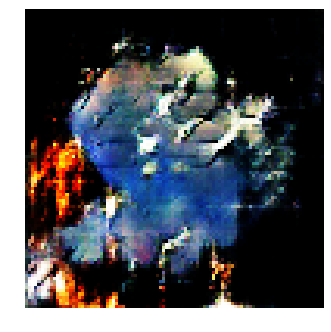


Epoch: 20360, D: -5.684, G: 2.367
Epoch: 20361, D: -6.193, G: 4.573
Epoch: 20362, D: -5.634, G: 2.303
Epoch: 20363, D: -6.658, G: 3.815
Epoch: 20364, D: -6.382, G: 1.446
Epoch: 20365, D: -6.54, G: 2.46
Epoch: 20366, D: -6.607, G: 4.668
Epoch: 20367, D: -5.432, G: 3.877
Epoch: 20368, D: -7.007, G: 1.86
Epoch: 20369, D: -5.889, G: 4.429
Epoch: 20370, D: -5.238, G: 2.173
Epoch: 20371, D: -8.491, G: 3.416
Epoch: 20372, D: -6.502, G: 1.699
Epoch: 20373, D: -5.292, G: 3.014
Epoch: 20374, D: -7.112, G: 2.6
Epoch: 20375, D: -6.274, G: 4.823
Epoch: 20376, D: -5.964, G: 3.614
Epoch: 20377, D: -7.008, G: 3.079
Epoch: 20378, D: -4.921, G: 3.505
Epoch: 20379, D: -6.28, G: 2.956


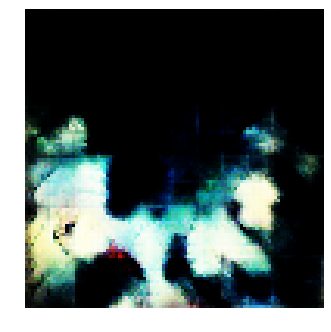


Epoch: 20380, D: -5.145, G: 4.77
Epoch: 20381, D: -5.471, G: 4.392
Epoch: 20382, D: -5.615, G: 1.8
Epoch: 20383, D: -7.132, G: 4.147
Epoch: 20384, D: -6.148, G: 4.276
Epoch: 20385, D: -5.305, G: 2.597
Epoch: 20386, D: -5.177, G: 5.337
Epoch: 20387, D: -5.516, G: 1.798
Epoch: 20388, D: -5.323, G: 5.345
Epoch: 20389, D: -6.667, G: 3.127
Epoch: 20390, D: -5.858, G: 4.076
Epoch: 20391, D: -7.226, G: 3.353
Epoch: 20392, D: -7.393, G: 3.229
Epoch: 20393, D: -4.696, G: 4.774
Epoch: 20394, D: -6.589, G: 3.915
Epoch: 20395, D: -5.877, G: 5.748
Epoch: 20396, D: -5.741, G: 4.326
Epoch: 20397, D: -5.673, G: 5.063
Epoch: 20398, D: -6.01, G: 4.268
Epoch: 20399, D: -4.972, G: 4.039


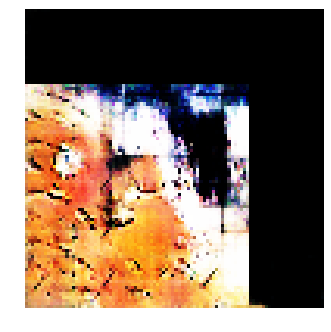


Epoch: 20400, D: -6.431, G: 3.558
Epoch: 20401, D: -5.827, G: 2.765
Epoch: 20402, D: -5.689, G: 4.354
Epoch: 20403, D: -6.922, G: 2.7
Epoch: 20404, D: -6.31, G: 5.37
Epoch: 20405, D: -7.018, G: 2.044
Epoch: 20406, D: -5.618, G: 1.497
Epoch: 20407, D: -5.547, G: 0.6913
Epoch: 20408, D: -6.619, G: 3.1
Epoch: 20409, D: -4.98, G: 3.969
Epoch: 20410, D: -5.972, G: 3.082
Epoch: 20411, D: -6.598, G: 4.123
Epoch: 20412, D: -6.768, G: 3.128
Epoch: 20413, D: -4.793, G: 4.76
Epoch: 20414, D: -5.7, G: 5.399
Epoch: 20415, D: -6.021, G: 4.004
Epoch: 20416, D: -6.31, G: 2.77
Epoch: 20417, D: -7.741, G: 3.324
Epoch: 20418, D: -5.521, G: 1.797
Epoch: 20419, D: -6.638, G: 1.586


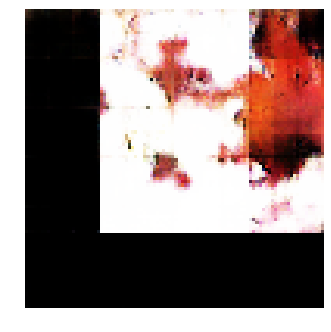


Epoch: 20420, D: -6.069, G: 3.069
Epoch: 20421, D: -5.641, G: 5.904
Epoch: 20422, D: -5.259, G: 2.586
Epoch: 20423, D: -5.493, G: 2.639
Epoch: 20424, D: -5.369, G: 2.468
Epoch: 20425, D: -6.679, G: 2.777
Epoch: 20426, D: -6.039, G: 1.857
Epoch: 20427, D: -7.422, G: 4.109
Epoch: 20428, D: -6.486, G: 1.714
Epoch: 20429, D: -4.626, G: 4.597
Epoch: 20430, D: -5.482, G: 3.906
Epoch: 20431, D: -6.109, G: 4.695
Epoch: 20432, D: -6.726, G: 1.454
Epoch: 20433, D: -7.068, G: 4.38
Epoch: 20434, D: -6.375, G: 2.893
Epoch: 20435, D: -5.955, G: 3.38
Epoch: 20436, D: -6.093, G: 4.325
Epoch: 20437, D: -5.923, G: 5.518
Epoch: 20438, D: -5.936, G: 2.936
Epoch: 20439, D: -6.595, G: 5.643


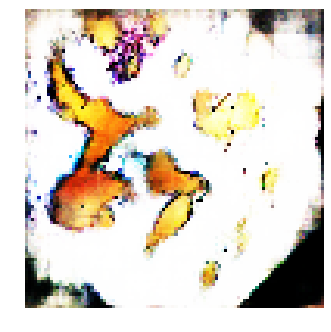


Epoch: 20440, D: -6.642, G: 4.706
Epoch: 20441, D: -6.483, G: 2.959
Epoch: 20442, D: -5.607, G: 2.654
Epoch: 20443, D: -5.317, G: 3.825
Epoch: 20444, D: -5.867, G: 5.145
Epoch: 20445, D: -6.434, G: 3.574
Epoch: 20446, D: -6.163, G: 2.484
Epoch: 20447, D: -3.876, G: 3.318
Epoch: 20448, D: -6.526, G: 2.59
Epoch: 20449, D: -6.115, G: 1.289
Epoch: 20450, D: -5.88, G: 5.337
Epoch: 20451, D: -5.8, G: 3.766
Epoch: 20452, D: -5.613, G: 6.144
Epoch: 20453, D: -5.513, G: 2.643
Epoch: 20454, D: -5.938, G: 3.428
Epoch: 20455, D: -6.276, G: 3.822
Epoch: 20456, D: -5.925, G: 1.606
Epoch: 20457, D: -7.002, G: 2.574
Epoch: 20458, D: -6.996, G: 3.872
Epoch: 20459, D: -5.96, G: 6.01


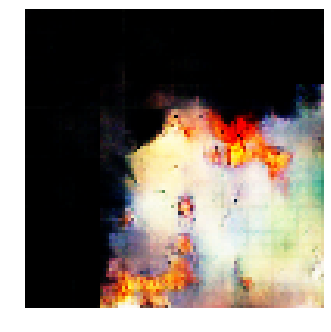


Epoch: 20460, D: -5.135, G: 3.035
Epoch: 20461, D: -5.911, G: 3.976
Epoch: 20462, D: -5.739, G: 3.258
Epoch: 20463, D: -6.51, G: 4.835
Epoch: 20464, D: -7.821, G: 4.569
Epoch: 20465, D: -7.089, G: 3.013
Epoch: 20466, D: -5.554, G: 6.654
Epoch: 20467, D: -5.656, G: 5.547
Epoch: 20468, D: -7.506, G: 4.29
Epoch: 20469, D: -7.134, G: 3.773
Epoch: 20470, D: -6.094, G: 3.753
Epoch: 20471, D: -5.966, G: 3.302
Epoch: 20472, D: -6.233, G: 2.73
Epoch: 20473, D: -5.457, G: 3.316
Epoch: 20474, D: -5.657, G: 3.406
Epoch: 20475, D: -4.739, G: 4.54
Epoch: 20476, D: -5.818, G: 3.102
Epoch: 20477, D: -6.563, G: 4.667
Epoch: 20478, D: -5.046, G: 3.126
Epoch: 20479, D: -7.273, G: 3.432


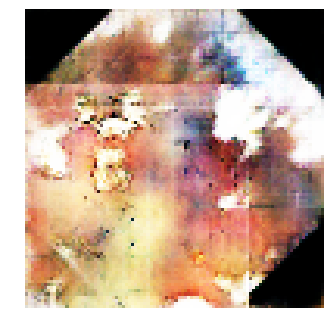


Epoch: 20480, D: -5.63, G: 3.831
Epoch: 20481, D: -3.621, G: 3.356
Epoch: 20482, D: -6.443, G: 3.315
Epoch: 20483, D: -5.978, G: 2.639
Epoch: 20484, D: -6.545, G: 4.573
Epoch: 20485, D: -5.275, G: 4.183
Epoch: 20486, D: -6.254, G: 3.37
Epoch: 20487, D: -6.714, G: 2.698
Epoch: 20488, D: -5.423, G: 2.839
Epoch: 20489, D: -5.63, G: 4.293
Epoch: 20490, D: -6.125, G: 3.935
Epoch: 20491, D: -6.25, G: 1.261
Epoch: 20492, D: -7.174, G: 2.992
Epoch: 20493, D: -7.587, G: 3.972
Epoch: 20494, D: -4.266, G: 3.647
Epoch: 20495, D: -5.669, G: 3.66
Epoch: 20496, D: -6.132, G: 6.412
Epoch: 20497, D: -5.394, G: 4.876
Epoch: 20498, D: -6.752, G: 5.4
Epoch: 20499, D: -6.281, G: 1.963


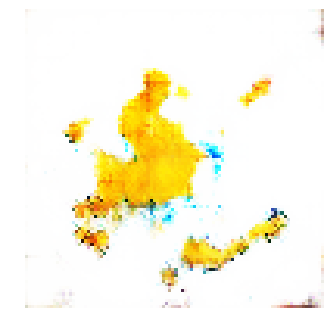


Epoch: 20500, D: -5.556, G: 2.484
Epoch: 20501, D: -5.524, G: 2.894
Epoch: 20502, D: -4.984, G: 2.845
Epoch: 20503, D: -6.781, G: 4.298
Epoch: 20504, D: -5.112, G: 1.179
Epoch: 20505, D: -6.041, G: 3.616
Epoch: 20506, D: -6.665, G: 5.048
Epoch: 20507, D: -5.976, G: 5.267
Epoch: 20508, D: -5.282, G: 3.349
Epoch: 20509, D: -4.458, G: 3.47


In [0]:
#with tf.Session() as sess:
sess = tf.Session()
saver = tf.train.Saver()
#sess.run(tf.global_variables_initializer())
#print('Initialization done!')


#Test saving and loading
#save_path = saver.save(sess, 'drive/Pokemon/Checkpoints/model.ckpt')
ckpt = tf.train.latest_checkpoint('drive/Pokemon_Fire/Final_Checkpoints')
print(ckpt)
saver.restore(sess,ckpt)
print('Restored!')

run_a_gan(sess,G_train_step,G_loss,D_train_step,D_loss,G_extra_step,D_extra_step,saver,num_epoch=12000)
 
save_inputs ={"isTrain":isTrain}
save_outputs = {"generator/generator_out":G_sample}

tf.saved_model.simple_save(sess, 'drive/Pokemon_Fire/Saved_model_Final',save_inputs,save_outputs)

In [0]:
save_inputs ={"isTrain":isTrain}
save_outputs = {"generator/generator_out":G_sample}

tf.saved_model.simple_save(sess, 'drive/Pokemon/Saved_modelGP',save_inputs,save_outputs)

In [0]:
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
  process = psutil.Process(os.getpid())
  print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm()

Gen RAM Free: 10.4 GB  | Proc size: 5.2 GB
GPU RAM Free: 503MB | Used: 10936MB | Util  96% | Total 11439MB


In [0]:
!ps ax | grep python

   82 ?        Sl     0:10 /usr/bin/python2 /usr/local/bin/jupyter-notebook -y --no-browser --log-level=DEBUG --debug --NotebookApp.allow_origin="*" --NotebookApp.log_format="%(message)s" --NotebookApp.disable_check_xsrf=True --NotebookApp.token= --Session.key="" --Session.keyfile="" --ContentsManager.untitled_directory="Untitled Folder" --ContentsManager.untitled_file="Untitled File" --ContentsManager.untitled_notebook="Untitled Notebook" --KernelManager.autorestart=True --MultiKernelManager.default_kernel_name="python2" --ip="172.28.0.2" --port=9000 --port-retries=0 --notebook-dir="/content" --NotebookApp.base_url=/tun/m/gpu-1oh0mpcgklgqc/
   90 ?        Ssl  223:25 /usr/bin/python3 -m ipykernel_launcher -f /content/.local/share/jupyter/runtime/kernel-14d934e3-be51-46ed-9bdb-cf6fa1f8fa07.json
24021 ?        Ssl    0:10 /usr/bin/python3 -m ipykernel_launcher -f /content/.local/share/jupyter/runtime/kernel-bd5eb725-93eb-4089-b928-3dc6365a54c7.json
30723 pts/0    Ss+    0:00 /bin/sh -c 

In [0]:
!kill -9 90

In [0]:
#Clear everything
!kill -9 -1

In [0]:
sess.close()